In [38]:
import pandas as pd
import csv
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import os
import glob
import math
from collections import defaultdict, Counter
from sys import stdout
from time import time
import pickle

print("Packages successfully imported!!")

Packages successfully imported!!


# File Loaders

In [2]:
# load a file as a dataframe
def csv_files(loc, name):
    
    os.chdir(loc)
    pdx = pd.read_csv(name)
    os.chdir("..")
    
    # remove extra enumerated column
    return pdx.iloc[:, 1:]


# load a file as an numpy file
def npy_files(loc, name):
    
    os.chdir(loc)
    npx = np.load(name)
    os.chdir("..")
    
    return npx


# create a dictionary of required load functions
fload_dict = dict()
fload_dict['csv_files'] = csv_files
fload_dict['npy_files'] = npy_files


# dictionary creation and lookup functions
def lookup(cur_dict):
    
    keyset = list(cur_dict.keys())
    valset = list(cur_dict.values())
    
    # look into the dictionary
    '''for i in range(len(keyset)):
        print(keyset[i], ' ---> ', valset[i])'''
        
    return keyset, valset

# join up a dictionary
def join_dict(keyset, valset):
    
    new_dict = dict()
    for i in range(len(keyset)):
        new_dict[keyset[i]] = valset[i]
        
    return new_dict


# load the list of file names
def file_list(direc, ext):
    
    # gathering the files just in case
    list_files = []
        
    os.chdir(direc)
    print(os.getcwd())
    
    f_ext = "*." + ext
    for files in glob.glob(f_ext):
        list_files.append(files)
        
    os.chdir('..')
    print(list_files)
    print(os.getcwd())
    print("*****************\n")
    return list_files


# return dictionaries of file list
def file_dict(f_list, loc, f_type):
    
    # empty list to store each file_data
    f_store = []
    
    # deal with removing e
    # load each file_data
    for fn in f_list:
        # check the file extension
        loader = fload_dict[f_type]
        fi = loader(loc, fn)    
        f_store.append(fi)
        
    print("Num of files: ", len(f_list), "\nNum of files loaded: ", len(f_store))
    
    # dictionary to store file_names : file_data
    f_dict = join_dict(f_list, f_store)
        
    print("Dictionary compiled!!", len(f_dict.keys()))
    return f_dict


# load up the index from a csv file
def load_idx(fnames):
    
    import csv
    fvals = []
    os.chdir('mapping')
    
    for fname in fnames:
        with open(fname, 'rt') as f:
            cur_csv = csv.reader(f)
            idx = defaultdict(list)
            
            for line in cur_csv:
                for val in range(3, int(line[2])+3):

                    k1 = int(line[0])
                    k2 = int(line[1])
                    vv = int(line[val])

                    idx[k1, k2].append(vv)
                    
        print("File ", fname, " has been loaded")
        fvals.append(idx)

    os.chdir('..')
    
    fin_dict = join_dict(fnames, fvals)
    return fin_dict

In [14]:
# get the list of csv files for the dataframes
csv_files = file_list("pre_files", "csv")
# set up the dictionary of csv dataframe file names to file dataframe data
df_csv = file_dict(csv_files, "pre_files", "csv_files")

# get the list of npy files for each normalised array
npy_files = file_list("norm_files", "npy")
# set up the dictionary of npy numpy array file names to file numpy data
num_npy = file_dict(npy_files, "norm_files", "npy_files")

# load up the resultant mappings
map_files = file_list("mapping", "csv")
# setting up all the mappings
tr_map = load_idx(map_files)

C:\Users\sunny\Desktop\workspace0\neural_nets\research_S19\MTO_data_copy\phase_dt\phase_5\pre_files
['al.csv', 'hf.csv', 'mu.csv', 'te.csv']
C:\Users\sunny\Desktop\workspace0\neural_nets\research_S19\MTO_data_copy\phase_dt\phase_5
*****************

Num of files:  4 
Num of files loaded:  4
Dictionary compiled!! 4
C:\Users\sunny\Desktop\workspace0\neural_nets\research_S19\MTO_data_copy\phase_dt\phase_5\norm_files
['aln.npy', 'hfn.npy', 'mun.npy', 'ten.npy']
C:\Users\sunny\Desktop\workspace0\neural_nets\research_S19\MTO_data_copy\phase_dt\phase_5
*****************

Num of files:  4 
Num of files loaded:  4
Dictionary compiled!! 4
C:\Users\sunny\Desktop\workspace0\neural_nets\research_S19\MTO_data_copy\phase_dt\phase_5\mapping
['aln_re_id.csv', 'hfn_re_id.csv', 'mun_re_id.csv', 'ten_re_id.csv']
C:\Users\sunny\Desktop\workspace0\neural_nets\research_S19\MTO_data_copy\phase_dt\phase_5
*****************

File  aln_re_id.csv  has been loaded
File  hfn_re_id.csv  has been loaded
File  mun_re_

# Labeler

In [15]:
#### helper functions

# function to oberve and print shapes within each dictionary
def dict_shape(cur_dict):
    
    key = list(cur_dict.keys())
    for k in key:
        s = cur_dict[k].shape
        print("Shape of ", k, ": ", s)
    return

# function to find the number of junctions
def junc(pdx):
    # pdx: dataframe used to find out what label to apply
    
    junc_pts = []
    
    for i in range(pdx.shape[0]):
        # compare using the starting time
        start = pdx.iloc[0, 0]
        
        if pdx.iloc[i, 0] == start:
            junc_pts.append(i)
            
    junc_pts.append(pdx.shape[0])
    return junc_pts

In [22]:
def brake_lab(pdx, df_dict):
    # pdx: only uses dataframes type of data

    lab = np.zeros(pdx.shape[0], dtype='int').reshape(-1, 1)
    
    for i in range(pdx.shape[0]):
        if pdx['Brake pressure/Axle 1/Left'][i] > 0.01:
            lab[i] = 1
            
        else:
            lab[i] = 0
            
    print("Labels of 1D created based on left right acceleration...", lab.shape)
    return lab

## threshold used, not for detection ##
def speed_lab(pdx, df_dict):
    # pdx: only uses dataframes type of data

    lab = np.zeros(pdx.shape[0], dtype='int').reshape(-1, 1)
    
    for i in range(pdx.shape[0]):
        # above thresh - high speed
        if pdx['Tangential speed'][i] > 76:
            lab[i] = 1
        # below thresh - lesser than high
        else:
            lab[i] = 0
            
    print("Labels of 1D created based on left right acceleration...", lab.shape)
    return lab

## threshold used, not for detection ##
def froba_lab(pdx, df_dict):
    # pdx: only uses dataframes type of data

    lab = np.zeros(pdx.shape[0], dtype='int').reshape(-1, 1)
    
    for i in range(pdx.shape[0]):
        # forward motion
        if pdx['Tangent Acceleration/X'][i] > 0:
            lab[i] = 1
        # backward motion
        else:
            lab[i] = 0
            
    print("Labels of 1D created based on left right acceleration...", lab.shape)
    return lab

# function to return 0 as -ve and 1 as +ve for acceleration along y
def lefri_lab(pdx, df_dict):
    # pdx: only uses dataframes type of data
    
    lab = np.zeros(pdx.shape[0], dtype='int').reshape(-1, 1)
    
    for i in range(pdx.shape[0]):
        if pdx['Tangent Acceleration/Y'][i] > 0:
            # +ve direction
            lab[i] = 1
        else:
            # -ve direction
            lab[i] = 0
            
    print("Labels of 1D created based on braking...", lab.shape)
    return lab

# function to return 0 as -ve and 1 as +ve for acceleration along y
def topbot_lab(pdx, df_dict):
    # pdx: only uses dataframes type of data
    
    lab = np.zeros(pdx.shape[0], dtype='int').reshape(-1, 1)
    
    for i in range(pdx.shape[0]):
        if pdx['Tangent Acceleration/Z'][i] > 0:
            # top direction?
            lab[i] = 1
        else:
            # bottom direction?
            lab[i] = 0
            
    print("Labels of 1D created based on braking...", lab.shape)
    return lab

# function to return 0 as -ve and 1 as +ve for acceleration along y
def langap_lab(pdx, df_dict):
    # pdx: only uses dataframes type of data
    
    lab = np.zeros(pdx.shape[0], dtype='int').reshape(-1, 1)
    
    for i in range(pdx.shape[0]):
        if pdx['Lane gap'][i] > 0.077:
            # +ve lane gap?
            lab[i] = 1
        else:
            # -ve lane gap?
            lab[i] = 0
            
    print("Labels of 1D created based on braking...", lab.shape)
    return lab

# function to segment data into parts
def seg_lab(pdx, df_dict):
    # data: any whole set of data
    # label: only !!driver!! label
    
    
    # Step 1: initialise all required variables
    low = 0
    # initialise a label array to return
    new_lab = np.zeros(pdx.shape[0], dtype='int').reshape(-1, 1)
    # initialise number of segments (including 0, so 0 to 4)
    segments = 5
    # initialise segment array
    seg_arr = np.arange(segments, dtype='int')
    print(type(seg_arr[0]))
    
    # initialise points of driver split
    splits = junc(pdx)
    print("The splits are at: ", splits)
    
    
    # Step 3: segment data into partitions by individual driver
    # pick out each single driver
    for i in range(len(splits) - 1):
        start = splits[i]
        end = splits[i + 1]
        tot_pts = end - start
        limit = int(tot_pts / (segments)) # number of segments
        up = low
        no = 0
        print("Start: ", start, " End: ", end, " Pts in b/w: ", tot_pts, "Pts per seg: ", limit)
        
        # segment signal driver
        for pt in range(start, end):
            
            # deal with ending stuff
            if no == segments: # set out of limit label
                new_lab[pt] = seg_arr[seg_arr.shape[0]-1]
                
            else:
                # regular 0 to 4 segments label
                new_lab[pt] = seg_arr[no]
                up = up + 1 # note the number in segement

                if up == limit:
                    up = low # reset up
                    no = no + 1 # new label
                
    return new_lab                    

# make a dictionary for what label creating function to be used

flab_dict = dict()
flab_dict['br_lab'] = brake_lab
flab_dict['sd_lab'] = speed_lab
flab_dict['fb_lab'] = froba_lab
flab_dict['lr_lab'] = lefri_lab
flab_dict['tb_lab'] = topbot_lab
flab_dict['lg_lab'] = langap_lab
flab_dict['se_lab'] = seg_lab

# insert other functions here



# reset names between different types of files and what they are about
def reset_name(flist, rear):
    # flist: list of current file names (usually csv files)
    # lab_name: name of the label function
    # front: new appending character to denote change in file names (at start part)
    # rear: new file extension required (at end part)
    
    new_f = []
    
    for fi in flist:
        # change the first letter (new file type) (first letter)
        name = ''
        
        # keep adding letters upto '.'
        for idx in range(len(fi)):
            if fi[idx] == '.':
                break
            name = name + fi[idx]
        
        # add the new extension
        name = name + rear
        
        # complete by adding the new name to the list
        new_f.append(name)
        
    print(new_f)
    return new_f


# creating functions that return a dictionary of a particular label
def lab_dict(cur_dict, rear, lab_name):
    # cur_dict: dataframe dictionary
    # front: new appending character to denote change in file names
    # rear: new file extension required (at end part)
    # lab_name: the type of label being used
    
    # current keys
    cur_k = list(cur_dict.keys())
    
    # current values
    cur_val = list(cur_dict.values())
    
    # next key set
    nex_k = reset_name(cur_k, rear)
    
    # next value set
    nex_val = []
    
    # set label function
    labeler = flab_dict[lab_name]
    
    # creating the next dictionary
    for val in cur_val:
        nex = labeler(val, cur_dict)
        nex_val.append(nex)
        
    print("Len of new keys created..", len(nex_k))
    print("Len of new values created..", len(nex_val))
    
    # create the dictionary of new keys and values
    nex_dict = join_dict(nex_k, nex_val)
        
    return nex_dict

In [17]:
# create brake label using only the dataframe data
br_lab = lab_dict(df_csv, "_brl", "br_lab")

# create speed label using only the dataframe data
sd_lab = lab_dict(df_csv, "_sdl", "sd_lab")

# create axis x label using only the dataframe data
fb_lab = lab_dict(df_csv, "_fbl", "fb_lab")

# create axis y label using only the dataframe data
lr_lab = lab_dict(df_csv, "_lrl", "lr_lab")

# create axis z label using only the dataframe data
tb_lab = lab_dict(df_csv, "_tbl", "tb_lab")

# create lane gap label using only the dataframe data
lg_lab = lab_dict(df_csv, "_lgl", "lg_lab")

# create segment label x2 using only the dataframe data
s2_lab = lab_dict(df_csv, "_s2l", "se_lab")

['al_brl', 'hf_brl', 'mu_brl', 'te_brl']
Labels of 1D created based on left right acceleration... (1267509, 1)
Labels of 1D created based on left right acceleration... (406241, 1)
Labels of 1D created based on left right acceleration... (428231, 1)
Labels of 1D created based on left right acceleration... (433037, 1)
Len of new keys created.. 4
Len of new values created.. 4
['al_sdl', 'hf_sdl', 'mu_sdl', 'te_sdl']
Labels of 1D created based on left right acceleration... (1267509, 1)
Labels of 1D created based on left right acceleration... (406241, 1)
Labels of 1D created based on left right acceleration... (428231, 1)
Labels of 1D created based on left right acceleration... (433037, 1)
Len of new keys created.. 4
Len of new values created.. 4
['al_fbl', 'hf_fbl', 'mu_fbl', 'te_fbl']
Labels of 1D created based on left right acceleration... (1267509, 1)
Labels of 1D created based on left right acceleration... (406241, 1)
Labels of 1D created based on left right acceleration... (428231, 1)

Start:  876180  End:  886982  Pts in b/w:  10802 Pts per seg:  5401
Start:  886982  End:  898160  Pts in b/w:  11178 Pts per seg:  5589
Start:  898160  End:  909632  Pts in b/w:  11472 Pts per seg:  5736
Start:  909632  End:  920308  Pts in b/w:  10676 Pts per seg:  5338
Start:  920308  End:  930777  Pts in b/w:  10469 Pts per seg:  5234
Start:  930777  End:  941402  Pts in b/w:  10625 Pts per seg:  5312
Start:  941402  End:  952707  Pts in b/w:  11305 Pts per seg:  5652
Start:  952707  End:  963802  Pts in b/w:  11095 Pts per seg:  5547
Start:  963802  End:  974039  Pts in b/w:  10237 Pts per seg:  5118
Start:  974039  End:  984504  Pts in b/w:  10465 Pts per seg:  5232
Start:  984504  End:  995238  Pts in b/w:  10734 Pts per seg:  5367
Start:  995238  End:  1006715  Pts in b/w:  11477 Pts per seg:  5738
Start:  1006715  End:  1017014  Pts in b/w:  10299 Pts per seg:  5149
Start:  1017014  End:  1027616  Pts in b/w:  10602 Pts per seg:  5301
Start:  1027616  End:  1038223  Pts in b/w:

Start:  407058  End:  417608  Pts in b/w:  10550 Pts per seg:  5275
Start:  417608  End:  428231  Pts in b/w:  10623 Pts per seg:  5311
<class 'numpy.int32'>
The splits are at:  [0, 10769, 20498, 31179, 41708, 52510, 63688, 75160, 85836, 96305, 106930, 118235, 129330, 139567, 150032, 160766, 172243, 182542, 193144, 203751, 213814, 224140, 234457, 244933, 255690, 266943, 277136, 288349, 299316, 309308, 319395, 330150, 340533, 350762, 360490, 371607, 383219, 399858, 410212, 421940, 433037]
Start:  0  End:  10769  Pts in b/w:  10769 Pts per seg:  5384
Start:  10769  End:  20498  Pts in b/w:  9729 Pts per seg:  4864
Start:  20498  End:  31179  Pts in b/w:  10681 Pts per seg:  5340
Start:  31179  End:  41708  Pts in b/w:  10529 Pts per seg:  5264
Start:  41708  End:  52510  Pts in b/w:  10802 Pts per seg:  5401
Start:  52510  End:  63688  Pts in b/w:  11178 Pts per seg:  5589
Start:  63688  End:  75160  Pts in b/w:  11472 Pts per seg:  5736
Start:  75160  End:  85836  Pts in b/w:  10676 Pts

In [19]:
s3_lab = lab_dict(df_csv, "_s3l", "se_lab")

['al_s3l', 'hf_s3l', 'mu_s3l', 'te_s3l']
<class 'numpy.int32'>
The splits are at:  [0, 10840, 20528, 31033, 41550, 52042, 63041, 73099, 82430, 91882, 101219, 112043, 122963, 133085, 142980, 152344, 162856, 172949, 183524, 193168, 203637, 213334, 223360, 233533, 244177, 254728, 265280, 275341, 285860, 295210, 305218, 315403, 326293, 335881, 344073, 354713, 365898, 375854, 385609, 395766, 406241, 417081, 426650, 437220, 447897, 458182, 468681, 478532, 488776, 499033, 509591, 526456, 538290, 548433, 558948, 569837, 581266, 591409, 602662, 613051, 623355, 633599, 643756, 653504, 664435, 675137, 685690, 698858, 709861, 720143, 730633, 741108, 751668, 761952, 770711, 781499, 792904, 803322, 813299, 823849, 834472, 845241, 854970, 865651, 876180, 886982, 898160, 909632, 920308, 930777, 941402, 952707, 963802, 974039, 984504, 995238, 1006715, 1017014, 1027616, 1038223, 1048286, 1058612, 1068929, 1079405, 1090162, 1101415, 1111608, 1122821, 1133788, 1143780, 1153867, 1164622, 1175005, 1185234, 

Start:  1111608  End:  1122821  Pts in b/w:  11213 Pts per seg:  3737
Start:  1122821  End:  1133788  Pts in b/w:  10967 Pts per seg:  3655
Start:  1133788  End:  1143780  Pts in b/w:  9992 Pts per seg:  3330
Start:  1143780  End:  1153867  Pts in b/w:  10087 Pts per seg:  3362
Start:  1153867  End:  1164622  Pts in b/w:  10755 Pts per seg:  3585
Start:  1164622  End:  1175005  Pts in b/w:  10383 Pts per seg:  3461
Start:  1175005  End:  1185234  Pts in b/w:  10229 Pts per seg:  3409
Start:  1185234  End:  1194962  Pts in b/w:  9728 Pts per seg:  3242
Start:  1194962  End:  1206079  Pts in b/w:  11117 Pts per seg:  3705
Start:  1206079  End:  1217691  Pts in b/w:  11612 Pts per seg:  3870
Start:  1217691  End:  1234330  Pts in b/w:  16639 Pts per seg:  5546
Start:  1234330  End:  1244684  Pts in b/w:  10354 Pts per seg:  3451
Start:  1244684  End:  1256412  Pts in b/w:  11728 Pts per seg:  3909
Start:  1256412  End:  1267509  Pts in b/w:  11097 Pts per seg:  3699
<class 'numpy.int32'>


Start:  203751  End:  213814  Pts in b/w:  10063 Pts per seg:  3354
Start:  213814  End:  224140  Pts in b/w:  10326 Pts per seg:  3442
Start:  224140  End:  234457  Pts in b/w:  10317 Pts per seg:  3439
Start:  234457  End:  244933  Pts in b/w:  10476 Pts per seg:  3492
Start:  244933  End:  255690  Pts in b/w:  10757 Pts per seg:  3585
Start:  255690  End:  266943  Pts in b/w:  11253 Pts per seg:  3751
Start:  266943  End:  277136  Pts in b/w:  10193 Pts per seg:  3397
Start:  277136  End:  288349  Pts in b/w:  11213 Pts per seg:  3737
Start:  288349  End:  299316  Pts in b/w:  10967 Pts per seg:  3655
Start:  299316  End:  309308  Pts in b/w:  9992 Pts per seg:  3330
Start:  309308  End:  319395  Pts in b/w:  10087 Pts per seg:  3362
Start:  319395  End:  330150  Pts in b/w:  10755 Pts per seg:  3585
Start:  330150  End:  340533  Pts in b/w:  10383 Pts per seg:  3461
Start:  340533  End:  350762  Pts in b/w:  10229 Pts per seg:  3409
Start:  350762  End:  360490  Pts in b/w:  9728 P

In [21]:
s4_lab = lab_dict(df_csv, "_s4l", "se_lab")

['al_s4l', 'hf_s4l', 'mu_s4l', 'te_s4l']
<class 'numpy.int32'>
The splits are at:  [0, 10840, 20528, 31033, 41550, 52042, 63041, 73099, 82430, 91882, 101219, 112043, 122963, 133085, 142980, 152344, 162856, 172949, 183524, 193168, 203637, 213334, 223360, 233533, 244177, 254728, 265280, 275341, 285860, 295210, 305218, 315403, 326293, 335881, 344073, 354713, 365898, 375854, 385609, 395766, 406241, 417081, 426650, 437220, 447897, 458182, 468681, 478532, 488776, 499033, 509591, 526456, 538290, 548433, 558948, 569837, 581266, 591409, 602662, 613051, 623355, 633599, 643756, 653504, 664435, 675137, 685690, 698858, 709861, 720143, 730633, 741108, 751668, 761952, 770711, 781499, 792904, 803322, 813299, 823849, 834472, 845241, 854970, 865651, 876180, 886982, 898160, 909632, 920308, 930777, 941402, 952707, 963802, 974039, 984504, 995238, 1006715, 1017014, 1027616, 1038223, 1048286, 1058612, 1068929, 1079405, 1090162, 1101415, 1111608, 1122821, 1133788, 1143780, 1153867, 1164622, 1175005, 1185234, 

Start:  1133788  End:  1143780  Pts in b/w:  9992 Pts per seg:  2498
Start:  1143780  End:  1153867  Pts in b/w:  10087 Pts per seg:  2521
Start:  1153867  End:  1164622  Pts in b/w:  10755 Pts per seg:  2688
Start:  1164622  End:  1175005  Pts in b/w:  10383 Pts per seg:  2595
Start:  1175005  End:  1185234  Pts in b/w:  10229 Pts per seg:  2557
Start:  1185234  End:  1194962  Pts in b/w:  9728 Pts per seg:  2432
Start:  1194962  End:  1206079  Pts in b/w:  11117 Pts per seg:  2779
Start:  1206079  End:  1217691  Pts in b/w:  11612 Pts per seg:  2903
Start:  1217691  End:  1234330  Pts in b/w:  16639 Pts per seg:  4159
Start:  1234330  End:  1244684  Pts in b/w:  10354 Pts per seg:  2588
Start:  1244684  End:  1256412  Pts in b/w:  11728 Pts per seg:  2932
Start:  1256412  End:  1267509  Pts in b/w:  11097 Pts per seg:  2774
<class 'numpy.int32'>
The splits are at:  [0, 10840, 20528, 31033, 41550, 52042, 63041, 73099, 82430, 91882, 101219, 112043, 122963, 133085, 142980, 152344, 16285

Start:  193144  End:  203751  Pts in b/w:  10607 Pts per seg:  2651
Start:  203751  End:  213814  Pts in b/w:  10063 Pts per seg:  2515
Start:  213814  End:  224140  Pts in b/w:  10326 Pts per seg:  2581
Start:  224140  End:  234457  Pts in b/w:  10317 Pts per seg:  2579
Start:  234457  End:  244933  Pts in b/w:  10476 Pts per seg:  2619
Start:  244933  End:  255690  Pts in b/w:  10757 Pts per seg:  2689
Start:  255690  End:  266943  Pts in b/w:  11253 Pts per seg:  2813
Start:  266943  End:  277136  Pts in b/w:  10193 Pts per seg:  2548
Start:  277136  End:  288349  Pts in b/w:  11213 Pts per seg:  2803
Start:  288349  End:  299316  Pts in b/w:  10967 Pts per seg:  2741
Start:  299316  End:  309308  Pts in b/w:  9992 Pts per seg:  2498
Start:  309308  End:  319395  Pts in b/w:  10087 Pts per seg:  2521
Start:  319395  End:  330150  Pts in b/w:  10755 Pts per seg:  2688
Start:  330150  End:  340533  Pts in b/w:  10383 Pts per seg:  2595
Start:  340533  End:  350762  Pts in b/w:  10229 

In [23]:
s5_lab = lab_dict(df_csv, "_s5l", "se_lab")

['al_s5l', 'hf_s5l', 'mu_s5l', 'te_s5l']
<class 'numpy.int32'>
The splits are at:  [0, 10840, 20528, 31033, 41550, 52042, 63041, 73099, 82430, 91882, 101219, 112043, 122963, 133085, 142980, 152344, 162856, 172949, 183524, 193168, 203637, 213334, 223360, 233533, 244177, 254728, 265280, 275341, 285860, 295210, 305218, 315403, 326293, 335881, 344073, 354713, 365898, 375854, 385609, 395766, 406241, 417081, 426650, 437220, 447897, 458182, 468681, 478532, 488776, 499033, 509591, 526456, 538290, 548433, 558948, 569837, 581266, 591409, 602662, 613051, 623355, 633599, 643756, 653504, 664435, 675137, 685690, 698858, 709861, 720143, 730633, 741108, 751668, 761952, 770711, 781499, 792904, 803322, 813299, 823849, 834472, 845241, 854970, 865651, 876180, 886982, 898160, 909632, 920308, 930777, 941402, 952707, 963802, 974039, 984504, 995238, 1006715, 1017014, 1027616, 1038223, 1048286, 1058612, 1068929, 1079405, 1090162, 1101415, 1111608, 1122821, 1133788, 1143780, 1153867, 1164622, 1175005, 1185234, 

Start:  1111608  End:  1122821  Pts in b/w:  11213 Pts per seg:  2242
Start:  1122821  End:  1133788  Pts in b/w:  10967 Pts per seg:  2193
Start:  1133788  End:  1143780  Pts in b/w:  9992 Pts per seg:  1998
Start:  1143780  End:  1153867  Pts in b/w:  10087 Pts per seg:  2017
Start:  1153867  End:  1164622  Pts in b/w:  10755 Pts per seg:  2151
Start:  1164622  End:  1175005  Pts in b/w:  10383 Pts per seg:  2076
Start:  1175005  End:  1185234  Pts in b/w:  10229 Pts per seg:  2045
Start:  1185234  End:  1194962  Pts in b/w:  9728 Pts per seg:  1945
Start:  1194962  End:  1206079  Pts in b/w:  11117 Pts per seg:  2223
Start:  1206079  End:  1217691  Pts in b/w:  11612 Pts per seg:  2322
Start:  1217691  End:  1234330  Pts in b/w:  16639 Pts per seg:  3327
Start:  1234330  End:  1244684  Pts in b/w:  10354 Pts per seg:  2070
Start:  1244684  End:  1256412  Pts in b/w:  11728 Pts per seg:  2345
Start:  1256412  End:  1267509  Pts in b/w:  11097 Pts per seg:  2219
<class 'numpy.int32'>


Start:  203751  End:  213814  Pts in b/w:  10063 Pts per seg:  2012
Start:  213814  End:  224140  Pts in b/w:  10326 Pts per seg:  2065
Start:  224140  End:  234457  Pts in b/w:  10317 Pts per seg:  2063
Start:  234457  End:  244933  Pts in b/w:  10476 Pts per seg:  2095
Start:  244933  End:  255690  Pts in b/w:  10757 Pts per seg:  2151
Start:  255690  End:  266943  Pts in b/w:  11253 Pts per seg:  2250
Start:  266943  End:  277136  Pts in b/w:  10193 Pts per seg:  2038
Start:  277136  End:  288349  Pts in b/w:  11213 Pts per seg:  2242
Start:  288349  End:  299316  Pts in b/w:  10967 Pts per seg:  2193
Start:  299316  End:  309308  Pts in b/w:  9992 Pts per seg:  1998
Start:  309308  End:  319395  Pts in b/w:  10087 Pts per seg:  2017
Start:  319395  End:  330150  Pts in b/w:  10755 Pts per seg:  2151
Start:  330150  End:  340533  Pts in b/w:  10383 Pts per seg:  2076
Start:  340533  End:  350762  Pts in b/w:  10229 Pts per seg:  2045
Start:  350762  End:  360490  Pts in b/w:  9728 P

# Window labels

In [24]:
# function to find the mid threshold
def get_mid(midded):
    mid = int(midded.shape[1]/2)
    midthr = midded[:, mid]
    return midthr

# function to remap data in the form of a window
# !! works for both data and labels!!
def remap(data, window):
    
    x = data.shape[0] - window
    y = data.shape[1] * window
    
    if data.shape[1] == 1:
        remapped = np.zeros(x * y, dtype='int').reshape(x, y)
        
    else:
        remapped = np.zeros(x * y).reshape(x, y)
        

    j = 0 # final map setter
    
    for idx in range(0, data.shape[0]-window-1):
        
        vec = np.zeros(y).reshape(window, data.shape[1])
        i = 0 # each single vector
        
        for ar_id in range(idx, idx + window):
            vec[i, :] = data[ar_id, :]
            i = i + 1
            
        n_vec = vec.reshape(-1)
        
        remapped[j, :] = n_vec
        j = j + 1
        
    print("Label shape after window: ", remapped.shape)
    
    remap_mid = get_mid(remapped)
    return remap_mid

# remapping is required only for labels as weights are already trained on the windowed input data

# function to quickly create a dictionary
def remap_dict(cur_dict, window):
    # cur_dict: the dictionary of data to be windowed
    # window: the size of the window
    
    win_values = []
    
    cur_keys = list(cur_dict.keys())
    print(cur_keys)
    
    for val in cur_dict.values():
        win_val = remap(val, window)
        win_values.append(win_val)
        
    ret_dict = dict()
    for i in range(len(cur_keys)):
        ret_dict[cur_keys[i]] = win_values[i]
    
    print("Len of new set of values: ", len(win_values))
    return ret_dict

In [25]:
# creating the windowed brake dictionary
br_remap = remap_dict(br_lab, 5)

# creating the windowed speed dictionary
sd_remap = remap_dict(sd_lab, 5)

# creating the windowed axis x dictionary
fb_remap = remap_dict(fb_lab, 5)

# creating the windowed axis y dictionary
lr_remap = remap_dict(lr_lab, 5)

# creating the windowed axis z dictionary
tb_remap = remap_dict(tb_lab, 5)

# creating the windowed lane gap dictionary
lg_remap = remap_dict(lg_lab, 5)

# creating the windowed split driver dictionary
s2_remap = remap_dict(s2_lab, 5)

# creating the windowed split driver dictionary
s3_remap = remap_dict(s3_lab, 5)

# creating the windowed split driver dictionary
s4_remap = remap_dict(s4_lab, 5)

# creating the windowed split driver dictionary
s5_remap = remap_dict(s5_lab, 5)

['al_brl', 'hf_brl', 'mu_brl', 'te_brl']
Label shape after window:  (1267504, 5)
Label shape after window:  (406236, 5)
Label shape after window:  (428226, 5)
Label shape after window:  (433032, 5)
Len of new set of values:  4
['al_sdl', 'hf_sdl', 'mu_sdl', 'te_sdl']
Label shape after window:  (1267504, 5)
Label shape after window:  (406236, 5)
Label shape after window:  (428226, 5)
Label shape after window:  (433032, 5)
Len of new set of values:  4
['al_fbl', 'hf_fbl', 'mu_fbl', 'te_fbl']
Label shape after window:  (1267504, 5)
Label shape after window:  (406236, 5)
Label shape after window:  (428226, 5)
Label shape after window:  (433032, 5)
Len of new set of values:  4
['al_lrl', 'hf_lrl', 'mu_lrl', 'te_lrl']
Label shape after window:  (1267504, 5)
Label shape after window:  (406236, 5)
Label shape after window:  (428226, 5)
Label shape after window:  (433032, 5)
Len of new set of values:  4
['al_tbl', 'hf_tbl', 'mu_tbl', 'te_tbl']
Label shape after window:  (1267504, 5)
Label shape

In [3]:
# functions to understand mappings
# function to set the mapping values to keys
def set_map(labeler, listofkeys):
    
    fin = defaultdict(list)
    for key in listofkeys:
        k1 = key[0]
        k2 = key[1]
        klist = labeler[k1, k2]
        
        for kk in klist:
            fin[k1, k2].append(kk)
        
    return fin
        

# save the mappings obtained...
# store the index as a csv file
def store_map(fname, cur_dict):
    
    os.chdir('mapping')
    name = fname + '.csv'
    with open(name, 'w') as f:
        
        for key in cur_dict.keys():
            cur_lis = cur_dict[key]
            cur_len = len(cur_lis)
            
            f.write("%d,%d,%d,"%(key[0], key[1], cur_len))
            
            for li in cur_lis:
                f.write("%d,"%(li))
            f.write("\n")
            
        print("File ", name, " saved!!")
        
    os.chdir('..')
    return

# load up the index from a csv file
def load_map(fname):
    
    os.chdir('mapping')
    idx = defaultdict(list)
    
    with open(fname, 'rt') as f:
        cur_csv = csv.reader(f)
        
        for line in cur_csv:
            for val in range(3, int(line[2])+3):
                
                k1 = int(line[0])
                k2 = int(line[1])
                vv = int(line[val])
                
                idx[k1, k2].append(vv)
                
    os.chdir('..')
    print("File ", fname, " has been loaded")
    return idx

In [4]:
alq_files = file_list("mapping", "csv")
# setting up all the mappings
alq_map = load_idx(alq_files)

C:\Users\sunny\Desktop\workspace0\neural_nets\research_S19\MTO_data_copy\phase_dt\phase_5\mapping
['alq_map000.csv', 'alq_map001.csv', 'alq_map002.csv', 'alq_map003.csv', 'alq_map004.csv', 'alq_map005.csv', 'alq_map006.csv', 'alq_map007.csv', 'alq_map008.csv', 'alq_map009.csv', 'alq_map010.csv', 'alq_map011.csv', 'alq_map012.csv', 'alq_map013.csv', 'alq_map014.csv', 'alq_map015.csv', 'alq_map016.csv', 'alq_map017.csv', 'alq_map018.csv', 'alq_map019.csv', 'alq_map020.csv', 'alq_map021.csv', 'alq_map022.csv', 'alq_map023.csv', 'alq_map024.csv', 'alq_map025.csv', 'alq_map026.csv', 'alq_map027.csv', 'alq_map028.csv', 'alq_map029.csv', 'alq_map030.csv', 'alq_map031.csv', 'alq_map032.csv', 'alq_map033.csv', 'alq_map034.csv', 'alq_map035.csv', 'alq_map036.csv', 'alq_map037.csv', 'alq_map038.csv', 'alq_map039.csv', 'alq_map040.csv', 'alq_map041.csv', 'alq_map042.csv', 'alq_map043.csv', 'alq_map044.csv', 'alq_map045.csv', 'alq_map046.csv', 'alq_map047.csv', 'alq_map048.csv', 'alq_map049.csv', '

In [56]:
# plot the labeled points
# plot the driver points
# get the driver details
# sorted drivers and unsorted drivers
def pseudo_classifier_label(inp, lab, ind_mp, ind_pt, max_size, thresh_name, loc, save):
    
    colorlis = ['r', 'g', 'b', 'y', 'k']
    map_keys, map_vals = lookup(ind_pt)
    fdi = dict()
    
    for o in range(len(map_keys)):
        print("Currently mapping....", map_keys[o], " --> ", o)
        plt.axis([0, max_size, 0, max_size])
        cur = map_vals[o]
        liv, labcol = [], []
        print("Total no. of points to label....", len(cur))
        
        # open the main map dictionary
        for key in cur:
            
            lis = [0] * (len(set(lab)))

            # open a point in the list
            for pt in ind_mp[key]:

                # deal only with points in the required label limit
                if pt < lab.shape[0]: 
                    res = lab[pt]
                    lis[res] = lis[res] + 1
                    maxi = max(lis)
            #print(lis)

            # main map
            # locate the index of the maximum value and plot only that
            for i in range(len(lis)):
                if lis[i] == maxi:
                    #print("MAX: ", maxi)
                    pts = i
                    #print("MAX lab: ", pt)

            
            tuv = (key[0], key[1], pts)
            liv.append(tuv)
            
            #print("x = ", key[0], " y = ", key[1], " lab = ", pts)
            plt.plot(key[0], key[1], marker='.', color=colorlis[pts])
            labcol.append(pts)
                    
        print("Label Analysis:-")
        print("Total no. of labels: ", len(labcol))

        # determine label differences
        ldiff = list(set(labcol))
        cur_li = [0] * (max(ldiff)+1)
        for thept in labcol:
            cur_li[thept] = cur_li[thept] + 1
            
        tmp = []
        for tot in range(len(cur_li)):
            print("Total no. of lab ", tot+1, " = ", cur_li[tot])
            percent = (cur_li[tot]/len(labcol))*100
            print("Total percentage of lab ", tot+1, " = ", percent, "%")
            tmp.append(round(percent, 1))
                
        
        nmod = map_keys[o].rstrip(".csv")
        thn = nmod + thresh_name 
        plt.title(thn)

        # save the labeled map
        if save == True:
            os.chdir(loc)
            plt.savefig(thn)
            os.chdir('..')
            print("map saved!!")

        plt.show()
        print(tmp)
        fdi[map_keys[o]] = tmp
        print("\n")
        
    return fdi

Currently mapping.... alq_map000.csv  -->  0
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  33
Total percentage of lab  1  =  89.1891891891892 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  10.81081081081081 %


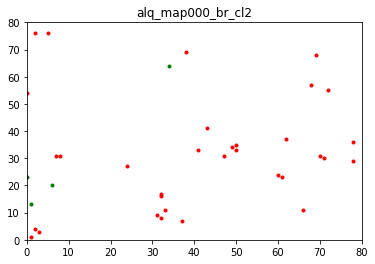

[89.2, 10.8]


Currently mapping.... alq_map001.csv  -->  1
Total no. of points to label.... 30
Label Analysis:-
Total no. of labels:  30
Total no. of lab  1  =  25
Total percentage of lab  1  =  83.33333333333334 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  16.666666666666664 %


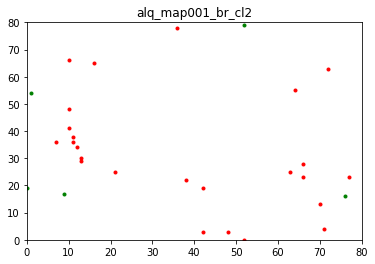

[83.3, 16.7]


Currently mapping.... alq_map002.csv  -->  2
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  24
Total percentage of lab  1  =  88.88888888888889 %
Total no. of lab  2  =  3
Total percentage of lab  2  =  11.11111111111111 %


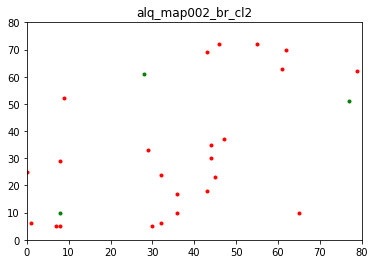

[88.9, 11.1]


Currently mapping.... alq_map003.csv  -->  3
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  34
Total percentage of lab  1  =  85.0 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  15.0 %


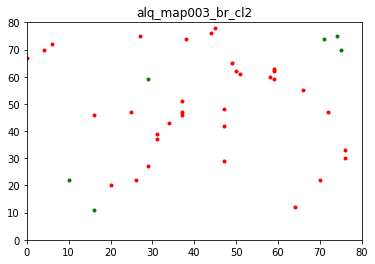

[85.0, 15.0]


Currently mapping.... alq_map004.csv  -->  4
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  17
Total percentage of lab  1  =  62.96296296296296 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  37.03703703703704 %


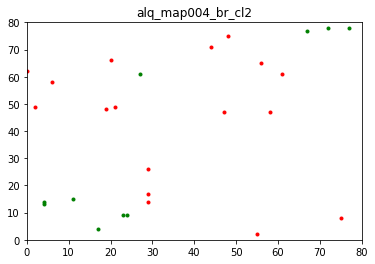

[63.0, 37.0]


Currently mapping.... alq_map005.csv  -->  5
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  26
Total percentage of lab  1  =  81.25 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  18.75 %


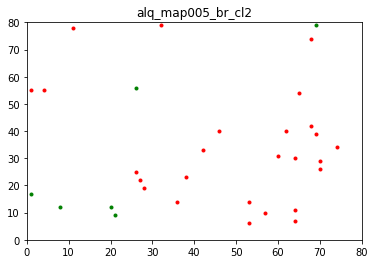

[81.2, 18.8]


Currently mapping.... alq_map006.csv  -->  6
Total no. of points to label.... 14
Label Analysis:-
Total no. of labels:  14
Total no. of lab  1  =  12
Total percentage of lab  1  =  85.71428571428571 %
Total no. of lab  2  =  2
Total percentage of lab  2  =  14.285714285714285 %


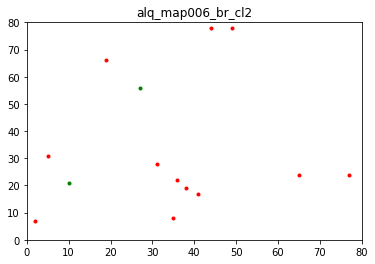

[85.7, 14.3]


Currently mapping.... alq_map007.csv  -->  7
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  21
Total percentage of lab  1  =  67.74193548387096 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  32.25806451612903 %


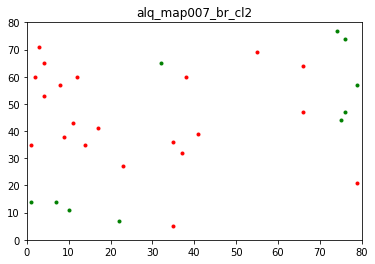

[67.7, 32.3]


Currently mapping.... alq_map008.csv  -->  8
Total no. of points to label.... 39
Label Analysis:-
Total no. of labels:  39
Total no. of lab  1  =  30
Total percentage of lab  1  =  76.92307692307693 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  23.076923076923077 %


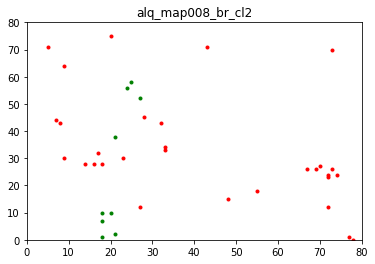

[76.9, 23.1]


Currently mapping.... alq_map009.csv  -->  9
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  35
Total percentage of lab  1  =  85.36585365853658 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  14.634146341463413 %


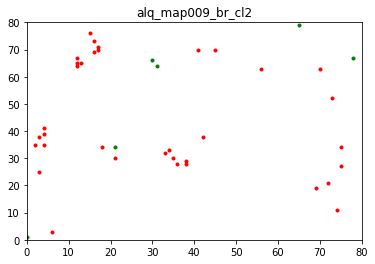

[85.4, 14.6]


Currently mapping.... alq_map010.csv  -->  10
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  22
Total percentage of lab  1  =  70.96774193548387 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  29.03225806451613 %


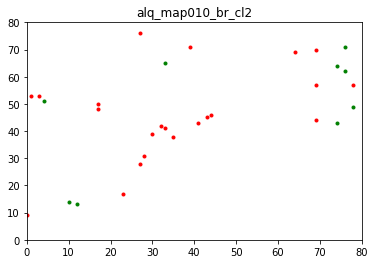

[71.0, 29.0]


Currently mapping.... alq_map011.csv  -->  11
Total no. of points to label.... 39
Label Analysis:-
Total no. of labels:  39
Total no. of lab  1  =  35
Total percentage of lab  1  =  89.74358974358975 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  10.256410256410255 %


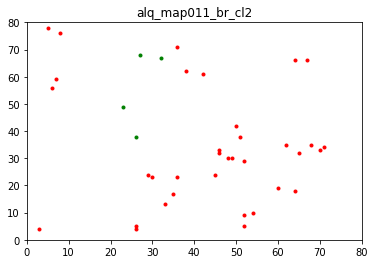

[89.7, 10.3]


Currently mapping.... alq_map012.csv  -->  12
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  38
Total percentage of lab  1  =  88.37209302325581 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  11.627906976744185 %


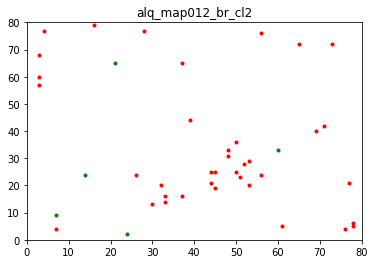

[88.4, 11.6]


Currently mapping.... alq_map013.csv  -->  13
Total no. of points to label.... 29
Label Analysis:-
Total no. of labels:  29
Total no. of lab  1  =  25
Total percentage of lab  1  =  86.20689655172413 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  13.793103448275861 %


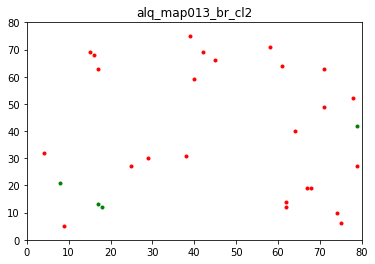

[86.2, 13.8]


Currently mapping.... alq_map014.csv  -->  14
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  31
Total percentage of lab  1  =  86.11111111111111 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  13.88888888888889 %


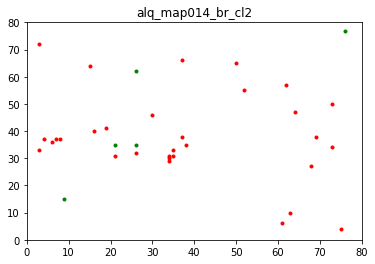

[86.1, 13.9]


Currently mapping.... alq_map015.csv  -->  15
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  48
Total percentage of lab  1  =  80.0 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  20.0 %


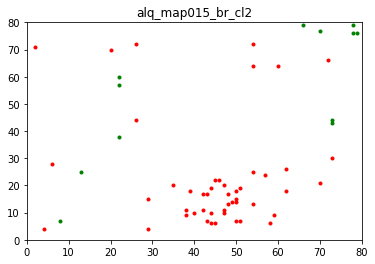

[80.0, 20.0]


Currently mapping.... alq_map016.csv  -->  16
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  34
Total percentage of lab  1  =  91.8918918918919 %
Total no. of lab  2  =  3
Total percentage of lab  2  =  8.108108108108109 %


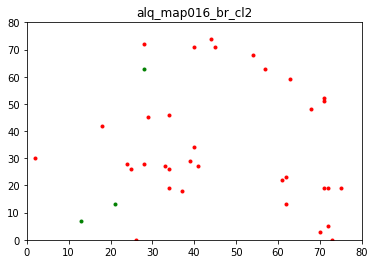

[91.9, 8.1]


Currently mapping.... alq_map017.csv  -->  17
Total no. of points to label.... 26
Label Analysis:-
Total no. of labels:  26
Total no. of lab  1  =  17
Total percentage of lab  1  =  65.38461538461539 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  34.61538461538461 %


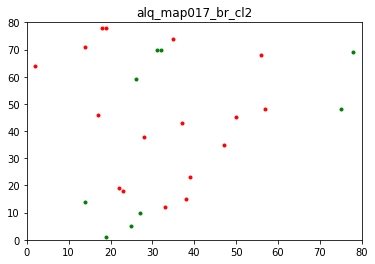

[65.4, 34.6]


Currently mapping.... alq_map018.csv  -->  18
Total no. of points to label.... 51
Label Analysis:-
Total no. of labels:  51
Total no. of lab  1  =  48
Total percentage of lab  1  =  94.11764705882352 %
Total no. of lab  2  =  3
Total percentage of lab  2  =  5.88235294117647 %


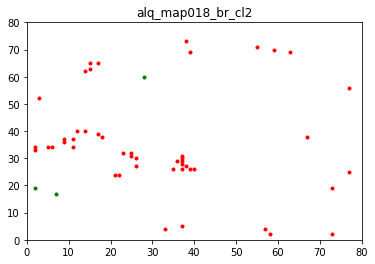

[94.1, 5.9]


Currently mapping.... alq_map019.csv  -->  19
Total no. of points to label.... 17
Label Analysis:-
Total no. of labels:  17
Total no. of lab  1  =  12
Total percentage of lab  1  =  70.58823529411765 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  29.411764705882355 %


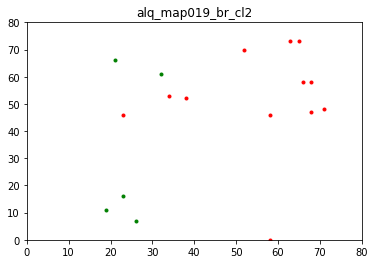

[70.6, 29.4]


Currently mapping.... alq_map020.csv  -->  20
Total no. of points to label.... 33
Label Analysis:-
Total no. of labels:  33
Total no. of lab  1  =  27
Total percentage of lab  1  =  81.81818181818183 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  18.181818181818183 %


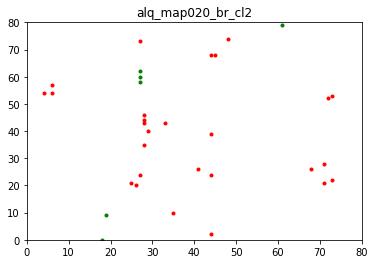

[81.8, 18.2]


Currently mapping.... alq_map021.csv  -->  21
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  29
Total percentage of lab  1  =  70.73170731707317 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  29.268292682926827 %


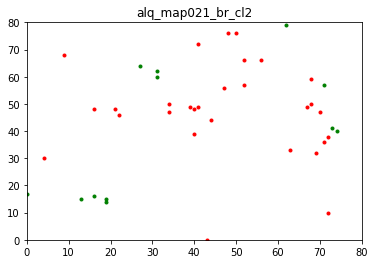

[70.7, 29.3]


Currently mapping.... alq_map022.csv  -->  22
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  24
Total percentage of lab  1  =  75.0 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  25.0 %


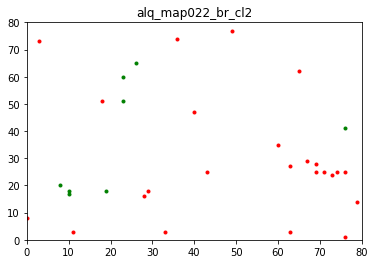

[75.0, 25.0]


Currently mapping.... alq_map023.csv  -->  23
Total no. of points to label.... 28
Label Analysis:-
Total no. of labels:  28
Total no. of lab  1  =  21
Total percentage of lab  1  =  75.0 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  25.0 %


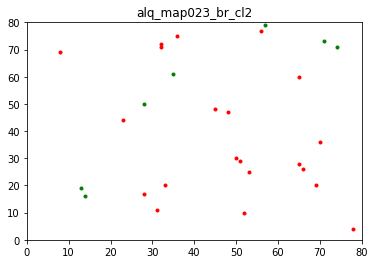

[75.0, 25.0]


Currently mapping.... alq_map024.csv  -->  24
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  26
Total percentage of lab  1  =  81.25 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  18.75 %


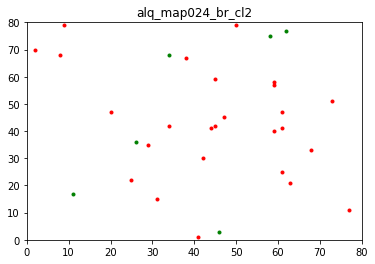

[81.2, 18.8]


Currently mapping.... alq_map025.csv  -->  25
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  34
Total percentage of lab  1  =  79.06976744186046 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  20.930232558139537 %


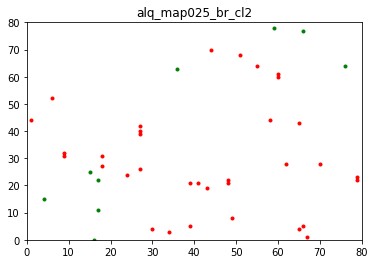

[79.1, 20.9]


Currently mapping.... alq_map026.csv  -->  26
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  28
Total percentage of lab  1  =  87.5 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  12.5 %


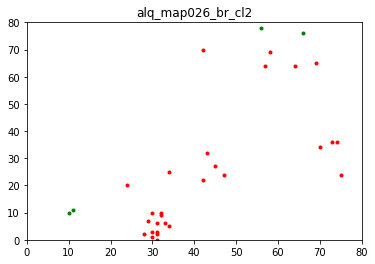

[87.5, 12.5]


Currently mapping.... alq_map027.csv  -->  27
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  25
Total percentage of lab  1  =  69.44444444444444 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  30.555555555555557 %


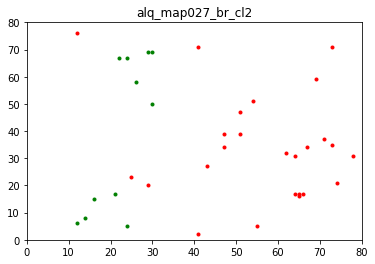

[69.4, 30.6]


Currently mapping.... alq_map028.csv  -->  28
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  45
Total percentage of lab  1  =  86.53846153846155 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  13.461538461538462 %


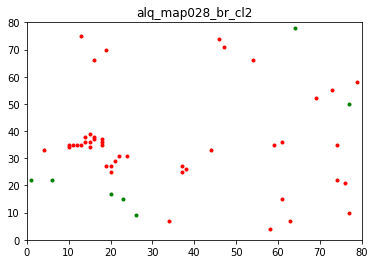

[86.5, 13.5]


Currently mapping.... alq_map029.csv  -->  29
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  35
Total percentage of lab  1  =  81.3953488372093 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  18.6046511627907 %


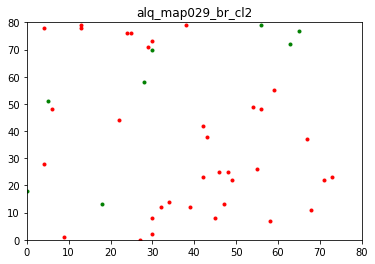

[81.4, 18.6]


Currently mapping.... alq_map030.csv  -->  30
Total no. of points to label.... 54
Label Analysis:-
Total no. of labels:  54
Total no. of lab  1  =  46
Total percentage of lab  1  =  85.18518518518519 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  14.814814814814813 %


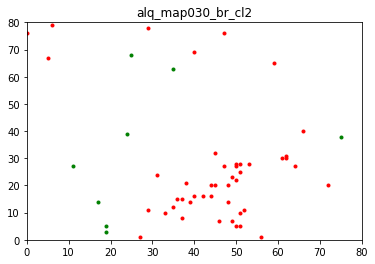

[85.2, 14.8]


Currently mapping.... alq_map031.csv  -->  31
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  29
Total percentage of lab  1  =  70.73170731707317 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  29.268292682926827 %


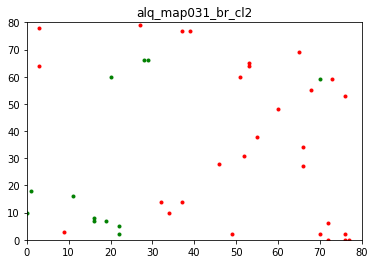

[70.7, 29.3]


Currently mapping.... alq_map032.csv  -->  32
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  56
Total percentage of lab  1  =  93.33333333333333 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  6.666666666666667 %


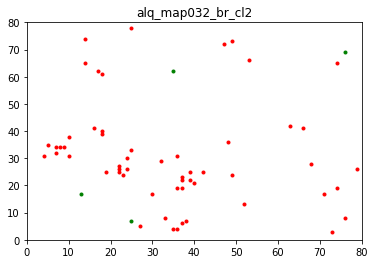

[93.3, 6.7]


Currently mapping.... alq_map033.csv  -->  33
Total no. of points to label.... 84
Label Analysis:-
Total no. of labels:  84
Total no. of lab  1  =  68
Total percentage of lab  1  =  80.95238095238095 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  19.047619047619047 %


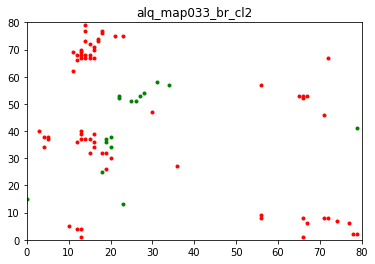

[81.0, 19.0]


Currently mapping.... alq_map034.csv  -->  34
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  48
Total percentage of lab  1  =  92.3076923076923 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  7.6923076923076925 %


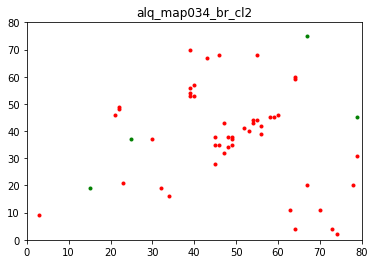

[92.3, 7.7]


Currently mapping.... alq_map035.csv  -->  35
Total no. of points to label.... 64
Label Analysis:-
Total no. of labels:  64
Total no. of lab  1  =  57
Total percentage of lab  1  =  89.0625 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  10.9375 %


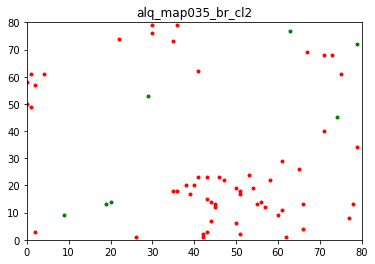

[89.1, 10.9]


Currently mapping.... alq_map036.csv  -->  36
Total no. of points to label.... 69
Label Analysis:-
Total no. of labels:  69
Total no. of lab  1  =  64
Total percentage of lab  1  =  92.7536231884058 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  7.246376811594203 %


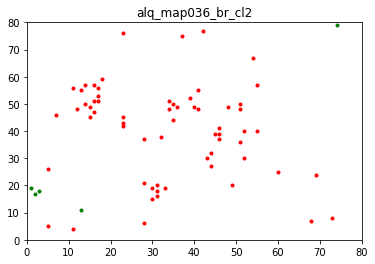

[92.8, 7.2]


Currently mapping.... alq_map037.csv  -->  37
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  31
Total percentage of lab  1  =  86.11111111111111 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  13.88888888888889 %


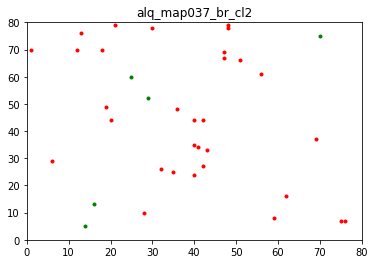

[86.1, 13.9]


Currently mapping.... alq_map038.csv  -->  38
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  34
Total percentage of lab  1  =  79.06976744186046 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  20.930232558139537 %


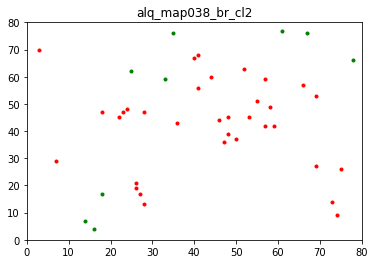

[79.1, 20.9]


Currently mapping.... alq_map039.csv  -->  39
Total no. of points to label.... 46
Label Analysis:-
Total no. of labels:  46
Total no. of lab  1  =  33
Total percentage of lab  1  =  71.73913043478261 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  28.26086956521739 %


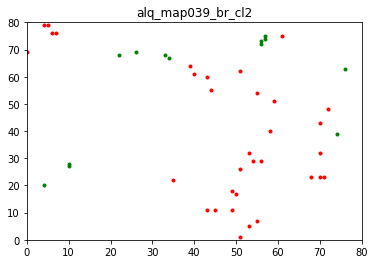

[71.7, 28.3]


Currently mapping.... alq_map040.csv  -->  40
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  27
Total percentage of lab  1  =  87.09677419354838 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  12.903225806451612 %


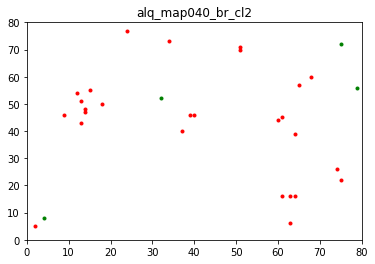

[87.1, 12.9]


Currently mapping.... alq_map041.csv  -->  41
Total no. of points to label.... 34
Label Analysis:-
Total no. of labels:  34
Total no. of lab  1  =  31
Total percentage of lab  1  =  91.17647058823529 %
Total no. of lab  2  =  3
Total percentage of lab  2  =  8.823529411764707 %


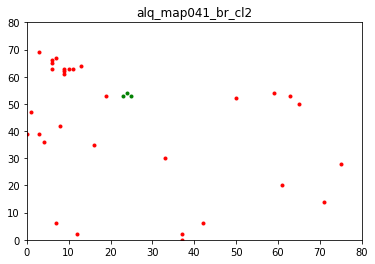

[91.2, 8.8]


Currently mapping.... alq_map042.csv  -->  42
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  33
Total percentage of lab  1  =  86.8421052631579 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  13.157894736842104 %


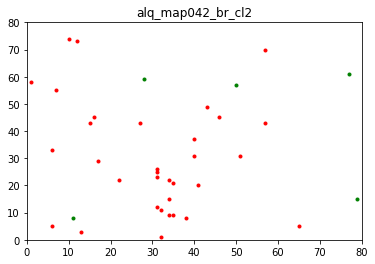

[86.8, 13.2]


Currently mapping.... alq_map043.csv  -->  43
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  26
Total percentage of lab  1  =  96.29629629629629 %
Total no. of lab  2  =  1
Total percentage of lab  2  =  3.7037037037037033 %


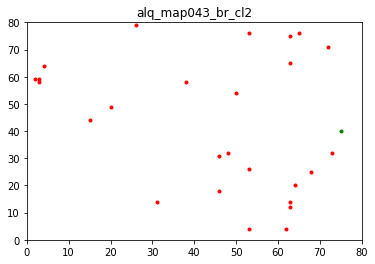

[96.3, 3.7]


Currently mapping.... alq_map044.csv  -->  44
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  36
Total percentage of lab  1  =  87.8048780487805 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  12.195121951219512 %


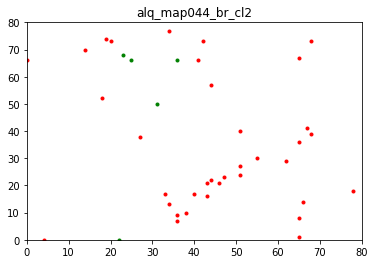

[87.8, 12.2]


Currently mapping.... alq_map045.csv  -->  45
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  38
Total percentage of lab  1  =  92.6829268292683 %
Total no. of lab  2  =  3
Total percentage of lab  2  =  7.317073170731707 %


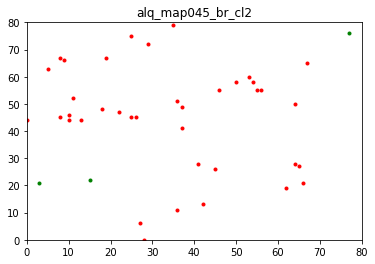

[92.7, 7.3]


Currently mapping.... alq_map046.csv  -->  46
Total no. of points to label.... 26
Label Analysis:-
Total no. of labels:  26
Total no. of lab  1  =  23
Total percentage of lab  1  =  88.46153846153845 %
Total no. of lab  2  =  3
Total percentage of lab  2  =  11.538461538461538 %


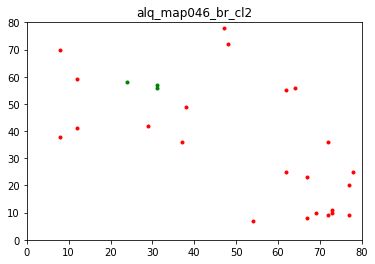

[88.5, 11.5]


Currently mapping.... alq_map047.csv  -->  47
Total no. of points to label.... 24
Label Analysis:-
Total no. of labels:  24
Total no. of lab  1  =  18
Total percentage of lab  1  =  75.0 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  25.0 %


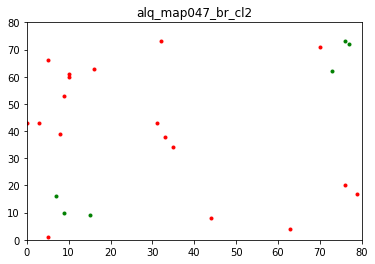

[75.0, 25.0]


Currently mapping.... alq_map048.csv  -->  48
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  35
Total percentage of lab  1  =  87.5 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  12.5 %


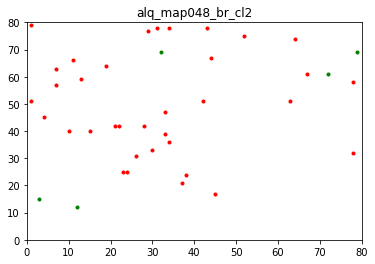

[87.5, 12.5]


Currently mapping.... alq_map049.csv  -->  49
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  29
Total percentage of lab  1  =  76.31578947368422 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  23.684210526315788 %


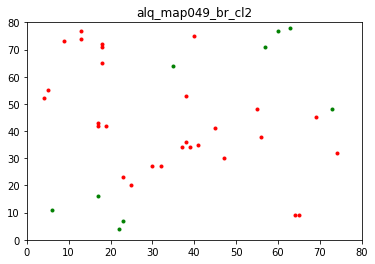

[76.3, 23.7]


Currently mapping.... alq_map050.csv  -->  50
Total no. of points to label.... 125
Label Analysis:-
Total no. of labels:  125
Total no. of lab  1  =  125
Total percentage of lab  1  =  100.0 %


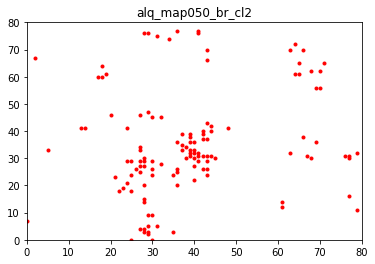

[100.0]


Currently mapping.... alq_map051.csv  -->  51
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  50
Total percentage of lab  1  =  83.33333333333334 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  16.666666666666664 %


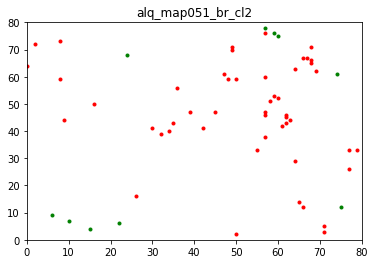

[83.3, 16.7]


Currently mapping.... alq_map052.csv  -->  52
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  48
Total percentage of lab  1  =  92.3076923076923 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  7.6923076923076925 %


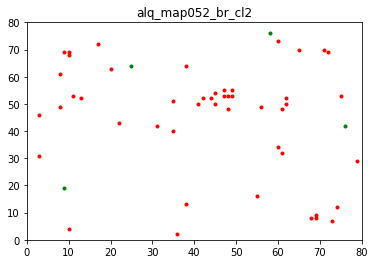

[92.3, 7.7]


Currently mapping.... alq_map053.csv  -->  53
Total no. of points to label.... 51
Label Analysis:-
Total no. of labels:  51
Total no. of lab  1  =  41
Total percentage of lab  1  =  80.3921568627451 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  19.607843137254903 %


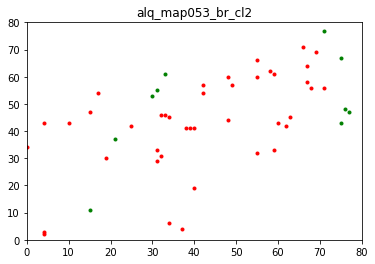

[80.4, 19.6]


Currently mapping.... alq_map054.csv  -->  54
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  28
Total percentage of lab  1  =  77.77777777777779 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  22.22222222222222 %


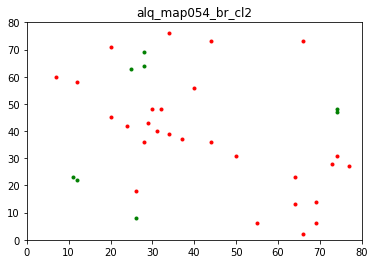

[77.8, 22.2]


Currently mapping.... alq_map055.csv  -->  55
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  70
Total percentage of lab  1  =  93.33333333333333 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  6.666666666666667 %


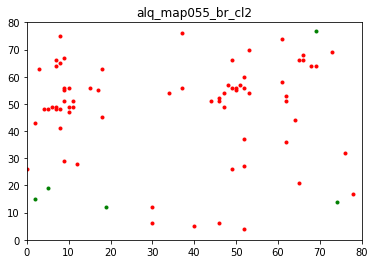

[93.3, 6.7]


Currently mapping.... alq_map056.csv  -->  56
Total no. of points to label.... 19
Label Analysis:-
Total no. of labels:  19
Total no. of lab  1  =  16
Total percentage of lab  1  =  84.21052631578947 %
Total no. of lab  2  =  3
Total percentage of lab  2  =  15.789473684210526 %


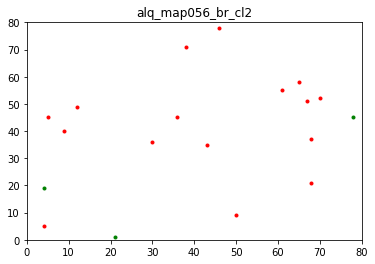

[84.2, 15.8]


Currently mapping.... alq_map057.csv  -->  57
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  32
Total percentage of lab  1  =  86.48648648648648 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  13.513513513513514 %


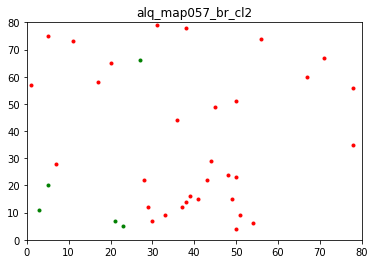

[86.5, 13.5]


Currently mapping.... alq_map058.csv  -->  58
Total no. of points to label.... 44
Label Analysis:-
Total no. of labels:  44
Total no. of lab  1  =  33
Total percentage of lab  1  =  75.0 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  25.0 %


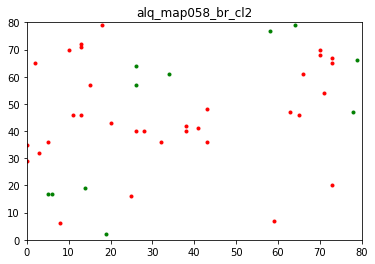

[75.0, 25.0]


Currently mapping.... alq_map059.csv  -->  59
Total no. of points to label.... 33
Label Analysis:-
Total no. of labels:  33
Total no. of lab  1  =  25
Total percentage of lab  1  =  75.75757575757575 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  24.242424242424242 %


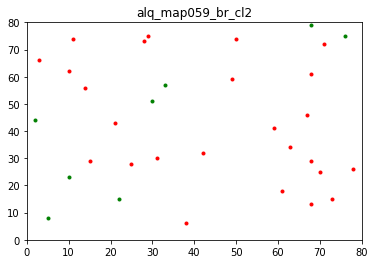

[75.8, 24.2]


Currently mapping.... alq_map060.csv  -->  60
Total no. of points to label.... 62
Label Analysis:-
Total no. of labels:  62
Total no. of lab  1  =  48
Total percentage of lab  1  =  77.41935483870968 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  22.58064516129032 %


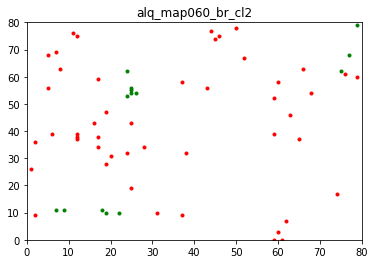

[77.4, 22.6]


Currently mapping.... alq_map061.csv  -->  61
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  32
Total percentage of lab  1  =  78.04878048780488 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  21.951219512195124 %


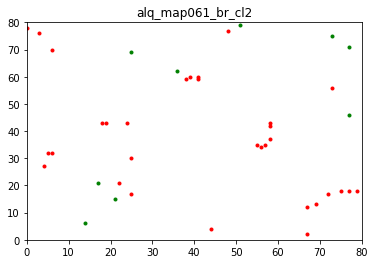

[78.0, 22.0]


Currently mapping.... alq_map062.csv  -->  62
Total no. of points to label.... 24
Label Analysis:-
Total no. of labels:  24
Total no. of lab  1  =  18
Total percentage of lab  1  =  75.0 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  25.0 %


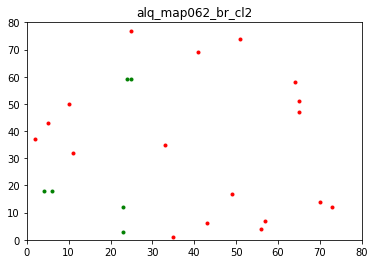

[75.0, 25.0]


Currently mapping.... alq_map063.csv  -->  63
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  34
Total percentage of lab  1  =  79.06976744186046 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  20.930232558139537 %


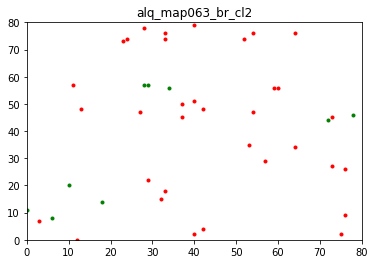

[79.1, 20.9]


Currently mapping.... alq_map064.csv  -->  64
Total no. of points to label.... 50
Label Analysis:-
Total no. of labels:  50
Total no. of lab  1  =  33
Total percentage of lab  1  =  66.0 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  34.0 %


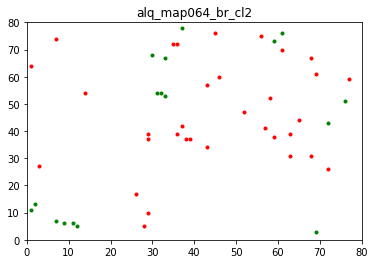

[66.0, 34.0]


Currently mapping.... alq_map065.csv  -->  65
Total no. of points to label.... 44
Label Analysis:-
Total no. of labels:  44
Total no. of lab  1  =  34
Total percentage of lab  1  =  77.27272727272727 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  22.727272727272727 %


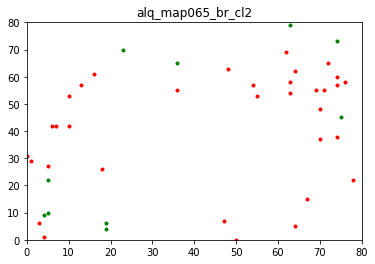

[77.3, 22.7]


Currently mapping.... alq_map066.csv  -->  66
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  48
Total percentage of lab  1  =  78.68852459016394 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  21.311475409836063 %


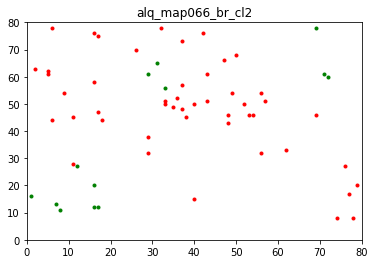

[78.7, 21.3]


Currently mapping.... alq_map067.csv  -->  67
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  28
Total percentage of lab  1  =  77.77777777777779 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  22.22222222222222 %


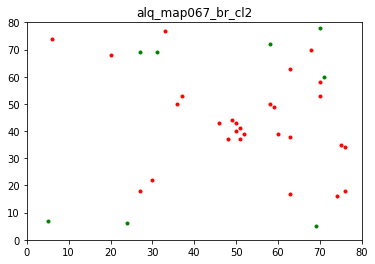

[77.8, 22.2]


Currently mapping.... alq_map068.csv  -->  68
Total no. of points to label.... 45
Label Analysis:-
Total no. of labels:  45
Total no. of lab  1  =  30
Total percentage of lab  1  =  66.66666666666666 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  33.33333333333333 %


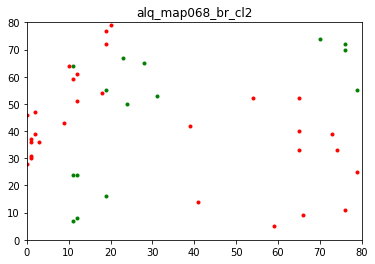

[66.7, 33.3]


Currently mapping.... alq_map069.csv  -->  69
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  38
Total percentage of lab  1  =  73.07692307692307 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  26.923076923076923 %


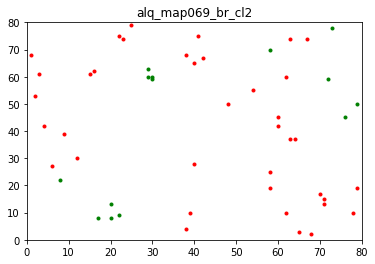

[73.1, 26.9]


Currently mapping.... alq_map070.csv  -->  70
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  47
Total percentage of lab  1  =  78.33333333333333 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  21.666666666666668 %


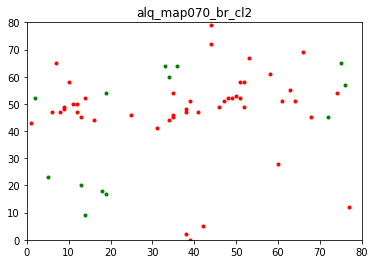

[78.3, 21.7]


Currently mapping.... alq_map071.csv  -->  71
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  44
Total percentage of lab  1  =  84.61538461538461 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  15.384615384615385 %


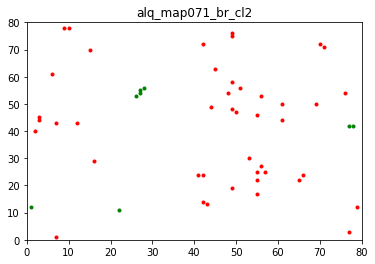

[84.6, 15.4]


Currently mapping.... alq_map072.csv  -->  72
Total no. of points to label.... 62
Label Analysis:-
Total no. of labels:  62
Total no. of lab  1  =  55
Total percentage of lab  1  =  88.70967741935483 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  11.29032258064516 %


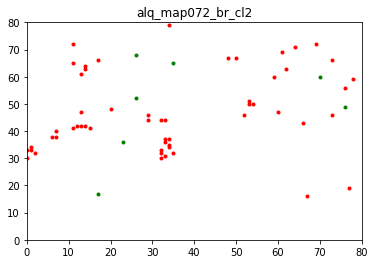

[88.7, 11.3]


Currently mapping.... alq_map073.csv  -->  73
Total no. of points to label.... 85
Label Analysis:-
Total no. of labels:  85
Total no. of lab  1  =  69
Total percentage of lab  1  =  81.17647058823529 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  18.823529411764707 %


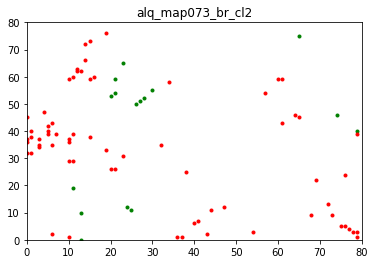

[81.2, 18.8]


Currently mapping.... alq_map074.csv  -->  74
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  53
Total percentage of lab  1  =  91.37931034482759 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  8.620689655172415 %


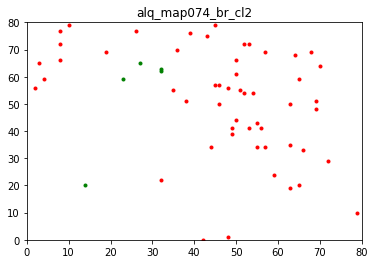

[91.4, 8.6]


Currently mapping.... alq_map075.csv  -->  75
Total no. of points to label.... 59
Label Analysis:-
Total no. of labels:  59
Total no. of lab  1  =  53
Total percentage of lab  1  =  89.83050847457628 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  10.16949152542373 %


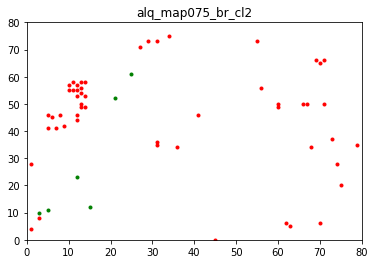

[89.8, 10.2]


Currently mapping.... alq_map076.csv  -->  76
Total no. of points to label.... 72
Label Analysis:-
Total no. of labels:  72
Total no. of lab  1  =  66
Total percentage of lab  1  =  91.66666666666666 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  8.333333333333332 %


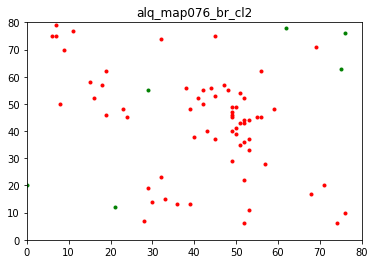

[91.7, 8.3]


Currently mapping.... alq_map077.csv  -->  77
Total no. of points to label.... 42
Label Analysis:-
Total no. of labels:  42
Total no. of lab  1  =  35
Total percentage of lab  1  =  83.33333333333334 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  16.666666666666664 %


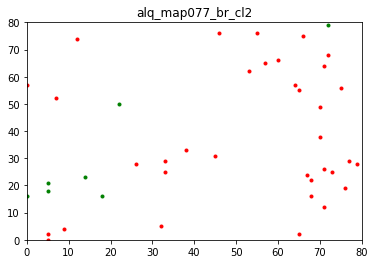

[83.3, 16.7]


Currently mapping.... alq_map078.csv  -->  78
Total no. of points to label.... 63
Label Analysis:-
Total no. of labels:  63
Total no. of lab  1  =  53
Total percentage of lab  1  =  84.12698412698413 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  15.873015873015872 %


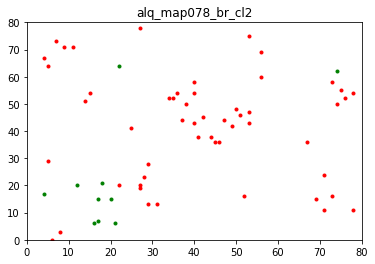

[84.1, 15.9]


Currently mapping.... alq_map079.csv  -->  79
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  33
Total percentage of lab  1  =  82.5 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  17.5 %


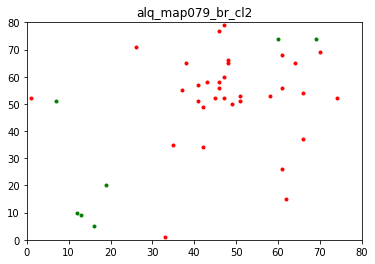

[82.5, 17.5]


Currently mapping.... alq_map080.csv  -->  80
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  24
Total percentage of lab  1  =  66.66666666666666 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  33.33333333333333 %


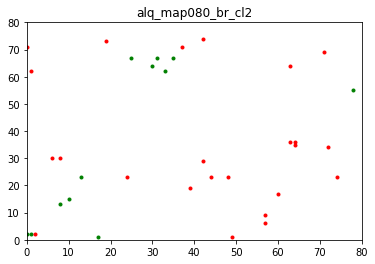

[66.7, 33.3]


Currently mapping.... alq_map081.csv  -->  81
Total no. of points to label.... 77
Label Analysis:-
Total no. of labels:  77
Total no. of lab  1  =  57
Total percentage of lab  1  =  74.02597402597402 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  25.97402597402597 %


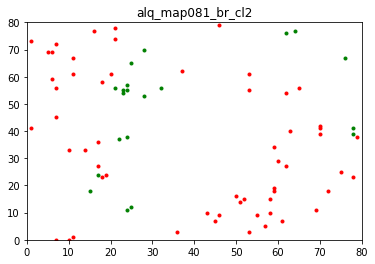

[74.0, 26.0]


Currently mapping.... alq_map082.csv  -->  82
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  28
Total percentage of lab  1  =  77.77777777777779 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  22.22222222222222 %


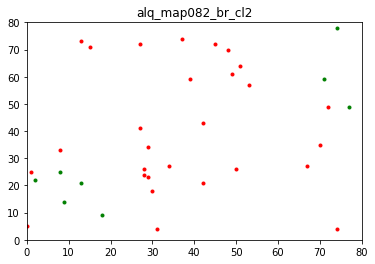

[77.8, 22.2]


Currently mapping.... alq_map083.csv  -->  83
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  38
Total percentage of lab  1  =  88.37209302325581 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  11.627906976744185 %


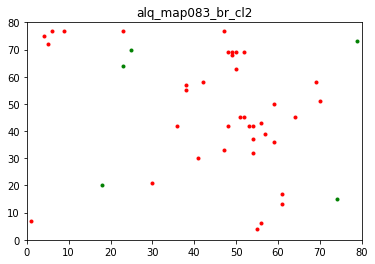

[88.4, 11.6]


Currently mapping.... alq_map084.csv  -->  84
Total no. of points to label.... 49
Label Analysis:-
Total no. of labels:  49
Total no. of lab  1  =  41
Total percentage of lab  1  =  83.6734693877551 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  16.3265306122449 %


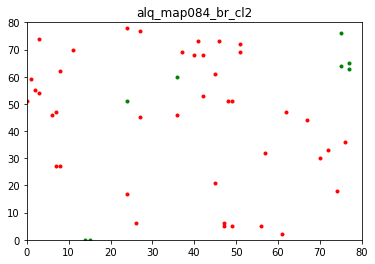

[83.7, 16.3]


Currently mapping.... alq_map085.csv  -->  85
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  40
Total percentage of lab  1  =  68.96551724137932 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  31.03448275862069 %


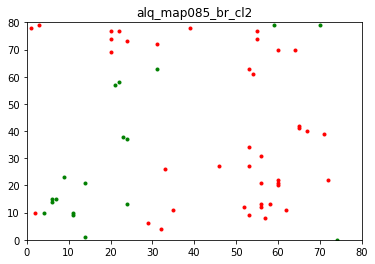

[69.0, 31.0]


Currently mapping.... alq_map086.csv  -->  86
Total no. of points to label.... 74
Label Analysis:-
Total no. of labels:  74
Total no. of lab  1  =  63
Total percentage of lab  1  =  85.13513513513513 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  14.864864864864865 %


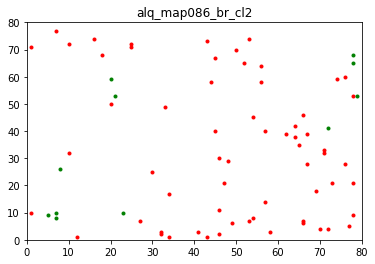

[85.1, 14.9]


Currently mapping.... alq_map087.csv  -->  87
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  29
Total percentage of lab  1  =  67.44186046511628 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  32.55813953488372 %


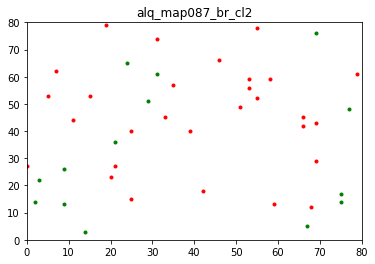

[67.4, 32.6]


Currently mapping.... alq_map088.csv  -->  88
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  59
Total percentage of lab  1  =  78.66666666666666 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  21.333333333333336 %


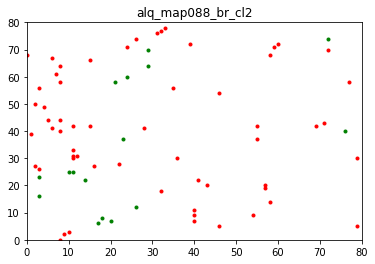

[78.7, 21.3]


Currently mapping.... alq_map089.csv  -->  89
Total no. of points to label.... 68
Label Analysis:-
Total no. of labels:  68
Total no. of lab  1  =  56
Total percentage of lab  1  =  82.35294117647058 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  17.647058823529413 %


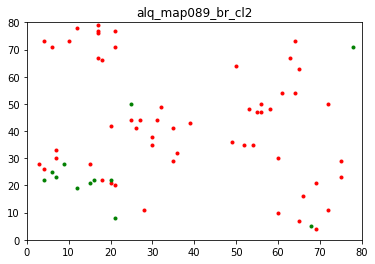

[82.4, 17.6]


Currently mapping.... alq_map090.csv  -->  90
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  67
Total percentage of lab  1  =  81.70731707317073 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  18.29268292682927 %


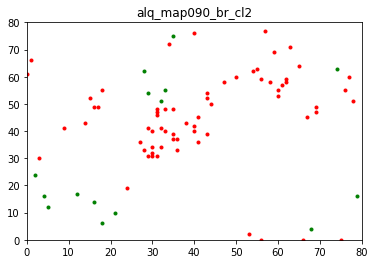

[81.7, 18.3]


Currently mapping.... alq_map091.csv  -->  91
Total no. of points to label.... 65
Label Analysis:-
Total no. of labels:  65
Total no. of lab  1  =  52
Total percentage of lab  1  =  80.0 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  20.0 %


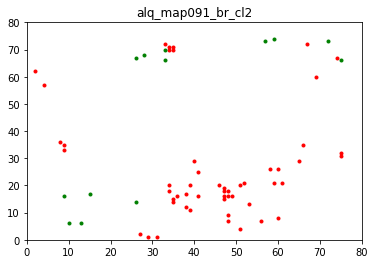

[80.0, 20.0]


Currently mapping.... alq_map092.csv  -->  92
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  45
Total percentage of lab  1  =  77.58620689655173 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  22.413793103448278 %


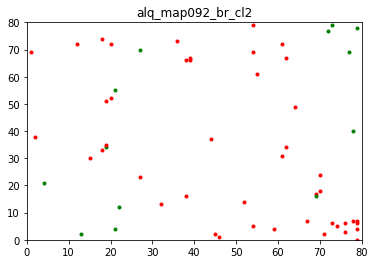

[77.6, 22.4]


Currently mapping.... alq_map093.csv  -->  93
Total no. of points to label.... 46
Label Analysis:-
Total no. of labels:  46
Total no. of lab  1  =  31
Total percentage of lab  1  =  67.3913043478261 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  32.608695652173914 %


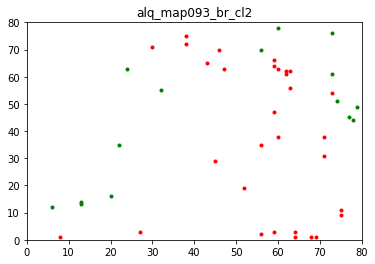

[67.4, 32.6]


Currently mapping.... alq_map094.csv  -->  94
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  36
Total percentage of lab  1  =  59.01639344262295 %
Total no. of lab  2  =  25
Total percentage of lab  2  =  40.98360655737705 %


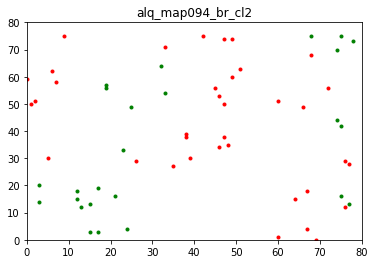

[59.0, 41.0]


Currently mapping.... alq_map095.csv  -->  95
Total no. of points to label.... 84
Label Analysis:-
Total no. of labels:  84
Total no. of lab  1  =  77
Total percentage of lab  1  =  91.66666666666666 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  8.333333333333332 %


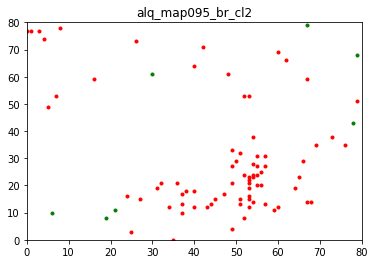

[91.7, 8.3]


Currently mapping.... alq_map096.csv  -->  96
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  33
Total percentage of lab  1  =  86.8421052631579 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  13.157894736842104 %


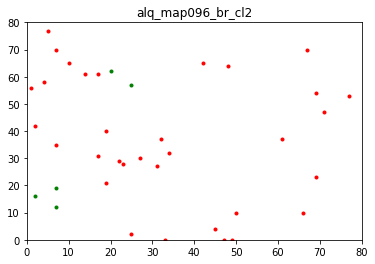

[86.8, 13.2]


Currently mapping.... alq_map097.csv  -->  97
Total no. of points to label.... 47
Label Analysis:-
Total no. of labels:  47
Total no. of lab  1  =  38
Total percentage of lab  1  =  80.85106382978722 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  19.148936170212767 %


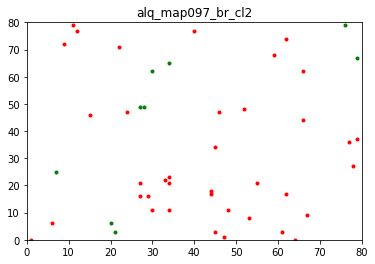

[80.9, 19.1]


Currently mapping.... alq_map098.csv  -->  98
Total no. of points to label.... 88
Label Analysis:-
Total no. of labels:  88
Total no. of lab  1  =  57
Total percentage of lab  1  =  64.77272727272727 %
Total no. of lab  2  =  31
Total percentage of lab  2  =  35.22727272727273 %


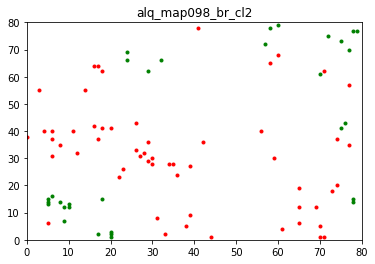

[64.8, 35.2]


Currently mapping.... alq_map099.csv  -->  99
Total no. of points to label.... 64
Label Analysis:-
Total no. of labels:  64
Total no. of lab  1  =  50
Total percentage of lab  1  =  78.125 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  21.875 %


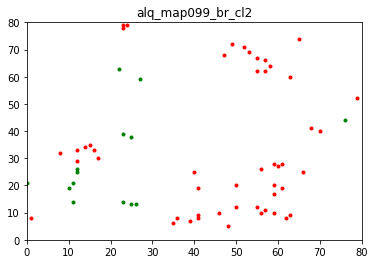

[78.1, 21.9]


Currently mapping.... alq_map100.csv  -->  100
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  38
Total percentage of lab  1  =  73.07692307692307 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  26.923076923076923 %


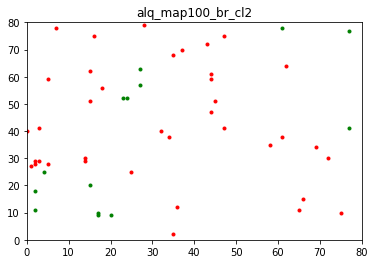

[73.1, 26.9]


Currently mapping.... alq_map101.csv  -->  101
Total no. of points to label.... 69
Label Analysis:-
Total no. of labels:  69
Total no. of lab  1  =  46
Total percentage of lab  1  =  66.66666666666666 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  33.33333333333333 %


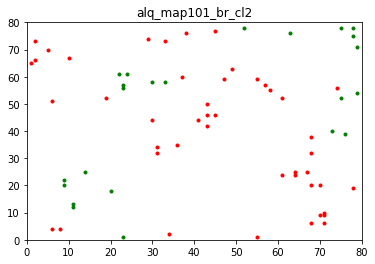

[66.7, 33.3]


Currently mapping.... alq_map102.csv  -->  102
Total no. of points to label.... 71
Label Analysis:-
Total no. of labels:  71
Total no. of lab  1  =  52
Total percentage of lab  1  =  73.23943661971832 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  26.76056338028169 %


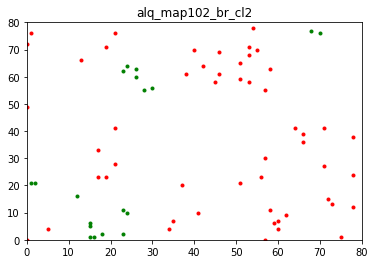

[73.2, 26.8]


Currently mapping.... alq_map103.csv  -->  103
Total no. of points to label.... 42
Label Analysis:-
Total no. of labels:  42
Total no. of lab  1  =  36
Total percentage of lab  1  =  85.71428571428571 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  14.285714285714285 %


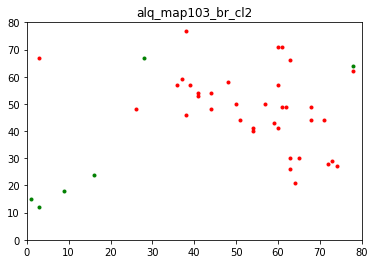

[85.7, 14.3]


Currently mapping.... alq_map104.csv  -->  104
Total no. of points to label.... 68
Label Analysis:-
Total no. of labels:  68
Total no. of lab  1  =  39
Total percentage of lab  1  =  57.35294117647059 %
Total no. of lab  2  =  29
Total percentage of lab  2  =  42.64705882352941 %


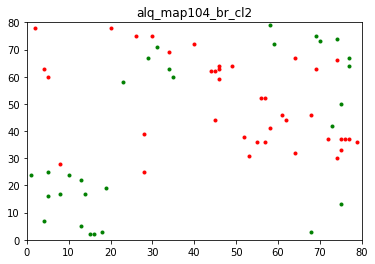

[57.4, 42.6]


Currently mapping.... alq_map105.csv  -->  105
Total no. of points to label.... 59
Label Analysis:-
Total no. of labels:  59
Total no. of lab  1  =  41
Total percentage of lab  1  =  69.49152542372882 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  30.508474576271187 %


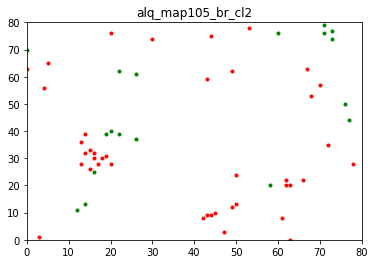

[69.5, 30.5]


Currently mapping.... alq_map106.csv  -->  106
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  44
Total percentage of lab  1  =  72.1311475409836 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  27.86885245901639 %


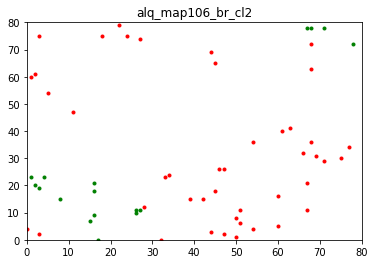

[72.1, 27.9]


Currently mapping.... alq_map107.csv  -->  107
Total no. of points to label.... 55
Label Analysis:-
Total no. of labels:  55
Total no. of lab  1  =  39
Total percentage of lab  1  =  70.9090909090909 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  29.09090909090909 %


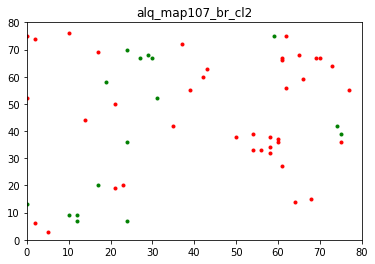

[70.9, 29.1]


Currently mapping.... alq_map108.csv  -->  108
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  49
Total percentage of lab  1  =  59.756097560975604 %
Total no. of lab  2  =  33
Total percentage of lab  2  =  40.243902439024396 %


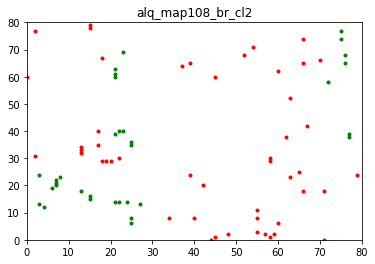

[59.8, 40.2]


Currently mapping.... alq_map109.csv  -->  109
Total no. of points to label.... 95
Label Analysis:-
Total no. of labels:  95
Total no. of lab  1  =  80
Total percentage of lab  1  =  84.21052631578947 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  15.789473684210526 %


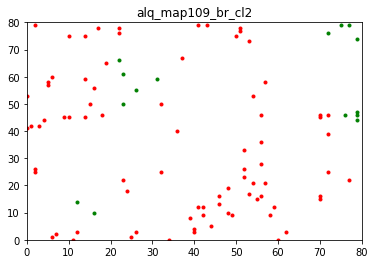

[84.2, 15.8]


Currently mapping.... alq_map110.csv  -->  110
Total no. of points to label.... 77
Label Analysis:-
Total no. of labels:  77
Total no. of lab  1  =  49
Total percentage of lab  1  =  63.63636363636363 %
Total no. of lab  2  =  28
Total percentage of lab  2  =  36.36363636363637 %


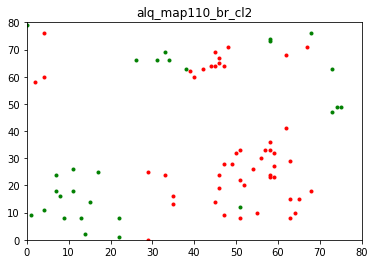

[63.6, 36.4]


Currently mapping.... alq_map111.csv  -->  111
Total no. of points to label.... 141
Label Analysis:-
Total no. of labels:  141
Total no. of lab  1  =  116
Total percentage of lab  1  =  82.26950354609929 %
Total no. of lab  2  =  25
Total percentage of lab  2  =  17.73049645390071 %


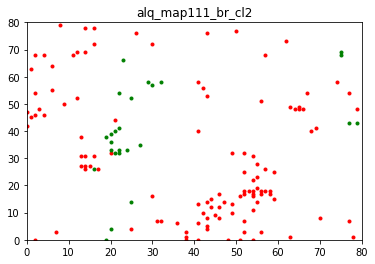

[82.3, 17.7]


Currently mapping.... alq_map112.csv  -->  112
Total no. of points to label.... 96
Label Analysis:-
Total no. of labels:  96
Total no. of lab  1  =  65
Total percentage of lab  1  =  67.70833333333334 %
Total no. of lab  2  =  31
Total percentage of lab  2  =  32.29166666666667 %


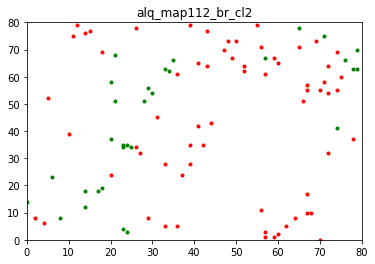

[67.7, 32.3]


Currently mapping.... alq_map113.csv  -->  113
Total no. of points to label.... 76
Label Analysis:-
Total no. of labels:  76
Total no. of lab  1  =  52
Total percentage of lab  1  =  68.42105263157895 %
Total no. of lab  2  =  24
Total percentage of lab  2  =  31.57894736842105 %


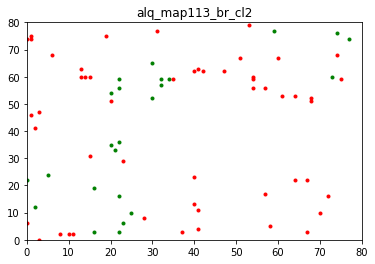

[68.4, 31.6]


Currently mapping.... alq_map114.csv  -->  114
Total no. of points to label.... 71
Label Analysis:-
Total no. of labels:  71
Total no. of lab  1  =  57
Total percentage of lab  1  =  80.28169014084507 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  19.718309859154928 %


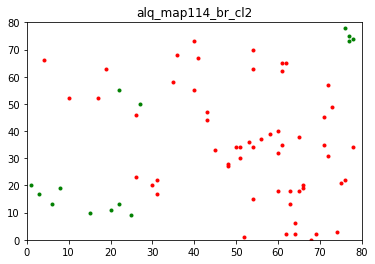

[80.3, 19.7]


Currently mapping.... alq_map115.csv  -->  115
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  66
Total percentage of lab  1  =  80.48780487804879 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  19.51219512195122 %


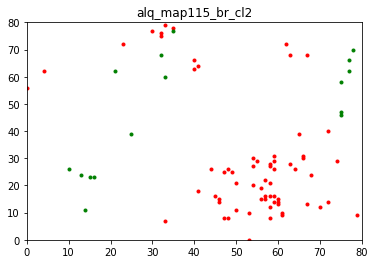

[80.5, 19.5]


Currently mapping.... alq_map116.csv  -->  116
Total no. of points to label.... 112
Label Analysis:-
Total no. of labels:  112
Total no. of lab  1  =  112
Total percentage of lab  1  =  100.0 %


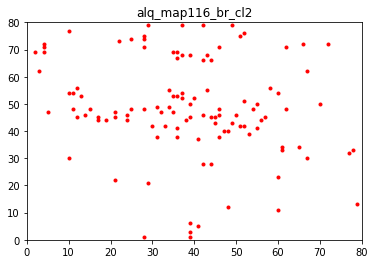

[100.0]


Currently mapping.... alq_map117.csv  -->  117
Total no. of points to label.... 93
Label Analysis:-
Total no. of labels:  93
Total no. of lab  1  =  55
Total percentage of lab  1  =  59.13978494623656 %
Total no. of lab  2  =  38
Total percentage of lab  2  =  40.86021505376344 %


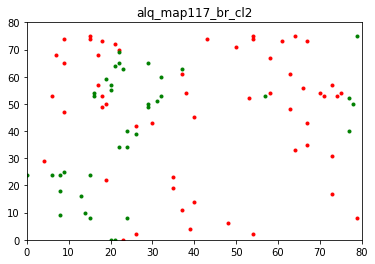

[59.1, 40.9]


Currently mapping.... alq_map118.csv  -->  118
Total no. of points to label.... 108
Label Analysis:-
Total no. of labels:  108
Total no. of lab  1  =  74
Total percentage of lab  1  =  68.51851851851852 %
Total no. of lab  2  =  34
Total percentage of lab  2  =  31.48148148148148 %


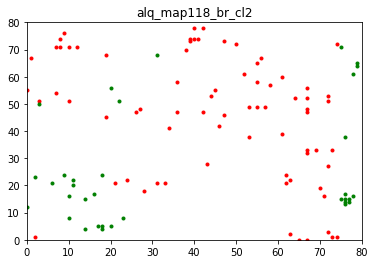

[68.5, 31.5]


Currently mapping.... alq_map119.csv  -->  119
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  61
Total percentage of lab  1  =  81.33333333333333 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  18.666666666666668 %


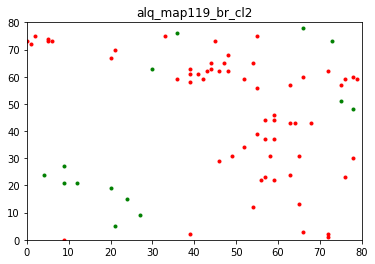

[81.3, 18.7]




In [57]:
alq_br = pseudo_classifier_label(num_npy, br_remap['al_brl'], tr_map['aln_re_id.csv'], alq_map,
                                 80, "_br_cl2", "results", False)

Currently mapping.... alq_map000.csv  -->  0
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  20
Total percentage of lab  1  =  54.054054054054056 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  45.94594594594595 %
map saved!!


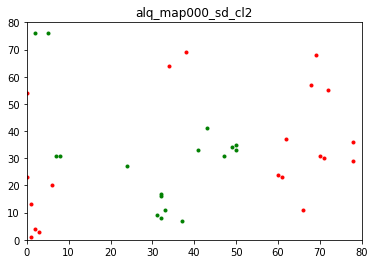

[54.1, 45.9]


Currently mapping.... alq_map001.csv  -->  1
Total no. of points to label.... 30
Label Analysis:-
Total no. of labels:  30
Total no. of lab  1  =  17
Total percentage of lab  1  =  56.666666666666664 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  43.333333333333336 %
map saved!!


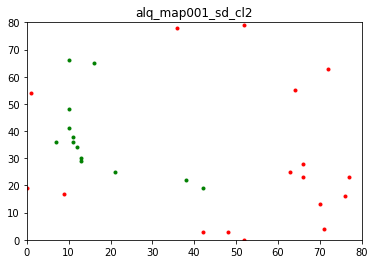

[56.7, 43.3]


Currently mapping.... alq_map002.csv  -->  2
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  13
Total percentage of lab  1  =  48.148148148148145 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  51.85185185185185 %
map saved!!


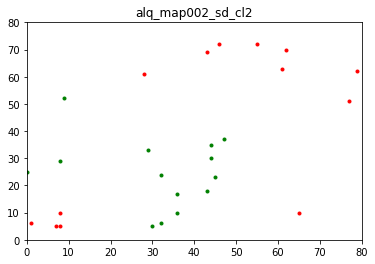

[48.1, 51.9]


Currently mapping.... alq_map003.csv  -->  3
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  25
Total percentage of lab  1  =  62.5 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  37.5 %
map saved!!


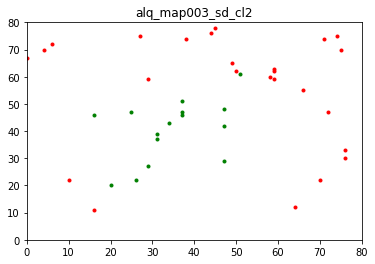

[62.5, 37.5]


Currently mapping.... alq_map004.csv  -->  4
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  19
Total percentage of lab  1  =  70.37037037037037 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  29.629629629629626 %
map saved!!


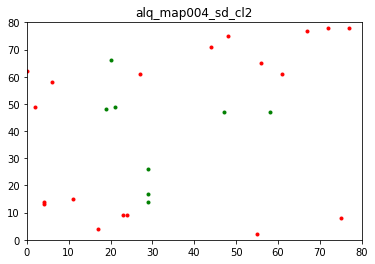

[70.4, 29.6]


Currently mapping.... alq_map005.csv  -->  5
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  20
Total percentage of lab  1  =  62.5 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  37.5 %
map saved!!


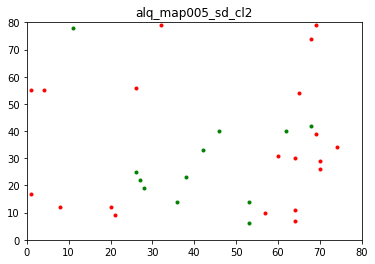

[62.5, 37.5]


Currently mapping.... alq_map006.csv  -->  6
Total no. of points to label.... 14
Label Analysis:-
Total no. of labels:  14
Total no. of lab  1  =  7
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  50.0 %
map saved!!


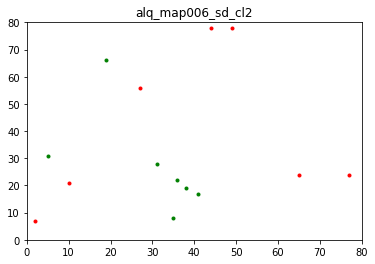

[50.0, 50.0]


Currently mapping.... alq_map007.csv  -->  7
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  18
Total percentage of lab  1  =  58.06451612903226 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  41.935483870967744 %
map saved!!


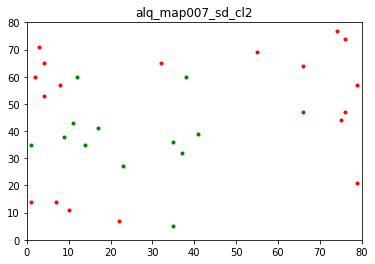

[58.1, 41.9]


Currently mapping.... alq_map008.csv  -->  8
Total no. of points to label.... 39
Label Analysis:-
Total no. of labels:  39
Total no. of lab  1  =  22
Total percentage of lab  1  =  56.41025641025641 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  43.58974358974359 %
map saved!!


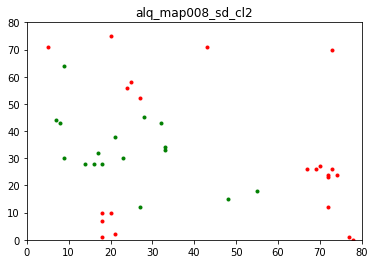

[56.4, 43.6]


Currently mapping.... alq_map009.csv  -->  9
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  16
Total percentage of lab  1  =  39.02439024390244 %
Total no. of lab  2  =  25
Total percentage of lab  2  =  60.97560975609756 %
map saved!!


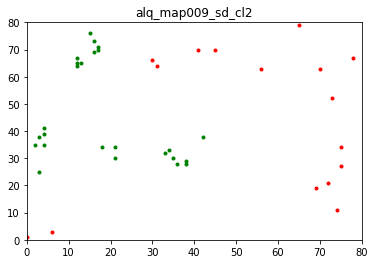

[39.0, 61.0]


Currently mapping.... alq_map010.csv  -->  10
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  18
Total percentage of lab  1  =  58.06451612903226 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  41.935483870967744 %
map saved!!


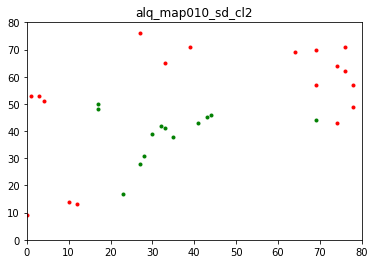

[58.1, 41.9]


Currently mapping.... alq_map011.csv  -->  11
Total no. of points to label.... 39
Label Analysis:-
Total no. of labels:  39
Total no. of lab  1  =  15
Total percentage of lab  1  =  38.46153846153847 %
Total no. of lab  2  =  24
Total percentage of lab  2  =  61.53846153846154 %
map saved!!


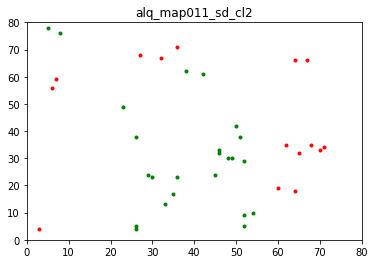

[38.5, 61.5]


Currently mapping.... alq_map012.csv  -->  12
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  18
Total percentage of lab  1  =  41.86046511627907 %
Total no. of lab  2  =  25
Total percentage of lab  2  =  58.139534883720934 %
map saved!!


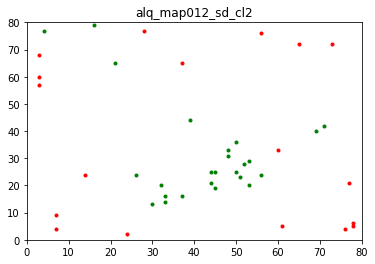

[41.9, 58.1]


Currently mapping.... alq_map013.csv  -->  13
Total no. of points to label.... 29
Label Analysis:-
Total no. of labels:  29
Total no. of lab  1  =  20
Total percentage of lab  1  =  68.96551724137932 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  31.03448275862069 %
map saved!!


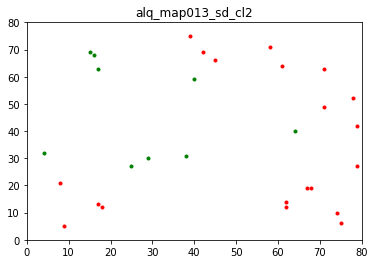

[69.0, 31.0]


Currently mapping.... alq_map014.csv  -->  14
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  14
Total percentage of lab  1  =  38.88888888888889 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  61.111111111111114 %
map saved!!


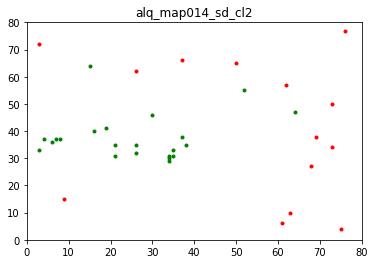

[38.9, 61.1]


Currently mapping.... alq_map015.csv  -->  15
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  25
Total percentage of lab  1  =  41.66666666666667 %
Total no. of lab  2  =  35
Total percentage of lab  2  =  58.333333333333336 %
map saved!!


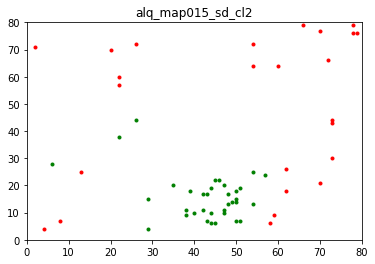

[41.7, 58.3]


Currently mapping.... alq_map016.csv  -->  16
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  21
Total percentage of lab  1  =  56.75675675675676 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  43.24324324324324 %
map saved!!


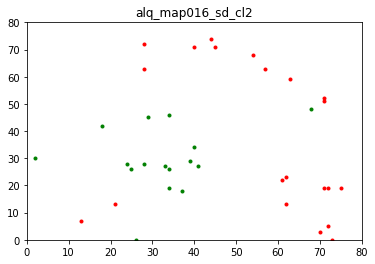

[56.8, 43.2]


Currently mapping.... alq_map017.csv  -->  17
Total no. of points to label.... 26
Label Analysis:-
Total no. of labels:  26
Total no. of lab  1  =  12
Total percentage of lab  1  =  46.15384615384615 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  53.84615384615385 %
map saved!!


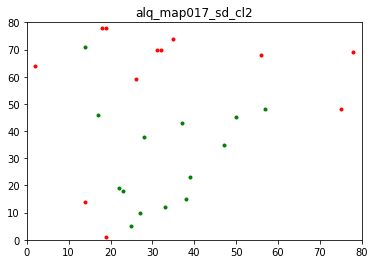

[46.2, 53.8]


Currently mapping.... alq_map018.csv  -->  18
Total no. of points to label.... 51
Label Analysis:-
Total no. of labels:  51
Total no. of lab  1  =  16
Total percentage of lab  1  =  31.372549019607842 %
Total no. of lab  2  =  35
Total percentage of lab  2  =  68.62745098039215 %
map saved!!


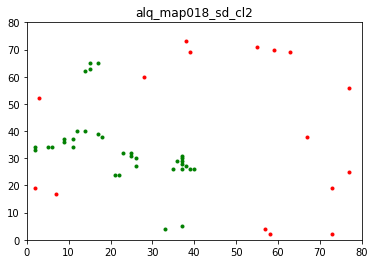

[31.4, 68.6]


Currently mapping.... alq_map019.csv  -->  19
Total no. of points to label.... 17
Label Analysis:-
Total no. of labels:  17
Total no. of lab  1  =  9
Total percentage of lab  1  =  52.94117647058824 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  47.05882352941176 %
map saved!!


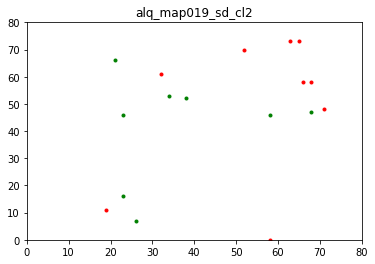

[52.9, 47.1]


Currently mapping.... alq_map020.csv  -->  20
Total no. of points to label.... 33
Label Analysis:-
Total no. of labels:  33
Total no. of lab  1  =  20
Total percentage of lab  1  =  60.60606060606061 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  39.39393939393939 %
map saved!!


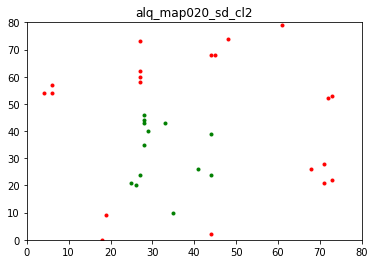

[60.6, 39.4]


Currently mapping.... alq_map021.csv  -->  21
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  26
Total percentage of lab  1  =  63.41463414634146 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  36.58536585365854 %
map saved!!


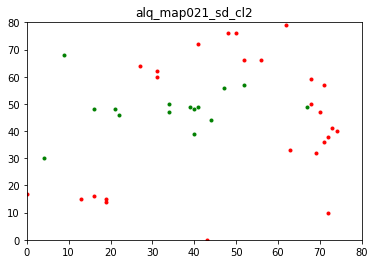

[63.4, 36.6]


Currently mapping.... alq_map022.csv  -->  22
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  26
Total percentage of lab  1  =  81.25 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  18.75 %
map saved!!


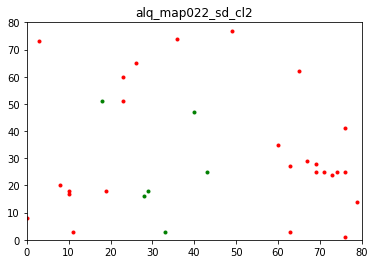

[81.2, 18.8]


Currently mapping.... alq_map023.csv  -->  23
Total no. of points to label.... 28
Label Analysis:-
Total no. of labels:  28
Total no. of lab  1  =  18
Total percentage of lab  1  =  64.28571428571429 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  35.714285714285715 %
map saved!!


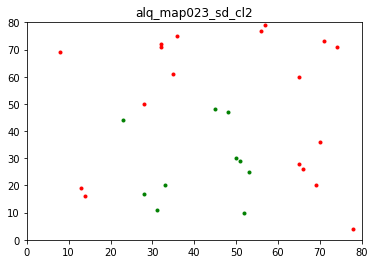

[64.3, 35.7]


Currently mapping.... alq_map024.csv  -->  24
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  17
Total percentage of lab  1  =  53.125 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  46.875 %
map saved!!


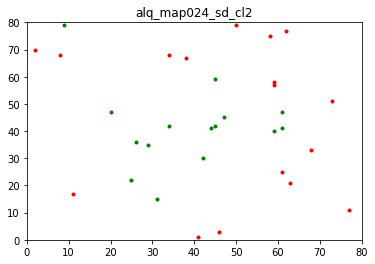

[53.1, 46.9]


Currently mapping.... alq_map025.csv  -->  25
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  22
Total percentage of lab  1  =  51.162790697674424 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  48.837209302325576 %
map saved!!


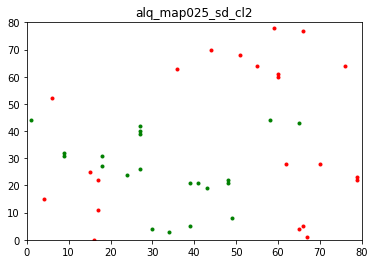

[51.2, 48.8]


Currently mapping.... alq_map026.csv  -->  26
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  13
Total percentage of lab  1  =  40.625 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  59.375 %
map saved!!


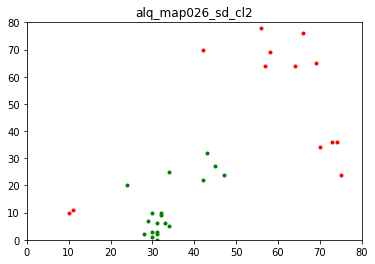

[40.6, 59.4]


Currently mapping.... alq_map027.csv  -->  27
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  26
Total percentage of lab  1  =  72.22222222222221 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  27.77777777777778 %
map saved!!


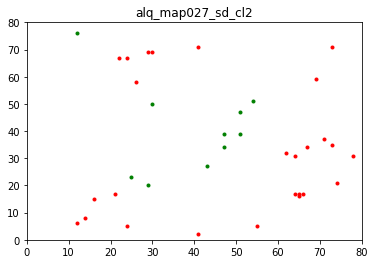

[72.2, 27.8]


Currently mapping.... alq_map028.csv  -->  28
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  23
Total percentage of lab  1  =  44.230769230769226 %
Total no. of lab  2  =  29
Total percentage of lab  2  =  55.769230769230774 %
map saved!!


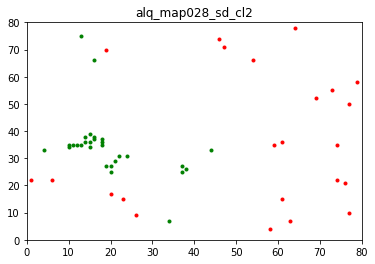

[44.2, 55.8]


Currently mapping.... alq_map029.csv  -->  29
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  20
Total percentage of lab  1  =  46.51162790697674 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  53.48837209302325 %
map saved!!


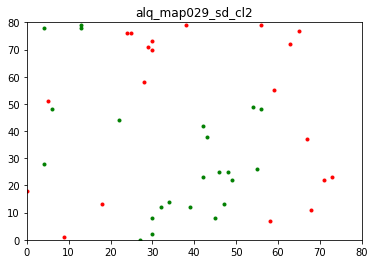

[46.5, 53.5]


Currently mapping.... alq_map030.csv  -->  30
Total no. of points to label.... 54
Label Analysis:-
Total no. of labels:  54
Total no. of lab  1  =  18
Total percentage of lab  1  =  33.33333333333333 %
Total no. of lab  2  =  36
Total percentage of lab  2  =  66.66666666666666 %
map saved!!


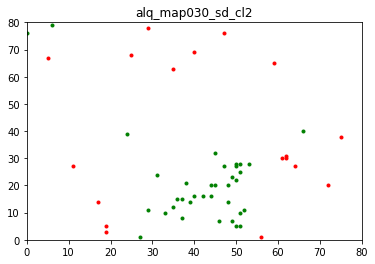

[33.3, 66.7]


Currently mapping.... alq_map031.csv  -->  31
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  31
Total percentage of lab  1  =  75.60975609756098 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  24.390243902439025 %
map saved!!


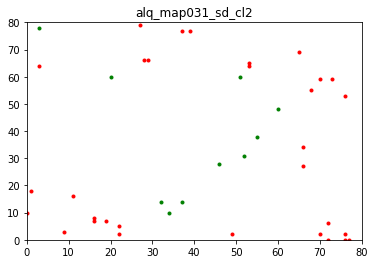

[75.6, 24.4]


Currently mapping.... alq_map032.csv  -->  32
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  15
Total percentage of lab  1  =  25.0 %
Total no. of lab  2  =  45
Total percentage of lab  2  =  75.0 %
map saved!!


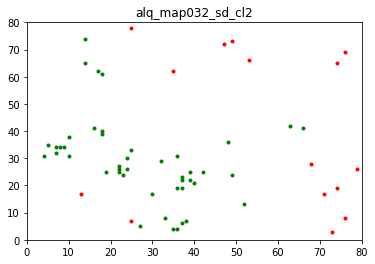

[25.0, 75.0]


Currently mapping.... alq_map033.csv  -->  33
Total no. of points to label.... 84
Label Analysis:-
Total no. of labels:  84
Total no. of lab  1  =  33
Total percentage of lab  1  =  39.285714285714285 %
Total no. of lab  2  =  51
Total percentage of lab  2  =  60.71428571428571 %
map saved!!


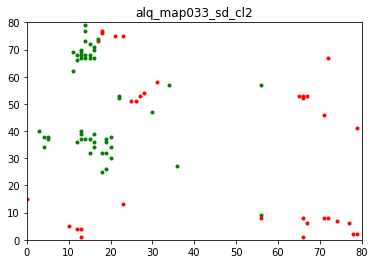

[39.3, 60.7]


Currently mapping.... alq_map034.csv  -->  34
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  19
Total percentage of lab  1  =  36.53846153846153 %
Total no. of lab  2  =  33
Total percentage of lab  2  =  63.46153846153846 %
map saved!!


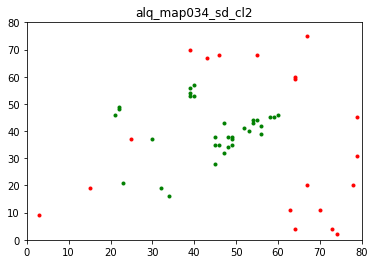

[36.5, 63.5]


Currently mapping.... alq_map035.csv  -->  35
Total no. of points to label.... 64
Label Analysis:-
Total no. of labels:  64
Total no. of lab  1  =  38
Total percentage of lab  1  =  59.375 %
Total no. of lab  2  =  26
Total percentage of lab  2  =  40.625 %
map saved!!


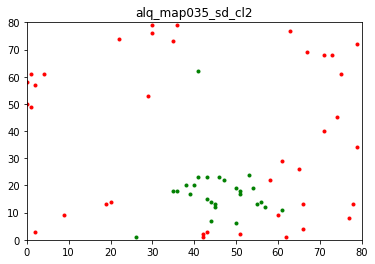

[59.4, 40.6]


Currently mapping.... alq_map036.csv  -->  36
Total no. of points to label.... 69
Label Analysis:-
Total no. of labels:  69
Total no. of lab  1  =  15
Total percentage of lab  1  =  21.73913043478261 %
Total no. of lab  2  =  54
Total percentage of lab  2  =  78.26086956521739 %
map saved!!


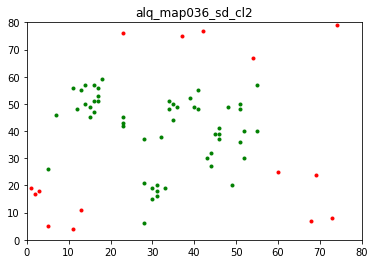

[21.7, 78.3]


Currently mapping.... alq_map037.csv  -->  37
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  19
Total percentage of lab  1  =  52.77777777777778 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  47.22222222222222 %
map saved!!


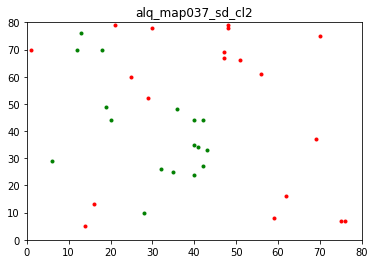

[52.8, 47.2]


Currently mapping.... alq_map038.csv  -->  38
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  20
Total percentage of lab  1  =  46.51162790697674 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  53.48837209302325 %
map saved!!


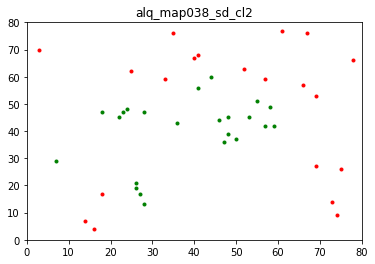

[46.5, 53.5]


Currently mapping.... alq_map039.csv  -->  39
Total no. of points to label.... 46
Label Analysis:-
Total no. of labels:  46
Total no. of lab  1  =  23
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  50.0 %
map saved!!


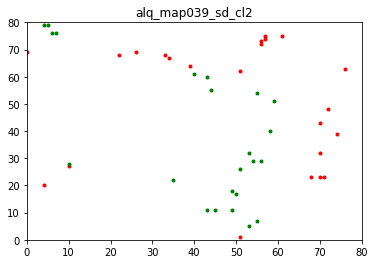

[50.0, 50.0]


Currently mapping.... alq_map040.csv  -->  40
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  17
Total percentage of lab  1  =  54.83870967741935 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  45.16129032258064 %
map saved!!


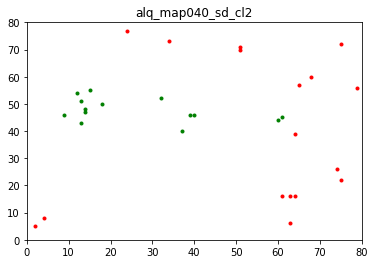

[54.8, 45.2]


Currently mapping.... alq_map041.csv  -->  41
Total no. of points to label.... 34
Label Analysis:-
Total no. of labels:  34
Total no. of lab  1  =  15
Total percentage of lab  1  =  44.11764705882353 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  55.88235294117647 %
map saved!!


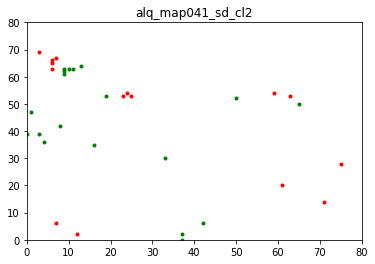

[44.1, 55.9]


Currently mapping.... alq_map042.csv  -->  42
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  10
Total percentage of lab  1  =  26.31578947368421 %
Total no. of lab  2  =  28
Total percentage of lab  2  =  73.68421052631578 %
map saved!!


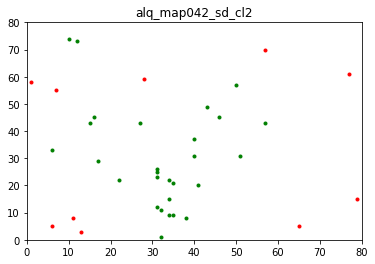

[26.3, 73.7]


Currently mapping.... alq_map043.csv  -->  43
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  18
Total percentage of lab  1  =  66.66666666666666 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  33.33333333333333 %
map saved!!


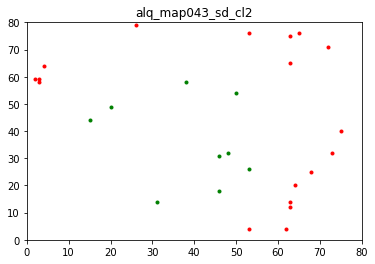

[66.7, 33.3]


Currently mapping.... alq_map044.csv  -->  44
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  19
Total percentage of lab  1  =  46.34146341463415 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  53.65853658536586 %
map saved!!


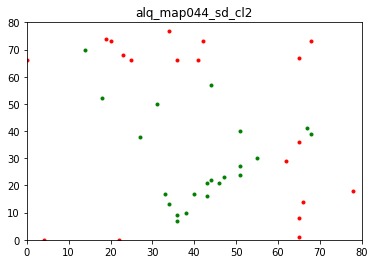

[46.3, 53.7]


Currently mapping.... alq_map045.csv  -->  45
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  12
Total percentage of lab  1  =  29.268292682926827 %
Total no. of lab  2  =  29
Total percentage of lab  2  =  70.73170731707317 %
map saved!!


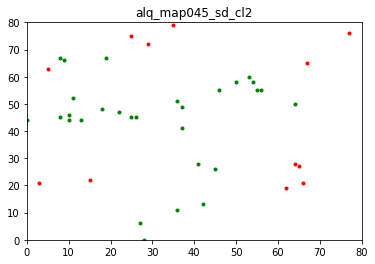

[29.3, 70.7]


Currently mapping.... alq_map046.csv  -->  46
Total no. of points to label.... 26
Label Analysis:-
Total no. of labels:  26
Total no. of lab  1  =  19
Total percentage of lab  1  =  73.07692307692307 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  26.923076923076923 %
map saved!!


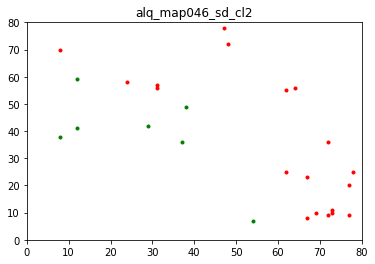

[73.1, 26.9]


Currently mapping.... alq_map047.csv  -->  47
Total no. of points to label.... 24
Label Analysis:-
Total no. of labels:  24
Total no. of lab  1  =  13
Total percentage of lab  1  =  54.166666666666664 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  45.83333333333333 %
map saved!!


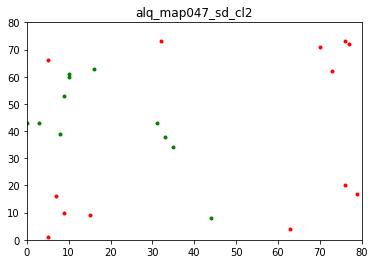

[54.2, 45.8]


Currently mapping.... alq_map048.csv  -->  48
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  17
Total percentage of lab  1  =  42.5 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  57.49999999999999 %
map saved!!


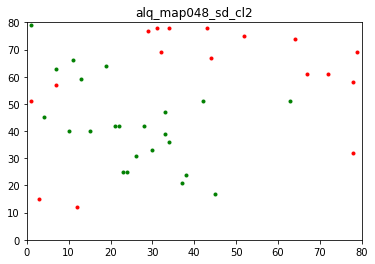

[42.5, 57.5]


Currently mapping.... alq_map049.csv  -->  49
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  17
Total percentage of lab  1  =  44.73684210526316 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  55.26315789473685 %
map saved!!


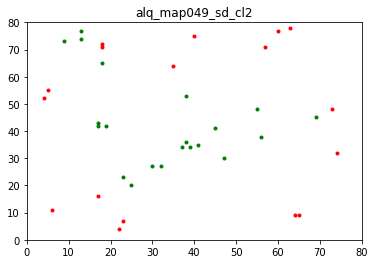

[44.7, 55.3]


Currently mapping.... alq_map050.csv  -->  50
Total no. of points to label.... 125
Label Analysis:-
Total no. of labels:  125
Total no. of lab  1  =  35
Total percentage of lab  1  =  28.000000000000004 %
Total no. of lab  2  =  90
Total percentage of lab  2  =  72.0 %
map saved!!


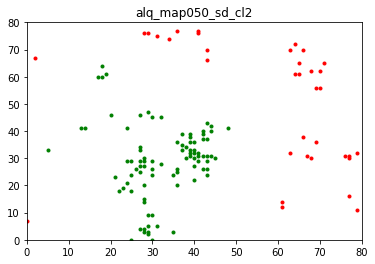

[28.0, 72.0]


Currently mapping.... alq_map051.csv  -->  51
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  33
Total percentage of lab  1  =  55.00000000000001 %
Total no. of lab  2  =  27
Total percentage of lab  2  =  45.0 %
map saved!!


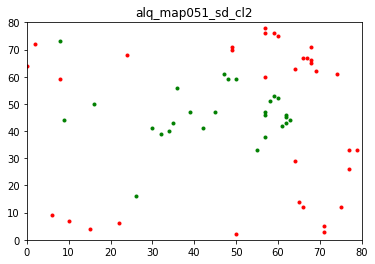

[55.0, 45.0]


Currently mapping.... alq_map052.csv  -->  52
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  21
Total percentage of lab  1  =  40.38461538461539 %
Total no. of lab  2  =  31
Total percentage of lab  2  =  59.61538461538461 %
map saved!!


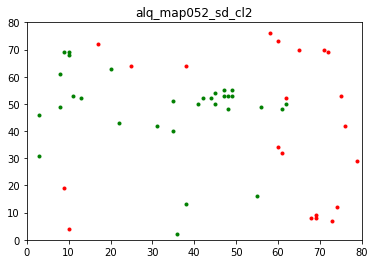

[40.4, 59.6]


Currently mapping.... alq_map053.csv  -->  53
Total no. of points to label.... 51
Label Analysis:-
Total no. of labels:  51
Total no. of lab  1  =  22
Total percentage of lab  1  =  43.13725490196079 %
Total no. of lab  2  =  29
Total percentage of lab  2  =  56.86274509803921 %
map saved!!


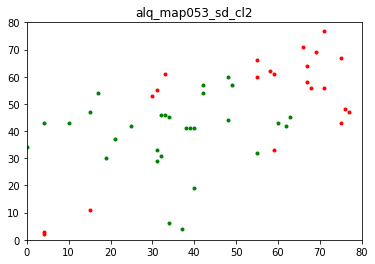

[43.1, 56.9]


Currently mapping.... alq_map054.csv  -->  54
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  21
Total percentage of lab  1  =  58.333333333333336 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  41.66666666666667 %
map saved!!


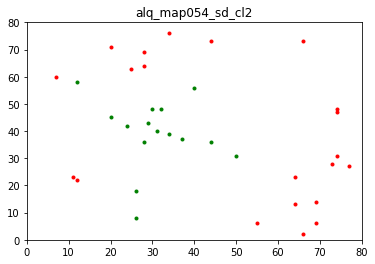

[58.3, 41.7]


Currently mapping.... alq_map055.csv  -->  55
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  21
Total percentage of lab  1  =  28.000000000000004 %
Total no. of lab  2  =  54
Total percentage of lab  2  =  72.0 %
map saved!!


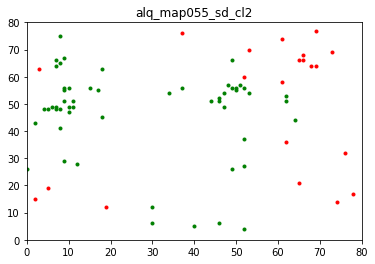

[28.0, 72.0]


Currently mapping.... alq_map056.csv  -->  56
Total no. of points to label.... 19
Label Analysis:-
Total no. of labels:  19
Total no. of lab  1  =  12
Total percentage of lab  1  =  63.1578947368421 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  36.84210526315789 %
map saved!!


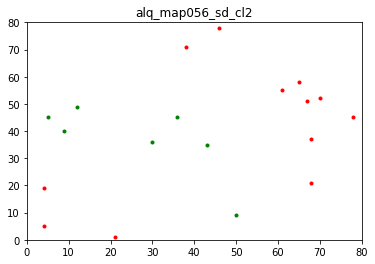

[63.2, 36.8]


Currently mapping.... alq_map057.csv  -->  57
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  14
Total percentage of lab  1  =  37.83783783783784 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  62.16216216216216 %
map saved!!


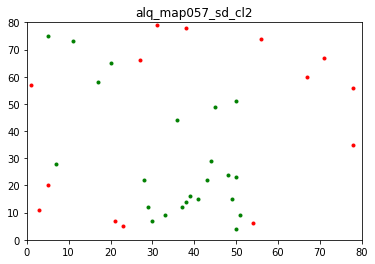

[37.8, 62.2]


Currently mapping.... alq_map058.csv  -->  58
Total no. of points to label.... 44
Label Analysis:-
Total no. of labels:  44
Total no. of lab  1  =  22
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  50.0 %
map saved!!


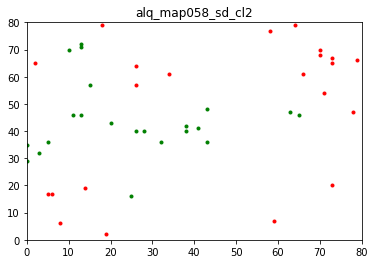

[50.0, 50.0]


Currently mapping.... alq_map059.csv  -->  59
Total no. of points to label.... 33
Label Analysis:-
Total no. of labels:  33
Total no. of lab  1  =  19
Total percentage of lab  1  =  57.57575757575758 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  42.42424242424242 %
map saved!!


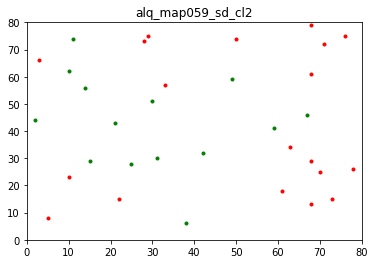

[57.6, 42.4]


Currently mapping.... alq_map060.csv  -->  60
Total no. of points to label.... 62
Label Analysis:-
Total no. of labels:  62
Total no. of lab  1  =  34
Total percentage of lab  1  =  54.83870967741935 %
Total no. of lab  2  =  28
Total percentage of lab  2  =  45.16129032258064 %
map saved!!


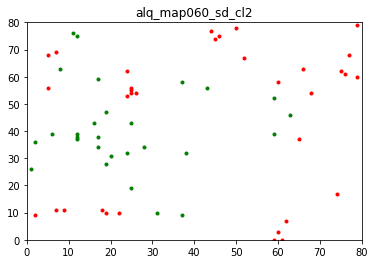

[54.8, 45.2]


Currently mapping.... alq_map061.csv  -->  61
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  20
Total percentage of lab  1  =  48.78048780487805 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  51.21951219512195 %
map saved!!


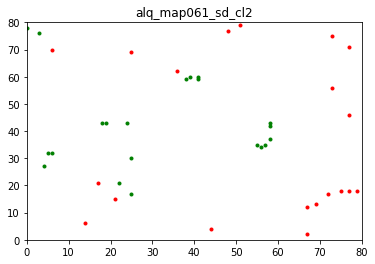

[48.8, 51.2]


Currently mapping.... alq_map062.csv  -->  62
Total no. of points to label.... 24
Label Analysis:-
Total no. of labels:  24
Total no. of lab  1  =  14
Total percentage of lab  1  =  58.333333333333336 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  41.66666666666667 %
map saved!!


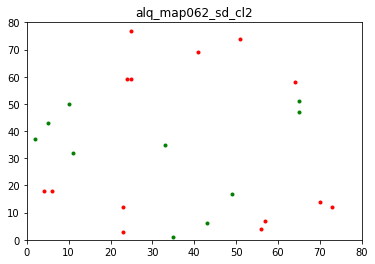

[58.3, 41.7]


Currently mapping.... alq_map063.csv  -->  63
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  29
Total percentage of lab  1  =  67.44186046511628 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  32.55813953488372 %
map saved!!


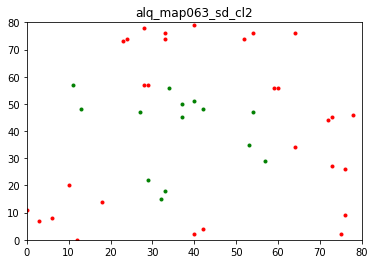

[67.4, 32.6]


Currently mapping.... alq_map064.csv  -->  64
Total no. of points to label.... 50
Label Analysis:-
Total no. of labels:  50
Total no. of lab  1  =  28
Total percentage of lab  1  =  56.00000000000001 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  44.0 %
map saved!!


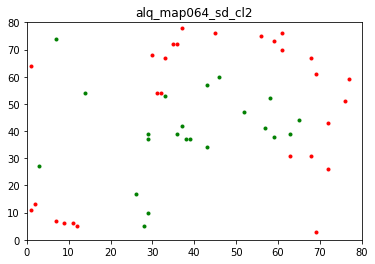

[56.0, 44.0]


Currently mapping.... alq_map065.csv  -->  65
Total no. of points to label.... 44
Label Analysis:-
Total no. of labels:  44
Total no. of lab  1  =  29
Total percentage of lab  1  =  65.9090909090909 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  34.090909090909086 %
map saved!!


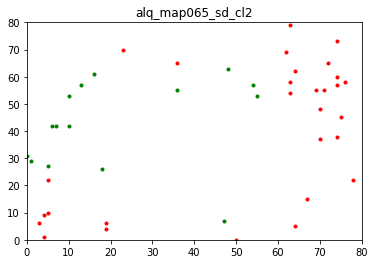

[65.9, 34.1]


Currently mapping.... alq_map066.csv  -->  66
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  28
Total percentage of lab  1  =  45.90163934426229 %
Total no. of lab  2  =  33
Total percentage of lab  2  =  54.09836065573771 %
map saved!!


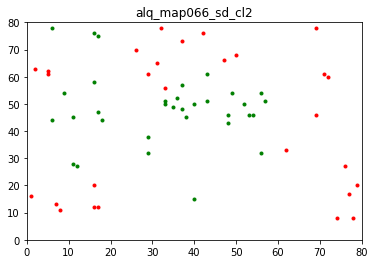

[45.9, 54.1]


Currently mapping.... alq_map067.csv  -->  67
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  19
Total percentage of lab  1  =  52.77777777777778 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  47.22222222222222 %
map saved!!


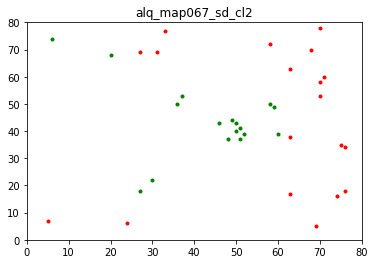

[52.8, 47.2]


Currently mapping.... alq_map068.csv  -->  68
Total no. of points to label.... 45
Label Analysis:-
Total no. of labels:  45
Total no. of lab  1  =  22
Total percentage of lab  1  =  48.888888888888886 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  51.11111111111111 %
map saved!!


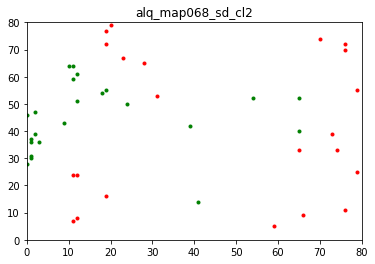

[48.9, 51.1]


Currently mapping.... alq_map069.csv  -->  69
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  37
Total percentage of lab  1  =  71.15384615384616 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  28.846153846153843 %
map saved!!


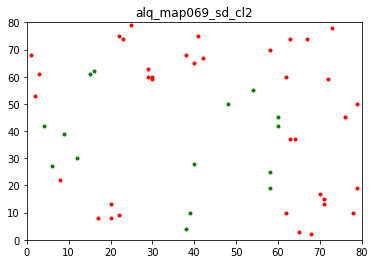

[71.2, 28.8]


Currently mapping.... alq_map070.csv  -->  70
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  21
Total percentage of lab  1  =  35.0 %
Total no. of lab  2  =  39
Total percentage of lab  2  =  65.0 %
map saved!!


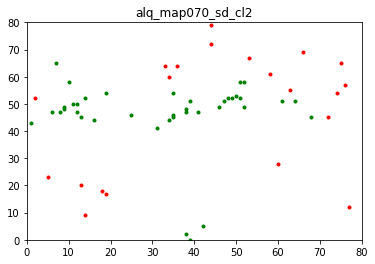

[35.0, 65.0]


Currently mapping.... alq_map071.csv  -->  71
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  21
Total percentage of lab  1  =  40.38461538461539 %
Total no. of lab  2  =  31
Total percentage of lab  2  =  59.61538461538461 %
map saved!!


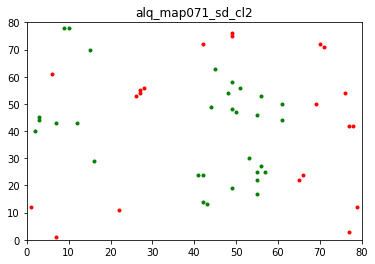

[40.4, 59.6]


Currently mapping.... alq_map072.csv  -->  72
Total no. of points to label.... 62
Label Analysis:-
Total no. of labels:  62
Total no. of lab  1  =  21
Total percentage of lab  1  =  33.87096774193548 %
Total no. of lab  2  =  41
Total percentage of lab  2  =  66.12903225806451 %
map saved!!


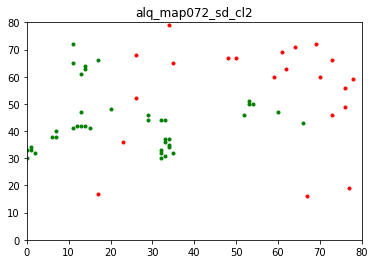

[33.9, 66.1]


Currently mapping.... alq_map073.csv  -->  73
Total no. of points to label.... 85
Label Analysis:-
Total no. of labels:  85
Total no. of lab  1  =  29
Total percentage of lab  1  =  34.11764705882353 %
Total no. of lab  2  =  56
Total percentage of lab  2  =  65.88235294117646 %
map saved!!


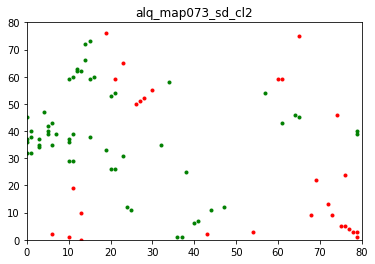

[34.1, 65.9]


Currently mapping.... alq_map074.csv  -->  74
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  32
Total percentage of lab  1  =  55.172413793103445 %
Total no. of lab  2  =  26
Total percentage of lab  2  =  44.827586206896555 %
map saved!!


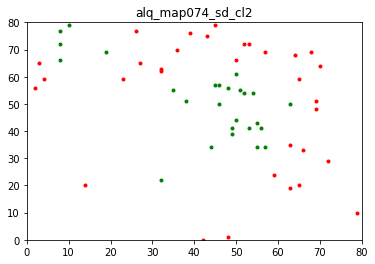

[55.2, 44.8]


Currently mapping.... alq_map075.csv  -->  75
Total no. of points to label.... 59
Label Analysis:-
Total no. of labels:  59
Total no. of lab  1  =  25
Total percentage of lab  1  =  42.3728813559322 %
Total no. of lab  2  =  34
Total percentage of lab  2  =  57.6271186440678 %
map saved!!


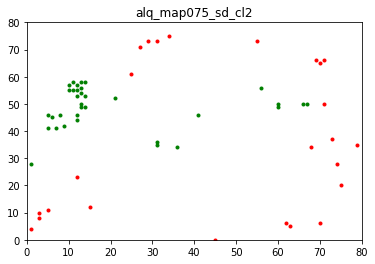

[42.4, 57.6]


Currently mapping.... alq_map076.csv  -->  76
Total no. of points to label.... 72
Label Analysis:-
Total no. of labels:  72
Total no. of lab  1  =  14
Total percentage of lab  1  =  19.444444444444446 %
Total no. of lab  2  =  58
Total percentage of lab  2  =  80.55555555555556 %
map saved!!


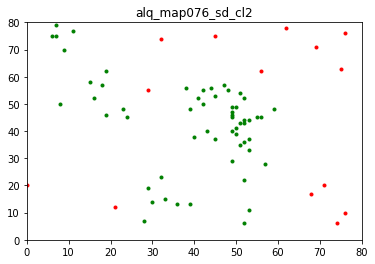

[19.4, 80.6]


Currently mapping.... alq_map077.csv  -->  77
Total no. of points to label.... 42
Label Analysis:-
Total no. of labels:  42
Total no. of lab  1  =  34
Total percentage of lab  1  =  80.95238095238095 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  19.047619047619047 %
map saved!!


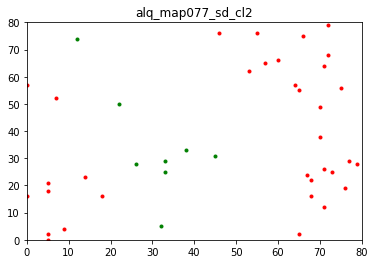

[81.0, 19.0]


Currently mapping.... alq_map078.csv  -->  78
Total no. of points to label.... 63
Label Analysis:-
Total no. of labels:  63
Total no. of lab  1  =  29
Total percentage of lab  1  =  46.03174603174603 %
Total no. of lab  2  =  34
Total percentage of lab  2  =  53.96825396825397 %
map saved!!


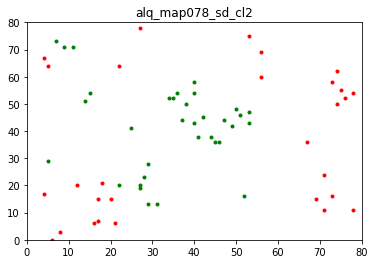

[46.0, 54.0]


Currently mapping.... alq_map079.csv  -->  79
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  21
Total percentage of lab  1  =  52.5 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  47.5 %
map saved!!


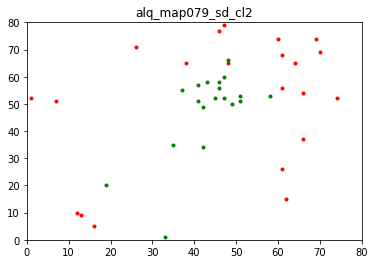

[52.5, 47.5]


Currently mapping.... alq_map080.csv  -->  80
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  29
Total percentage of lab  1  =  80.55555555555556 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  19.444444444444446 %
map saved!!


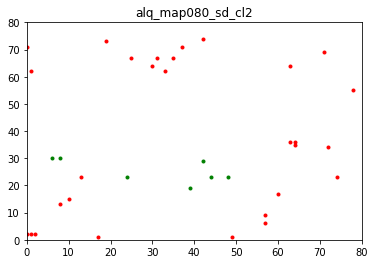

[80.6, 19.4]


Currently mapping.... alq_map081.csv  -->  81
Total no. of points to label.... 77
Label Analysis:-
Total no. of labels:  77
Total no. of lab  1  =  47
Total percentage of lab  1  =  61.038961038961034 %
Total no. of lab  2  =  30
Total percentage of lab  2  =  38.961038961038966 %
map saved!!


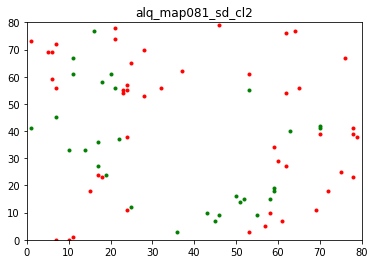

[61.0, 39.0]


Currently mapping.... alq_map082.csv  -->  82
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  17
Total percentage of lab  1  =  47.22222222222222 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  52.77777777777778 %
map saved!!


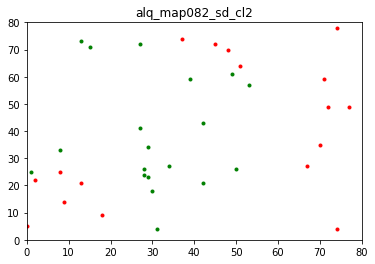

[47.2, 52.8]


Currently mapping.... alq_map083.csv  -->  83
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  21
Total percentage of lab  1  =  48.837209302325576 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  51.162790697674424 %
map saved!!


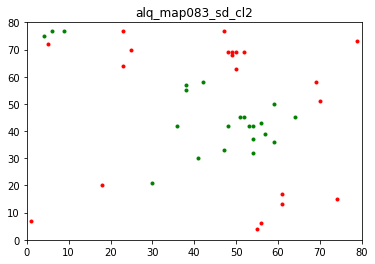

[48.8, 51.2]


Currently mapping.... alq_map084.csv  -->  84
Total no. of points to label.... 49
Label Analysis:-
Total no. of labels:  49
Total no. of lab  1  =  25
Total percentage of lab  1  =  51.02040816326531 %
Total no. of lab  2  =  24
Total percentage of lab  2  =  48.97959183673469 %
map saved!!


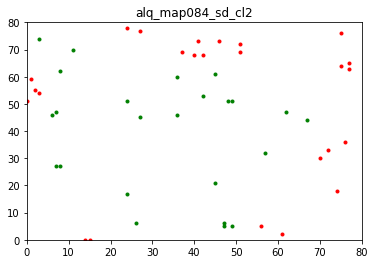

[51.0, 49.0]


Currently mapping.... alq_map085.csv  -->  85
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  35
Total percentage of lab  1  =  60.3448275862069 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  39.6551724137931 %
map saved!!


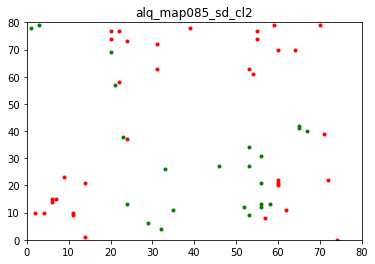

[60.3, 39.7]


Currently mapping.... alq_map086.csv  -->  86
Total no. of points to label.... 74
Label Analysis:-
Total no. of labels:  74
Total no. of lab  1  =  43
Total percentage of lab  1  =  58.108108108108105 %
Total no. of lab  2  =  31
Total percentage of lab  2  =  41.891891891891895 %
map saved!!


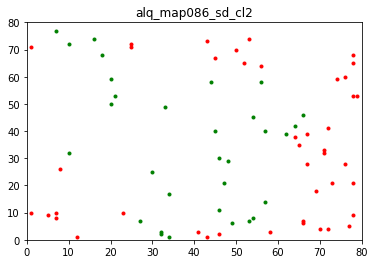

[58.1, 41.9]


Currently mapping.... alq_map087.csv  -->  87
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  21
Total percentage of lab  1  =  48.837209302325576 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  51.162790697674424 %
map saved!!


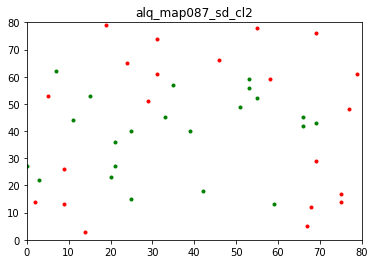

[48.8, 51.2]


Currently mapping.... alq_map088.csv  -->  88
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  37
Total percentage of lab  1  =  49.333333333333336 %
Total no. of lab  2  =  38
Total percentage of lab  2  =  50.66666666666667 %
map saved!!


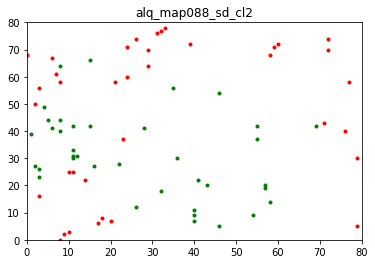

[49.3, 50.7]


Currently mapping.... alq_map089.csv  -->  89
Total no. of points to label.... 68
Label Analysis:-
Total no. of labels:  68
Total no. of lab  1  =  30
Total percentage of lab  1  =  44.11764705882353 %
Total no. of lab  2  =  38
Total percentage of lab  2  =  55.88235294117647 %
map saved!!


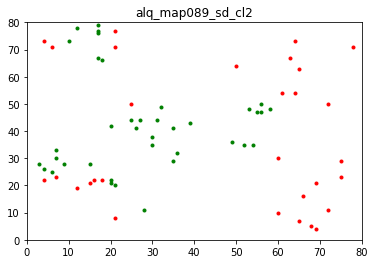

[44.1, 55.9]


Currently mapping.... alq_map090.csv  -->  90
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  37
Total percentage of lab  1  =  45.1219512195122 %
Total no. of lab  2  =  45
Total percentage of lab  2  =  54.87804878048781 %
map saved!!


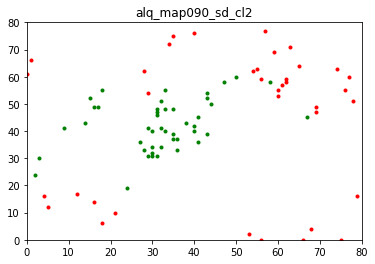

[45.1, 54.9]


Currently mapping.... alq_map091.csv  -->  91
Total no. of points to label.... 65
Label Analysis:-
Total no. of labels:  65
Total no. of lab  1  =  30
Total percentage of lab  1  =  46.15384615384615 %
Total no. of lab  2  =  35
Total percentage of lab  2  =  53.84615384615385 %
map saved!!


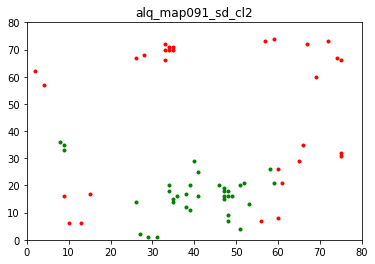

[46.2, 53.8]


Currently mapping.... alq_map092.csv  -->  92
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  41
Total percentage of lab  1  =  70.6896551724138 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  29.310344827586203 %
map saved!!


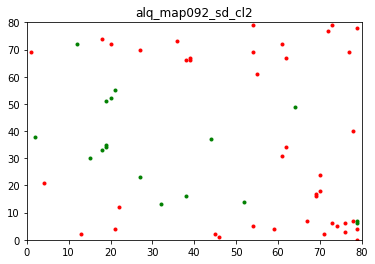

[70.7, 29.3]


Currently mapping.... alq_map093.csv  -->  93
Total no. of points to label.... 46
Label Analysis:-
Total no. of labels:  46
Total no. of lab  1  =  38
Total percentage of lab  1  =  82.6086956521739 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  17.391304347826086 %
map saved!!


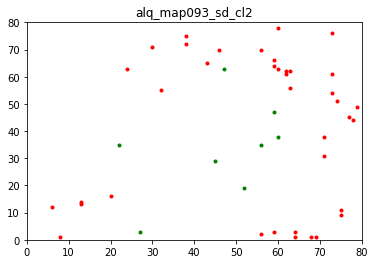

[82.6, 17.4]


Currently mapping.... alq_map094.csv  -->  94
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  40
Total percentage of lab  1  =  65.57377049180327 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  34.42622950819672 %
map saved!!


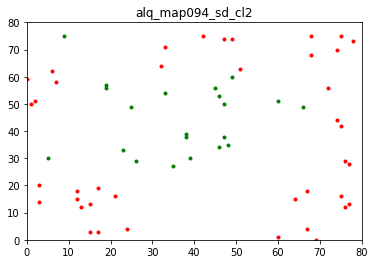

[65.6, 34.4]


Currently mapping.... alq_map095.csv  -->  95
Total no. of points to label.... 84
Label Analysis:-
Total no. of labels:  84
Total no. of lab  1  =  25
Total percentage of lab  1  =  29.761904761904763 %
Total no. of lab  2  =  59
Total percentage of lab  2  =  70.23809523809523 %
map saved!!


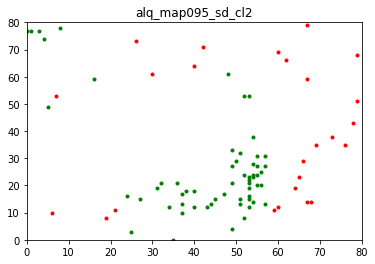

[29.8, 70.2]


Currently mapping.... alq_map096.csv  -->  96
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  19
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  50.0 %
map saved!!


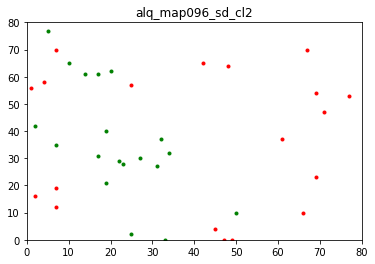

[50.0, 50.0]


Currently mapping.... alq_map097.csv  -->  97
Total no. of points to label.... 47
Label Analysis:-
Total no. of labels:  47
Total no. of lab  1  =  22
Total percentage of lab  1  =  46.808510638297875 %
Total no. of lab  2  =  25
Total percentage of lab  2  =  53.191489361702125 %
map saved!!


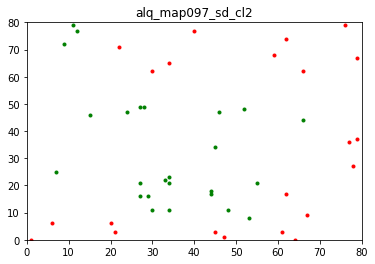

[46.8, 53.2]


Currently mapping.... alq_map098.csv  -->  98
Total no. of points to label.... 88
Label Analysis:-
Total no. of labels:  88
Total no. of lab  1  =  51
Total percentage of lab  1  =  57.95454545454546 %
Total no. of lab  2  =  37
Total percentage of lab  2  =  42.04545454545455 %
map saved!!


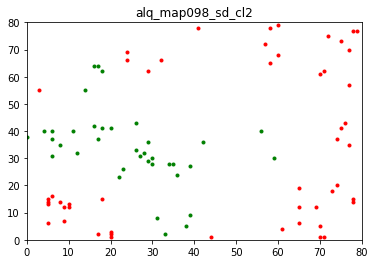

[58.0, 42.0]


Currently mapping.... alq_map099.csv  -->  99
Total no. of points to label.... 64
Label Analysis:-
Total no. of labels:  64
Total no. of lab  1  =  35
Total percentage of lab  1  =  54.6875 %
Total no. of lab  2  =  29
Total percentage of lab  2  =  45.3125 %
map saved!!


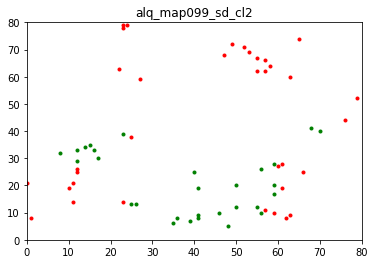

[54.7, 45.3]


Currently mapping.... alq_map100.csv  -->  100
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  24
Total percentage of lab  1  =  46.15384615384615 %
Total no. of lab  2  =  28
Total percentage of lab  2  =  53.84615384615385 %
map saved!!


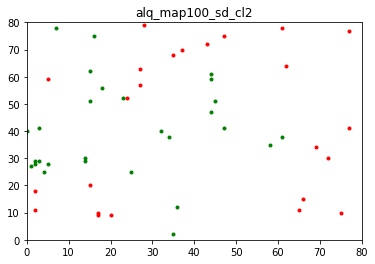

[46.2, 53.8]


Currently mapping.... alq_map101.csv  -->  101
Total no. of points to label.... 69
Label Analysis:-
Total no. of labels:  69
Total no. of lab  1  =  53
Total percentage of lab  1  =  76.81159420289855 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  23.18840579710145 %
map saved!!


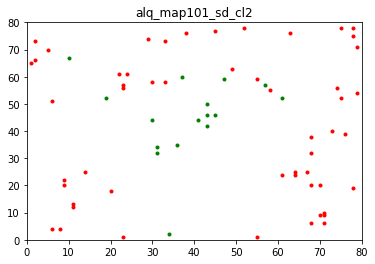

[76.8, 23.2]


Currently mapping.... alq_map102.csv  -->  102
Total no. of points to label.... 71
Label Analysis:-
Total no. of labels:  71
Total no. of lab  1  =  48
Total percentage of lab  1  =  67.6056338028169 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  32.3943661971831 %
map saved!!


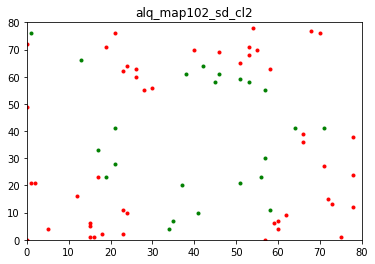

[67.6, 32.4]


Currently mapping.... alq_map103.csv  -->  103
Total no. of points to label.... 42
Label Analysis:-
Total no. of labels:  42
Total no. of lab  1  =  22
Total percentage of lab  1  =  52.38095238095239 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  47.61904761904761 %
map saved!!


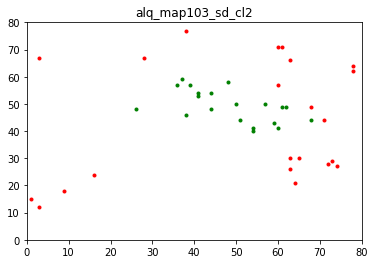

[52.4, 47.6]


Currently mapping.... alq_map104.csv  -->  104
Total no. of points to label.... 68
Label Analysis:-
Total no. of labels:  68
Total no. of lab  1  =  46
Total percentage of lab  1  =  67.64705882352942 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  32.35294117647059 %
map saved!!


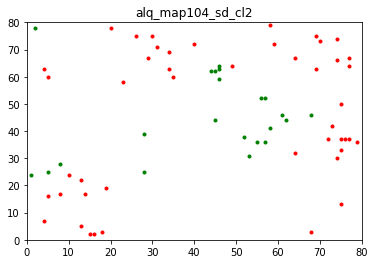

[67.6, 32.4]


Currently mapping.... alq_map105.csv  -->  105
Total no. of points to label.... 59
Label Analysis:-
Total no. of labels:  59
Total no. of lab  1  =  32
Total percentage of lab  1  =  54.23728813559322 %
Total no. of lab  2  =  27
Total percentage of lab  2  =  45.76271186440678 %
map saved!!


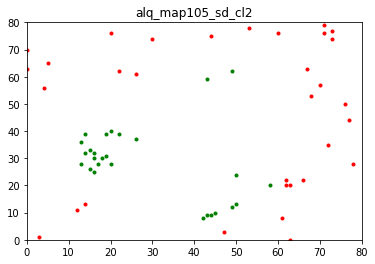

[54.2, 45.8]


Currently mapping.... alq_map106.csv  -->  106
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  40
Total percentage of lab  1  =  65.57377049180327 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  34.42622950819672 %
map saved!!


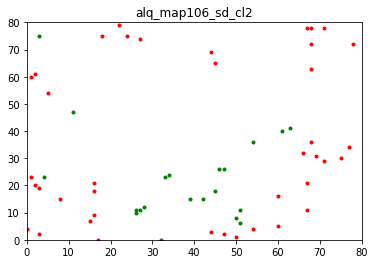

[65.6, 34.4]


Currently mapping.... alq_map107.csv  -->  107
Total no. of points to label.... 55
Label Analysis:-
Total no. of labels:  55
Total no. of lab  1  =  35
Total percentage of lab  1  =  63.63636363636363 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  36.36363636363637 %
map saved!!


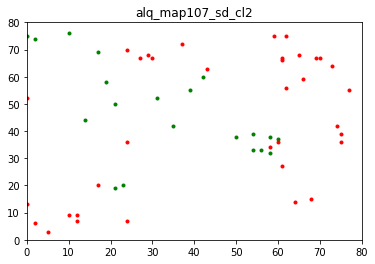

[63.6, 36.4]


Currently mapping.... alq_map108.csv  -->  108
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  49
Total percentage of lab  1  =  59.756097560975604 %
Total no. of lab  2  =  33
Total percentage of lab  2  =  40.243902439024396 %
map saved!!


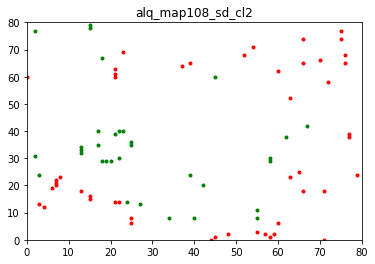

[59.8, 40.2]


Currently mapping.... alq_map109.csv  -->  109
Total no. of points to label.... 95
Label Analysis:-
Total no. of labels:  95
Total no. of lab  1  =  44
Total percentage of lab  1  =  46.31578947368421 %
Total no. of lab  2  =  51
Total percentage of lab  2  =  53.68421052631579 %
map saved!!


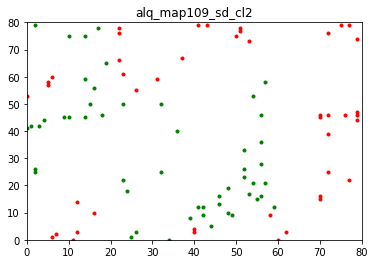

[46.3, 53.7]


Currently mapping.... alq_map110.csv  -->  110
Total no. of points to label.... 77
Label Analysis:-
Total no. of labels:  77
Total no. of lab  1  =  43
Total percentage of lab  1  =  55.84415584415584 %
Total no. of lab  2  =  34
Total percentage of lab  2  =  44.15584415584416 %
map saved!!


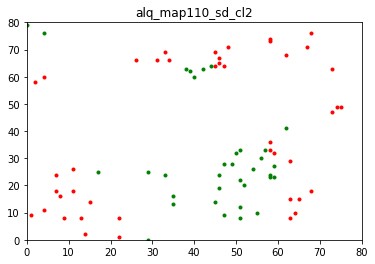

[55.8, 44.2]


Currently mapping.... alq_map111.csv  -->  111
Total no. of points to label.... 141
Label Analysis:-
Total no. of labels:  141
Total no. of lab  1  =  42
Total percentage of lab  1  =  29.78723404255319 %
Total no. of lab  2  =  99
Total percentage of lab  2  =  70.2127659574468 %
map saved!!


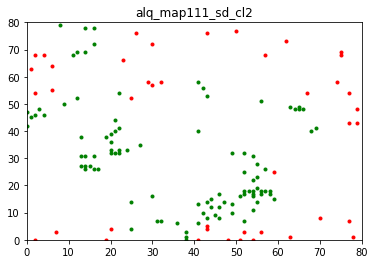

[29.8, 70.2]


Currently mapping.... alq_map112.csv  -->  112
Total no. of points to label.... 96
Label Analysis:-
Total no. of labels:  96
Total no. of lab  1  =  65
Total percentage of lab  1  =  67.70833333333334 %
Total no. of lab  2  =  31
Total percentage of lab  2  =  32.29166666666667 %
map saved!!


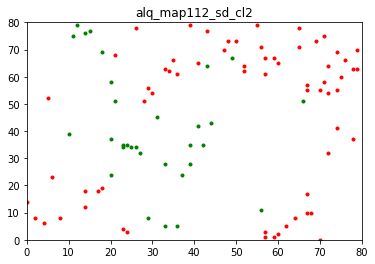

[67.7, 32.3]


Currently mapping.... alq_map113.csv  -->  113
Total no. of points to label.... 76
Label Analysis:-
Total no. of labels:  76
Total no. of lab  1  =  46
Total percentage of lab  1  =  60.526315789473685 %
Total no. of lab  2  =  30
Total percentage of lab  2  =  39.473684210526315 %
map saved!!


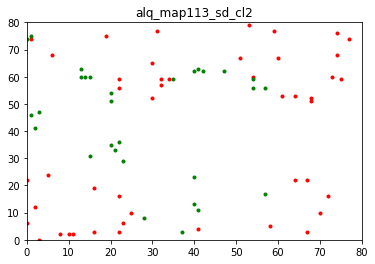

[60.5, 39.5]


Currently mapping.... alq_map114.csv  -->  114
Total no. of points to label.... 71
Label Analysis:-
Total no. of labels:  71
Total no. of lab  1  =  45
Total percentage of lab  1  =  63.38028169014085 %
Total no. of lab  2  =  26
Total percentage of lab  2  =  36.61971830985916 %
map saved!!


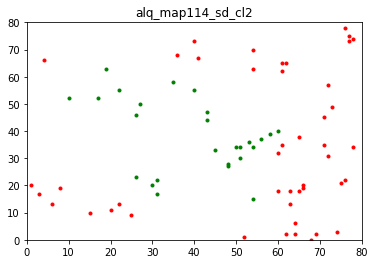

[63.4, 36.6]


Currently mapping.... alq_map115.csv  -->  115
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  43
Total percentage of lab  1  =  52.4390243902439 %
Total no. of lab  2  =  39
Total percentage of lab  2  =  47.5609756097561 %
map saved!!


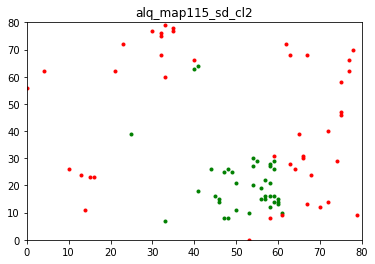

[52.4, 47.6]


Currently mapping.... alq_map116.csv  -->  116
Total no. of points to label.... 112
Label Analysis:-
Total no. of labels:  112
Total no. of lab  1  =  44
Total percentage of lab  1  =  39.285714285714285 %
Total no. of lab  2  =  68
Total percentage of lab  2  =  60.71428571428571 %
map saved!!


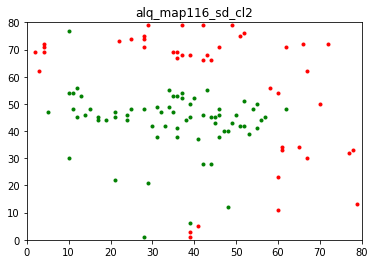

[39.3, 60.7]


Currently mapping.... alq_map117.csv  -->  117
Total no. of points to label.... 93
Label Analysis:-
Total no. of labels:  93
Total no. of lab  1  =  51
Total percentage of lab  1  =  54.83870967741935 %
Total no. of lab  2  =  42
Total percentage of lab  2  =  45.16129032258064 %
map saved!!


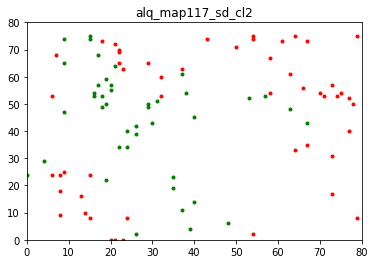

[54.8, 45.2]


Currently mapping.... alq_map118.csv  -->  118
Total no. of points to label.... 108
Label Analysis:-
Total no. of labels:  108
Total no. of lab  1  =  72
Total percentage of lab  1  =  66.66666666666666 %
Total no. of lab  2  =  36
Total percentage of lab  2  =  33.33333333333333 %
map saved!!


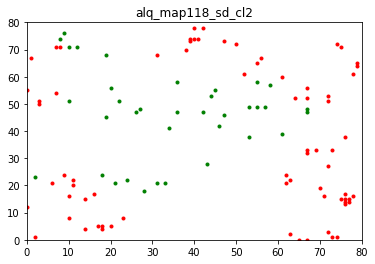

[66.7, 33.3]


Currently mapping.... alq_map119.csv  -->  119
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  38
Total percentage of lab  1  =  50.66666666666667 %
Total no. of lab  2  =  37
Total percentage of lab  2  =  49.333333333333336 %
map saved!!


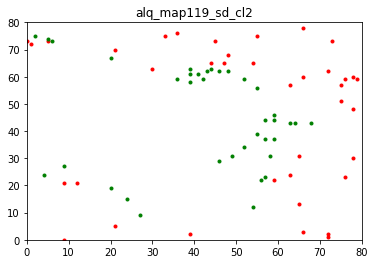

[50.7, 49.3]




In [59]:
alq_sd = pseudo_classifier_label(num_npy, sd_remap['al_sdl'], tr_map['aln_re_id.csv'], alq_map, 
                                 80, "_sd_cl2", "results", True)

Currently mapping.... alq_map000.csv  -->  0
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  11
Total percentage of lab  1  =  29.72972972972973 %
Total no. of lab  2  =  26
Total percentage of lab  2  =  70.27027027027027 %
map saved!!


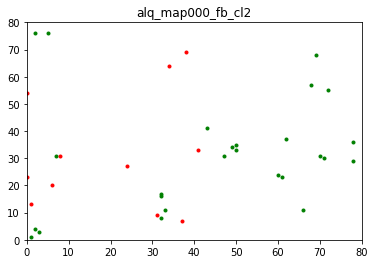

[29.7, 70.3]


Currently mapping.... alq_map001.csv  -->  1
Total no. of points to label.... 30
Label Analysis:-
Total no. of labels:  30
Total no. of lab  1  =  15
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  50.0 %
map saved!!


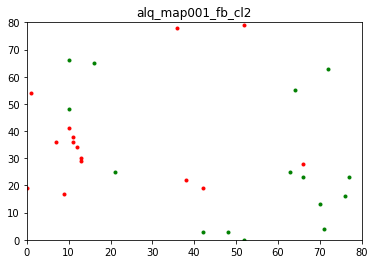

[50.0, 50.0]


Currently mapping.... alq_map002.csv  -->  2
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  17
Total percentage of lab  1  =  62.96296296296296 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  37.03703703703704 %
map saved!!


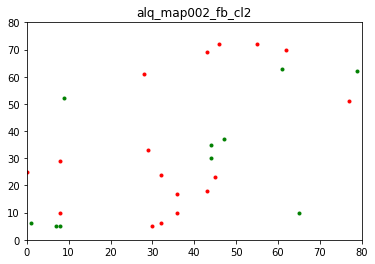

[63.0, 37.0]


Currently mapping.... alq_map003.csv  -->  3
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  18
Total percentage of lab  1  =  45.0 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  55.00000000000001 %
map saved!!


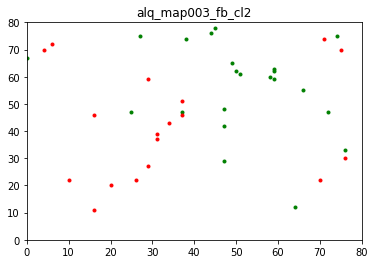

[45.0, 55.0]


Currently mapping.... alq_map004.csv  -->  4
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  17
Total percentage of lab  1  =  62.96296296296296 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  37.03703703703704 %
map saved!!


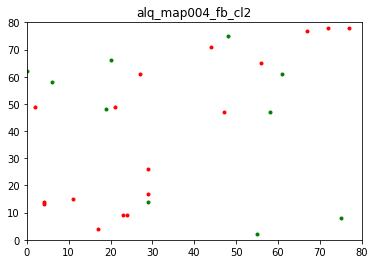

[63.0, 37.0]


Currently mapping.... alq_map005.csv  -->  5
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  16
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  50.0 %
map saved!!


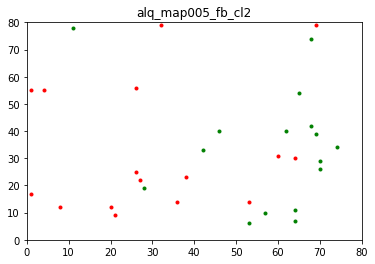

[50.0, 50.0]


Currently mapping.... alq_map006.csv  -->  6
Total no. of points to label.... 14
Label Analysis:-
Total no. of labels:  14
Total no. of lab  1  =  10
Total percentage of lab  1  =  71.42857142857143 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  28.57142857142857 %
map saved!!


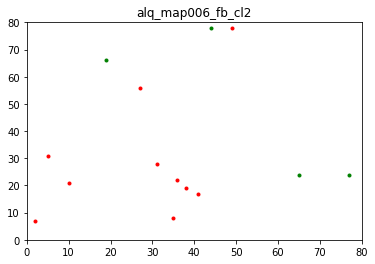

[71.4, 28.6]


Currently mapping.... alq_map007.csv  -->  7
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  22
Total percentage of lab  1  =  70.96774193548387 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  29.03225806451613 %
map saved!!


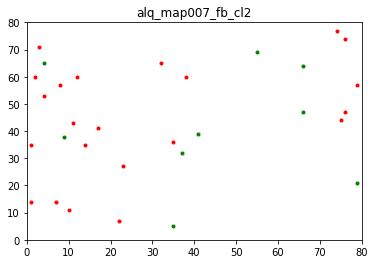

[71.0, 29.0]


Currently mapping.... alq_map008.csv  -->  8
Total no. of points to label.... 39
Label Analysis:-
Total no. of labels:  39
Total no. of lab  1  =  21
Total percentage of lab  1  =  53.84615384615385 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  46.15384615384615 %
map saved!!


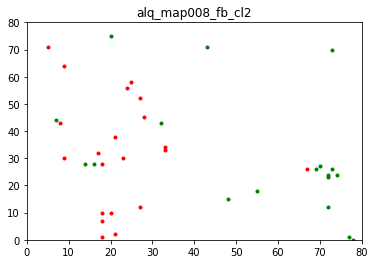

[53.8, 46.2]


Currently mapping.... alq_map009.csv  -->  9
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  18
Total percentage of lab  1  =  43.90243902439025 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  56.09756097560976 %
map saved!!


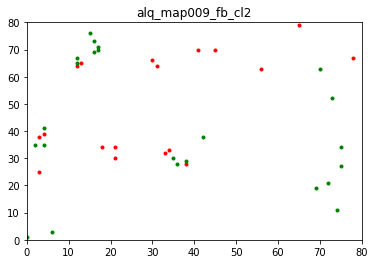

[43.9, 56.1]


Currently mapping.... alq_map010.csv  -->  10
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  20
Total percentage of lab  1  =  64.51612903225806 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  35.483870967741936 %
map saved!!


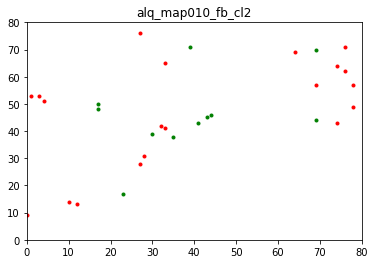

[64.5, 35.5]


Currently mapping.... alq_map011.csv  -->  11
Total no. of points to label.... 39
Label Analysis:-
Total no. of labels:  39
Total no. of lab  1  =  13
Total percentage of lab  1  =  33.33333333333333 %
Total no. of lab  2  =  26
Total percentage of lab  2  =  66.66666666666666 %
map saved!!


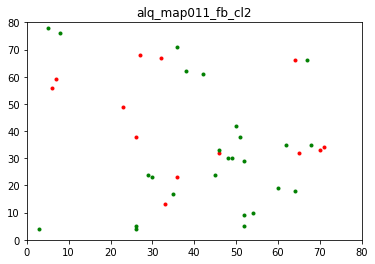

[33.3, 66.7]


Currently mapping.... alq_map012.csv  -->  12
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  19
Total percentage of lab  1  =  44.18604651162791 %
Total no. of lab  2  =  24
Total percentage of lab  2  =  55.81395348837209 %
map saved!!


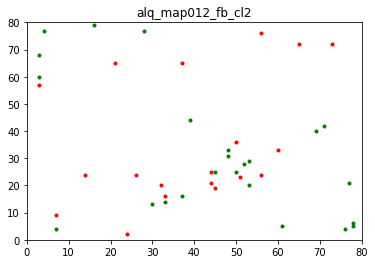

[44.2, 55.8]


Currently mapping.... alq_map013.csv  -->  13
Total no. of points to label.... 29
Label Analysis:-
Total no. of labels:  29
Total no. of lab  1  =  12
Total percentage of lab  1  =  41.37931034482759 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  58.620689655172406 %
map saved!!


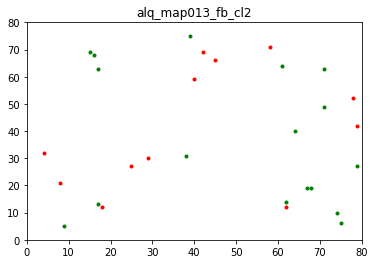

[41.4, 58.6]


Currently mapping.... alq_map014.csv  -->  14
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  17
Total percentage of lab  1  =  47.22222222222222 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  52.77777777777778 %
map saved!!


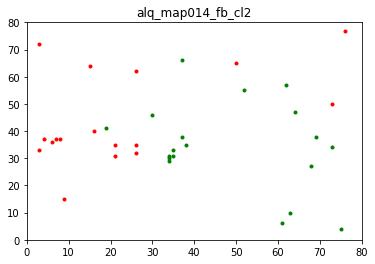

[47.2, 52.8]


Currently mapping.... alq_map015.csv  -->  15
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  27
Total percentage of lab  1  =  45.0 %
Total no. of lab  2  =  33
Total percentage of lab  2  =  55.00000000000001 %
map saved!!


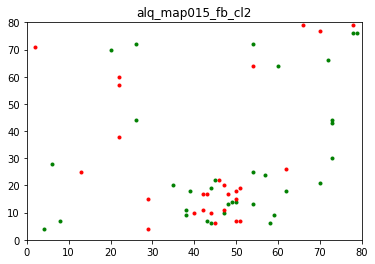

[45.0, 55.0]


Currently mapping.... alq_map016.csv  -->  16
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  11
Total percentage of lab  1  =  29.72972972972973 %
Total no. of lab  2  =  26
Total percentage of lab  2  =  70.27027027027027 %
map saved!!


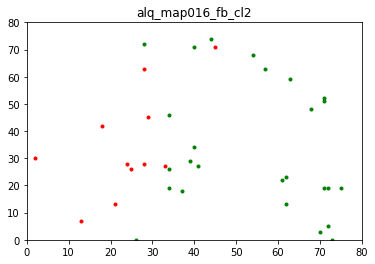

[29.7, 70.3]


Currently mapping.... alq_map017.csv  -->  17
Total no. of points to label.... 26
Label Analysis:-
Total no. of labels:  26
Total no. of lab  1  =  20
Total percentage of lab  1  =  76.92307692307693 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  23.076923076923077 %
map saved!!


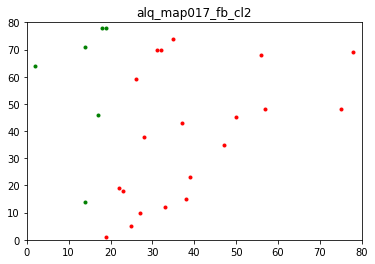

[76.9, 23.1]


Currently mapping.... alq_map018.csv  -->  18
Total no. of points to label.... 51
Label Analysis:-
Total no. of labels:  51
Total no. of lab  1  =  29
Total percentage of lab  1  =  56.86274509803921 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  43.13725490196079 %
map saved!!


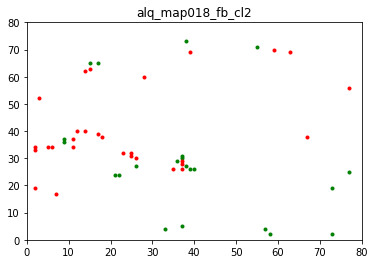

[56.9, 43.1]


Currently mapping.... alq_map019.csv  -->  19
Total no. of points to label.... 17
Label Analysis:-
Total no. of labels:  17
Total no. of lab  1  =  8
Total percentage of lab  1  =  47.05882352941176 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  52.94117647058824 %
map saved!!


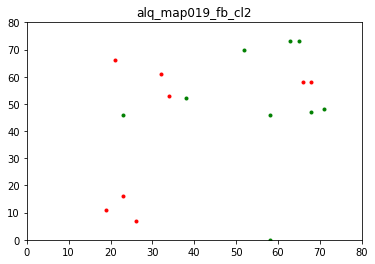

[47.1, 52.9]


Currently mapping.... alq_map020.csv  -->  20
Total no. of points to label.... 33
Label Analysis:-
Total no. of labels:  33
Total no. of lab  1  =  21
Total percentage of lab  1  =  63.63636363636363 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  36.36363636363637 %
map saved!!


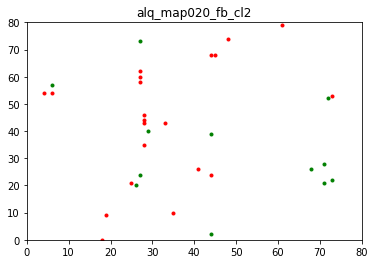

[63.6, 36.4]


Currently mapping.... alq_map021.csv  -->  21
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  20
Total percentage of lab  1  =  48.78048780487805 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  51.21951219512195 %
map saved!!


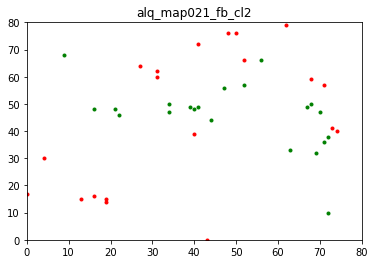

[48.8, 51.2]


Currently mapping.... alq_map022.csv  -->  22
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  15
Total percentage of lab  1  =  46.875 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  53.125 %
map saved!!


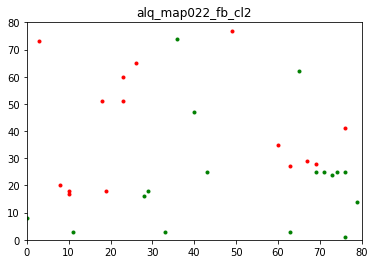

[46.9, 53.1]


Currently mapping.... alq_map023.csv  -->  23
Total no. of points to label.... 28
Label Analysis:-
Total no. of labels:  28
Total no. of lab  1  =  14
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  50.0 %
map saved!!


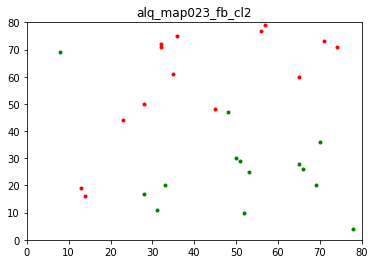

[50.0, 50.0]


Currently mapping.... alq_map024.csv  -->  24
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  14
Total percentage of lab  1  =  43.75 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  56.25 %
map saved!!


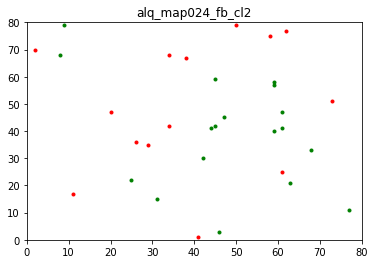

[43.8, 56.2]


Currently mapping.... alq_map025.csv  -->  25
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  23
Total percentage of lab  1  =  53.48837209302325 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  46.51162790697674 %
map saved!!


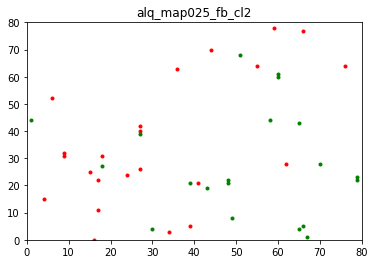

[53.5, 46.5]


Currently mapping.... alq_map026.csv  -->  26
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  16
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  50.0 %
map saved!!


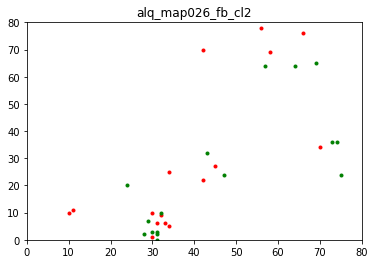

[50.0, 50.0]


Currently mapping.... alq_map027.csv  -->  27
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  16
Total percentage of lab  1  =  44.44444444444444 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  55.55555555555556 %
map saved!!


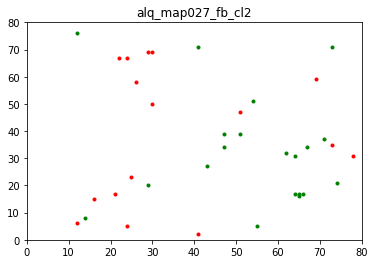

[44.4, 55.6]


Currently mapping.... alq_map028.csv  -->  28
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  25
Total percentage of lab  1  =  48.07692307692308 %
Total no. of lab  2  =  27
Total percentage of lab  2  =  51.92307692307693 %
map saved!!


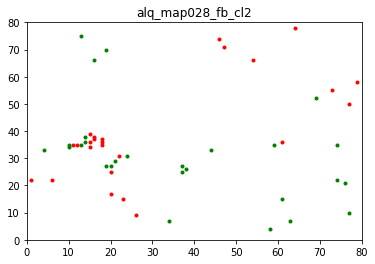

[48.1, 51.9]


Currently mapping.... alq_map029.csv  -->  29
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  21
Total percentage of lab  1  =  48.837209302325576 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  51.162790697674424 %
map saved!!


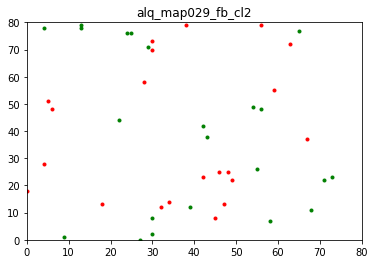

[48.8, 51.2]


Currently mapping.... alq_map030.csv  -->  30
Total no. of points to label.... 54
Label Analysis:-
Total no. of labels:  54
Total no. of lab  1  =  22
Total percentage of lab  1  =  40.74074074074074 %
Total no. of lab  2  =  32
Total percentage of lab  2  =  59.25925925925925 %
map saved!!


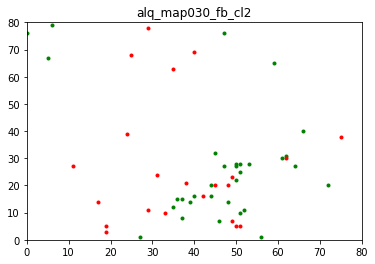

[40.7, 59.3]


Currently mapping.... alq_map031.csv  -->  31
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  26
Total percentage of lab  1  =  63.41463414634146 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  36.58536585365854 %
map saved!!


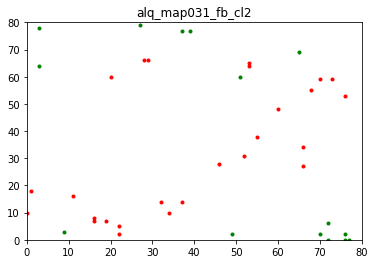

[63.4, 36.6]


Currently mapping.... alq_map032.csv  -->  32
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  32
Total percentage of lab  1  =  53.333333333333336 %
Total no. of lab  2  =  28
Total percentage of lab  2  =  46.666666666666664 %
map saved!!


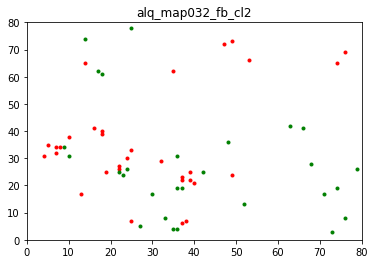

[53.3, 46.7]


Currently mapping.... alq_map033.csv  -->  33
Total no. of points to label.... 84
Label Analysis:-
Total no. of labels:  84
Total no. of lab  1  =  37
Total percentage of lab  1  =  44.047619047619044 %
Total no. of lab  2  =  47
Total percentage of lab  2  =  55.952380952380956 %
map saved!!


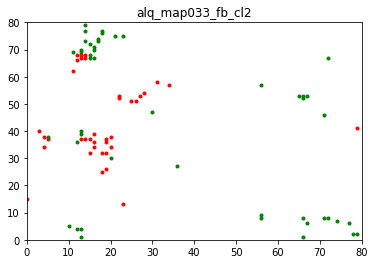

[44.0, 56.0]


Currently mapping.... alq_map034.csv  -->  34
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  15
Total percentage of lab  1  =  28.846153846153843 %
Total no. of lab  2  =  37
Total percentage of lab  2  =  71.15384615384616 %
map saved!!


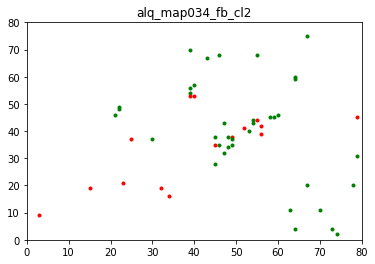

[28.8, 71.2]


Currently mapping.... alq_map035.csv  -->  35
Total no. of points to label.... 64
Label Analysis:-
Total no. of labels:  64
Total no. of lab  1  =  25
Total percentage of lab  1  =  39.0625 %
Total no. of lab  2  =  39
Total percentage of lab  2  =  60.9375 %
map saved!!


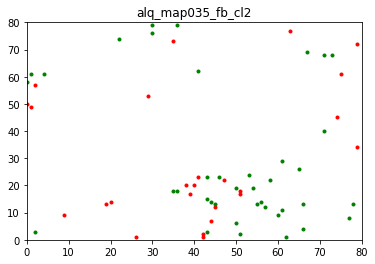

[39.1, 60.9]


Currently mapping.... alq_map036.csv  -->  36
Total no. of points to label.... 69
Label Analysis:-
Total no. of labels:  69
Total no. of lab  1  =  27
Total percentage of lab  1  =  39.130434782608695 %
Total no. of lab  2  =  42
Total percentage of lab  2  =  60.86956521739131 %
map saved!!


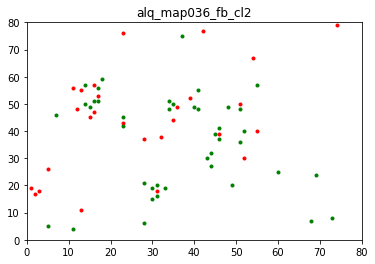

[39.1, 60.9]


Currently mapping.... alq_map037.csv  -->  37
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  16
Total percentage of lab  1  =  44.44444444444444 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  55.55555555555556 %
map saved!!


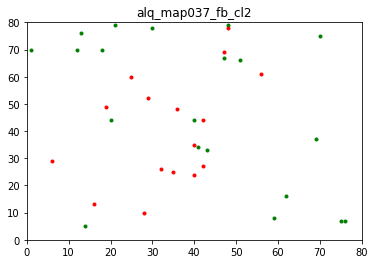

[44.4, 55.6]


Currently mapping.... alq_map038.csv  -->  38
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  20
Total percentage of lab  1  =  46.51162790697674 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  53.48837209302325 %
map saved!!


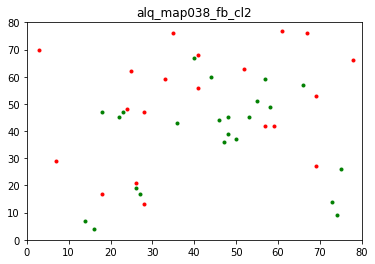

[46.5, 53.5]


Currently mapping.... alq_map039.csv  -->  39
Total no. of points to label.... 46
Label Analysis:-
Total no. of labels:  46
Total no. of lab  1  =  24
Total percentage of lab  1  =  52.17391304347826 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  47.82608695652174 %
map saved!!


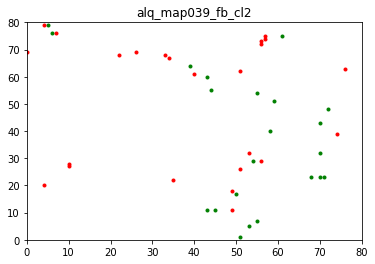

[52.2, 47.8]


Currently mapping.... alq_map040.csv  -->  40
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  11
Total percentage of lab  1  =  35.483870967741936 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  64.51612903225806 %
map saved!!


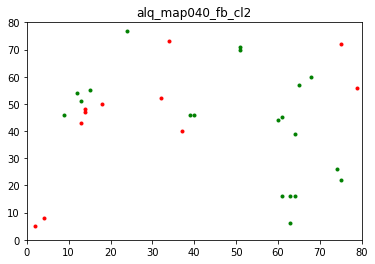

[35.5, 64.5]


Currently mapping.... alq_map041.csv  -->  41
Total no. of points to label.... 34
Label Analysis:-
Total no. of labels:  34
Total no. of lab  1  =  19
Total percentage of lab  1  =  55.88235294117647 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  44.11764705882353 %
map saved!!


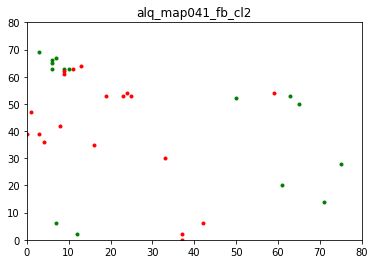

[55.9, 44.1]


Currently mapping.... alq_map042.csv  -->  42
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  22
Total percentage of lab  1  =  57.89473684210527 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  42.10526315789473 %
map saved!!


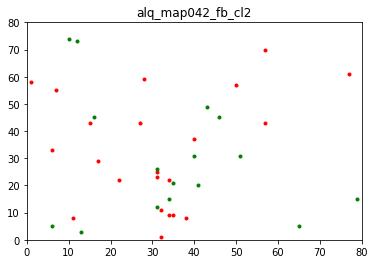

[57.9, 42.1]


Currently mapping.... alq_map043.csv  -->  43
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  8
Total percentage of lab  1  =  29.629629629629626 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  70.37037037037037 %
map saved!!


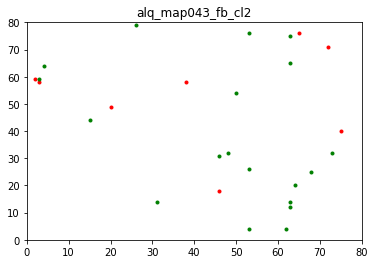

[29.6, 70.4]


Currently mapping.... alq_map044.csv  -->  44
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  17
Total percentage of lab  1  =  41.46341463414634 %
Total no. of lab  2  =  24
Total percentage of lab  2  =  58.536585365853654 %
map saved!!


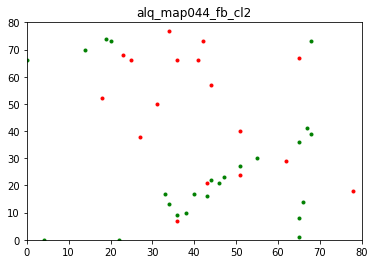

[41.5, 58.5]


Currently mapping.... alq_map045.csv  -->  45
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  14
Total percentage of lab  1  =  34.146341463414636 %
Total no. of lab  2  =  27
Total percentage of lab  2  =  65.85365853658537 %
map saved!!


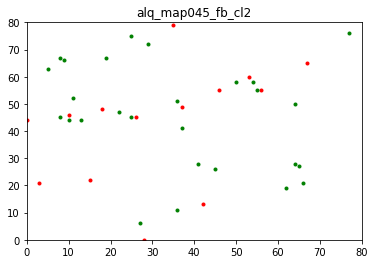

[34.1, 65.9]


Currently mapping.... alq_map046.csv  -->  46
Total no. of points to label.... 26
Label Analysis:-
Total no. of labels:  26
Total no. of lab  1  =  10
Total percentage of lab  1  =  38.46153846153847 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  61.53846153846154 %
map saved!!


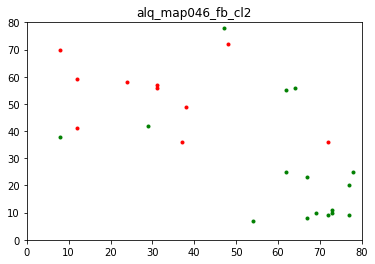

[38.5, 61.5]


Currently mapping.... alq_map047.csv  -->  47
Total no. of points to label.... 24
Label Analysis:-
Total no. of labels:  24
Total no. of lab  1  =  12
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  50.0 %
map saved!!


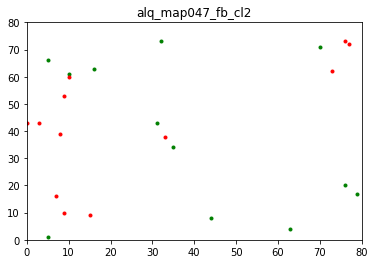

[50.0, 50.0]


Currently mapping.... alq_map048.csv  -->  48
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  27
Total percentage of lab  1  =  67.5 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  32.5 %
map saved!!


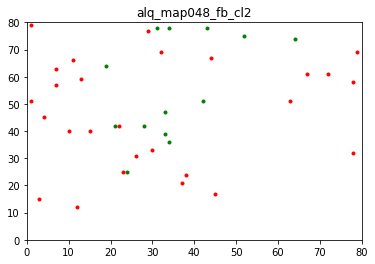

[67.5, 32.5]


Currently mapping.... alq_map049.csv  -->  49
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  17
Total percentage of lab  1  =  44.73684210526316 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  55.26315789473685 %
map saved!!


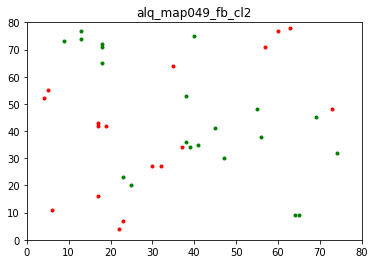

[44.7, 55.3]


Currently mapping.... alq_map050.csv  -->  50
Total no. of points to label.... 125
Label Analysis:-
Total no. of labels:  125
Total no. of lab  1  =  55
Total percentage of lab  1  =  44.0 %
Total no. of lab  2  =  70
Total percentage of lab  2  =  56.00000000000001 %
map saved!!


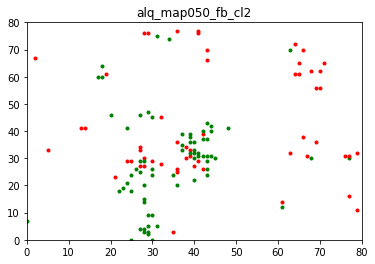

[44.0, 56.0]


Currently mapping.... alq_map051.csv  -->  51
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  24
Total percentage of lab  1  =  40.0 %
Total no. of lab  2  =  36
Total percentage of lab  2  =  60.0 %
map saved!!


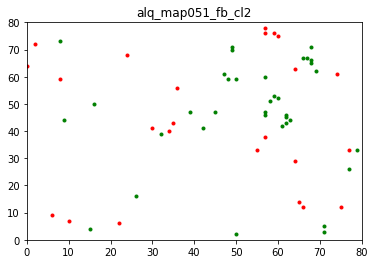

[40.0, 60.0]


Currently mapping.... alq_map052.csv  -->  52
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  22
Total percentage of lab  1  =  42.30769230769231 %
Total no. of lab  2  =  30
Total percentage of lab  2  =  57.692307692307686 %
map saved!!


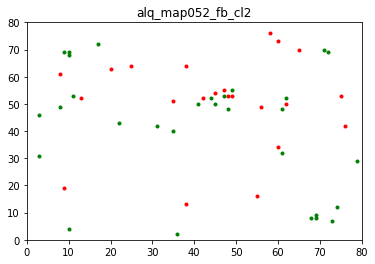

[42.3, 57.7]


Currently mapping.... alq_map053.csv  -->  53
Total no. of points to label.... 51
Label Analysis:-
Total no. of labels:  51
Total no. of lab  1  =  29
Total percentage of lab  1  =  56.86274509803921 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  43.13725490196079 %
map saved!!


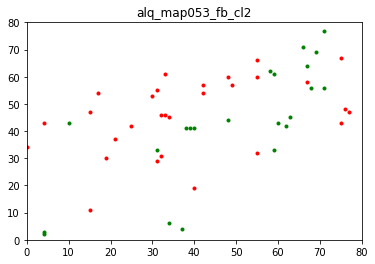

[56.9, 43.1]


Currently mapping.... alq_map054.csv  -->  54
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  19
Total percentage of lab  1  =  52.77777777777778 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  47.22222222222222 %
map saved!!


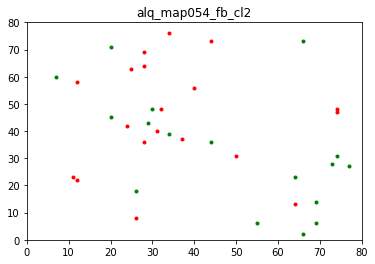

[52.8, 47.2]


Currently mapping.... alq_map055.csv  -->  55
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  42
Total percentage of lab  1  =  56.00000000000001 %
Total no. of lab  2  =  33
Total percentage of lab  2  =  44.0 %
map saved!!


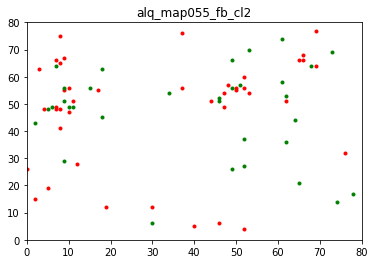

[56.0, 44.0]


Currently mapping.... alq_map056.csv  -->  56
Total no. of points to label.... 19
Label Analysis:-
Total no. of labels:  19
Total no. of lab  1  =  6
Total percentage of lab  1  =  31.57894736842105 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  68.42105263157895 %
map saved!!


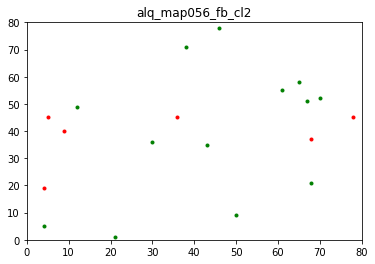

[31.6, 68.4]


Currently mapping.... alq_map057.csv  -->  57
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  23
Total percentage of lab  1  =  62.16216216216216 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  37.83783783783784 %
map saved!!


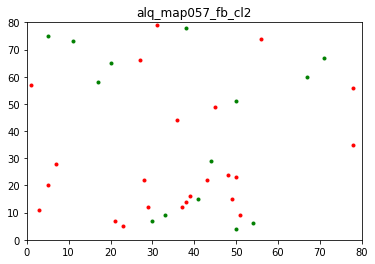

[62.2, 37.8]


Currently mapping.... alq_map058.csv  -->  58
Total no. of points to label.... 44
Label Analysis:-
Total no. of labels:  44
Total no. of lab  1  =  19
Total percentage of lab  1  =  43.18181818181818 %
Total no. of lab  2  =  25
Total percentage of lab  2  =  56.81818181818182 %
map saved!!


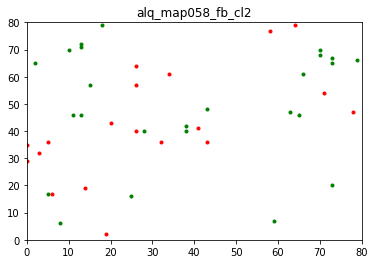

[43.2, 56.8]


Currently mapping.... alq_map059.csv  -->  59
Total no. of points to label.... 33
Label Analysis:-
Total no. of labels:  33
Total no. of lab  1  =  17
Total percentage of lab  1  =  51.515151515151516 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  48.484848484848484 %
map saved!!


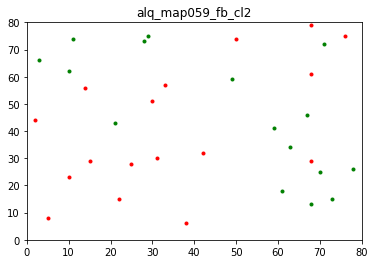

[51.5, 48.5]


Currently mapping.... alq_map060.csv  -->  60
Total no. of points to label.... 62
Label Analysis:-
Total no. of labels:  62
Total no. of lab  1  =  35
Total percentage of lab  1  =  56.451612903225815 %
Total no. of lab  2  =  27
Total percentage of lab  2  =  43.54838709677419 %
map saved!!


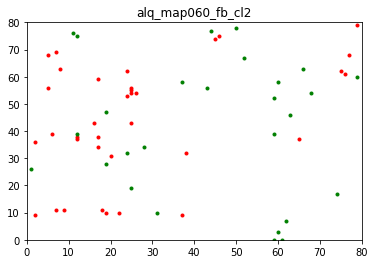

[56.5, 43.5]


Currently mapping.... alq_map061.csv  -->  61
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  22
Total percentage of lab  1  =  53.65853658536586 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  46.34146341463415 %
map saved!!


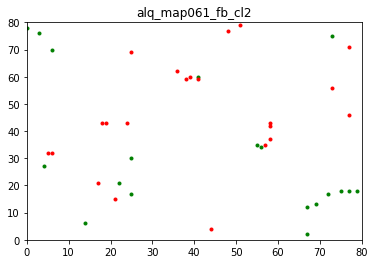

[53.7, 46.3]


Currently mapping.... alq_map062.csv  -->  62
Total no. of points to label.... 24
Label Analysis:-
Total no. of labels:  24
Total no. of lab  1  =  10
Total percentage of lab  1  =  41.66666666666667 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  58.333333333333336 %
map saved!!


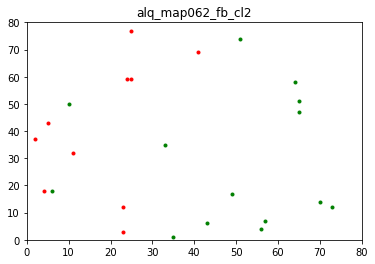

[41.7, 58.3]


Currently mapping.... alq_map063.csv  -->  63
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  17
Total percentage of lab  1  =  39.53488372093023 %
Total no. of lab  2  =  26
Total percentage of lab  2  =  60.46511627906976 %
map saved!!


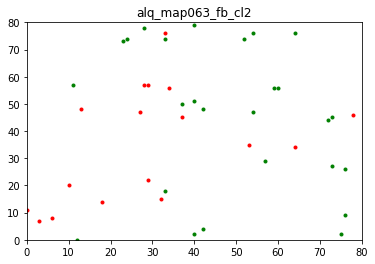

[39.5, 60.5]


Currently mapping.... alq_map064.csv  -->  64
Total no. of points to label.... 50
Label Analysis:-
Total no. of labels:  50
Total no. of lab  1  =  30
Total percentage of lab  1  =  60.0 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  40.0 %
map saved!!


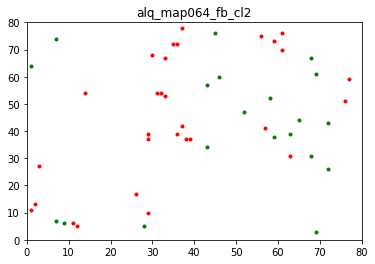

[60.0, 40.0]


Currently mapping.... alq_map065.csv  -->  65
Total no. of points to label.... 44
Label Analysis:-
Total no. of labels:  44
Total no. of lab  1  =  19
Total percentage of lab  1  =  43.18181818181818 %
Total no. of lab  2  =  25
Total percentage of lab  2  =  56.81818181818182 %
map saved!!


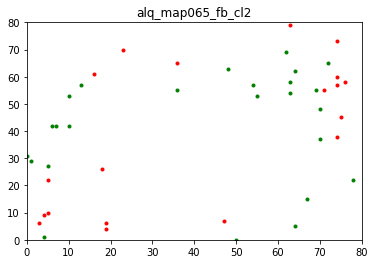

[43.2, 56.8]


Currently mapping.... alq_map066.csv  -->  66
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  26
Total percentage of lab  1  =  42.62295081967213 %
Total no. of lab  2  =  35
Total percentage of lab  2  =  57.377049180327866 %
map saved!!


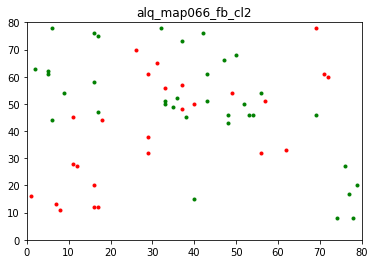

[42.6, 57.4]


Currently mapping.... alq_map067.csv  -->  67
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  12
Total percentage of lab  1  =  33.33333333333333 %
Total no. of lab  2  =  24
Total percentage of lab  2  =  66.66666666666666 %
map saved!!


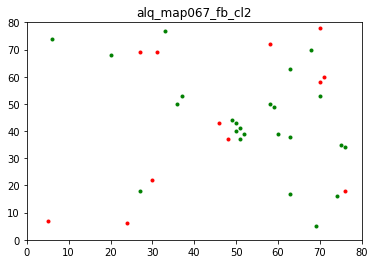

[33.3, 66.7]


Currently mapping.... alq_map068.csv  -->  68
Total no. of points to label.... 45
Label Analysis:-
Total no. of labels:  45
Total no. of lab  1  =  25
Total percentage of lab  1  =  55.55555555555556 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  44.44444444444444 %
map saved!!


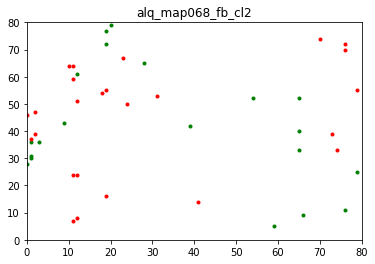

[55.6, 44.4]


Currently mapping.... alq_map069.csv  -->  69
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  24
Total percentage of lab  1  =  46.15384615384615 %
Total no. of lab  2  =  28
Total percentage of lab  2  =  53.84615384615385 %
map saved!!


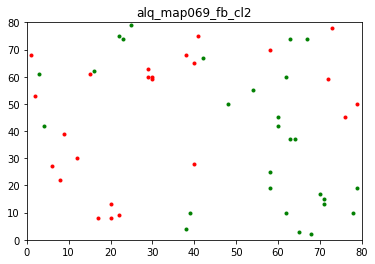

[46.2, 53.8]


Currently mapping.... alq_map070.csv  -->  70
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  26
Total percentage of lab  1  =  43.333333333333336 %
Total no. of lab  2  =  34
Total percentage of lab  2  =  56.666666666666664 %
map saved!!


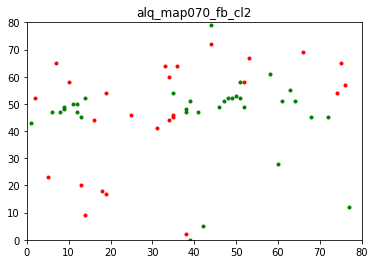

[43.3, 56.7]


Currently mapping.... alq_map071.csv  -->  71
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  38
Total percentage of lab  1  =  73.07692307692307 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  26.923076923076923 %
map saved!!


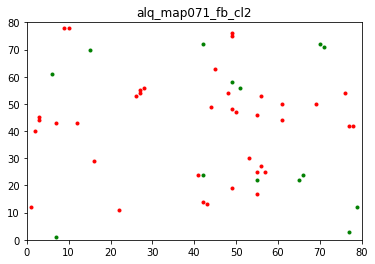

[73.1, 26.9]


Currently mapping.... alq_map072.csv  -->  72
Total no. of points to label.... 62
Label Analysis:-
Total no. of labels:  62
Total no. of lab  1  =  30
Total percentage of lab  1  =  48.38709677419355 %
Total no. of lab  2  =  32
Total percentage of lab  2  =  51.61290322580645 %
map saved!!


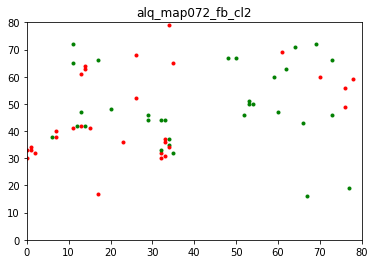

[48.4, 51.6]


Currently mapping.... alq_map073.csv  -->  73
Total no. of points to label.... 85
Label Analysis:-
Total no. of labels:  85
Total no. of lab  1  =  43
Total percentage of lab  1  =  50.588235294117645 %
Total no. of lab  2  =  42
Total percentage of lab  2  =  49.411764705882355 %
map saved!!


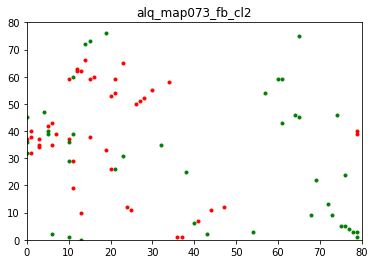

[50.6, 49.4]


Currently mapping.... alq_map074.csv  -->  74
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  23
Total percentage of lab  1  =  39.6551724137931 %
Total no. of lab  2  =  35
Total percentage of lab  2  =  60.3448275862069 %
map saved!!


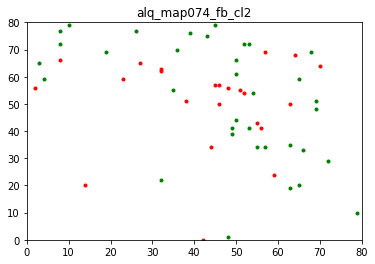

[39.7, 60.3]


Currently mapping.... alq_map075.csv  -->  75
Total no. of points to label.... 59
Label Analysis:-
Total no. of labels:  59
Total no. of lab  1  =  30
Total percentage of lab  1  =  50.847457627118644 %
Total no. of lab  2  =  29
Total percentage of lab  2  =  49.152542372881356 %
map saved!!


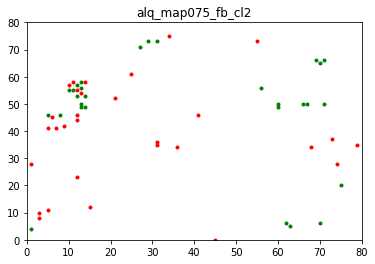

[50.8, 49.2]


Currently mapping.... alq_map076.csv  -->  76
Total no. of points to label.... 72
Label Analysis:-
Total no. of labels:  72
Total no. of lab  1  =  26
Total percentage of lab  1  =  36.11111111111111 %
Total no. of lab  2  =  46
Total percentage of lab  2  =  63.888888888888886 %
map saved!!


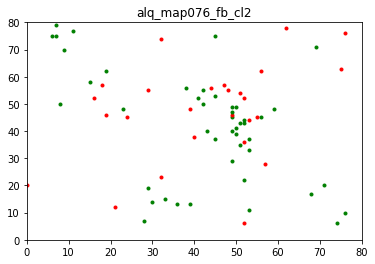

[36.1, 63.9]


Currently mapping.... alq_map077.csv  -->  77
Total no. of points to label.... 42
Label Analysis:-
Total no. of labels:  42
Total no. of lab  1  =  15
Total percentage of lab  1  =  35.714285714285715 %
Total no. of lab  2  =  27
Total percentage of lab  2  =  64.28571428571429 %
map saved!!


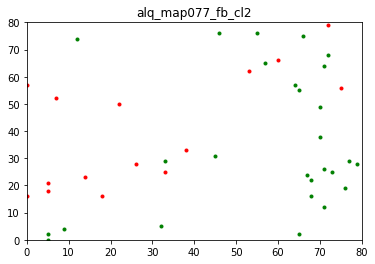

[35.7, 64.3]


Currently mapping.... alq_map078.csv  -->  78
Total no. of points to label.... 63
Label Analysis:-
Total no. of labels:  63
Total no. of lab  1  =  33
Total percentage of lab  1  =  52.38095238095239 %
Total no. of lab  2  =  30
Total percentage of lab  2  =  47.61904761904761 %
map saved!!


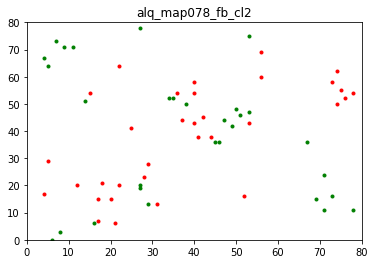

[52.4, 47.6]


Currently mapping.... alq_map079.csv  -->  79
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  14
Total percentage of lab  1  =  35.0 %
Total no. of lab  2  =  26
Total percentage of lab  2  =  65.0 %
map saved!!


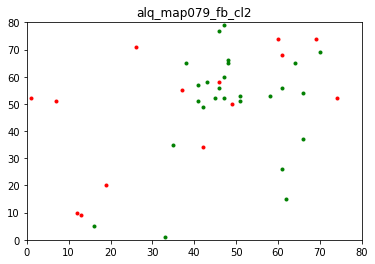

[35.0, 65.0]


Currently mapping.... alq_map080.csv  -->  80
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  18
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  50.0 %
map saved!!


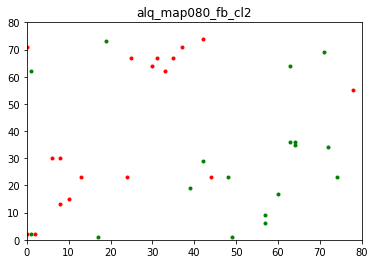

[50.0, 50.0]


Currently mapping.... alq_map081.csv  -->  81
Total no. of points to label.... 77
Label Analysis:-
Total no. of labels:  77
Total no. of lab  1  =  45
Total percentage of lab  1  =  58.44155844155844 %
Total no. of lab  2  =  32
Total percentage of lab  2  =  41.55844155844156 %
map saved!!


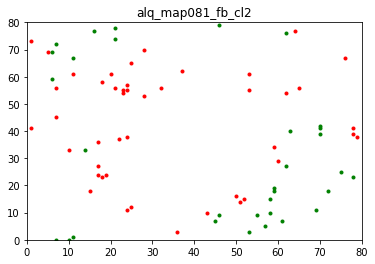

[58.4, 41.6]


Currently mapping.... alq_map082.csv  -->  82
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  25
Total percentage of lab  1  =  69.44444444444444 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  30.555555555555557 %
map saved!!


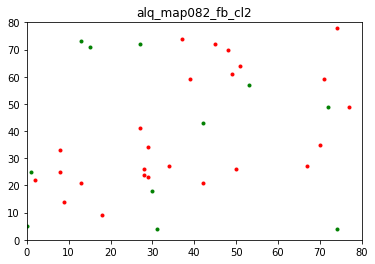

[69.4, 30.6]


Currently mapping.... alq_map083.csv  -->  83
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  17
Total percentage of lab  1  =  39.53488372093023 %
Total no. of lab  2  =  26
Total percentage of lab  2  =  60.46511627906976 %
map saved!!


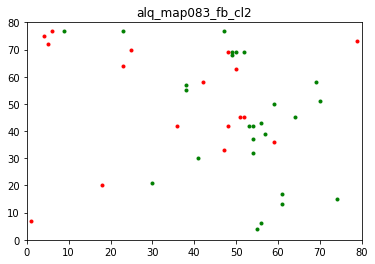

[39.5, 60.5]


Currently mapping.... alq_map084.csv  -->  84
Total no. of points to label.... 49
Label Analysis:-
Total no. of labels:  49
Total no. of lab  1  =  21
Total percentage of lab  1  =  42.857142857142854 %
Total no. of lab  2  =  28
Total percentage of lab  2  =  57.14285714285714 %
map saved!!


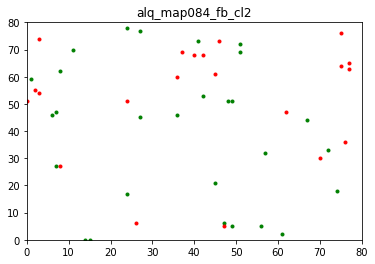

[42.9, 57.1]


Currently mapping.... alq_map085.csv  -->  85
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  23
Total percentage of lab  1  =  39.6551724137931 %
Total no. of lab  2  =  35
Total percentage of lab  2  =  60.3448275862069 %
map saved!!


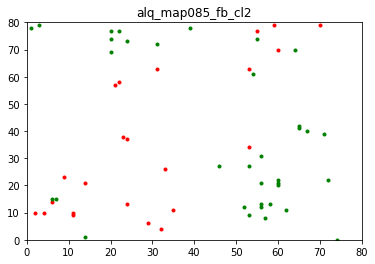

[39.7, 60.3]


Currently mapping.... alq_map086.csv  -->  86
Total no. of points to label.... 74
Label Analysis:-
Total no. of labels:  74
Total no. of lab  1  =  28
Total percentage of lab  1  =  37.83783783783784 %
Total no. of lab  2  =  46
Total percentage of lab  2  =  62.16216216216216 %
map saved!!


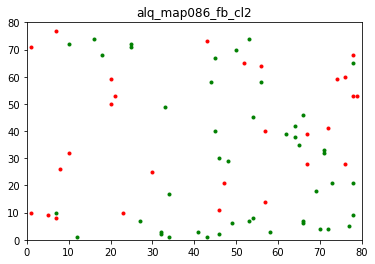

[37.8, 62.2]


Currently mapping.... alq_map087.csv  -->  87
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  18
Total percentage of lab  1  =  41.86046511627907 %
Total no. of lab  2  =  25
Total percentage of lab  2  =  58.139534883720934 %
map saved!!


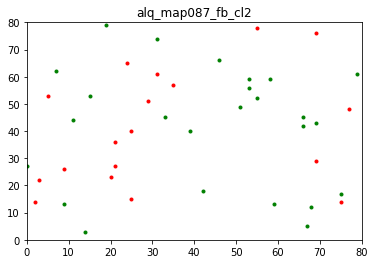

[41.9, 58.1]


Currently mapping.... alq_map088.csv  -->  88
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  47
Total percentage of lab  1  =  62.66666666666667 %
Total no. of lab  2  =  28
Total percentage of lab  2  =  37.333333333333336 %
map saved!!


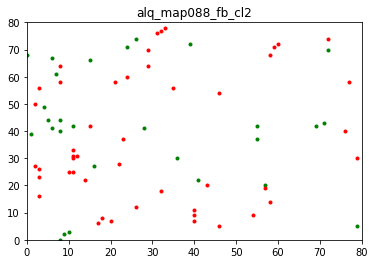

[62.7, 37.3]


Currently mapping.... alq_map089.csv  -->  89
Total no. of points to label.... 68
Label Analysis:-
Total no. of labels:  68
Total no. of lab  1  =  34
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  34
Total percentage of lab  2  =  50.0 %
map saved!!


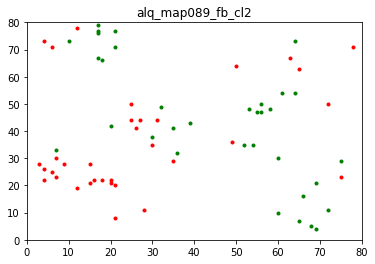

[50.0, 50.0]


Currently mapping.... alq_map090.csv  -->  90
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  42
Total percentage of lab  1  =  51.21951219512195 %
Total no. of lab  2  =  40
Total percentage of lab  2  =  48.78048780487805 %
map saved!!


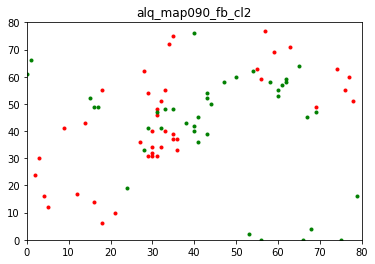

[51.2, 48.8]


Currently mapping.... alq_map091.csv  -->  91
Total no. of points to label.... 65
Label Analysis:-
Total no. of labels:  65
Total no. of lab  1  =  26
Total percentage of lab  1  =  40.0 %
Total no. of lab  2  =  39
Total percentage of lab  2  =  60.0 %
map saved!!


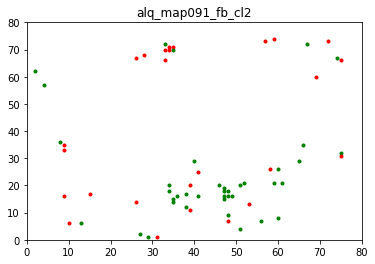

[40.0, 60.0]


Currently mapping.... alq_map092.csv  -->  92
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  24
Total percentage of lab  1  =  41.37931034482759 %
Total no. of lab  2  =  34
Total percentage of lab  2  =  58.620689655172406 %
map saved!!


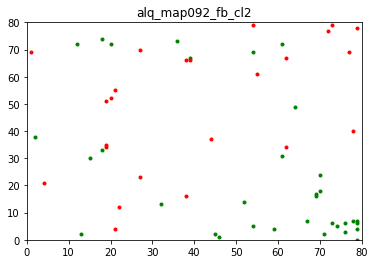

[41.4, 58.6]


Currently mapping.... alq_map093.csv  -->  93
Total no. of points to label.... 46
Label Analysis:-
Total no. of labels:  46
Total no. of lab  1  =  19
Total percentage of lab  1  =  41.30434782608695 %
Total no. of lab  2  =  27
Total percentage of lab  2  =  58.69565217391305 %
map saved!!


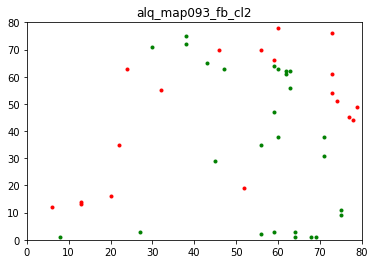

[41.3, 58.7]


Currently mapping.... alq_map094.csv  -->  94
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  36
Total percentage of lab  1  =  59.01639344262295 %
Total no. of lab  2  =  25
Total percentage of lab  2  =  40.98360655737705 %
map saved!!


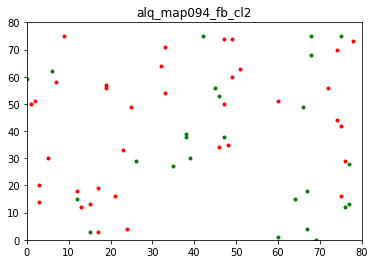

[59.0, 41.0]


Currently mapping.... alq_map095.csv  -->  95
Total no. of points to label.... 84
Label Analysis:-
Total no. of labels:  84
Total no. of lab  1  =  38
Total percentage of lab  1  =  45.23809523809524 %
Total no. of lab  2  =  46
Total percentage of lab  2  =  54.761904761904766 %
map saved!!


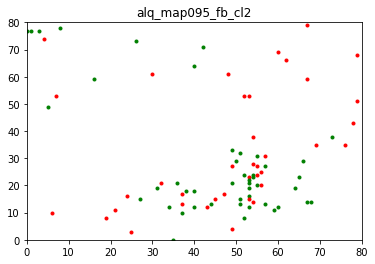

[45.2, 54.8]


Currently mapping.... alq_map096.csv  -->  96
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  20
Total percentage of lab  1  =  52.63157894736842 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  47.368421052631575 %
map saved!!


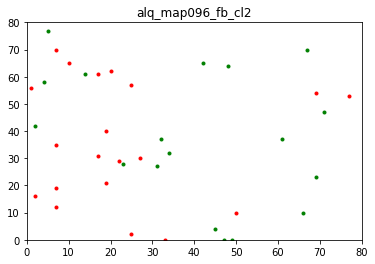

[52.6, 47.4]


Currently mapping.... alq_map097.csv  -->  97
Total no. of points to label.... 47
Label Analysis:-
Total no. of labels:  47
Total no. of lab  1  =  20
Total percentage of lab  1  =  42.5531914893617 %
Total no. of lab  2  =  27
Total percentage of lab  2  =  57.446808510638306 %
map saved!!


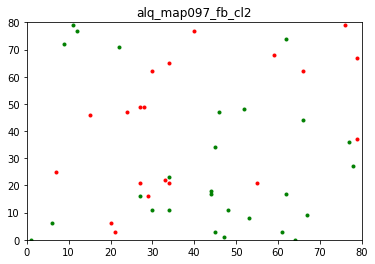

[42.6, 57.4]


Currently mapping.... alq_map098.csv  -->  98
Total no. of points to label.... 88
Label Analysis:-
Total no. of labels:  88
Total no. of lab  1  =  56
Total percentage of lab  1  =  63.63636363636363 %
Total no. of lab  2  =  32
Total percentage of lab  2  =  36.36363636363637 %
map saved!!


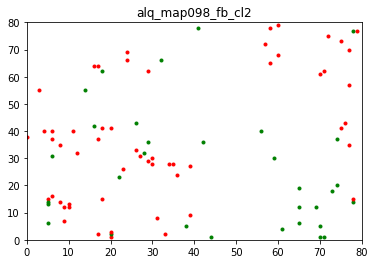

[63.6, 36.4]


Currently mapping.... alq_map099.csv  -->  99
Total no. of points to label.... 64
Label Analysis:-
Total no. of labels:  64
Total no. of lab  1  =  26
Total percentage of lab  1  =  40.625 %
Total no. of lab  2  =  38
Total percentage of lab  2  =  59.375 %
map saved!!


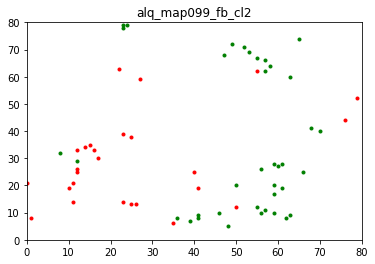

[40.6, 59.4]


Currently mapping.... alq_map100.csv  -->  100
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  30
Total percentage of lab  1  =  57.692307692307686 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  42.30769230769231 %
map saved!!


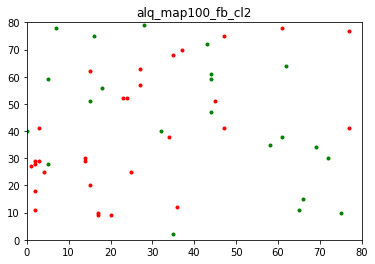

[57.7, 42.3]


Currently mapping.... alq_map101.csv  -->  101
Total no. of points to label.... 69
Label Analysis:-
Total no. of labels:  69
Total no. of lab  1  =  36
Total percentage of lab  1  =  52.17391304347826 %
Total no. of lab  2  =  33
Total percentage of lab  2  =  47.82608695652174 %
map saved!!


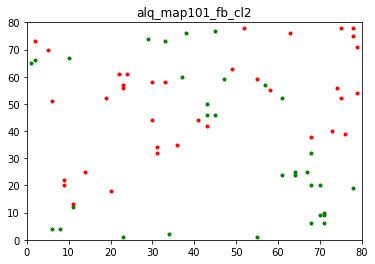

[52.2, 47.8]


Currently mapping.... alq_map102.csv  -->  102
Total no. of points to label.... 71
Label Analysis:-
Total no. of labels:  71
Total no. of lab  1  =  29
Total percentage of lab  1  =  40.845070422535215 %
Total no. of lab  2  =  42
Total percentage of lab  2  =  59.154929577464785 %
map saved!!


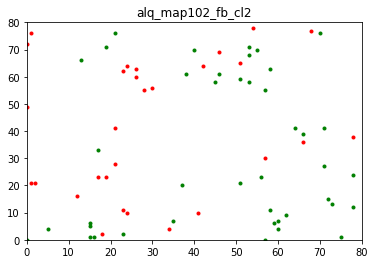

[40.8, 59.2]


Currently mapping.... alq_map103.csv  -->  103
Total no. of points to label.... 42
Label Analysis:-
Total no. of labels:  42
Total no. of lab  1  =  20
Total percentage of lab  1  =  47.61904761904761 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  52.38095238095239 %
map saved!!


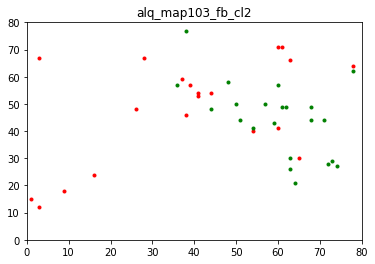

[47.6, 52.4]


Currently mapping.... alq_map104.csv  -->  104
Total no. of points to label.... 68
Label Analysis:-
Total no. of labels:  68
Total no. of lab  1  =  39
Total percentage of lab  1  =  57.35294117647059 %
Total no. of lab  2  =  29
Total percentage of lab  2  =  42.64705882352941 %
map saved!!


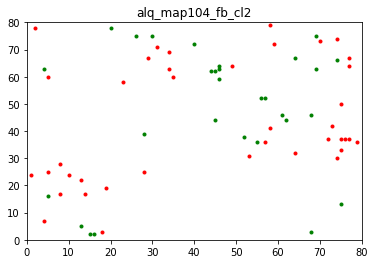

[57.4, 42.6]


Currently mapping.... alq_map105.csv  -->  105
Total no. of points to label.... 59
Label Analysis:-
Total no. of labels:  59
Total no. of lab  1  =  35
Total percentage of lab  1  =  59.32203389830508 %
Total no. of lab  2  =  24
Total percentage of lab  2  =  40.67796610169492 %
map saved!!


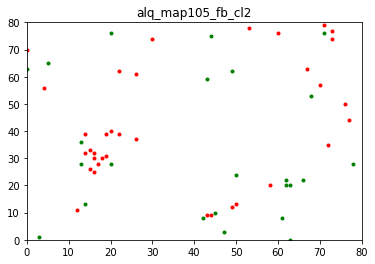

[59.3, 40.7]


Currently mapping.... alq_map106.csv  -->  106
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  28
Total percentage of lab  1  =  45.90163934426229 %
Total no. of lab  2  =  33
Total percentage of lab  2  =  54.09836065573771 %
map saved!!


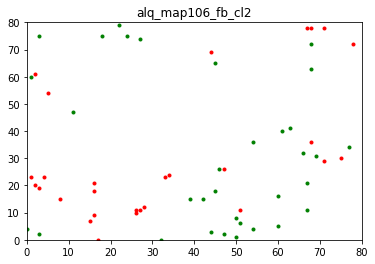

[45.9, 54.1]


Currently mapping.... alq_map107.csv  -->  107
Total no. of points to label.... 55
Label Analysis:-
Total no. of labels:  55
Total no. of lab  1  =  25
Total percentage of lab  1  =  45.45454545454545 %
Total no. of lab  2  =  30
Total percentage of lab  2  =  54.54545454545454 %
map saved!!


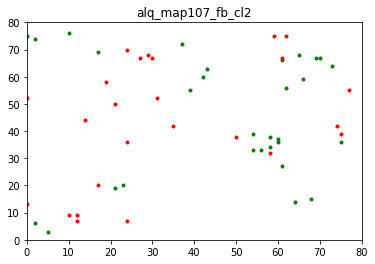

[45.5, 54.5]


Currently mapping.... alq_map108.csv  -->  108
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  45
Total percentage of lab  1  =  54.87804878048781 %
Total no. of lab  2  =  37
Total percentage of lab  2  =  45.1219512195122 %
map saved!!


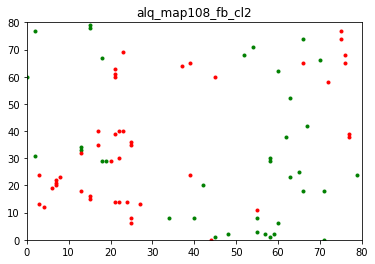

[54.9, 45.1]


Currently mapping.... alq_map109.csv  -->  109
Total no. of points to label.... 95
Label Analysis:-
Total no. of labels:  95
Total no. of lab  1  =  40
Total percentage of lab  1  =  42.10526315789473 %
Total no. of lab  2  =  55
Total percentage of lab  2  =  57.89473684210527 %
map saved!!


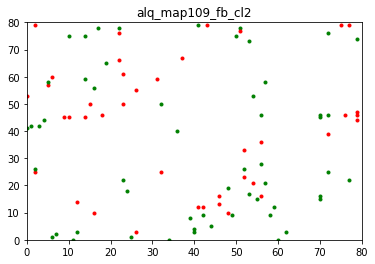

[42.1, 57.9]


Currently mapping.... alq_map110.csv  -->  110
Total no. of points to label.... 77
Label Analysis:-
Total no. of labels:  77
Total no. of lab  1  =  41
Total percentage of lab  1  =  53.246753246753244 %
Total no. of lab  2  =  36
Total percentage of lab  2  =  46.75324675324675 %
map saved!!


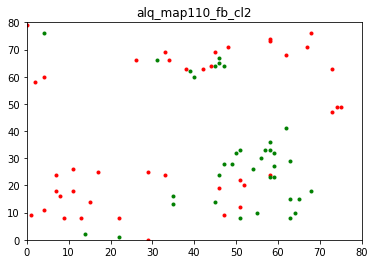

[53.2, 46.8]


Currently mapping.... alq_map111.csv  -->  111
Total no. of points to label.... 141
Label Analysis:-
Total no. of labels:  141
Total no. of lab  1  =  75
Total percentage of lab  1  =  53.191489361702125 %
Total no. of lab  2  =  66
Total percentage of lab  2  =  46.808510638297875 %
map saved!!


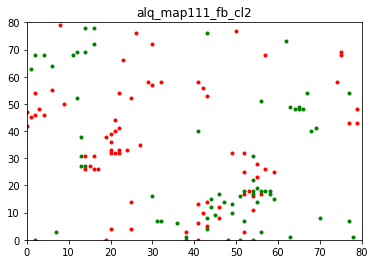

[53.2, 46.8]


Currently mapping.... alq_map112.csv  -->  112
Total no. of points to label.... 96
Label Analysis:-
Total no. of labels:  96
Total no. of lab  1  =  57
Total percentage of lab  1  =  59.375 %
Total no. of lab  2  =  39
Total percentage of lab  2  =  40.625 %
map saved!!


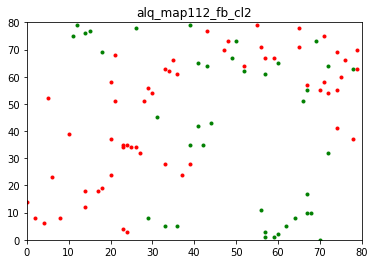

[59.4, 40.6]


Currently mapping.... alq_map113.csv  -->  113
Total no. of points to label.... 76
Label Analysis:-
Total no. of labels:  76
Total no. of lab  1  =  37
Total percentage of lab  1  =  48.68421052631579 %
Total no. of lab  2  =  39
Total percentage of lab  2  =  51.31578947368421 %
map saved!!


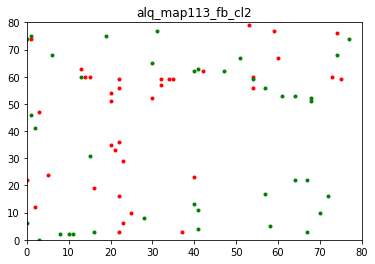

[48.7, 51.3]


Currently mapping.... alq_map114.csv  -->  114
Total no. of points to label.... 71
Label Analysis:-
Total no. of labels:  71
Total no. of lab  1  =  26
Total percentage of lab  1  =  36.61971830985916 %
Total no. of lab  2  =  45
Total percentage of lab  2  =  63.38028169014085 %
map saved!!


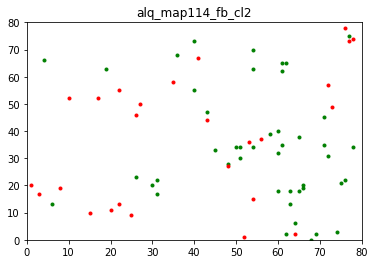

[36.6, 63.4]


Currently mapping.... alq_map115.csv  -->  115
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  30
Total percentage of lab  1  =  36.58536585365854 %
Total no. of lab  2  =  52
Total percentage of lab  2  =  63.41463414634146 %
map saved!!


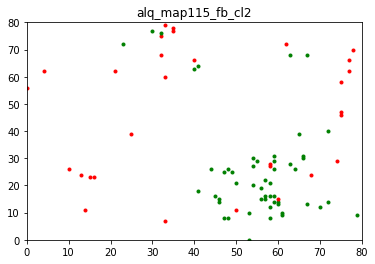

[36.6, 63.4]


Currently mapping.... alq_map116.csv  -->  116
Total no. of points to label.... 112
Label Analysis:-
Total no. of labels:  112
Total no. of lab  1  =  45
Total percentage of lab  1  =  40.17857142857143 %
Total no. of lab  2  =  67
Total percentage of lab  2  =  59.82142857142857 %
map saved!!


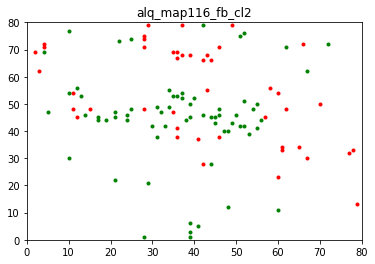

[40.2, 59.8]


Currently mapping.... alq_map117.csv  -->  117
Total no. of points to label.... 93
Label Analysis:-
Total no. of labels:  93
Total no. of lab  1  =  53
Total percentage of lab  1  =  56.98924731182796 %
Total no. of lab  2  =  40
Total percentage of lab  2  =  43.01075268817204 %
map saved!!


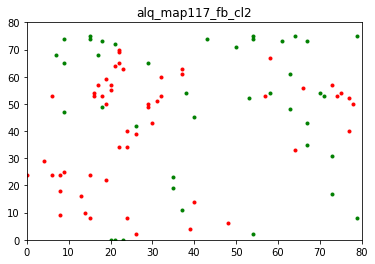

[57.0, 43.0]


Currently mapping.... alq_map118.csv  -->  118
Total no. of points to label.... 108
Label Analysis:-
Total no. of labels:  108
Total no. of lab  1  =  47
Total percentage of lab  1  =  43.51851851851852 %
Total no. of lab  2  =  61
Total percentage of lab  2  =  56.481481481481474 %
map saved!!


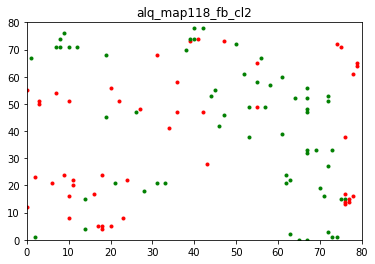

[43.5, 56.5]


Currently mapping.... alq_map119.csv  -->  119
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  41
Total percentage of lab  1  =  54.666666666666664 %
Total no. of lab  2  =  34
Total percentage of lab  2  =  45.33333333333333 %
map saved!!


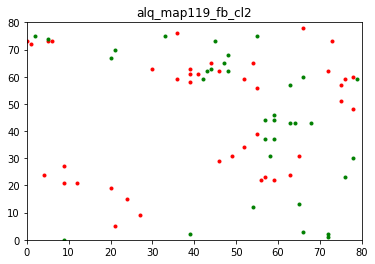

[54.7, 45.3]




In [60]:
alq_fb = pseudo_classifier_label(num_npy, fb_remap['al_fbl'], tr_map['aln_re_id.csv'], alq_map, 
                                 80, "_fb_cl2", "results", True)

Currently mapping.... alq_map000.csv  -->  0
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  17
Total percentage of lab  1  =  45.94594594594595 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  54.054054054054056 %
map saved!!


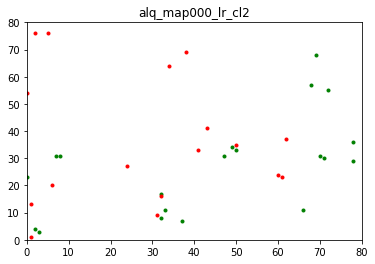

[45.9, 54.1]


Currently mapping.... alq_map001.csv  -->  1
Total no. of points to label.... 30
Label Analysis:-
Total no. of labels:  30
Total no. of lab  1  =  17
Total percentage of lab  1  =  56.666666666666664 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  43.333333333333336 %
map saved!!


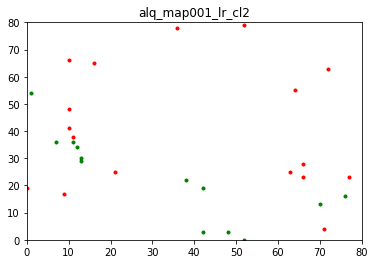

[56.7, 43.3]


Currently mapping.... alq_map002.csv  -->  2
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  14
Total percentage of lab  1  =  51.85185185185185 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  48.148148148148145 %
map saved!!


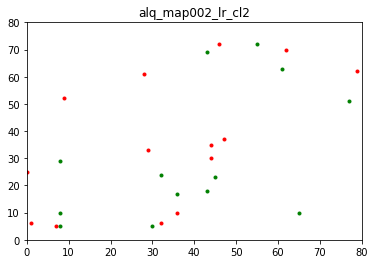

[51.9, 48.1]


Currently mapping.... alq_map003.csv  -->  3
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  26
Total percentage of lab  1  =  65.0 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  35.0 %
map saved!!


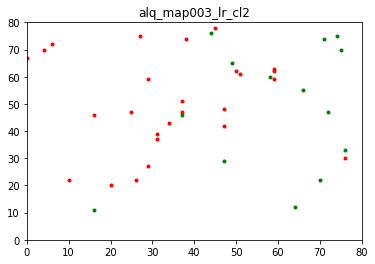

[65.0, 35.0]


Currently mapping.... alq_map004.csv  -->  4
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  12
Total percentage of lab  1  =  44.44444444444444 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  55.55555555555556 %
map saved!!


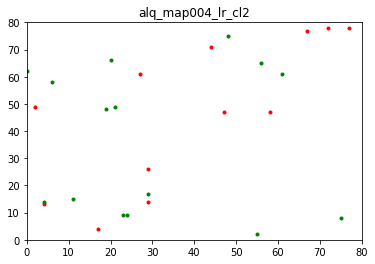

[44.4, 55.6]


Currently mapping.... alq_map005.csv  -->  5
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  18
Total percentage of lab  1  =  56.25 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  43.75 %
map saved!!


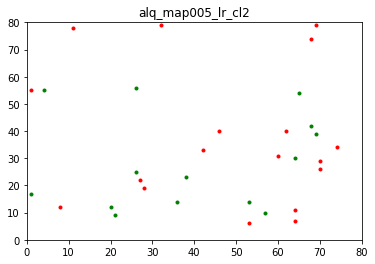

[56.2, 43.8]


Currently mapping.... alq_map006.csv  -->  6
Total no. of points to label.... 14
Label Analysis:-
Total no. of labels:  14
Total no. of lab  1  =  6
Total percentage of lab  1  =  42.857142857142854 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  57.14285714285714 %
map saved!!


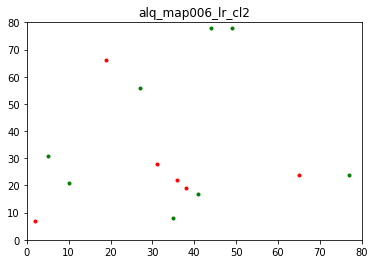

[42.9, 57.1]


Currently mapping.... alq_map007.csv  -->  7
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  11
Total percentage of lab  1  =  35.483870967741936 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  64.51612903225806 %
map saved!!


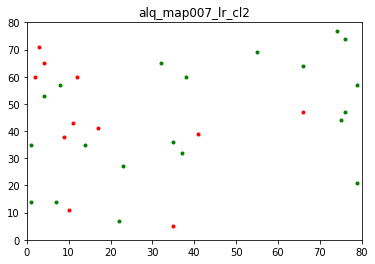

[35.5, 64.5]


Currently mapping.... alq_map008.csv  -->  8
Total no. of points to label.... 39
Label Analysis:-
Total no. of labels:  39
Total no. of lab  1  =  21
Total percentage of lab  1  =  53.84615384615385 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  46.15384615384615 %
map saved!!


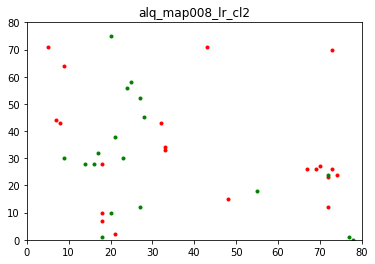

[53.8, 46.2]


Currently mapping.... alq_map009.csv  -->  9
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  26
Total percentage of lab  1  =  63.41463414634146 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  36.58536585365854 %
map saved!!


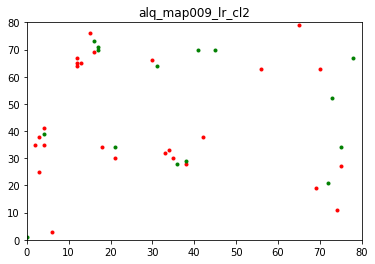

[63.4, 36.6]


Currently mapping.... alq_map010.csv  -->  10
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  17
Total percentage of lab  1  =  54.83870967741935 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  45.16129032258064 %
map saved!!


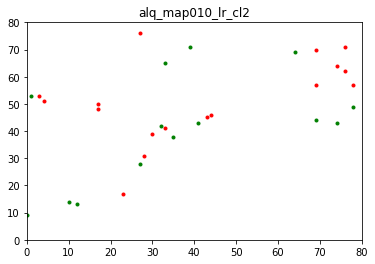

[54.8, 45.2]


Currently mapping.... alq_map011.csv  -->  11
Total no. of points to label.... 39
Label Analysis:-
Total no. of labels:  39
Total no. of lab  1  =  16
Total percentage of lab  1  =  41.02564102564102 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  58.97435897435898 %
map saved!!


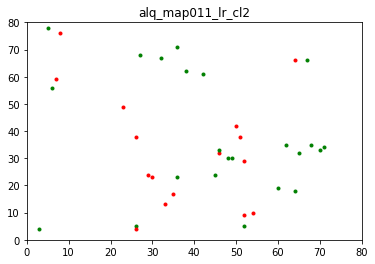

[41.0, 59.0]


Currently mapping.... alq_map012.csv  -->  12
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  18
Total percentage of lab  1  =  41.86046511627907 %
Total no. of lab  2  =  25
Total percentage of lab  2  =  58.139534883720934 %
map saved!!


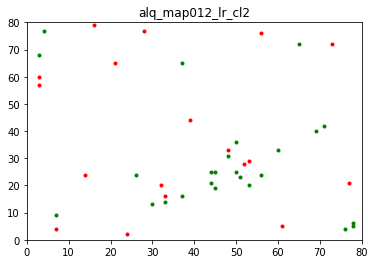

[41.9, 58.1]


Currently mapping.... alq_map013.csv  -->  13
Total no. of points to label.... 29
Label Analysis:-
Total no. of labels:  29
Total no. of lab  1  =  11
Total percentage of lab  1  =  37.93103448275862 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  62.06896551724138 %
map saved!!


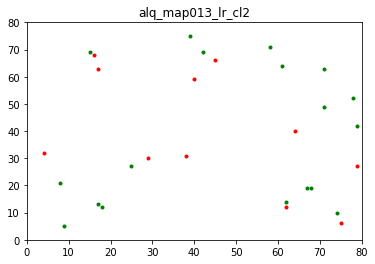

[37.9, 62.1]


Currently mapping.... alq_map014.csv  -->  14
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  21
Total percentage of lab  1  =  58.333333333333336 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  41.66666666666667 %
map saved!!


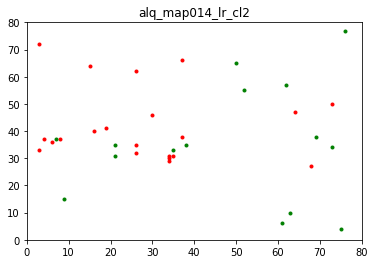

[58.3, 41.7]


Currently mapping.... alq_map015.csv  -->  15
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  25
Total percentage of lab  1  =  41.66666666666667 %
Total no. of lab  2  =  35
Total percentage of lab  2  =  58.333333333333336 %
map saved!!


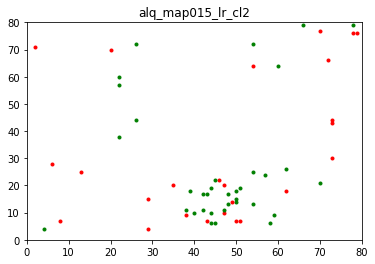

[41.7, 58.3]


Currently mapping.... alq_map016.csv  -->  16
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  18
Total percentage of lab  1  =  48.64864864864865 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  51.35135135135135 %
map saved!!


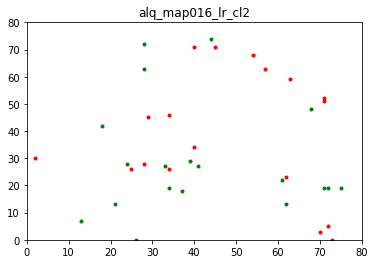

[48.6, 51.4]


Currently mapping.... alq_map017.csv  -->  17
Total no. of points to label.... 26
Label Analysis:-
Total no. of labels:  26
Total no. of lab  1  =  12
Total percentage of lab  1  =  46.15384615384615 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  53.84615384615385 %
map saved!!


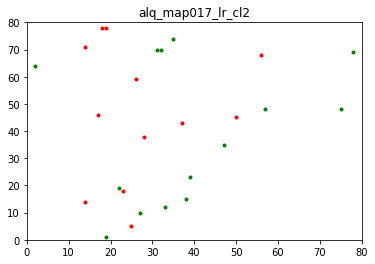

[46.2, 53.8]


Currently mapping.... alq_map018.csv  -->  18
Total no. of points to label.... 51
Label Analysis:-
Total no. of labels:  51
Total no. of lab  1  =  25
Total percentage of lab  1  =  49.01960784313725 %
Total no. of lab  2  =  26
Total percentage of lab  2  =  50.98039215686274 %
map saved!!


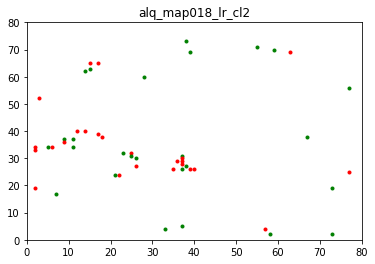

[49.0, 51.0]


Currently mapping.... alq_map019.csv  -->  19
Total no. of points to label.... 17
Label Analysis:-
Total no. of labels:  17
Total no. of lab  1  =  14
Total percentage of lab  1  =  82.35294117647058 %
Total no. of lab  2  =  3
Total percentage of lab  2  =  17.647058823529413 %
map saved!!


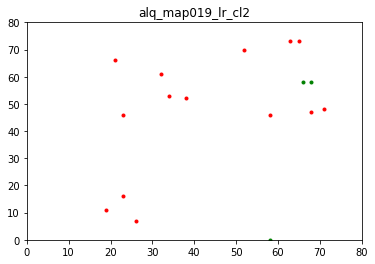

[82.4, 17.6]


Currently mapping.... alq_map020.csv  -->  20
Total no. of points to label.... 33
Label Analysis:-
Total no. of labels:  33
Total no. of lab  1  =  11
Total percentage of lab  1  =  33.33333333333333 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  66.66666666666666 %
map saved!!


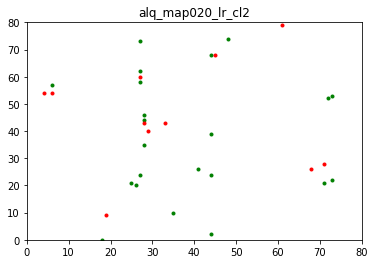

[33.3, 66.7]


Currently mapping.... alq_map021.csv  -->  21
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  27
Total percentage of lab  1  =  65.85365853658537 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  34.146341463414636 %
map saved!!


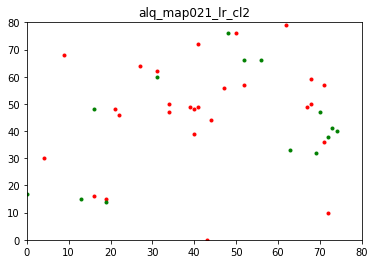

[65.9, 34.1]


Currently mapping.... alq_map022.csv  -->  22
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  23
Total percentage of lab  1  =  71.875 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  28.125 %
map saved!!


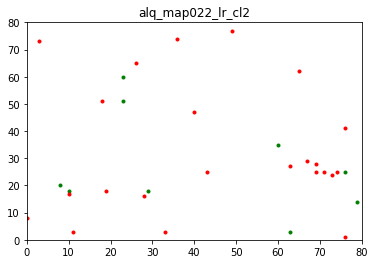

[71.9, 28.1]


Currently mapping.... alq_map023.csv  -->  23
Total no. of points to label.... 28
Label Analysis:-
Total no. of labels:  28
Total no. of lab  1  =  15
Total percentage of lab  1  =  53.57142857142857 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  46.42857142857143 %
map saved!!


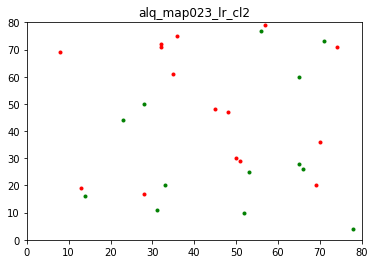

[53.6, 46.4]


Currently mapping.... alq_map024.csv  -->  24
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  16
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  50.0 %
map saved!!


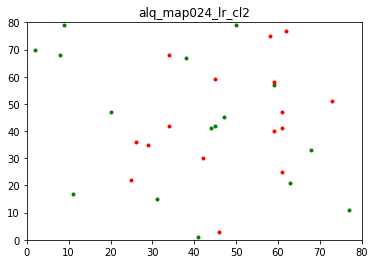

[50.0, 50.0]


Currently mapping.... alq_map025.csv  -->  25
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  24
Total percentage of lab  1  =  55.81395348837209 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  44.18604651162791 %
map saved!!


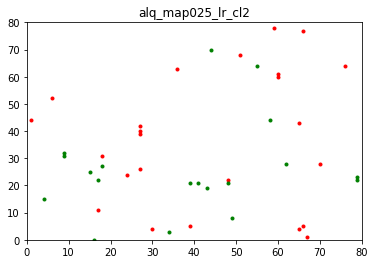

[55.8, 44.2]


Currently mapping.... alq_map026.csv  -->  26
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  18
Total percentage of lab  1  =  56.25 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  43.75 %
map saved!!


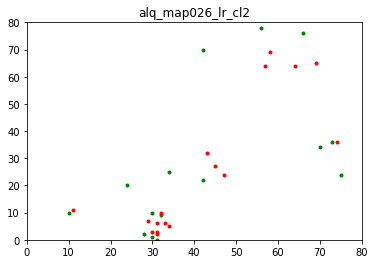

[56.2, 43.8]


Currently mapping.... alq_map027.csv  -->  27
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  26
Total percentage of lab  1  =  72.22222222222221 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  27.77777777777778 %
map saved!!


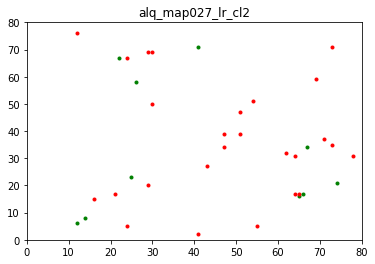

[72.2, 27.8]


Currently mapping.... alq_map028.csv  -->  28
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  23
Total percentage of lab  1  =  44.230769230769226 %
Total no. of lab  2  =  29
Total percentage of lab  2  =  55.769230769230774 %
map saved!!


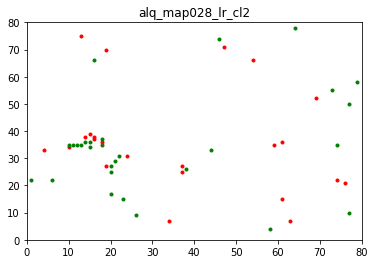

[44.2, 55.8]


Currently mapping.... alq_map029.csv  -->  29
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  23
Total percentage of lab  1  =  53.48837209302325 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  46.51162790697674 %
map saved!!


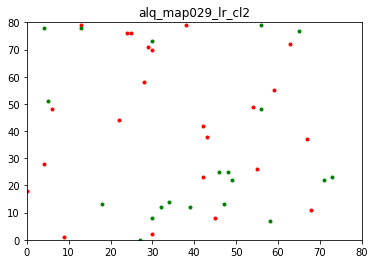

[53.5, 46.5]


Currently mapping.... alq_map030.csv  -->  30
Total no. of points to label.... 54
Label Analysis:-
Total no. of labels:  54
Total no. of lab  1  =  16
Total percentage of lab  1  =  29.629629629629626 %
Total no. of lab  2  =  38
Total percentage of lab  2  =  70.37037037037037 %
map saved!!


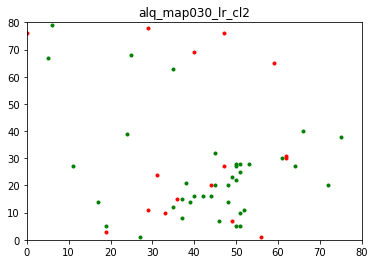

[29.6, 70.4]


Currently mapping.... alq_map031.csv  -->  31
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  16
Total percentage of lab  1  =  39.02439024390244 %
Total no. of lab  2  =  25
Total percentage of lab  2  =  60.97560975609756 %
map saved!!


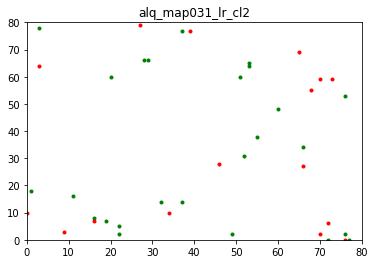

[39.0, 61.0]


Currently mapping.... alq_map032.csv  -->  32
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  28
Total percentage of lab  1  =  46.666666666666664 %
Total no. of lab  2  =  32
Total percentage of lab  2  =  53.333333333333336 %
map saved!!


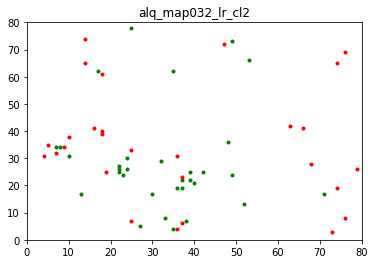

[46.7, 53.3]


Currently mapping.... alq_map033.csv  -->  33
Total no. of points to label.... 84
Label Analysis:-
Total no. of labels:  84
Total no. of lab  1  =  37
Total percentage of lab  1  =  44.047619047619044 %
Total no. of lab  2  =  47
Total percentage of lab  2  =  55.952380952380956 %
map saved!!


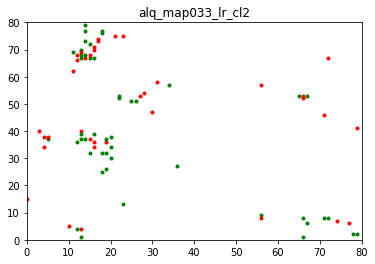

[44.0, 56.0]


Currently mapping.... alq_map034.csv  -->  34
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  30
Total percentage of lab  1  =  57.692307692307686 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  42.30769230769231 %
map saved!!


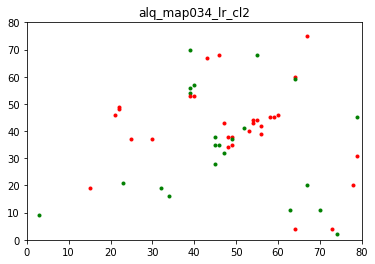

[57.7, 42.3]


Currently mapping.... alq_map035.csv  -->  35
Total no. of points to label.... 64
Label Analysis:-
Total no. of labels:  64
Total no. of lab  1  =  24
Total percentage of lab  1  =  37.5 %
Total no. of lab  2  =  40
Total percentage of lab  2  =  62.5 %
map saved!!


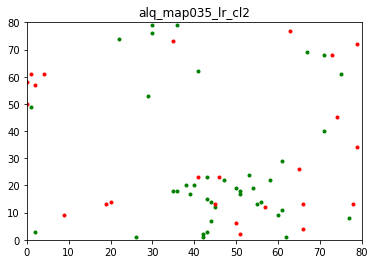

[37.5, 62.5]


Currently mapping.... alq_map036.csv  -->  36
Total no. of points to label.... 69
Label Analysis:-
Total no. of labels:  69
Total no. of lab  1  =  29
Total percentage of lab  1  =  42.028985507246375 %
Total no. of lab  2  =  40
Total percentage of lab  2  =  57.971014492753625 %
map saved!!


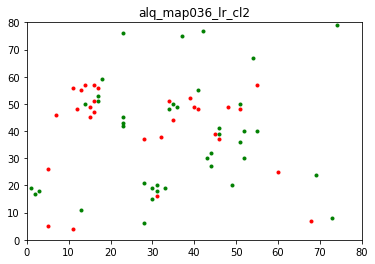

[42.0, 58.0]


Currently mapping.... alq_map037.csv  -->  37
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  16
Total percentage of lab  1  =  44.44444444444444 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  55.55555555555556 %
map saved!!


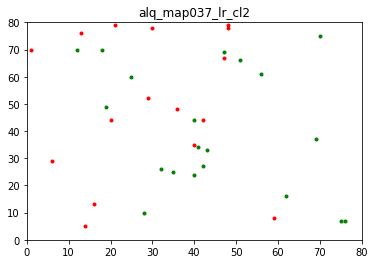

[44.4, 55.6]


Currently mapping.... alq_map038.csv  -->  38
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  22
Total percentage of lab  1  =  51.162790697674424 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  48.837209302325576 %
map saved!!


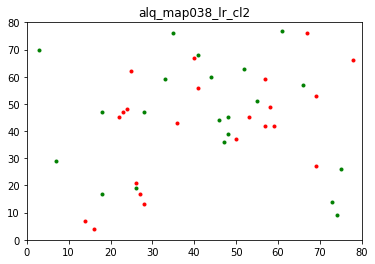

[51.2, 48.8]


Currently mapping.... alq_map039.csv  -->  39
Total no. of points to label.... 46
Label Analysis:-
Total no. of labels:  46
Total no. of lab  1  =  18
Total percentage of lab  1  =  39.130434782608695 %
Total no. of lab  2  =  28
Total percentage of lab  2  =  60.86956521739131 %
map saved!!


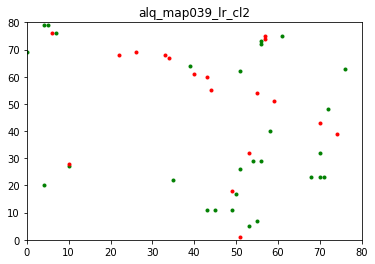

[39.1, 60.9]


Currently mapping.... alq_map040.csv  -->  40
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  9
Total percentage of lab  1  =  29.03225806451613 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  70.96774193548387 %
map saved!!


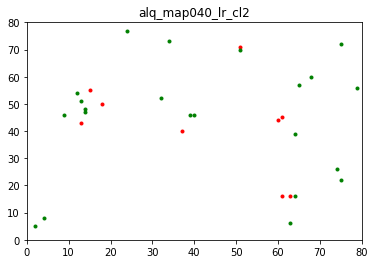

[29.0, 71.0]


Currently mapping.... alq_map041.csv  -->  41
Total no. of points to label.... 34
Label Analysis:-
Total no. of labels:  34
Total no. of lab  1  =  22
Total percentage of lab  1  =  64.70588235294117 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  35.294117647058826 %
map saved!!


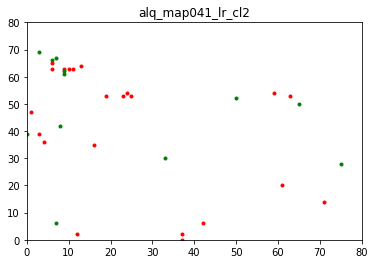

[64.7, 35.3]


Currently mapping.... alq_map042.csv  -->  42
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  20
Total percentage of lab  1  =  52.63157894736842 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  47.368421052631575 %
map saved!!


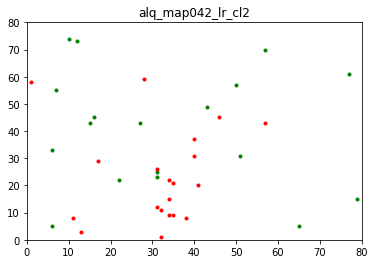

[52.6, 47.4]


Currently mapping.... alq_map043.csv  -->  43
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  11
Total percentage of lab  1  =  40.74074074074074 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  59.25925925925925 %
map saved!!


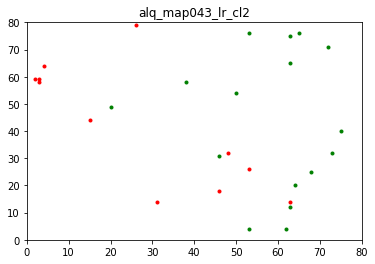

[40.7, 59.3]


Currently mapping.... alq_map044.csv  -->  44
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  22
Total percentage of lab  1  =  53.65853658536586 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  46.34146341463415 %
map saved!!


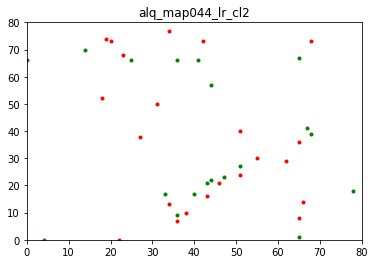

[53.7, 46.3]


Currently mapping.... alq_map045.csv  -->  45
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  18
Total percentage of lab  1  =  43.90243902439025 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  56.09756097560976 %
map saved!!


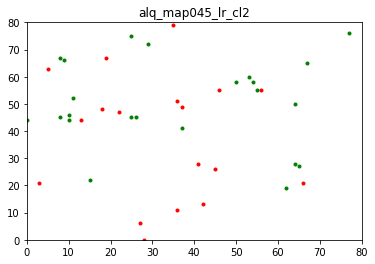

[43.9, 56.1]


Currently mapping.... alq_map046.csv  -->  46
Total no. of points to label.... 26
Label Analysis:-
Total no. of labels:  26
Total no. of lab  1  =  14
Total percentage of lab  1  =  53.84615384615385 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  46.15384615384615 %
map saved!!


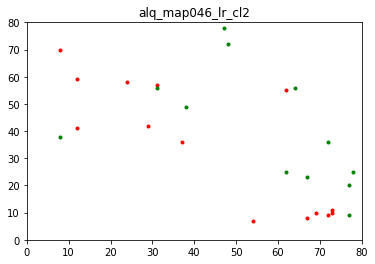

[53.8, 46.2]


Currently mapping.... alq_map047.csv  -->  47
Total no. of points to label.... 24
Label Analysis:-
Total no. of labels:  24
Total no. of lab  1  =  9
Total percentage of lab  1  =  37.5 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  62.5 %
map saved!!


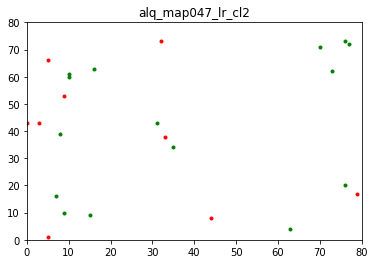

[37.5, 62.5]


Currently mapping.... alq_map048.csv  -->  48
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  17
Total percentage of lab  1  =  42.5 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  57.49999999999999 %
map saved!!


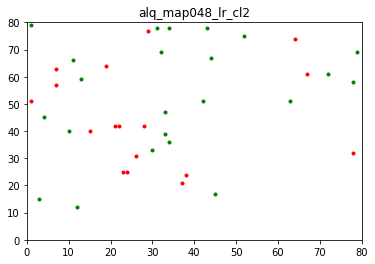

[42.5, 57.5]


Currently mapping.... alq_map049.csv  -->  49
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  16
Total percentage of lab  1  =  42.10526315789473 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  57.89473684210527 %
map saved!!


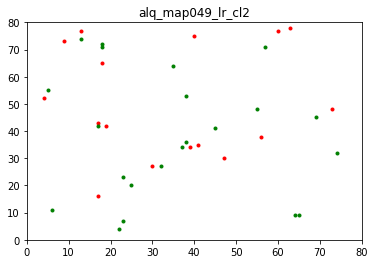

[42.1, 57.9]


Currently mapping.... alq_map050.csv  -->  50
Total no. of points to label.... 125
Label Analysis:-
Total no. of labels:  125
Total no. of lab  1  =  103
Total percentage of lab  1  =  82.39999999999999 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  17.599999999999998 %
map saved!!


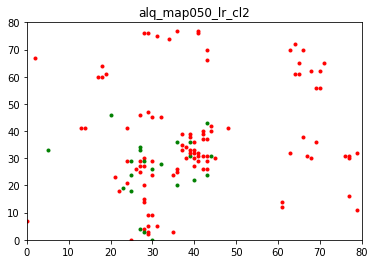

[82.4, 17.6]


Currently mapping.... alq_map051.csv  -->  51
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  33
Total percentage of lab  1  =  55.00000000000001 %
Total no. of lab  2  =  27
Total percentage of lab  2  =  45.0 %
map saved!!


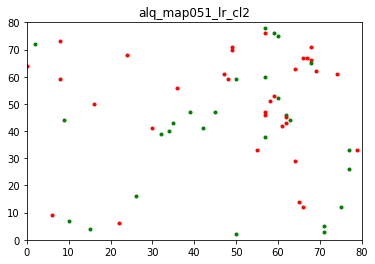

[55.0, 45.0]


Currently mapping.... alq_map052.csv  -->  52
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  27
Total percentage of lab  1  =  51.92307692307693 %
Total no. of lab  2  =  25
Total percentage of lab  2  =  48.07692307692308 %
map saved!!


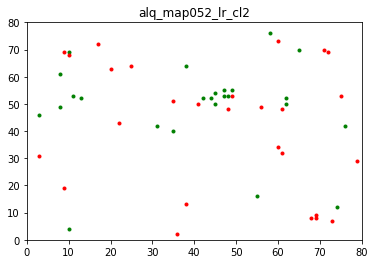

[51.9, 48.1]


Currently mapping.... alq_map053.csv  -->  53
Total no. of points to label.... 51
Label Analysis:-
Total no. of labels:  51
Total no. of lab  1  =  32
Total percentage of lab  1  =  62.745098039215684 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  37.254901960784316 %
map saved!!


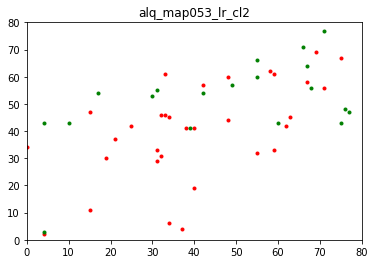

[62.7, 37.3]


Currently mapping.... alq_map054.csv  -->  54
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  22
Total percentage of lab  1  =  61.111111111111114 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  38.88888888888889 %
map saved!!


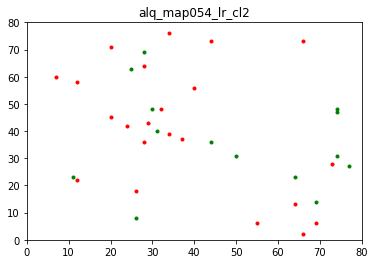

[61.1, 38.9]


Currently mapping.... alq_map055.csv  -->  55
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  36
Total percentage of lab  1  =  48.0 %
Total no. of lab  2  =  39
Total percentage of lab  2  =  52.0 %
map saved!!


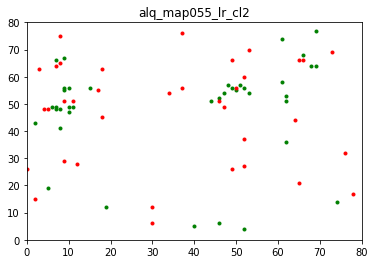

[48.0, 52.0]


Currently mapping.... alq_map056.csv  -->  56
Total no. of points to label.... 19
Label Analysis:-
Total no. of labels:  19
Total no. of lab  1  =  6
Total percentage of lab  1  =  31.57894736842105 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  68.42105263157895 %
map saved!!


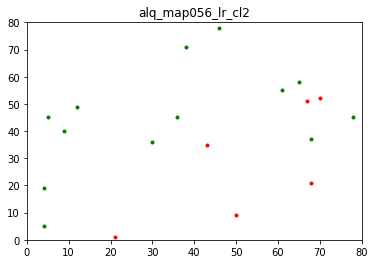

[31.6, 68.4]


Currently mapping.... alq_map057.csv  -->  57
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  19
Total percentage of lab  1  =  51.35135135135135 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  48.64864864864865 %
map saved!!


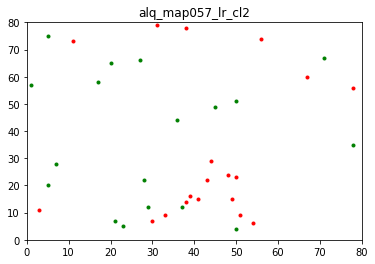

[51.4, 48.6]


Currently mapping.... alq_map058.csv  -->  58
Total no. of points to label.... 44
Label Analysis:-
Total no. of labels:  44
Total no. of lab  1  =  29
Total percentage of lab  1  =  65.9090909090909 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  34.090909090909086 %
map saved!!


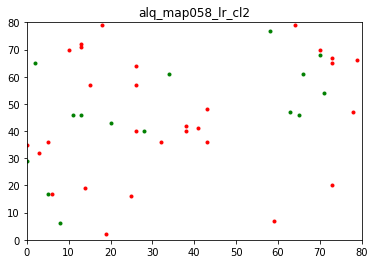

[65.9, 34.1]


Currently mapping.... alq_map059.csv  -->  59
Total no. of points to label.... 33
Label Analysis:-
Total no. of labels:  33
Total no. of lab  1  =  22
Total percentage of lab  1  =  66.66666666666666 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  33.33333333333333 %
map saved!!


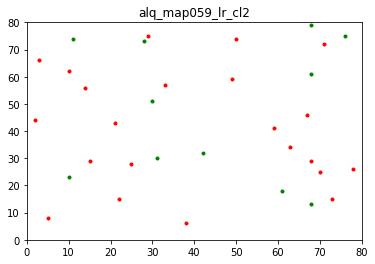

[66.7, 33.3]


Currently mapping.... alq_map060.csv  -->  60
Total no. of points to label.... 62
Label Analysis:-
Total no. of labels:  62
Total no. of lab  1  =  35
Total percentage of lab  1  =  56.451612903225815 %
Total no. of lab  2  =  27
Total percentage of lab  2  =  43.54838709677419 %
map saved!!


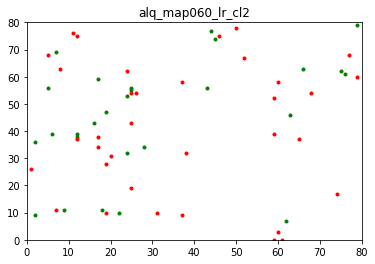

[56.5, 43.5]


Currently mapping.... alq_map061.csv  -->  61
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  24
Total percentage of lab  1  =  58.536585365853654 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  41.46341463414634 %
map saved!!


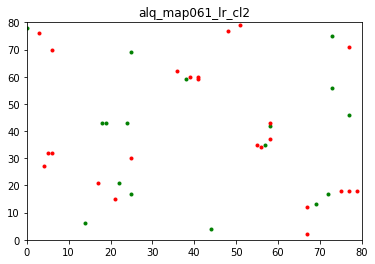

[58.5, 41.5]


Currently mapping.... alq_map062.csv  -->  62
Total no. of points to label.... 24
Label Analysis:-
Total no. of labels:  24
Total no. of lab  1  =  8
Total percentage of lab  1  =  33.33333333333333 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  66.66666666666666 %
map saved!!


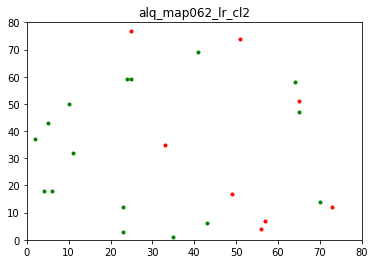

[33.3, 66.7]


Currently mapping.... alq_map063.csv  -->  63
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  22
Total percentage of lab  1  =  51.162790697674424 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  48.837209302325576 %
map saved!!


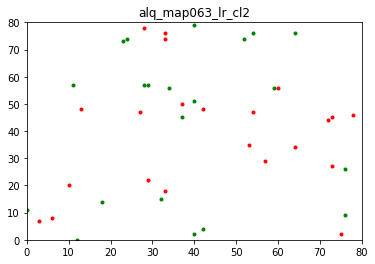

[51.2, 48.8]


Currently mapping.... alq_map064.csv  -->  64
Total no. of points to label.... 50
Label Analysis:-
Total no. of labels:  50
Total no. of lab  1  =  26
Total percentage of lab  1  =  52.0 %
Total no. of lab  2  =  24
Total percentage of lab  2  =  48.0 %
map saved!!


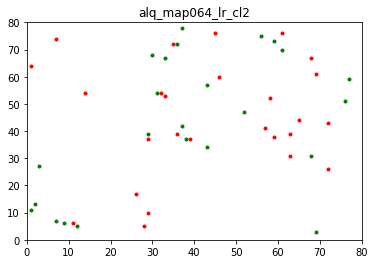

[52.0, 48.0]


Currently mapping.... alq_map065.csv  -->  65
Total no. of points to label.... 44
Label Analysis:-
Total no. of labels:  44
Total no. of lab  1  =  15
Total percentage of lab  1  =  34.090909090909086 %
Total no. of lab  2  =  29
Total percentage of lab  2  =  65.9090909090909 %
map saved!!


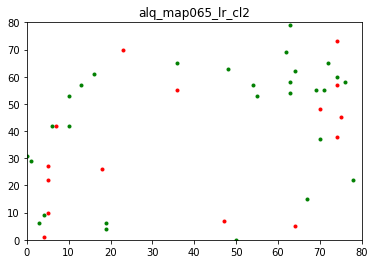

[34.1, 65.9]


Currently mapping.... alq_map066.csv  -->  66
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  30
Total percentage of lab  1  =  49.18032786885246 %
Total no. of lab  2  =  31
Total percentage of lab  2  =  50.81967213114754 %
map saved!!


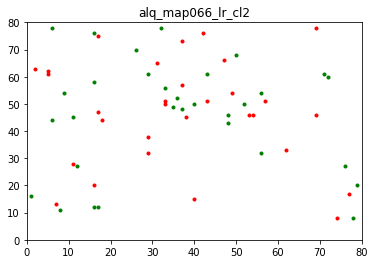

[49.2, 50.8]


Currently mapping.... alq_map067.csv  -->  67
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  25
Total percentage of lab  1  =  69.44444444444444 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  30.555555555555557 %
map saved!!


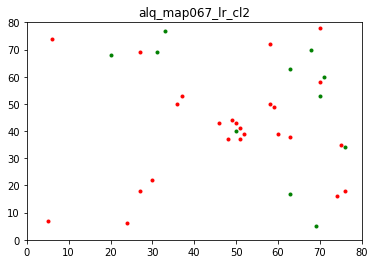

[69.4, 30.6]


Currently mapping.... alq_map068.csv  -->  68
Total no. of points to label.... 45
Label Analysis:-
Total no. of labels:  45
Total no. of lab  1  =  22
Total percentage of lab  1  =  48.888888888888886 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  51.11111111111111 %
map saved!!


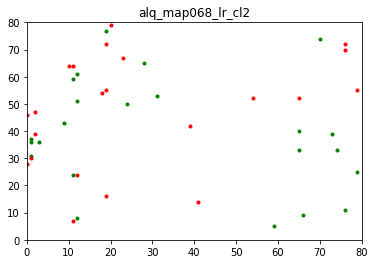

[48.9, 51.1]


Currently mapping.... alq_map069.csv  -->  69
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  30
Total percentage of lab  1  =  57.692307692307686 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  42.30769230769231 %
map saved!!


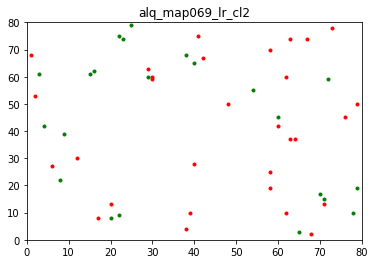

[57.7, 42.3]


Currently mapping.... alq_map070.csv  -->  70
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  29
Total percentage of lab  1  =  48.333333333333336 %
Total no. of lab  2  =  31
Total percentage of lab  2  =  51.66666666666667 %
map saved!!


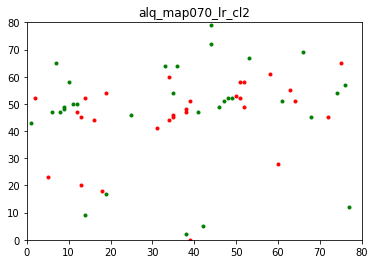

[48.3, 51.7]


Currently mapping.... alq_map071.csv  -->  71
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  22
Total percentage of lab  1  =  42.30769230769231 %
Total no. of lab  2  =  30
Total percentage of lab  2  =  57.692307692307686 %
map saved!!


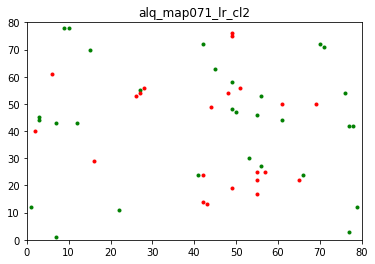

[42.3, 57.7]


Currently mapping.... alq_map072.csv  -->  72
Total no. of points to label.... 62
Label Analysis:-
Total no. of labels:  62
Total no. of lab  1  =  31
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  31
Total percentage of lab  2  =  50.0 %
map saved!!


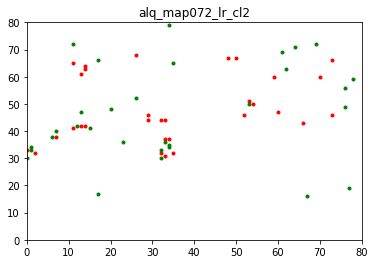

[50.0, 50.0]


Currently mapping.... alq_map073.csv  -->  73
Total no. of points to label.... 85
Label Analysis:-
Total no. of labels:  85
Total no. of lab  1  =  41
Total percentage of lab  1  =  48.23529411764706 %
Total no. of lab  2  =  44
Total percentage of lab  2  =  51.76470588235295 %
map saved!!


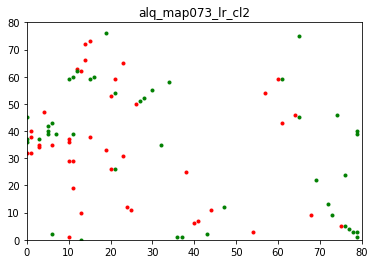

[48.2, 51.8]


Currently mapping.... alq_map074.csv  -->  74
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  33
Total percentage of lab  1  =  56.896551724137936 %
Total no. of lab  2  =  25
Total percentage of lab  2  =  43.103448275862064 %
map saved!!


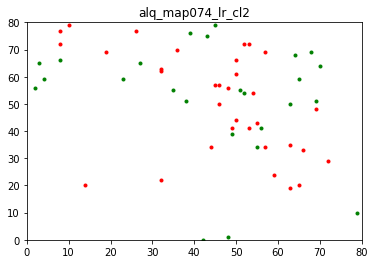

[56.9, 43.1]


Currently mapping.... alq_map075.csv  -->  75
Total no. of points to label.... 59
Label Analysis:-
Total no. of labels:  59
Total no. of lab  1  =  28
Total percentage of lab  1  =  47.45762711864407 %
Total no. of lab  2  =  31
Total percentage of lab  2  =  52.54237288135594 %
map saved!!


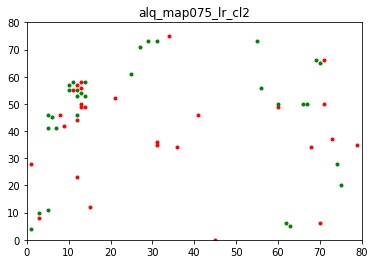

[47.5, 52.5]


Currently mapping.... alq_map076.csv  -->  76
Total no. of points to label.... 72
Label Analysis:-
Total no. of labels:  72
Total no. of lab  1  =  32
Total percentage of lab  1  =  44.44444444444444 %
Total no. of lab  2  =  40
Total percentage of lab  2  =  55.55555555555556 %
map saved!!


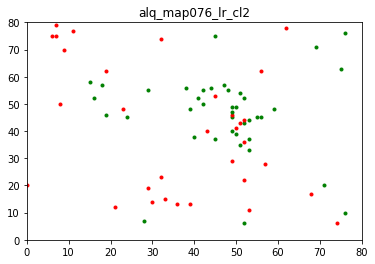

[44.4, 55.6]


Currently mapping.... alq_map077.csv  -->  77
Total no. of points to label.... 42
Label Analysis:-
Total no. of labels:  42
Total no. of lab  1  =  20
Total percentage of lab  1  =  47.61904761904761 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  52.38095238095239 %
map saved!!


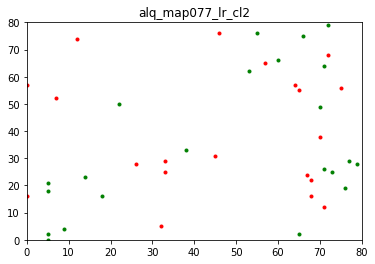

[47.6, 52.4]


Currently mapping.... alq_map078.csv  -->  78
Total no. of points to label.... 63
Label Analysis:-
Total no. of labels:  63
Total no. of lab  1  =  36
Total percentage of lab  1  =  57.14285714285714 %
Total no. of lab  2  =  27
Total percentage of lab  2  =  42.857142857142854 %
map saved!!


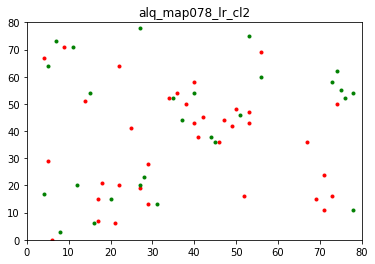

[57.1, 42.9]


Currently mapping.... alq_map079.csv  -->  79
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  20
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  50.0 %
map saved!!


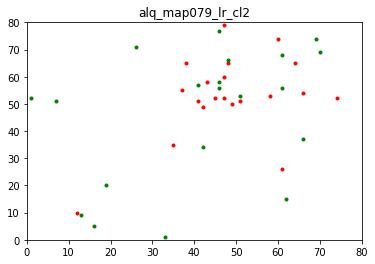

[50.0, 50.0]


Currently mapping.... alq_map080.csv  -->  80
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  10
Total percentage of lab  1  =  27.77777777777778 %
Total no. of lab  2  =  26
Total percentage of lab  2  =  72.22222222222221 %
map saved!!


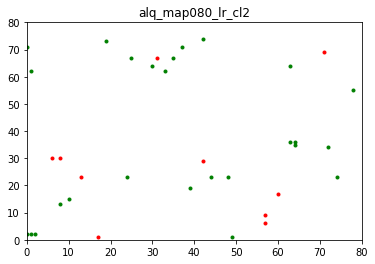

[27.8, 72.2]


Currently mapping.... alq_map081.csv  -->  81
Total no. of points to label.... 77
Label Analysis:-
Total no. of labels:  77
Total no. of lab  1  =  31
Total percentage of lab  1  =  40.25974025974026 %
Total no. of lab  2  =  46
Total percentage of lab  2  =  59.74025974025974 %
map saved!!


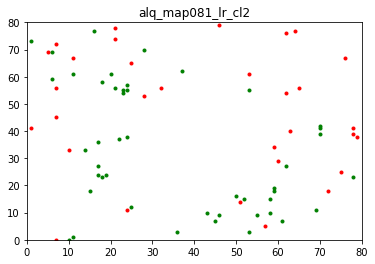

[40.3, 59.7]


Currently mapping.... alq_map082.csv  -->  82
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  23
Total percentage of lab  1  =  63.888888888888886 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  36.11111111111111 %
map saved!!


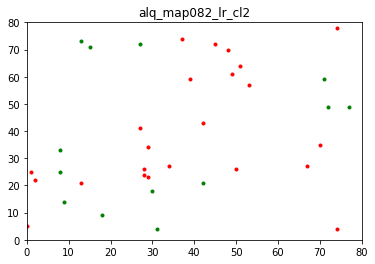

[63.9, 36.1]


Currently mapping.... alq_map083.csv  -->  83
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  22
Total percentage of lab  1  =  51.162790697674424 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  48.837209302325576 %
map saved!!


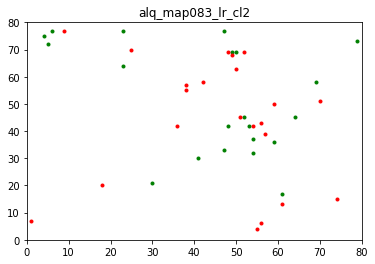

[51.2, 48.8]


Currently mapping.... alq_map084.csv  -->  84
Total no. of points to label.... 49
Label Analysis:-
Total no. of labels:  49
Total no. of lab  1  =  24
Total percentage of lab  1  =  48.97959183673469 %
Total no. of lab  2  =  25
Total percentage of lab  2  =  51.02040816326531 %
map saved!!


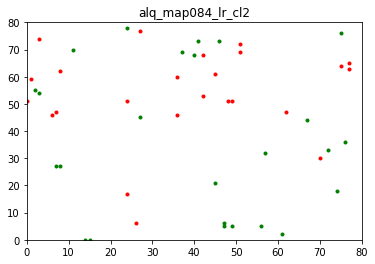

[49.0, 51.0]


Currently mapping.... alq_map085.csv  -->  85
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  22
Total percentage of lab  1  =  37.93103448275862 %
Total no. of lab  2  =  36
Total percentage of lab  2  =  62.06896551724138 %
map saved!!


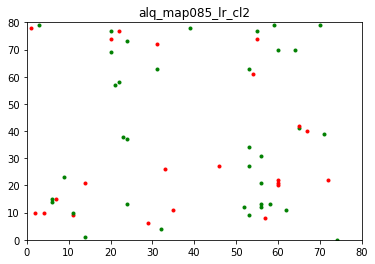

[37.9, 62.1]


Currently mapping.... alq_map086.csv  -->  86
Total no. of points to label.... 74
Label Analysis:-
Total no. of labels:  74
Total no. of lab  1  =  29
Total percentage of lab  1  =  39.189189189189186 %
Total no. of lab  2  =  45
Total percentage of lab  2  =  60.810810810810814 %
map saved!!


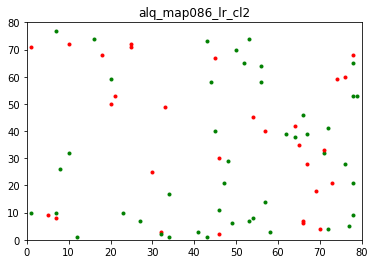

[39.2, 60.8]


Currently mapping.... alq_map087.csv  -->  87
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  23
Total percentage of lab  1  =  53.48837209302325 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  46.51162790697674 %
map saved!!


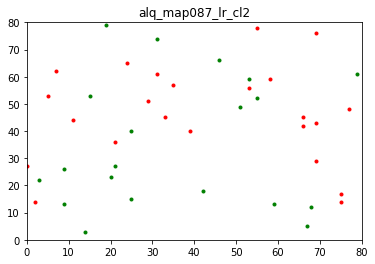

[53.5, 46.5]


Currently mapping.... alq_map088.csv  -->  88
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  40
Total percentage of lab  1  =  53.333333333333336 %
Total no. of lab  2  =  35
Total percentage of lab  2  =  46.666666666666664 %
map saved!!


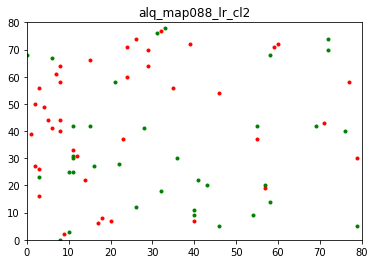

[53.3, 46.7]


Currently mapping.... alq_map089.csv  -->  89
Total no. of points to label.... 68
Label Analysis:-
Total no. of labels:  68
Total no. of lab  1  =  37
Total percentage of lab  1  =  54.41176470588235 %
Total no. of lab  2  =  31
Total percentage of lab  2  =  45.588235294117645 %
map saved!!


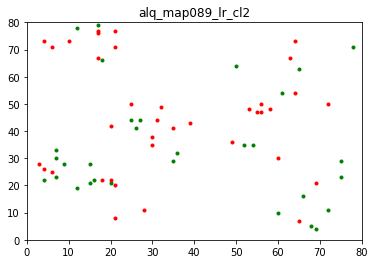

[54.4, 45.6]


Currently mapping.... alq_map090.csv  -->  90
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  51
Total percentage of lab  1  =  62.19512195121951 %
Total no. of lab  2  =  31
Total percentage of lab  2  =  37.80487804878049 %
map saved!!


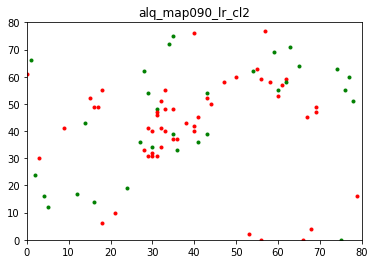

[62.2, 37.8]


Currently mapping.... alq_map091.csv  -->  91
Total no. of points to label.... 65
Label Analysis:-
Total no. of labels:  65
Total no. of lab  1  =  21
Total percentage of lab  1  =  32.30769230769231 %
Total no. of lab  2  =  44
Total percentage of lab  2  =  67.6923076923077 %
map saved!!


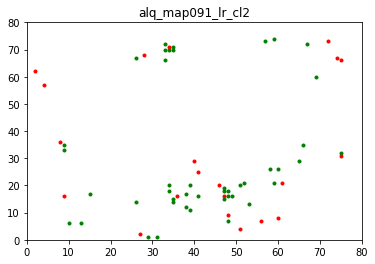

[32.3, 67.7]


Currently mapping.... alq_map092.csv  -->  92
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  30
Total percentage of lab  1  =  51.724137931034484 %
Total no. of lab  2  =  28
Total percentage of lab  2  =  48.275862068965516 %
map saved!!


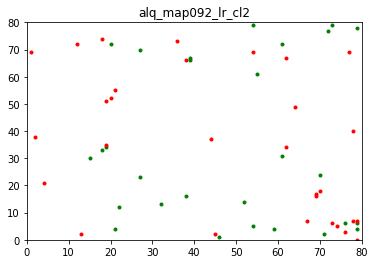

[51.7, 48.3]


Currently mapping.... alq_map093.csv  -->  93
Total no. of points to label.... 46
Label Analysis:-
Total no. of labels:  46
Total no. of lab  1  =  17
Total percentage of lab  1  =  36.95652173913043 %
Total no. of lab  2  =  29
Total percentage of lab  2  =  63.04347826086957 %
map saved!!


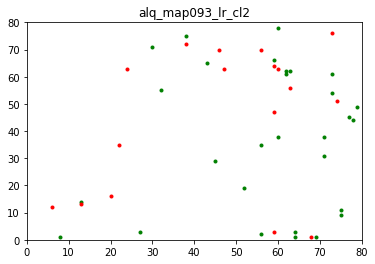

[37.0, 63.0]


Currently mapping.... alq_map094.csv  -->  94
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  32
Total percentage of lab  1  =  52.459016393442624 %
Total no. of lab  2  =  29
Total percentage of lab  2  =  47.540983606557376 %
map saved!!


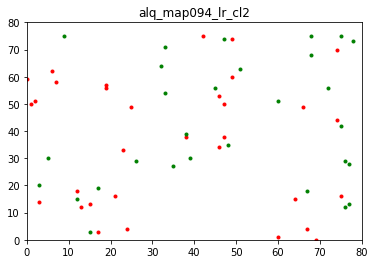

[52.5, 47.5]


Currently mapping.... alq_map095.csv  -->  95
Total no. of points to label.... 84
Label Analysis:-
Total no. of labels:  84
Total no. of lab  1  =  35
Total percentage of lab  1  =  41.66666666666667 %
Total no. of lab  2  =  49
Total percentage of lab  2  =  58.333333333333336 %
map saved!!


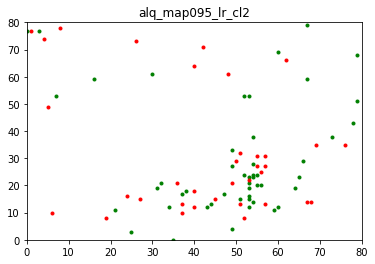

[41.7, 58.3]


Currently mapping.... alq_map096.csv  -->  96
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  16
Total percentage of lab  1  =  42.10526315789473 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  57.89473684210527 %
map saved!!


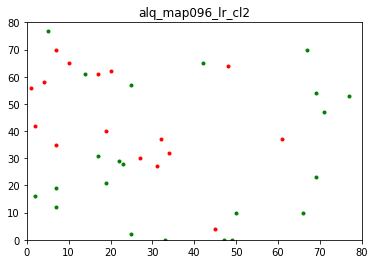

[42.1, 57.9]


Currently mapping.... alq_map097.csv  -->  97
Total no. of points to label.... 47
Label Analysis:-
Total no. of labels:  47
Total no. of lab  1  =  24
Total percentage of lab  1  =  51.06382978723404 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  48.93617021276596 %
map saved!!


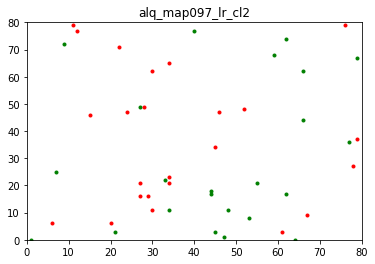

[51.1, 48.9]


Currently mapping.... alq_map098.csv  -->  98
Total no. of points to label.... 88
Label Analysis:-
Total no. of labels:  88
Total no. of lab  1  =  43
Total percentage of lab  1  =  48.86363636363637 %
Total no. of lab  2  =  45
Total percentage of lab  2  =  51.13636363636363 %
map saved!!


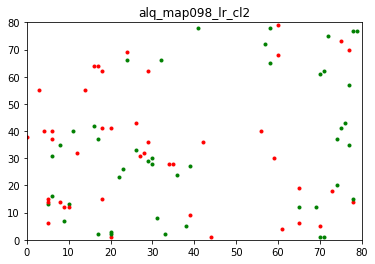

[48.9, 51.1]


Currently mapping.... alq_map099.csv  -->  99
Total no. of points to label.... 64
Label Analysis:-
Total no. of labels:  64
Total no. of lab  1  =  19
Total percentage of lab  1  =  29.6875 %
Total no. of lab  2  =  45
Total percentage of lab  2  =  70.3125 %
map saved!!


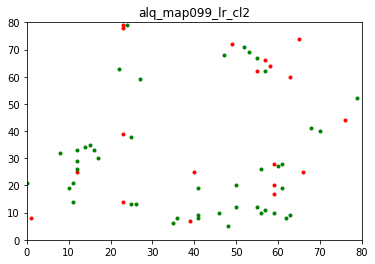

[29.7, 70.3]


Currently mapping.... alq_map100.csv  -->  100
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  20
Total percentage of lab  1  =  38.46153846153847 %
Total no. of lab  2  =  32
Total percentage of lab  2  =  61.53846153846154 %
map saved!!


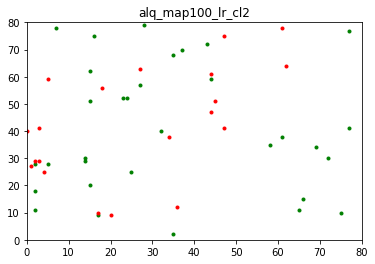

[38.5, 61.5]


Currently mapping.... alq_map101.csv  -->  101
Total no. of points to label.... 69
Label Analysis:-
Total no. of labels:  69
Total no. of lab  1  =  42
Total percentage of lab  1  =  60.86956521739131 %
Total no. of lab  2  =  27
Total percentage of lab  2  =  39.130434782608695 %
map saved!!


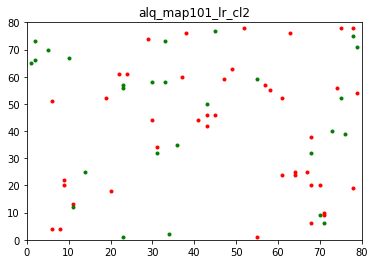

[60.9, 39.1]


Currently mapping.... alq_map102.csv  -->  102
Total no. of points to label.... 71
Label Analysis:-
Total no. of labels:  71
Total no. of lab  1  =  23
Total percentage of lab  1  =  32.3943661971831 %
Total no. of lab  2  =  48
Total percentage of lab  2  =  67.6056338028169 %
map saved!!


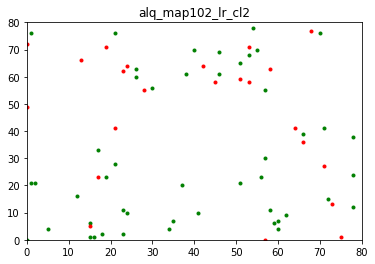

[32.4, 67.6]


Currently mapping.... alq_map103.csv  -->  103
Total no. of points to label.... 42
Label Analysis:-
Total no. of labels:  42
Total no. of lab  1  =  26
Total percentage of lab  1  =  61.904761904761905 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  38.095238095238095 %
map saved!!


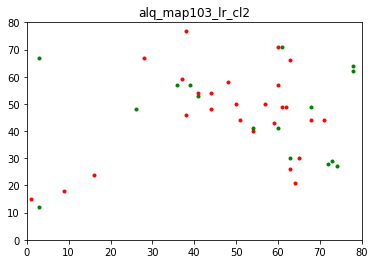

[61.9, 38.1]


Currently mapping.... alq_map104.csv  -->  104
Total no. of points to label.... 68
Label Analysis:-
Total no. of labels:  68
Total no. of lab  1  =  31
Total percentage of lab  1  =  45.588235294117645 %
Total no. of lab  2  =  37
Total percentage of lab  2  =  54.41176470588235 %
map saved!!


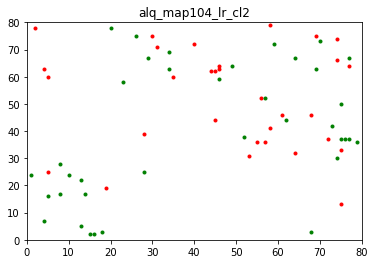

[45.6, 54.4]


Currently mapping.... alq_map105.csv  -->  105
Total no. of points to label.... 59
Label Analysis:-
Total no. of labels:  59
Total no. of lab  1  =  23
Total percentage of lab  1  =  38.983050847457626 %
Total no. of lab  2  =  36
Total percentage of lab  2  =  61.016949152542374 %
map saved!!


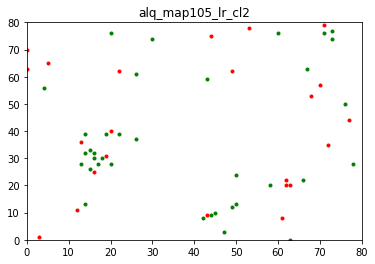

[39.0, 61.0]


Currently mapping.... alq_map106.csv  -->  106
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  28
Total percentage of lab  1  =  45.90163934426229 %
Total no. of lab  2  =  33
Total percentage of lab  2  =  54.09836065573771 %
map saved!!


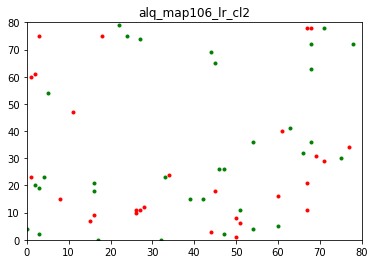

[45.9, 54.1]


Currently mapping.... alq_map107.csv  -->  107
Total no. of points to label.... 55
Label Analysis:-
Total no. of labels:  55
Total no. of lab  1  =  32
Total percentage of lab  1  =  58.18181818181818 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  41.81818181818181 %
map saved!!


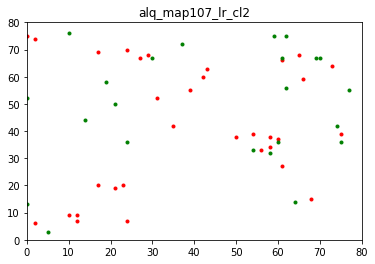

[58.2, 41.8]


Currently mapping.... alq_map108.csv  -->  108
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  39
Total percentage of lab  1  =  47.5609756097561 %
Total no. of lab  2  =  43
Total percentage of lab  2  =  52.4390243902439 %
map saved!!


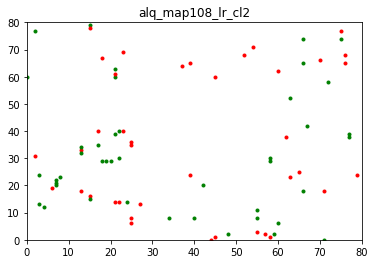

[47.6, 52.4]


Currently mapping.... alq_map109.csv  -->  109
Total no. of points to label.... 95
Label Analysis:-
Total no. of labels:  95
Total no. of lab  1  =  57
Total percentage of lab  1  =  60.0 %
Total no. of lab  2  =  38
Total percentage of lab  2  =  40.0 %
map saved!!


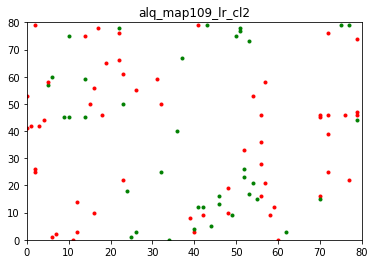

[60.0, 40.0]


Currently mapping.... alq_map110.csv  -->  110
Total no. of points to label.... 77
Label Analysis:-
Total no. of labels:  77
Total no. of lab  1  =  33
Total percentage of lab  1  =  42.857142857142854 %
Total no. of lab  2  =  44
Total percentage of lab  2  =  57.14285714285714 %
map saved!!


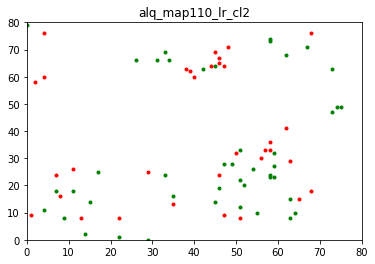

[42.9, 57.1]


Currently mapping.... alq_map111.csv  -->  111
Total no. of points to label.... 141
Label Analysis:-
Total no. of labels:  141
Total no. of lab  1  =  63
Total percentage of lab  1  =  44.680851063829785 %
Total no. of lab  2  =  78
Total percentage of lab  2  =  55.319148936170215 %
map saved!!


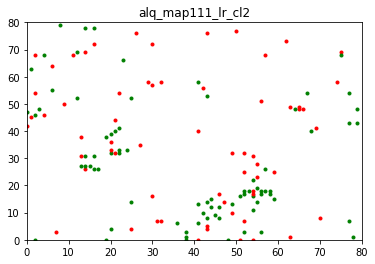

[44.7, 55.3]


Currently mapping.... alq_map112.csv  -->  112
Total no. of points to label.... 96
Label Analysis:-
Total no. of labels:  96
Total no. of lab  1  =  40
Total percentage of lab  1  =  41.66666666666667 %
Total no. of lab  2  =  56
Total percentage of lab  2  =  58.333333333333336 %
map saved!!


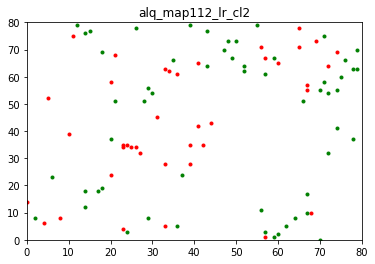

[41.7, 58.3]


Currently mapping.... alq_map113.csv  -->  113
Total no. of points to label.... 76
Label Analysis:-
Total no. of labels:  76
Total no. of lab  1  =  40
Total percentage of lab  1  =  52.63157894736842 %
Total no. of lab  2  =  36
Total percentage of lab  2  =  47.368421052631575 %
map saved!!


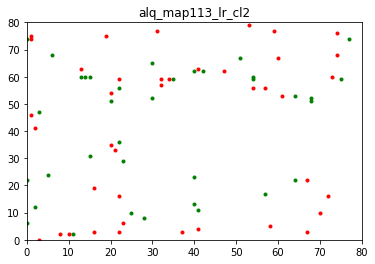

[52.6, 47.4]


Currently mapping.... alq_map114.csv  -->  114
Total no. of points to label.... 71
Label Analysis:-
Total no. of labels:  71
Total no. of lab  1  =  26
Total percentage of lab  1  =  36.61971830985916 %
Total no. of lab  2  =  45
Total percentage of lab  2  =  63.38028169014085 %
map saved!!


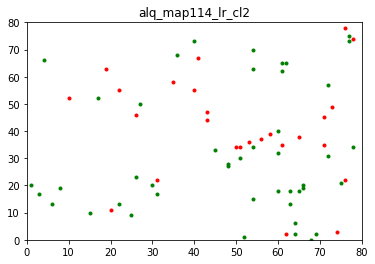

[36.6, 63.4]


Currently mapping.... alq_map115.csv  -->  115
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  24
Total percentage of lab  1  =  29.268292682926827 %
Total no. of lab  2  =  58
Total percentage of lab  2  =  70.73170731707317 %
map saved!!


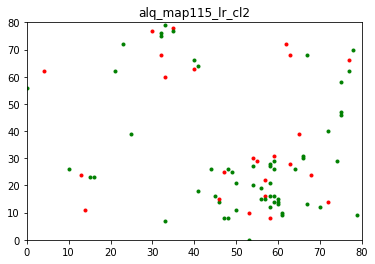

[29.3, 70.7]


Currently mapping.... alq_map116.csv  -->  116
Total no. of points to label.... 112
Label Analysis:-
Total no. of labels:  112
Total no. of lab  1  =  86
Total percentage of lab  1  =  76.78571428571429 %
Total no. of lab  2  =  26
Total percentage of lab  2  =  23.214285714285715 %
map saved!!


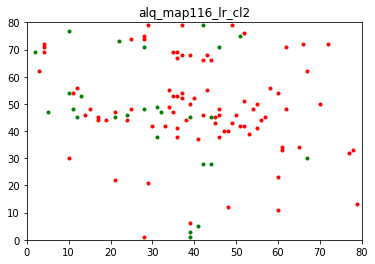

[76.8, 23.2]


Currently mapping.... alq_map117.csv  -->  117
Total no. of points to label.... 93
Label Analysis:-
Total no. of labels:  93
Total no. of lab  1  =  47
Total percentage of lab  1  =  50.53763440860215 %
Total no. of lab  2  =  46
Total percentage of lab  2  =  49.46236559139785 %
map saved!!


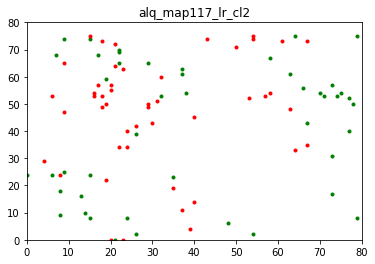

[50.5, 49.5]


Currently mapping.... alq_map118.csv  -->  118
Total no. of points to label.... 108
Label Analysis:-
Total no. of labels:  108
Total no. of lab  1  =  46
Total percentage of lab  1  =  42.592592592592595 %
Total no. of lab  2  =  62
Total percentage of lab  2  =  57.407407407407405 %
map saved!!


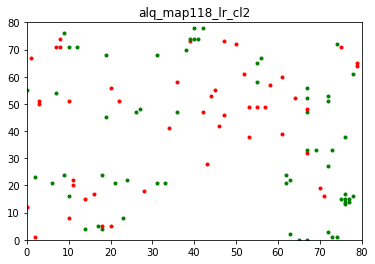

[42.6, 57.4]


Currently mapping.... alq_map119.csv  -->  119
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  40
Total percentage of lab  1  =  53.333333333333336 %
Total no. of lab  2  =  35
Total percentage of lab  2  =  46.666666666666664 %
map saved!!


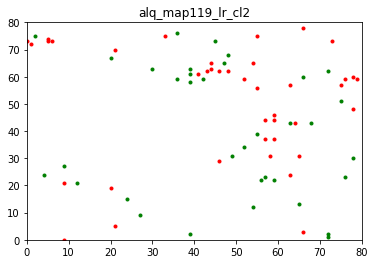

[53.3, 46.7]




In [61]:
alq_lr = pseudo_classifier_label(num_npy, lr_remap['al_lrl'], tr_map['aln_re_id.csv'], alq_map, 
                                 80, "_lr_cl2", "results", True)

Currently mapping.... alq_map000.csv  -->  0
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  23
Total percentage of lab  1  =  62.16216216216216 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  37.83783783783784 %
map saved!!


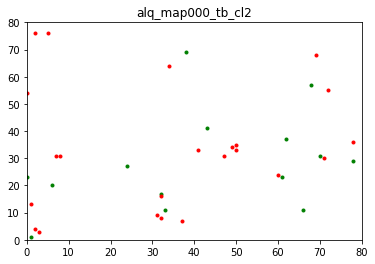

[62.2, 37.8]


Currently mapping.... alq_map001.csv  -->  1
Total no. of points to label.... 30
Label Analysis:-
Total no. of labels:  30
Total no. of lab  1  =  13
Total percentage of lab  1  =  43.333333333333336 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  56.666666666666664 %
map saved!!


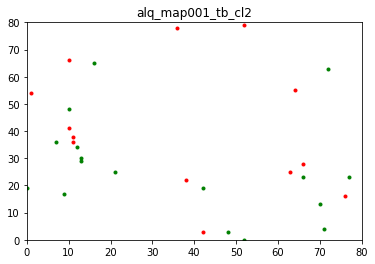

[43.3, 56.7]


Currently mapping.... alq_map002.csv  -->  2
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  17
Total percentage of lab  1  =  62.96296296296296 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  37.03703703703704 %
map saved!!


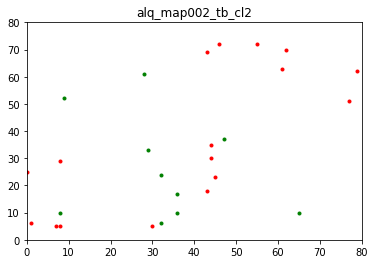

[63.0, 37.0]


Currently mapping.... alq_map003.csv  -->  3
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  20
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  50.0 %
map saved!!


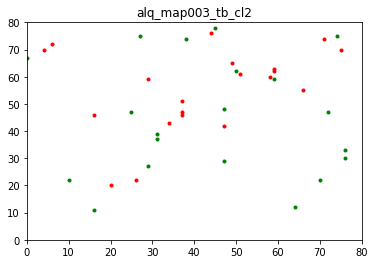

[50.0, 50.0]


Currently mapping.... alq_map004.csv  -->  4
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  15
Total percentage of lab  1  =  55.55555555555556 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  44.44444444444444 %
map saved!!


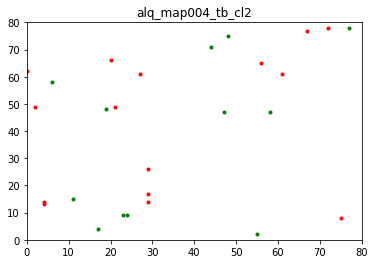

[55.6, 44.4]


Currently mapping.... alq_map005.csv  -->  5
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  21
Total percentage of lab  1  =  65.625 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  34.375 %
map saved!!


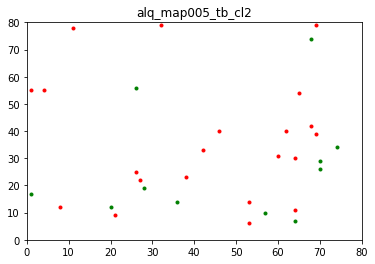

[65.6, 34.4]


Currently mapping.... alq_map006.csv  -->  6
Total no. of points to label.... 14
Label Analysis:-
Total no. of labels:  14
Total no. of lab  1  =  7
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  50.0 %
map saved!!


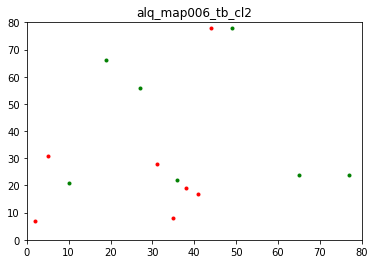

[50.0, 50.0]


Currently mapping.... alq_map007.csv  -->  7
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  18
Total percentage of lab  1  =  58.06451612903226 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  41.935483870967744 %
map saved!!


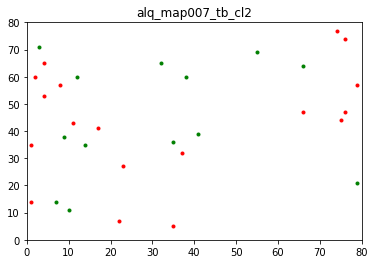

[58.1, 41.9]


Currently mapping.... alq_map008.csv  -->  8
Total no. of points to label.... 39
Label Analysis:-
Total no. of labels:  39
Total no. of lab  1  =  16
Total percentage of lab  1  =  41.02564102564102 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  58.97435897435898 %
map saved!!


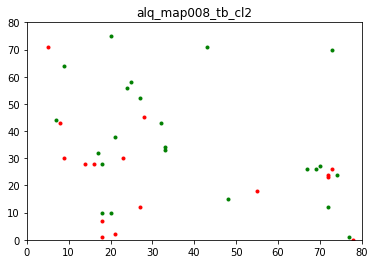

[41.0, 59.0]


Currently mapping.... alq_map009.csv  -->  9
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  18
Total percentage of lab  1  =  43.90243902439025 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  56.09756097560976 %
map saved!!


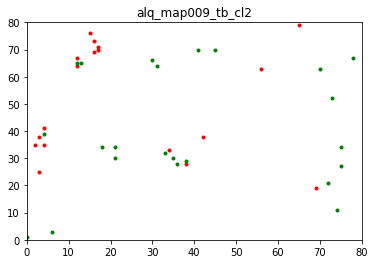

[43.9, 56.1]


Currently mapping.... alq_map010.csv  -->  10
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  23
Total percentage of lab  1  =  74.19354838709677 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  25.806451612903224 %
map saved!!


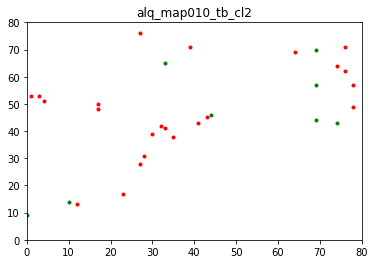

[74.2, 25.8]


Currently mapping.... alq_map011.csv  -->  11
Total no. of points to label.... 39
Label Analysis:-
Total no. of labels:  39
Total no. of lab  1  =  23
Total percentage of lab  1  =  58.97435897435898 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  41.02564102564102 %
map saved!!


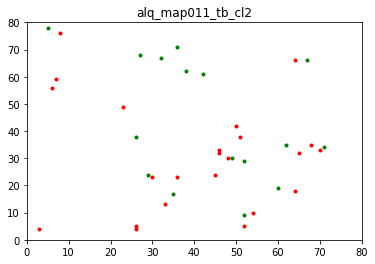

[59.0, 41.0]


Currently mapping.... alq_map012.csv  -->  12
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  29
Total percentage of lab  1  =  67.44186046511628 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  32.55813953488372 %
map saved!!


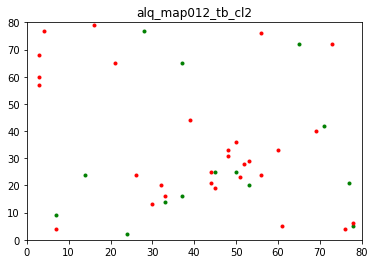

[67.4, 32.6]


Currently mapping.... alq_map013.csv  -->  13
Total no. of points to label.... 29
Label Analysis:-
Total no. of labels:  29
Total no. of lab  1  =  16
Total percentage of lab  1  =  55.172413793103445 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  44.827586206896555 %
map saved!!


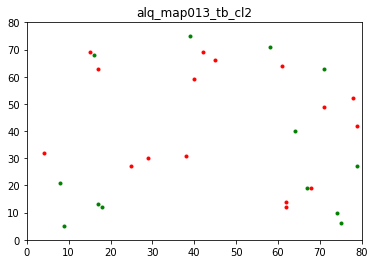

[55.2, 44.8]


Currently mapping.... alq_map014.csv  -->  14
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  23
Total percentage of lab  1  =  63.888888888888886 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  36.11111111111111 %
map saved!!


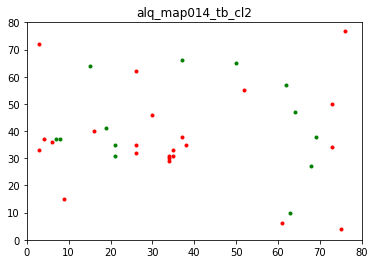

[63.9, 36.1]


Currently mapping.... alq_map015.csv  -->  15
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  32
Total percentage of lab  1  =  53.333333333333336 %
Total no. of lab  2  =  28
Total percentage of lab  2  =  46.666666666666664 %
map saved!!


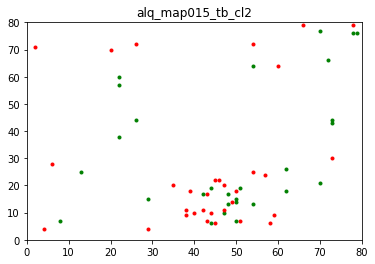

[53.3, 46.7]


Currently mapping.... alq_map016.csv  -->  16
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  17
Total percentage of lab  1  =  45.94594594594595 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  54.054054054054056 %
map saved!!


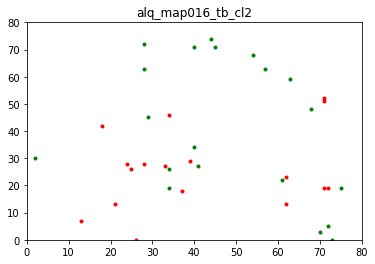

[45.9, 54.1]


Currently mapping.... alq_map017.csv  -->  17
Total no. of points to label.... 26
Label Analysis:-
Total no. of labels:  26
Total no. of lab  1  =  18
Total percentage of lab  1  =  69.23076923076923 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  30.76923076923077 %
map saved!!


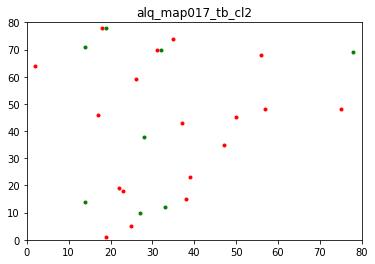

[69.2, 30.8]


Currently mapping.... alq_map018.csv  -->  18
Total no. of points to label.... 51
Label Analysis:-
Total no. of labels:  51
Total no. of lab  1  =  29
Total percentage of lab  1  =  56.86274509803921 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  43.13725490196079 %
map saved!!


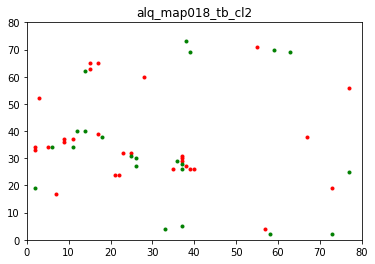

[56.9, 43.1]


Currently mapping.... alq_map019.csv  -->  19
Total no. of points to label.... 17
Label Analysis:-
Total no. of labels:  17
Total no. of lab  1  =  9
Total percentage of lab  1  =  52.94117647058824 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  47.05882352941176 %
map saved!!


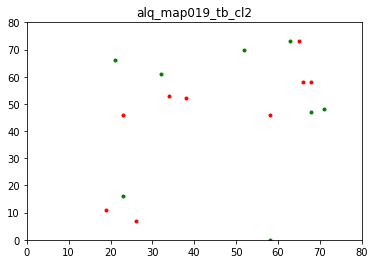

[52.9, 47.1]


Currently mapping.... alq_map020.csv  -->  20
Total no. of points to label.... 33
Label Analysis:-
Total no. of labels:  33
Total no. of lab  1  =  15
Total percentage of lab  1  =  45.45454545454545 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  54.54545454545454 %
map saved!!


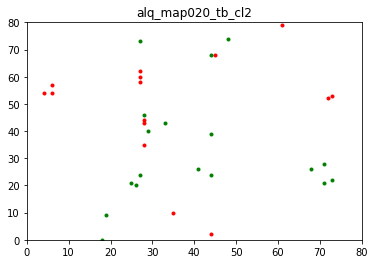

[45.5, 54.5]


Currently mapping.... alq_map021.csv  -->  21
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  24
Total percentage of lab  1  =  58.536585365853654 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  41.46341463414634 %
map saved!!


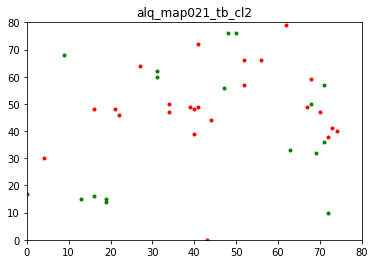

[58.5, 41.5]


Currently mapping.... alq_map022.csv  -->  22
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  11
Total percentage of lab  1  =  34.375 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  65.625 %
map saved!!


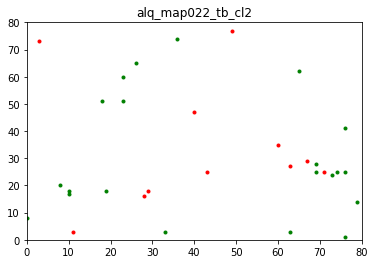

[34.4, 65.6]


Currently mapping.... alq_map023.csv  -->  23
Total no. of points to label.... 28
Label Analysis:-
Total no. of labels:  28
Total no. of lab  1  =  21
Total percentage of lab  1  =  75.0 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  25.0 %
map saved!!


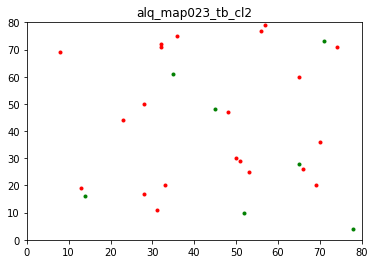

[75.0, 25.0]


Currently mapping.... alq_map024.csv  -->  24
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  16
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  50.0 %
map saved!!


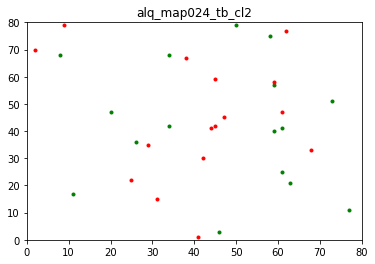

[50.0, 50.0]


Currently mapping.... alq_map025.csv  -->  25
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  20
Total percentage of lab  1  =  46.51162790697674 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  53.48837209302325 %
map saved!!


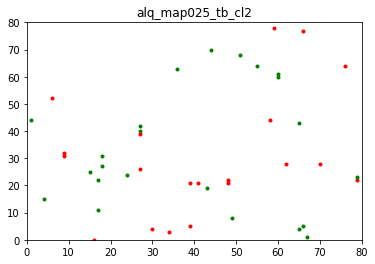

[46.5, 53.5]


Currently mapping.... alq_map026.csv  -->  26
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  17
Total percentage of lab  1  =  53.125 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  46.875 %
map saved!!


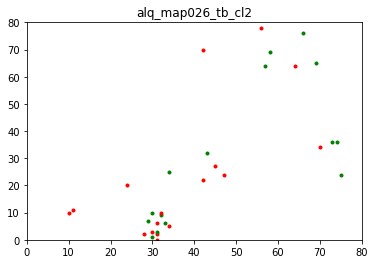

[53.1, 46.9]


Currently mapping.... alq_map027.csv  -->  27
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  20
Total percentage of lab  1  =  55.55555555555556 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  44.44444444444444 %
map saved!!


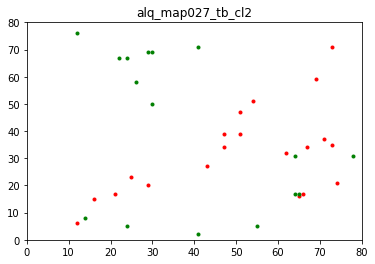

[55.6, 44.4]


Currently mapping.... alq_map028.csv  -->  28
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  25
Total percentage of lab  1  =  48.07692307692308 %
Total no. of lab  2  =  27
Total percentage of lab  2  =  51.92307692307693 %
map saved!!


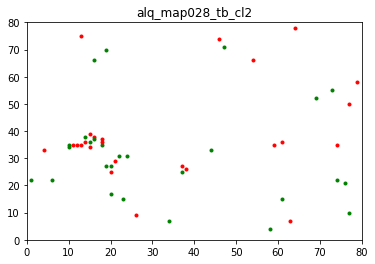

[48.1, 51.9]


Currently mapping.... alq_map029.csv  -->  29
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  23
Total percentage of lab  1  =  53.48837209302325 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  46.51162790697674 %
map saved!!


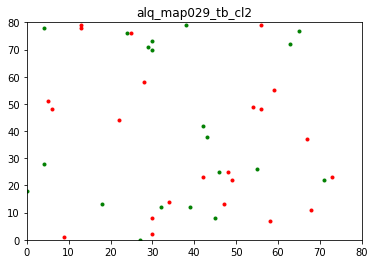

[53.5, 46.5]


Currently mapping.... alq_map030.csv  -->  30
Total no. of points to label.... 54
Label Analysis:-
Total no. of labels:  54
Total no. of lab  1  =  28
Total percentage of lab  1  =  51.85185185185185 %
Total no. of lab  2  =  26
Total percentage of lab  2  =  48.148148148148145 %
map saved!!


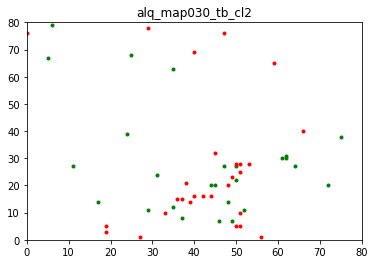

[51.9, 48.1]


Currently mapping.... alq_map031.csv  -->  31
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  16
Total percentage of lab  1  =  39.02439024390244 %
Total no. of lab  2  =  25
Total percentage of lab  2  =  60.97560975609756 %
map saved!!


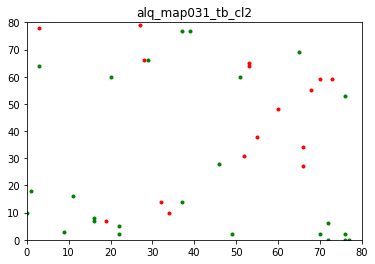

[39.0, 61.0]


Currently mapping.... alq_map032.csv  -->  32
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  33
Total percentage of lab  1  =  55.00000000000001 %
Total no. of lab  2  =  27
Total percentage of lab  2  =  45.0 %
map saved!!


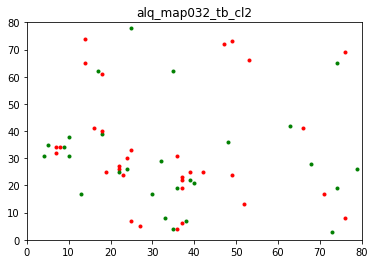

[55.0, 45.0]


Currently mapping.... alq_map033.csv  -->  33
Total no. of points to label.... 84
Label Analysis:-
Total no. of labels:  84
Total no. of lab  1  =  38
Total percentage of lab  1  =  45.23809523809524 %
Total no. of lab  2  =  46
Total percentage of lab  2  =  54.761904761904766 %
map saved!!


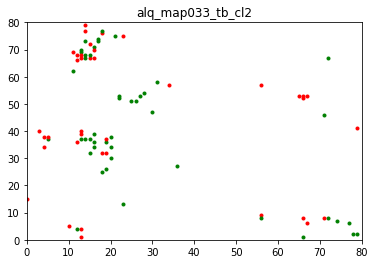

[45.2, 54.8]


Currently mapping.... alq_map034.csv  -->  34
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  29
Total percentage of lab  1  =  55.769230769230774 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  44.230769230769226 %
map saved!!


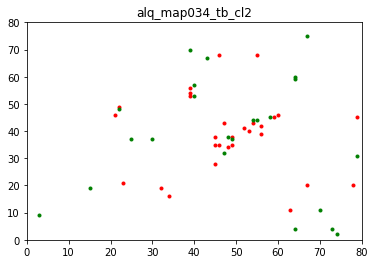

[55.8, 44.2]


Currently mapping.... alq_map035.csv  -->  35
Total no. of points to label.... 64
Label Analysis:-
Total no. of labels:  64
Total no. of lab  1  =  37
Total percentage of lab  1  =  57.8125 %
Total no. of lab  2  =  27
Total percentage of lab  2  =  42.1875 %
map saved!!


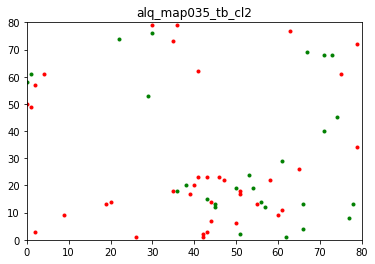

[57.8, 42.2]


Currently mapping.... alq_map036.csv  -->  36
Total no. of points to label.... 69
Label Analysis:-
Total no. of labels:  69
Total no. of lab  1  =  28
Total percentage of lab  1  =  40.57971014492754 %
Total no. of lab  2  =  41
Total percentage of lab  2  =  59.42028985507246 %
map saved!!


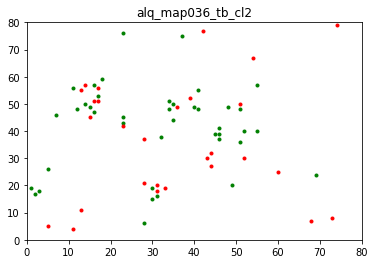

[40.6, 59.4]


Currently mapping.... alq_map037.csv  -->  37
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  19
Total percentage of lab  1  =  52.77777777777778 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  47.22222222222222 %
map saved!!


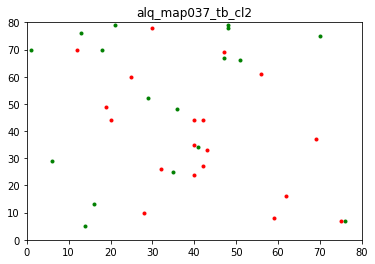

[52.8, 47.2]


Currently mapping.... alq_map038.csv  -->  38
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  26
Total percentage of lab  1  =  60.46511627906976 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  39.53488372093023 %
map saved!!


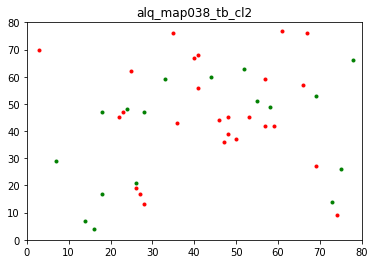

[60.5, 39.5]


Currently mapping.... alq_map039.csv  -->  39
Total no. of points to label.... 46
Label Analysis:-
Total no. of labels:  46
Total no. of lab  1  =  27
Total percentage of lab  1  =  58.69565217391305 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  41.30434782608695 %
map saved!!


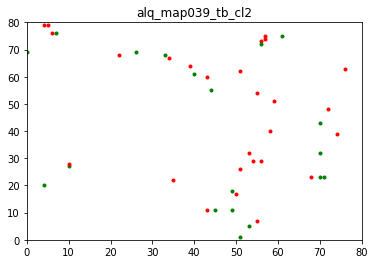

[58.7, 41.3]


Currently mapping.... alq_map040.csv  -->  40
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  19
Total percentage of lab  1  =  61.29032258064516 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  38.70967741935484 %
map saved!!


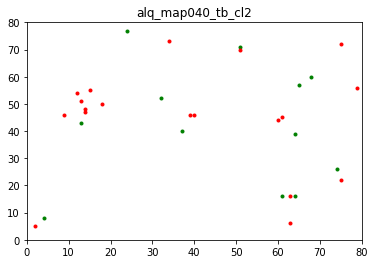

[61.3, 38.7]


Currently mapping.... alq_map041.csv  -->  41
Total no. of points to label.... 34
Label Analysis:-
Total no. of labels:  34
Total no. of lab  1  =  15
Total percentage of lab  1  =  44.11764705882353 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  55.88235294117647 %
map saved!!


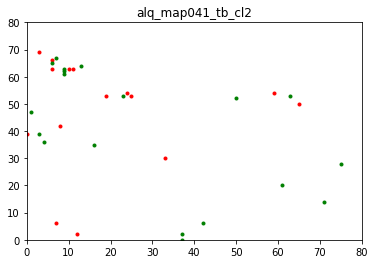

[44.1, 55.9]


Currently mapping.... alq_map042.csv  -->  42
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  19
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  50.0 %
map saved!!


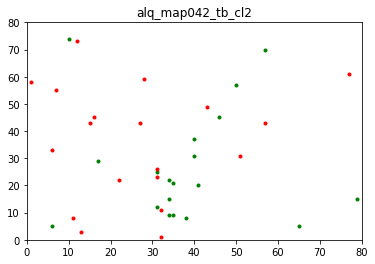

[50.0, 50.0]


Currently mapping.... alq_map043.csv  -->  43
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  12
Total percentage of lab  1  =  44.44444444444444 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  55.55555555555556 %
map saved!!


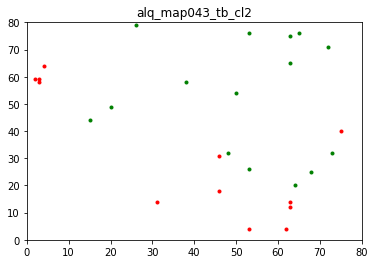

[44.4, 55.6]


Currently mapping.... alq_map044.csv  -->  44
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  14
Total percentage of lab  1  =  34.146341463414636 %
Total no. of lab  2  =  27
Total percentage of lab  2  =  65.85365853658537 %
map saved!!


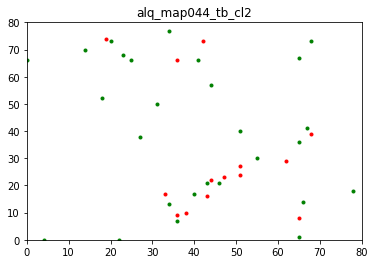

[34.1, 65.9]


Currently mapping.... alq_map045.csv  -->  45
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  17
Total percentage of lab  1  =  41.46341463414634 %
Total no. of lab  2  =  24
Total percentage of lab  2  =  58.536585365853654 %
map saved!!


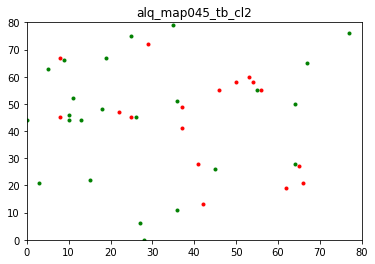

[41.5, 58.5]


Currently mapping.... alq_map046.csv  -->  46
Total no. of points to label.... 26
Label Analysis:-
Total no. of labels:  26
Total no. of lab  1  =  12
Total percentage of lab  1  =  46.15384615384615 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  53.84615384615385 %
map saved!!


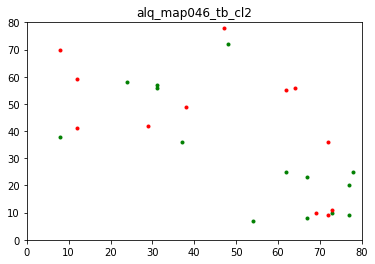

[46.2, 53.8]


Currently mapping.... alq_map047.csv  -->  47
Total no. of points to label.... 24
Label Analysis:-
Total no. of labels:  24
Total no. of lab  1  =  12
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  50.0 %
map saved!!


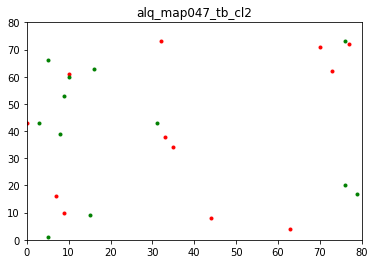

[50.0, 50.0]


Currently mapping.... alq_map048.csv  -->  48
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  15
Total percentage of lab  1  =  37.5 %
Total no. of lab  2  =  25
Total percentage of lab  2  =  62.5 %
map saved!!


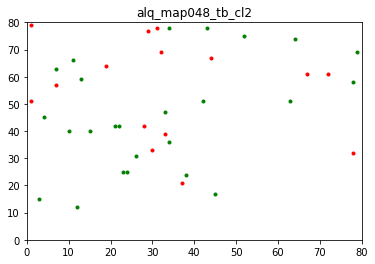

[37.5, 62.5]


Currently mapping.... alq_map049.csv  -->  49
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  23
Total percentage of lab  1  =  60.526315789473685 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  39.473684210526315 %
map saved!!


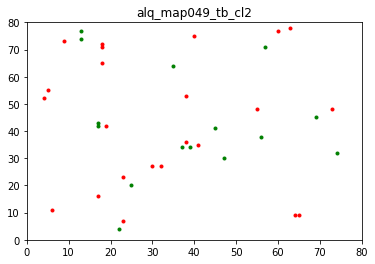

[60.5, 39.5]


Currently mapping.... alq_map050.csv  -->  50
Total no. of points to label.... 125
Label Analysis:-
Total no. of labels:  125
Total no. of lab  1  =  124
Total percentage of lab  1  =  99.2 %
Total no. of lab  2  =  1
Total percentage of lab  2  =  0.8 %
map saved!!


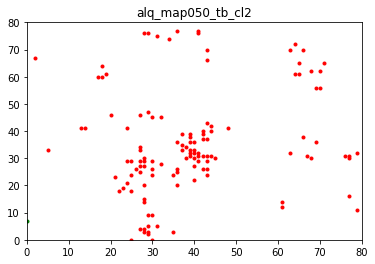

[99.2, 0.8]


Currently mapping.... alq_map051.csv  -->  51
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  38
Total percentage of lab  1  =  63.33333333333333 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  36.666666666666664 %
map saved!!


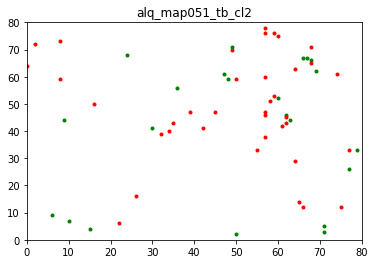

[63.3, 36.7]


Currently mapping.... alq_map052.csv  -->  52
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  20
Total percentage of lab  1  =  38.46153846153847 %
Total no. of lab  2  =  32
Total percentage of lab  2  =  61.53846153846154 %
map saved!!


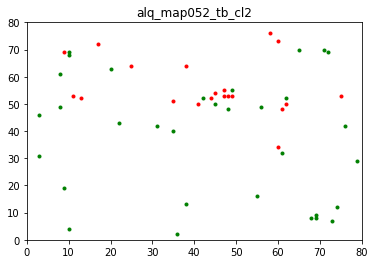

[38.5, 61.5]


Currently mapping.... alq_map053.csv  -->  53
Total no. of points to label.... 51
Label Analysis:-
Total no. of labels:  51
Total no. of lab  1  =  23
Total percentage of lab  1  =  45.09803921568628 %
Total no. of lab  2  =  28
Total percentage of lab  2  =  54.90196078431373 %
map saved!!


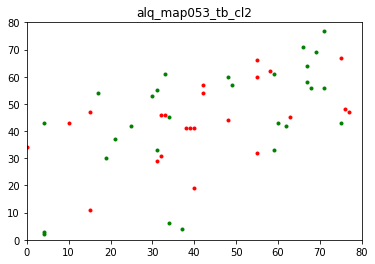

[45.1, 54.9]


Currently mapping.... alq_map054.csv  -->  54
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  22
Total percentage of lab  1  =  61.111111111111114 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  38.88888888888889 %
map saved!!


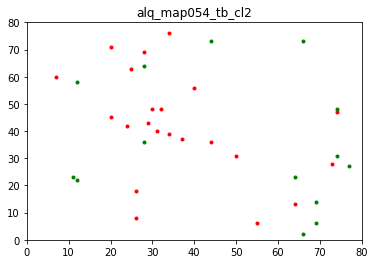

[61.1, 38.9]


Currently mapping.... alq_map055.csv  -->  55
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  28
Total percentage of lab  1  =  37.333333333333336 %
Total no. of lab  2  =  47
Total percentage of lab  2  =  62.66666666666667 %
map saved!!


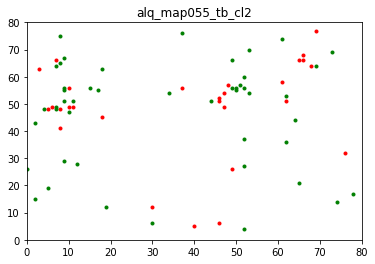

[37.3, 62.7]


Currently mapping.... alq_map056.csv  -->  56
Total no. of points to label.... 19
Label Analysis:-
Total no. of labels:  19
Total no. of lab  1  =  7
Total percentage of lab  1  =  36.84210526315789 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  63.1578947368421 %
map saved!!


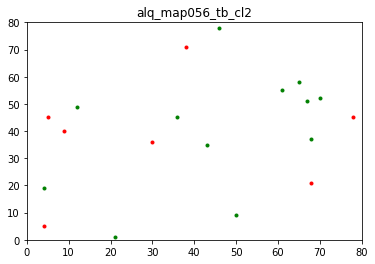

[36.8, 63.2]


Currently mapping.... alq_map057.csv  -->  57
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  20
Total percentage of lab  1  =  54.054054054054056 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  45.94594594594595 %
map saved!!


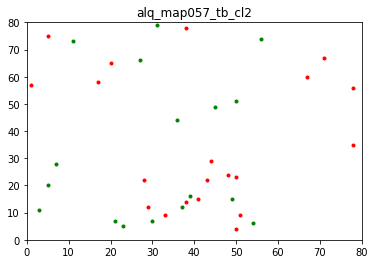

[54.1, 45.9]


Currently mapping.... alq_map058.csv  -->  58
Total no. of points to label.... 44
Label Analysis:-
Total no. of labels:  44
Total no. of lab  1  =  28
Total percentage of lab  1  =  63.63636363636363 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  36.36363636363637 %
map saved!!


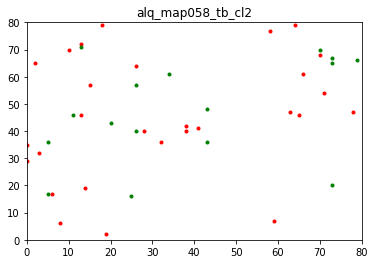

[63.6, 36.4]


Currently mapping.... alq_map059.csv  -->  59
Total no. of points to label.... 33
Label Analysis:-
Total no. of labels:  33
Total no. of lab  1  =  14
Total percentage of lab  1  =  42.42424242424242 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  57.57575757575758 %
map saved!!


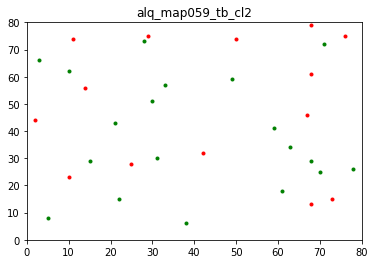

[42.4, 57.6]


Currently mapping.... alq_map060.csv  -->  60
Total no. of points to label.... 62
Label Analysis:-
Total no. of labels:  62
Total no. of lab  1  =  19
Total percentage of lab  1  =  30.64516129032258 %
Total no. of lab  2  =  43
Total percentage of lab  2  =  69.35483870967742 %
map saved!!


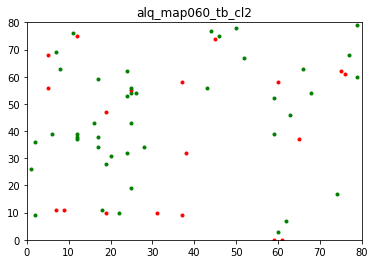

[30.6, 69.4]


Currently mapping.... alq_map061.csv  -->  61
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  25
Total percentage of lab  1  =  60.97560975609756 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  39.02439024390244 %
map saved!!


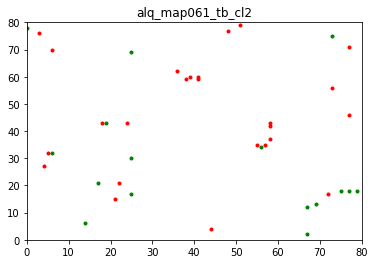

[61.0, 39.0]


Currently mapping.... alq_map062.csv  -->  62
Total no. of points to label.... 24
Label Analysis:-
Total no. of labels:  24
Total no. of lab  1  =  9
Total percentage of lab  1  =  37.5 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  62.5 %
map saved!!


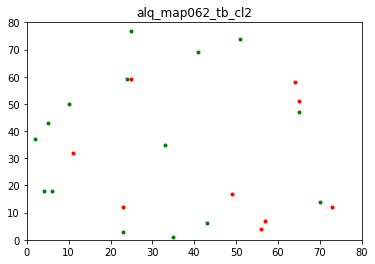

[37.5, 62.5]


Currently mapping.... alq_map063.csv  -->  63
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  19
Total percentage of lab  1  =  44.18604651162791 %
Total no. of lab  2  =  24
Total percentage of lab  2  =  55.81395348837209 %
map saved!!


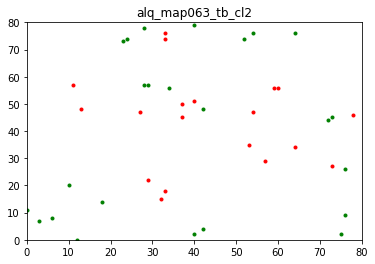

[44.2, 55.8]


Currently mapping.... alq_map064.csv  -->  64
Total no. of points to label.... 50
Label Analysis:-
Total no. of labels:  50
Total no. of lab  1  =  29
Total percentage of lab  1  =  57.99999999999999 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  42.0 %
map saved!!


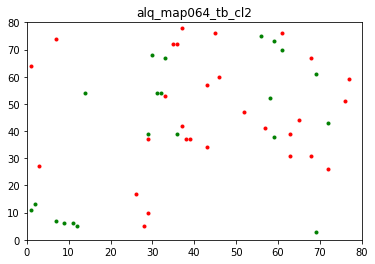

[58.0, 42.0]


Currently mapping.... alq_map065.csv  -->  65
Total no. of points to label.... 44
Label Analysis:-
Total no. of labels:  44
Total no. of lab  1  =  22
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  50.0 %
map saved!!


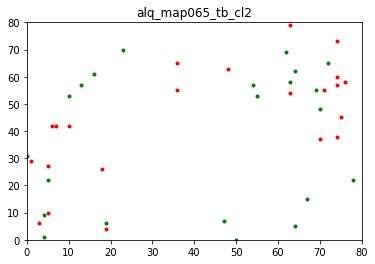

[50.0, 50.0]


Currently mapping.... alq_map066.csv  -->  66
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  32
Total percentage of lab  1  =  52.459016393442624 %
Total no. of lab  2  =  29
Total percentage of lab  2  =  47.540983606557376 %
map saved!!


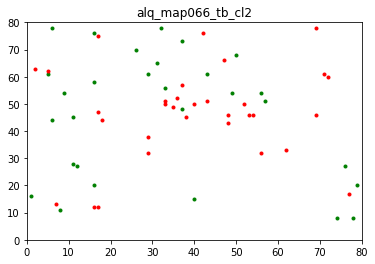

[52.5, 47.5]


Currently mapping.... alq_map067.csv  -->  67
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  24
Total percentage of lab  1  =  66.66666666666666 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  33.33333333333333 %
map saved!!


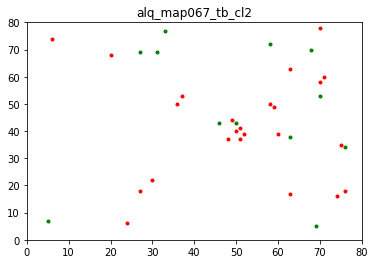

[66.7, 33.3]


Currently mapping.... alq_map068.csv  -->  68
Total no. of points to label.... 45
Label Analysis:-
Total no. of labels:  45
Total no. of lab  1  =  23
Total percentage of lab  1  =  51.11111111111111 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  48.888888888888886 %
map saved!!


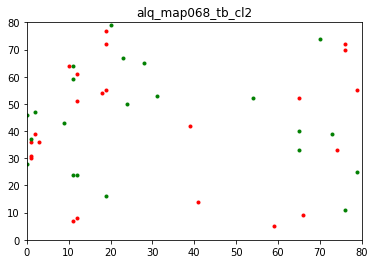

[51.1, 48.9]


Currently mapping.... alq_map069.csv  -->  69
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  21
Total percentage of lab  1  =  40.38461538461539 %
Total no. of lab  2  =  31
Total percentage of lab  2  =  59.61538461538461 %
map saved!!


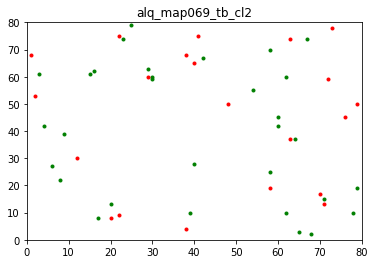

[40.4, 59.6]


Currently mapping.... alq_map070.csv  -->  70
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  36
Total percentage of lab  1  =  60.0 %
Total no. of lab  2  =  24
Total percentage of lab  2  =  40.0 %
map saved!!


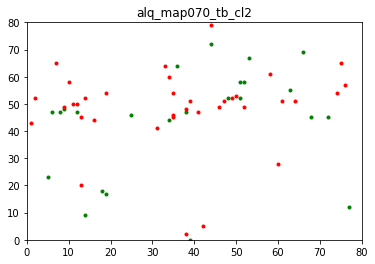

[60.0, 40.0]


Currently mapping.... alq_map071.csv  -->  71
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  18
Total percentage of lab  1  =  34.61538461538461 %
Total no. of lab  2  =  34
Total percentage of lab  2  =  65.38461538461539 %
map saved!!


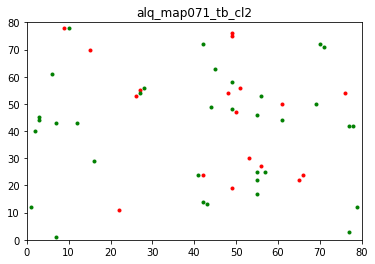

[34.6, 65.4]


Currently mapping.... alq_map072.csv  -->  72
Total no. of points to label.... 62
Label Analysis:-
Total no. of labels:  62
Total no. of lab  1  =  42
Total percentage of lab  1  =  67.74193548387096 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  32.25806451612903 %
map saved!!


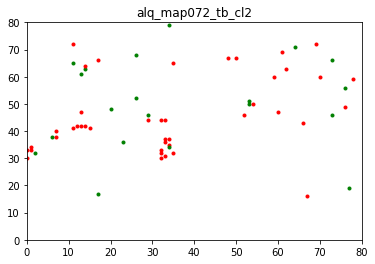

[67.7, 32.3]


Currently mapping.... alq_map073.csv  -->  73
Total no. of points to label.... 85
Label Analysis:-
Total no. of labels:  85
Total no. of lab  1  =  34
Total percentage of lab  1  =  40.0 %
Total no. of lab  2  =  51
Total percentage of lab  2  =  60.0 %
map saved!!


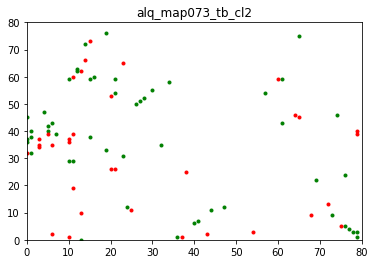

[40.0, 60.0]


Currently mapping.... alq_map074.csv  -->  74
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  29
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  29
Total percentage of lab  2  =  50.0 %
map saved!!


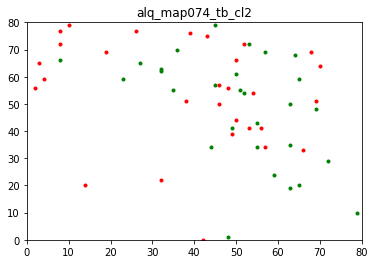

[50.0, 50.0]


Currently mapping.... alq_map075.csv  -->  75
Total no. of points to label.... 59
Label Analysis:-
Total no. of labels:  59
Total no. of lab  1  =  34
Total percentage of lab  1  =  57.6271186440678 %
Total no. of lab  2  =  25
Total percentage of lab  2  =  42.3728813559322 %
map saved!!


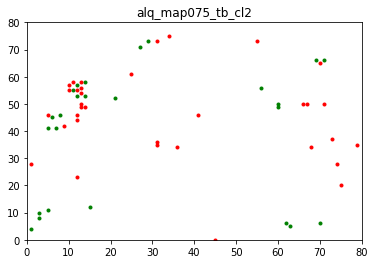

[57.6, 42.4]


Currently mapping.... alq_map076.csv  -->  76
Total no. of points to label.... 72
Label Analysis:-
Total no. of labels:  72
Total no. of lab  1  =  24
Total percentage of lab  1  =  33.33333333333333 %
Total no. of lab  2  =  48
Total percentage of lab  2  =  66.66666666666666 %
map saved!!


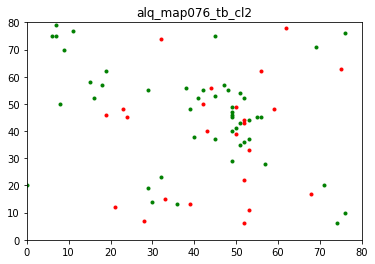

[33.3, 66.7]


Currently mapping.... alq_map077.csv  -->  77
Total no. of points to label.... 42
Label Analysis:-
Total no. of labels:  42
Total no. of lab  1  =  14
Total percentage of lab  1  =  33.33333333333333 %
Total no. of lab  2  =  28
Total percentage of lab  2  =  66.66666666666666 %
map saved!!


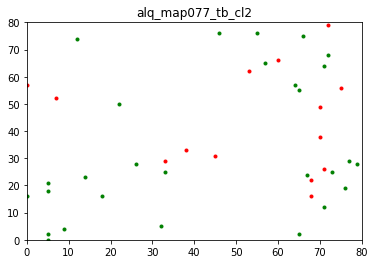

[33.3, 66.7]


Currently mapping.... alq_map078.csv  -->  78
Total no. of points to label.... 63
Label Analysis:-
Total no. of labels:  63
Total no. of lab  1  =  40
Total percentage of lab  1  =  63.49206349206349 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  36.507936507936506 %
map saved!!


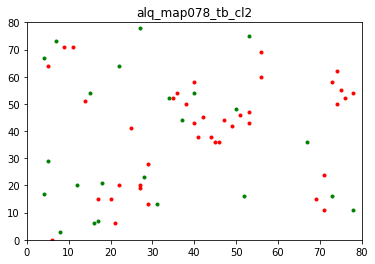

[63.5, 36.5]


Currently mapping.... alq_map079.csv  -->  79
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  30
Total percentage of lab  1  =  75.0 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  25.0 %
map saved!!


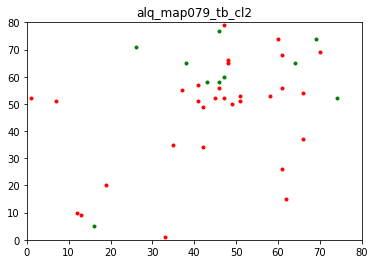

[75.0, 25.0]


Currently mapping.... alq_map080.csv  -->  80
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  17
Total percentage of lab  1  =  47.22222222222222 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  52.77777777777778 %
map saved!!


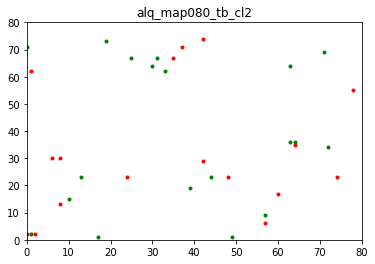

[47.2, 52.8]


Currently mapping.... alq_map081.csv  -->  81
Total no. of points to label.... 77
Label Analysis:-
Total no. of labels:  77
Total no. of lab  1  =  30
Total percentage of lab  1  =  38.961038961038966 %
Total no. of lab  2  =  47
Total percentage of lab  2  =  61.038961038961034 %
map saved!!


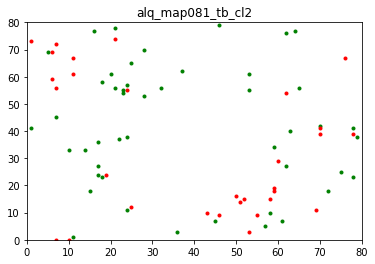

[39.0, 61.0]


Currently mapping.... alq_map082.csv  -->  82
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  14
Total percentage of lab  1  =  38.88888888888889 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  61.111111111111114 %
map saved!!


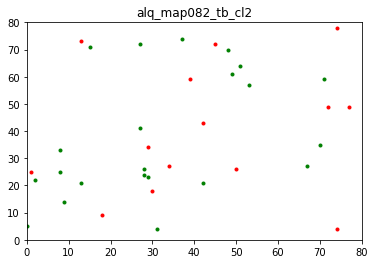

[38.9, 61.1]


Currently mapping.... alq_map083.csv  -->  83
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  28
Total percentage of lab  1  =  65.11627906976744 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  34.883720930232556 %
map saved!!


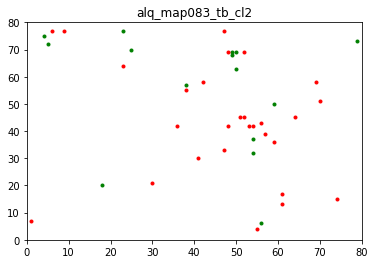

[65.1, 34.9]


Currently mapping.... alq_map084.csv  -->  84
Total no. of points to label.... 49
Label Analysis:-
Total no. of labels:  49
Total no. of lab  1  =  29
Total percentage of lab  1  =  59.183673469387756 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  40.816326530612244 %
map saved!!


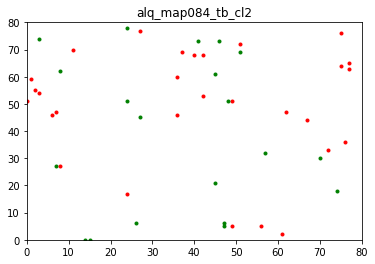

[59.2, 40.8]


Currently mapping.... alq_map085.csv  -->  85
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  26
Total percentage of lab  1  =  44.827586206896555 %
Total no. of lab  2  =  32
Total percentage of lab  2  =  55.172413793103445 %
map saved!!


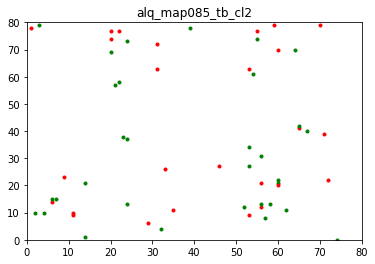

[44.8, 55.2]


Currently mapping.... alq_map086.csv  -->  86
Total no. of points to label.... 74
Label Analysis:-
Total no. of labels:  74
Total no. of lab  1  =  35
Total percentage of lab  1  =  47.2972972972973 %
Total no. of lab  2  =  39
Total percentage of lab  2  =  52.702702702702695 %
map saved!!


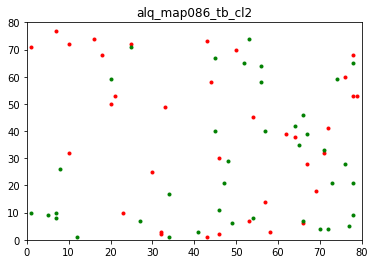

[47.3, 52.7]


Currently mapping.... alq_map087.csv  -->  87
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  24
Total percentage of lab  1  =  55.81395348837209 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  44.18604651162791 %
map saved!!


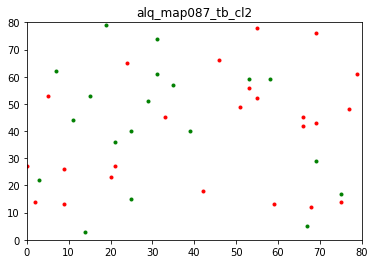

[55.8, 44.2]


Currently mapping.... alq_map088.csv  -->  88
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  25
Total percentage of lab  1  =  33.33333333333333 %
Total no. of lab  2  =  50
Total percentage of lab  2  =  66.66666666666666 %
map saved!!


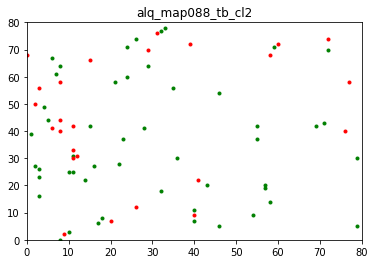

[33.3, 66.7]


Currently mapping.... alq_map089.csv  -->  89
Total no. of points to label.... 68
Label Analysis:-
Total no. of labels:  68
Total no. of lab  1  =  27
Total percentage of lab  1  =  39.705882352941174 %
Total no. of lab  2  =  41
Total percentage of lab  2  =  60.29411764705882 %
map saved!!


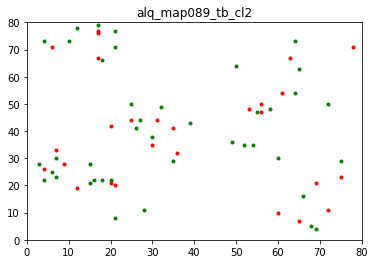

[39.7, 60.3]


Currently mapping.... alq_map090.csv  -->  90
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  50
Total percentage of lab  1  =  60.97560975609756 %
Total no. of lab  2  =  32
Total percentage of lab  2  =  39.02439024390244 %
map saved!!


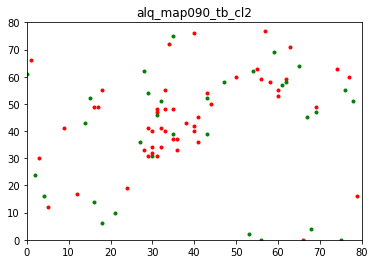

[61.0, 39.0]


Currently mapping.... alq_map091.csv  -->  91
Total no. of points to label.... 65
Label Analysis:-
Total no. of labels:  65
Total no. of lab  1  =  44
Total percentage of lab  1  =  67.6923076923077 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  32.30769230769231 %
map saved!!


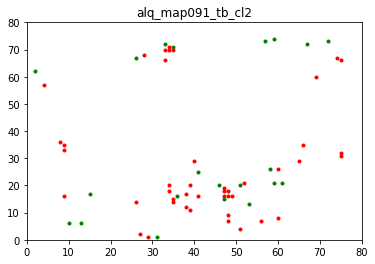

[67.7, 32.3]


Currently mapping.... alq_map092.csv  -->  92
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  28
Total percentage of lab  1  =  48.275862068965516 %
Total no. of lab  2  =  30
Total percentage of lab  2  =  51.724137931034484 %
map saved!!


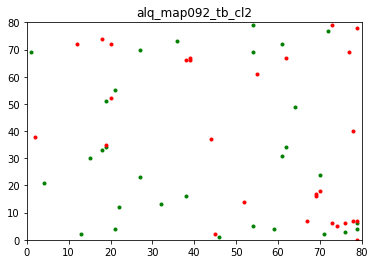

[48.3, 51.7]


Currently mapping.... alq_map093.csv  -->  93
Total no. of points to label.... 46
Label Analysis:-
Total no. of labels:  46
Total no. of lab  1  =  24
Total percentage of lab  1  =  52.17391304347826 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  47.82608695652174 %
map saved!!


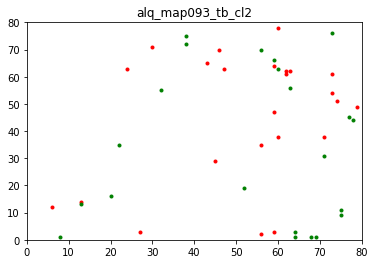

[52.2, 47.8]


Currently mapping.... alq_map094.csv  -->  94
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  32
Total percentage of lab  1  =  52.459016393442624 %
Total no. of lab  2  =  29
Total percentage of lab  2  =  47.540983606557376 %
map saved!!


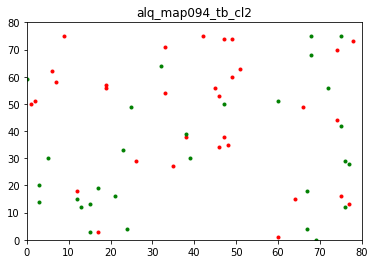

[52.5, 47.5]


Currently mapping.... alq_map095.csv  -->  95
Total no. of points to label.... 84
Label Analysis:-
Total no. of labels:  84
Total no. of lab  1  =  33
Total percentage of lab  1  =  39.285714285714285 %
Total no. of lab  2  =  51
Total percentage of lab  2  =  60.71428571428571 %
map saved!!


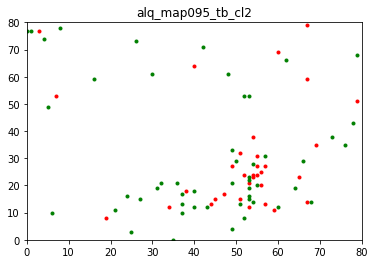

[39.3, 60.7]


Currently mapping.... alq_map096.csv  -->  96
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  18
Total percentage of lab  1  =  47.368421052631575 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  52.63157894736842 %
map saved!!


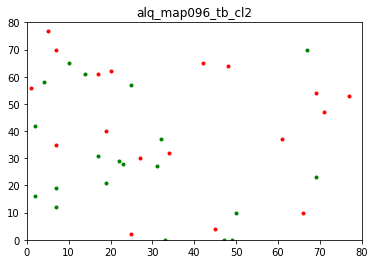

[47.4, 52.6]


Currently mapping.... alq_map097.csv  -->  97
Total no. of points to label.... 47
Label Analysis:-
Total no. of labels:  47
Total no. of lab  1  =  22
Total percentage of lab  1  =  46.808510638297875 %
Total no. of lab  2  =  25
Total percentage of lab  2  =  53.191489361702125 %
map saved!!


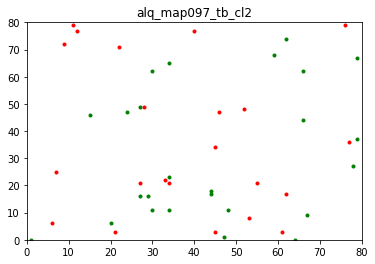

[46.8, 53.2]


Currently mapping.... alq_map098.csv  -->  98
Total no. of points to label.... 88
Label Analysis:-
Total no. of labels:  88
Total no. of lab  1  =  43
Total percentage of lab  1  =  48.86363636363637 %
Total no. of lab  2  =  45
Total percentage of lab  2  =  51.13636363636363 %
map saved!!


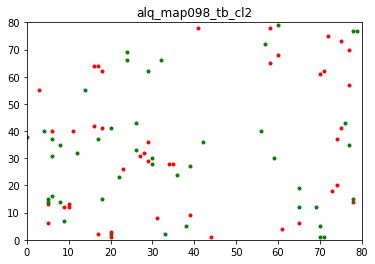

[48.9, 51.1]


Currently mapping.... alq_map099.csv  -->  99
Total no. of points to label.... 64
Label Analysis:-
Total no. of labels:  64
Total no. of lab  1  =  34
Total percentage of lab  1  =  53.125 %
Total no. of lab  2  =  30
Total percentage of lab  2  =  46.875 %
map saved!!


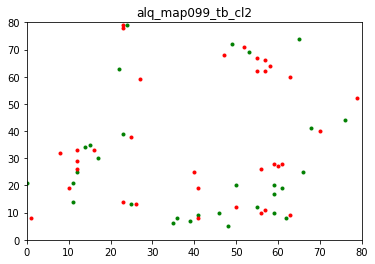

[53.1, 46.9]


Currently mapping.... alq_map100.csv  -->  100
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  19
Total percentage of lab  1  =  36.53846153846153 %
Total no. of lab  2  =  33
Total percentage of lab  2  =  63.46153846153846 %
map saved!!


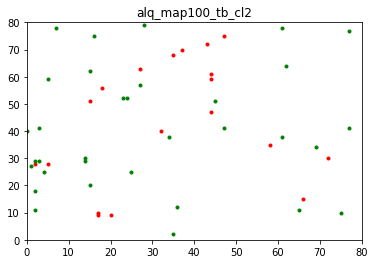

[36.5, 63.5]


Currently mapping.... alq_map101.csv  -->  101
Total no. of points to label.... 69
Label Analysis:-
Total no. of labels:  69
Total no. of lab  1  =  35
Total percentage of lab  1  =  50.72463768115942 %
Total no. of lab  2  =  34
Total percentage of lab  2  =  49.275362318840585 %
map saved!!


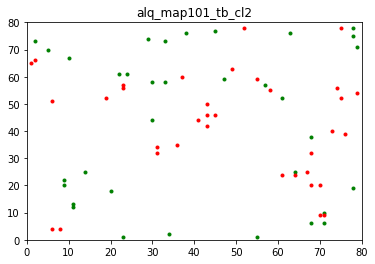

[50.7, 49.3]


Currently mapping.... alq_map102.csv  -->  102
Total no. of points to label.... 71
Label Analysis:-
Total no. of labels:  71
Total no. of lab  1  =  41
Total percentage of lab  1  =  57.74647887323944 %
Total no. of lab  2  =  30
Total percentage of lab  2  =  42.25352112676056 %
map saved!!


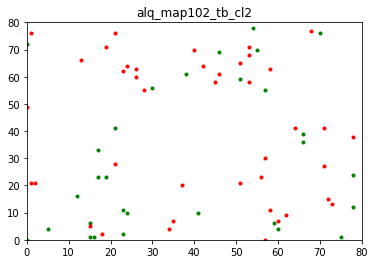

[57.7, 42.3]


Currently mapping.... alq_map103.csv  -->  103
Total no. of points to label.... 42
Label Analysis:-
Total no. of labels:  42
Total no. of lab  1  =  21
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  50.0 %
map saved!!


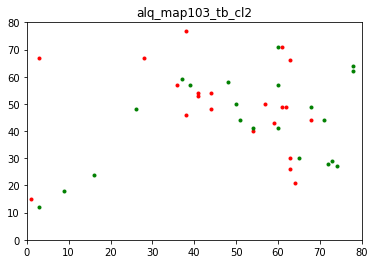

[50.0, 50.0]


Currently mapping.... alq_map104.csv  -->  104
Total no. of points to label.... 68
Label Analysis:-
Total no. of labels:  68
Total no. of lab  1  =  31
Total percentage of lab  1  =  45.588235294117645 %
Total no. of lab  2  =  37
Total percentage of lab  2  =  54.41176470588235 %
map saved!!


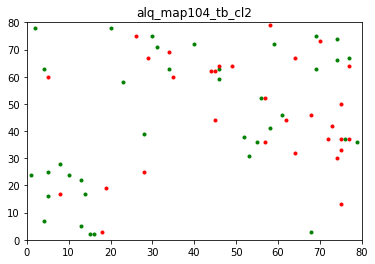

[45.6, 54.4]


Currently mapping.... alq_map105.csv  -->  105
Total no. of points to label.... 59
Label Analysis:-
Total no. of labels:  59
Total no. of lab  1  =  31
Total percentage of lab  1  =  52.54237288135594 %
Total no. of lab  2  =  28
Total percentage of lab  2  =  47.45762711864407 %
map saved!!


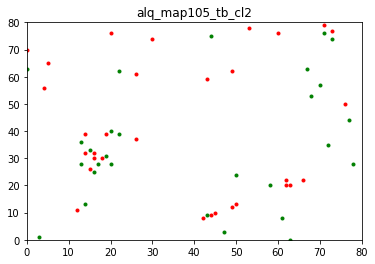

[52.5, 47.5]


Currently mapping.... alq_map106.csv  -->  106
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  33
Total percentage of lab  1  =  54.09836065573771 %
Total no. of lab  2  =  28
Total percentage of lab  2  =  45.90163934426229 %
map saved!!


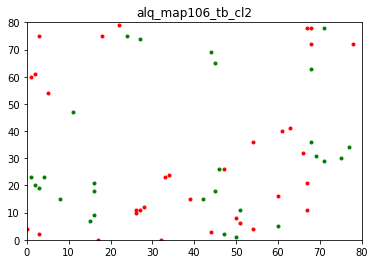

[54.1, 45.9]


Currently mapping.... alq_map107.csv  -->  107
Total no. of points to label.... 55
Label Analysis:-
Total no. of labels:  55
Total no. of lab  1  =  34
Total percentage of lab  1  =  61.81818181818181 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  38.18181818181819 %
map saved!!


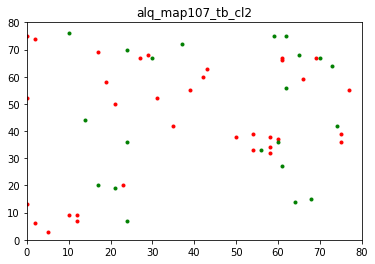

[61.8, 38.2]


Currently mapping.... alq_map108.csv  -->  108
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  41
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  41
Total percentage of lab  2  =  50.0 %
map saved!!


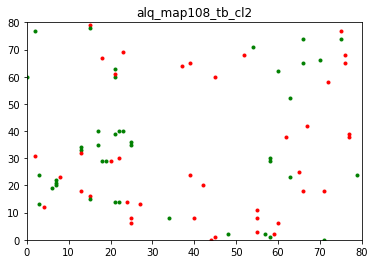

[50.0, 50.0]


Currently mapping.... alq_map109.csv  -->  109
Total no. of points to label.... 95
Label Analysis:-
Total no. of labels:  95
Total no. of lab  1  =  41
Total percentage of lab  1  =  43.15789473684211 %
Total no. of lab  2  =  54
Total percentage of lab  2  =  56.84210526315789 %
map saved!!


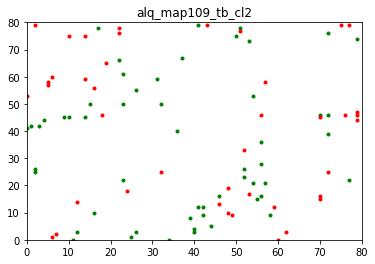

[43.2, 56.8]


Currently mapping.... alq_map110.csv  -->  110
Total no. of points to label.... 77
Label Analysis:-
Total no. of labels:  77
Total no. of lab  1  =  47
Total percentage of lab  1  =  61.038961038961034 %
Total no. of lab  2  =  30
Total percentage of lab  2  =  38.961038961038966 %
map saved!!


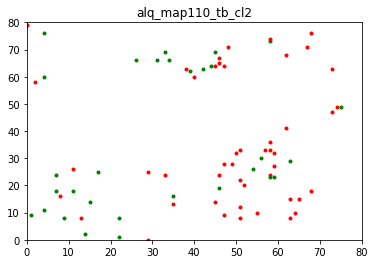

[61.0, 39.0]


Currently mapping.... alq_map111.csv  -->  111
Total no. of points to label.... 141
Label Analysis:-
Total no. of labels:  141
Total no. of lab  1  =  56
Total percentage of lab  1  =  39.71631205673759 %
Total no. of lab  2  =  85
Total percentage of lab  2  =  60.28368794326241 %
map saved!!


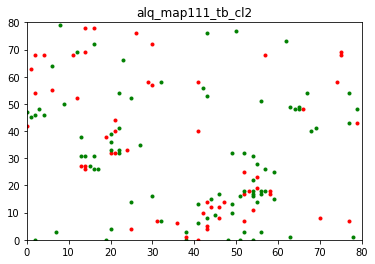

[39.7, 60.3]


Currently mapping.... alq_map112.csv  -->  112
Total no. of points to label.... 96
Label Analysis:-
Total no. of labels:  96
Total no. of lab  1  =  47
Total percentage of lab  1  =  48.95833333333333 %
Total no. of lab  2  =  49
Total percentage of lab  2  =  51.041666666666664 %
map saved!!


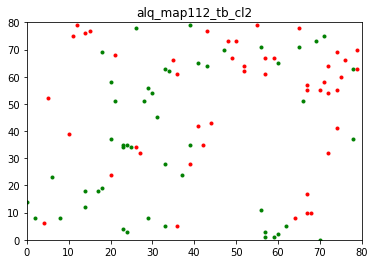

[49.0, 51.0]


Currently mapping.... alq_map113.csv  -->  113
Total no. of points to label.... 76
Label Analysis:-
Total no. of labels:  76
Total no. of lab  1  =  25
Total percentage of lab  1  =  32.89473684210527 %
Total no. of lab  2  =  51
Total percentage of lab  2  =  67.10526315789474 %
map saved!!


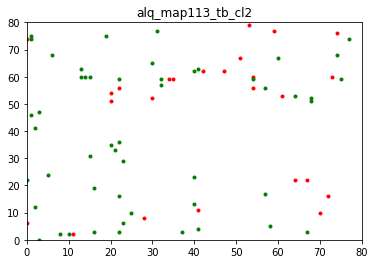

[32.9, 67.1]


Currently mapping.... alq_map114.csv  -->  114
Total no. of points to label.... 71
Label Analysis:-
Total no. of labels:  71
Total no. of lab  1  =  27
Total percentage of lab  1  =  38.028169014084504 %
Total no. of lab  2  =  44
Total percentage of lab  2  =  61.97183098591549 %
map saved!!


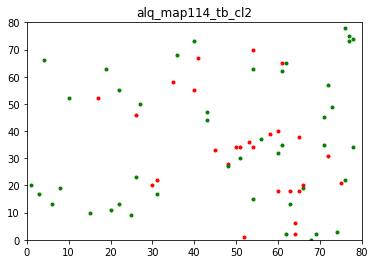

[38.0, 62.0]


Currently mapping.... alq_map115.csv  -->  115
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  35
Total percentage of lab  1  =  42.68292682926829 %
Total no. of lab  2  =  47
Total percentage of lab  2  =  57.3170731707317 %
map saved!!


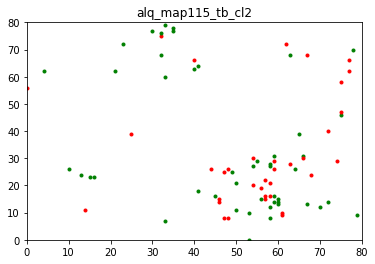

[42.7, 57.3]


Currently mapping.... alq_map116.csv  -->  116
Total no. of points to label.... 112
Label Analysis:-
Total no. of labels:  112
Total no. of lab  1  =  102
Total percentage of lab  1  =  91.07142857142857 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  8.928571428571429 %
map saved!!


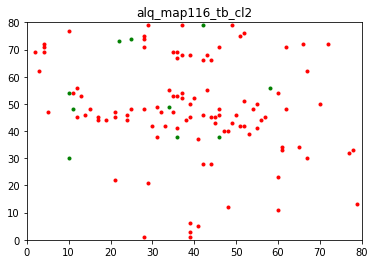

[91.1, 8.9]


Currently mapping.... alq_map117.csv  -->  117
Total no. of points to label.... 93
Label Analysis:-
Total no. of labels:  93
Total no. of lab  1  =  37
Total percentage of lab  1  =  39.784946236559136 %
Total no. of lab  2  =  56
Total percentage of lab  2  =  60.215053763440864 %
map saved!!


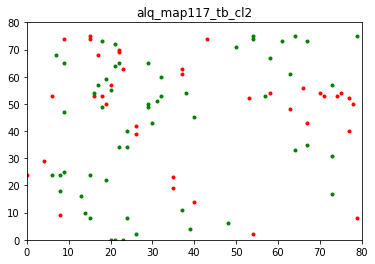

[39.8, 60.2]


Currently mapping.... alq_map118.csv  -->  118
Total no. of points to label.... 108
Label Analysis:-
Total no. of labels:  108
Total no. of lab  1  =  63
Total percentage of lab  1  =  58.333333333333336 %
Total no. of lab  2  =  45
Total percentage of lab  2  =  41.66666666666667 %
map saved!!


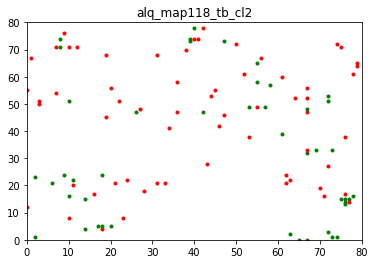

[58.3, 41.7]


Currently mapping.... alq_map119.csv  -->  119
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  45
Total percentage of lab  1  =  60.0 %
Total no. of lab  2  =  30
Total percentage of lab  2  =  40.0 %
map saved!!


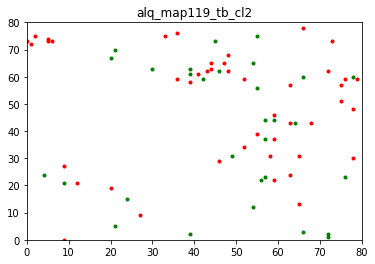

[60.0, 40.0]




In [62]:
alq_tb = pseudo_classifier_label(num_npy, tb_remap['al_tbl'], tr_map['aln_re_id.csv'], alq_map, 
                                 80, "_tb_cl2", "results", True)

Currently mapping.... alq_map000.csv  -->  0
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  16
Total percentage of lab  1  =  43.24324324324324 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  56.75675675675676 %
map saved!!


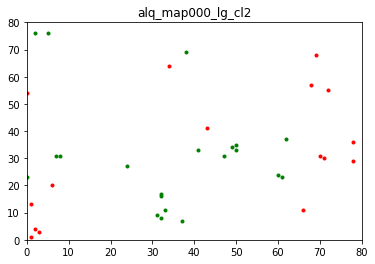

[43.2, 56.8]


Currently mapping.... alq_map001.csv  -->  1
Total no. of points to label.... 30
Label Analysis:-
Total no. of labels:  30
Total no. of lab  1  =  14
Total percentage of lab  1  =  46.666666666666664 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  53.333333333333336 %
map saved!!


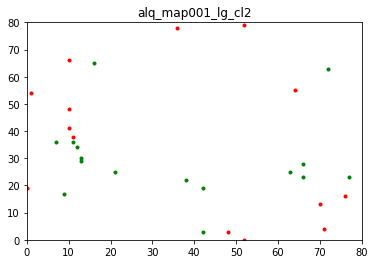

[46.7, 53.3]


Currently mapping.... alq_map002.csv  -->  2
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  11
Total percentage of lab  1  =  40.74074074074074 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  59.25925925925925 %
map saved!!


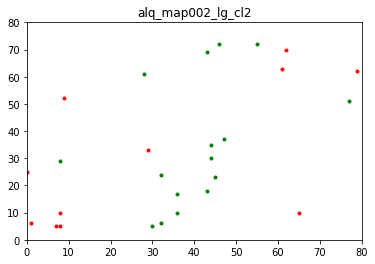

[40.7, 59.3]


Currently mapping.... alq_map003.csv  -->  3
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  31
Total percentage of lab  1  =  77.5 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  22.5 %
map saved!!


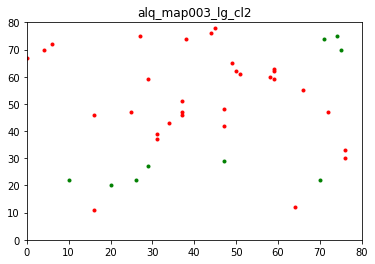

[77.5, 22.5]


Currently mapping.... alq_map004.csv  -->  4
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  17
Total percentage of lab  1  =  62.96296296296296 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  37.03703703703704 %
map saved!!


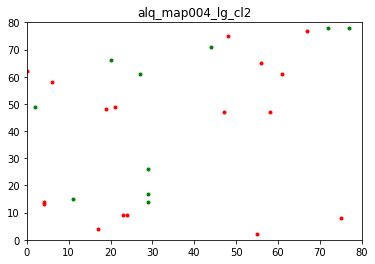

[63.0, 37.0]


Currently mapping.... alq_map005.csv  -->  5
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  15
Total percentage of lab  1  =  46.875 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  53.125 %
map saved!!


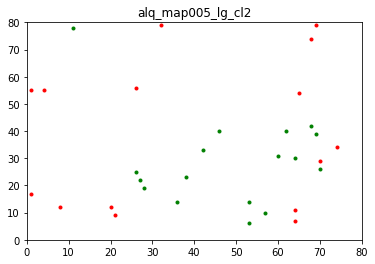

[46.9, 53.1]


Currently mapping.... alq_map006.csv  -->  6
Total no. of points to label.... 14
Label Analysis:-
Total no. of labels:  14
Total no. of lab  1  =  3
Total percentage of lab  1  =  21.428571428571427 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  78.57142857142857 %
map saved!!


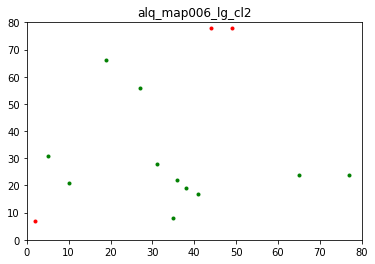

[21.4, 78.6]


Currently mapping.... alq_map007.csv  -->  7
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  21
Total percentage of lab  1  =  67.74193548387096 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  32.25806451612903 %
map saved!!


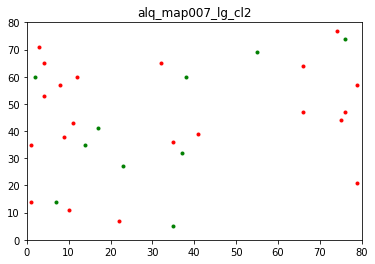

[67.7, 32.3]


Currently mapping.... alq_map008.csv  -->  8
Total no. of points to label.... 39
Label Analysis:-
Total no. of labels:  39
Total no. of lab  1  =  12
Total percentage of lab  1  =  30.76923076923077 %
Total no. of lab  2  =  27
Total percentage of lab  2  =  69.23076923076923 %
map saved!!


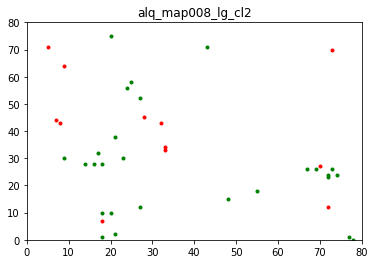

[30.8, 69.2]


Currently mapping.... alq_map009.csv  -->  9
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  21
Total percentage of lab  1  =  51.21951219512195 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  48.78048780487805 %
map saved!!


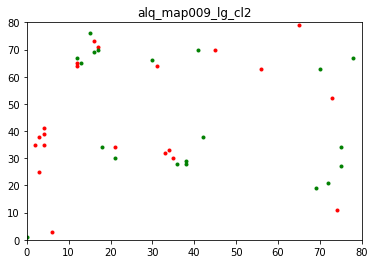

[51.2, 48.8]


Currently mapping.... alq_map010.csv  -->  10
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  25
Total percentage of lab  1  =  80.64516129032258 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  19.35483870967742 %
map saved!!


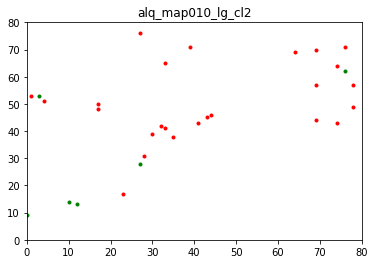

[80.6, 19.4]


Currently mapping.... alq_map011.csv  -->  11
Total no. of points to label.... 39
Label Analysis:-
Total no. of labels:  39
Total no. of lab  1  =  9
Total percentage of lab  1  =  23.076923076923077 %
Total no. of lab  2  =  30
Total percentage of lab  2  =  76.92307692307693 %
map saved!!


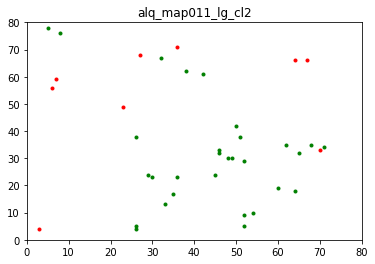

[23.1, 76.9]


Currently mapping.... alq_map012.csv  -->  12
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  9
Total percentage of lab  1  =  20.930232558139537 %
Total no. of lab  2  =  34
Total percentage of lab  2  =  79.06976744186046 %
map saved!!


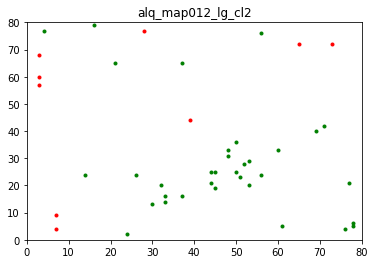

[20.9, 79.1]


Currently mapping.... alq_map013.csv  -->  13
Total no. of points to label.... 29
Label Analysis:-
Total no. of labels:  29
Total no. of lab  1  =  11
Total percentage of lab  1  =  37.93103448275862 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  62.06896551724138 %
map saved!!


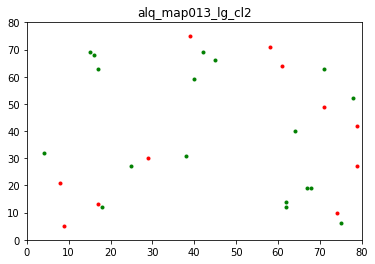

[37.9, 62.1]


Currently mapping.... alq_map014.csv  -->  14
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  18
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  50.0 %
map saved!!


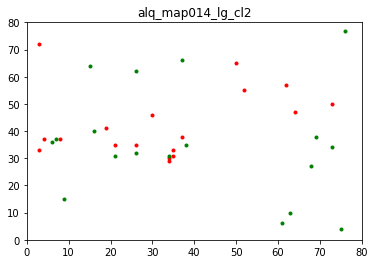

[50.0, 50.0]


Currently mapping.... alq_map015.csv  -->  15
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  12
Total percentage of lab  1  =  20.0 %
Total no. of lab  2  =  48
Total percentage of lab  2  =  80.0 %
map saved!!


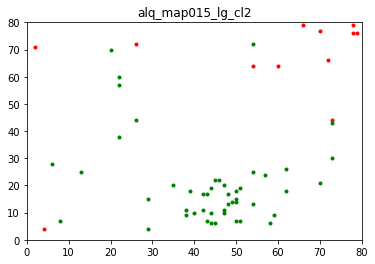

[20.0, 80.0]


Currently mapping.... alq_map016.csv  -->  16
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  19
Total percentage of lab  1  =  51.35135135135135 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  48.64864864864865 %
map saved!!


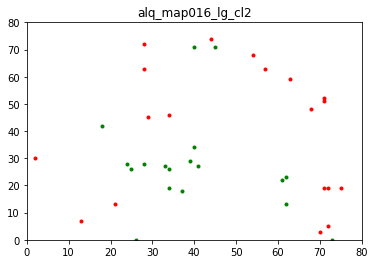

[51.4, 48.6]


Currently mapping.... alq_map017.csv  -->  17
Total no. of points to label.... 26
Label Analysis:-
Total no. of labels:  26
Total no. of lab  1  =  16
Total percentage of lab  1  =  61.53846153846154 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  38.46153846153847 %
map saved!!


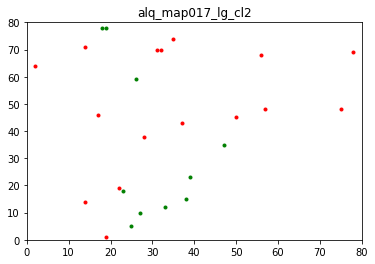

[61.5, 38.5]


Currently mapping.... alq_map018.csv  -->  18
Total no. of points to label.... 51
Label Analysis:-
Total no. of labels:  51
Total no. of lab  1  =  12
Total percentage of lab  1  =  23.52941176470588 %
Total no. of lab  2  =  39
Total percentage of lab  2  =  76.47058823529412 %
map saved!!


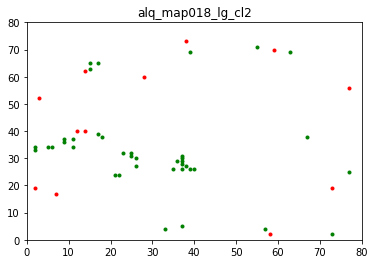

[23.5, 76.5]


Currently mapping.... alq_map019.csv  -->  19
Total no. of points to label.... 17
Label Analysis:-
Total no. of labels:  17
Total no. of lab  1  =  10
Total percentage of lab  1  =  58.82352941176471 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  41.17647058823529 %
map saved!!


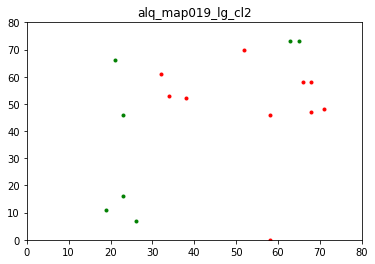

[58.8, 41.2]


Currently mapping.... alq_map020.csv  -->  20
Total no. of points to label.... 33
Label Analysis:-
Total no. of labels:  33
Total no. of lab  1  =  17
Total percentage of lab  1  =  51.515151515151516 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  48.484848484848484 %
map saved!!


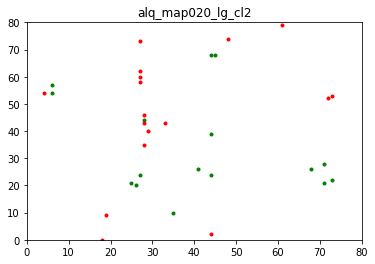

[51.5, 48.5]


Currently mapping.... alq_map021.csv  -->  21
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  33
Total percentage of lab  1  =  80.48780487804879 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  19.51219512195122 %
map saved!!


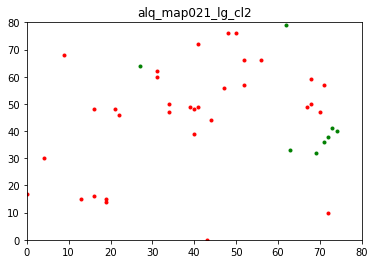

[80.5, 19.5]


Currently mapping.... alq_map022.csv  -->  22
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  9
Total percentage of lab  1  =  28.125 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  71.875 %
map saved!!


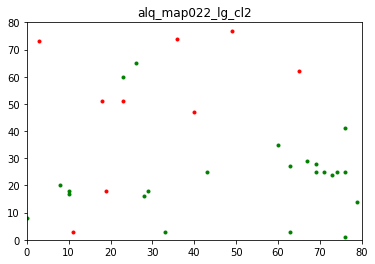

[28.1, 71.9]


Currently mapping.... alq_map023.csv  -->  23
Total no. of points to label.... 28
Label Analysis:-
Total no. of labels:  28
Total no. of lab  1  =  12
Total percentage of lab  1  =  42.857142857142854 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  57.14285714285714 %
map saved!!


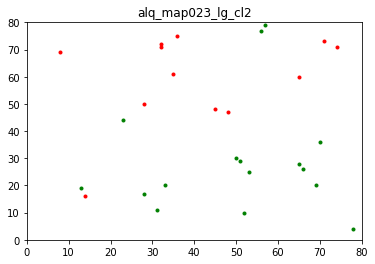

[42.9, 57.1]


Currently mapping.... alq_map024.csv  -->  24
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  17
Total percentage of lab  1  =  53.125 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  46.875 %
map saved!!


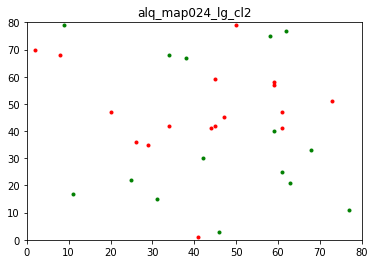

[53.1, 46.9]


Currently mapping.... alq_map025.csv  -->  25
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  20
Total percentage of lab  1  =  46.51162790697674 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  53.48837209302325 %
map saved!!


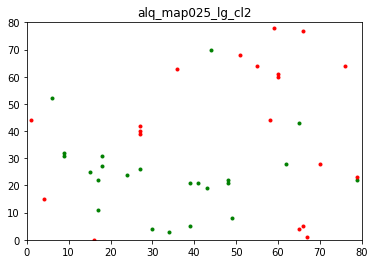

[46.5, 53.5]


Currently mapping.... alq_map026.csv  -->  26
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  7
Total percentage of lab  1  =  21.875 %
Total no. of lab  2  =  25
Total percentage of lab  2  =  78.125 %
map saved!!


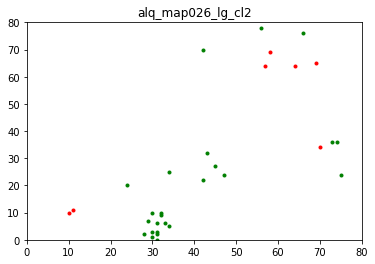

[21.9, 78.1]


Currently mapping.... alq_map027.csv  -->  27
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  20
Total percentage of lab  1  =  55.55555555555556 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  44.44444444444444 %
map saved!!


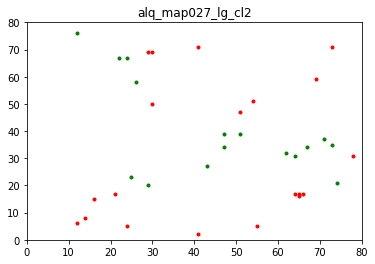

[55.6, 44.4]


Currently mapping.... alq_map028.csv  -->  28
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  13
Total percentage of lab  1  =  25.0 %
Total no. of lab  2  =  39
Total percentage of lab  2  =  75.0 %
map saved!!


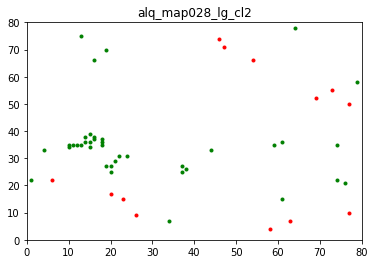

[25.0, 75.0]


Currently mapping.... alq_map029.csv  -->  29
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  17
Total percentage of lab  1  =  39.53488372093023 %
Total no. of lab  2  =  26
Total percentage of lab  2  =  60.46511627906976 %
map saved!!


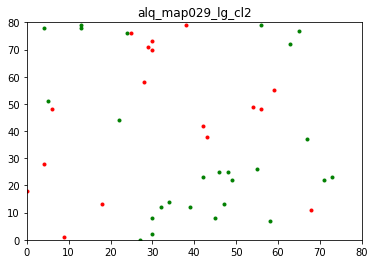

[39.5, 60.5]


Currently mapping.... alq_map030.csv  -->  30
Total no. of points to label.... 54
Label Analysis:-
Total no. of labels:  54
Total no. of lab  1  =  11
Total percentage of lab  1  =  20.37037037037037 %
Total no. of lab  2  =  43
Total percentage of lab  2  =  79.62962962962963 %
map saved!!


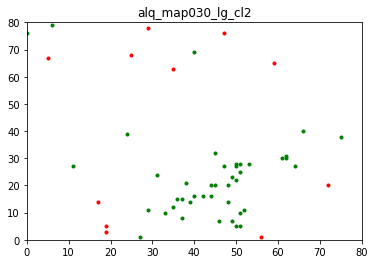

[20.4, 79.6]


Currently mapping.... alq_map031.csv  -->  31
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  20
Total percentage of lab  1  =  48.78048780487805 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  51.21951219512195 %
map saved!!


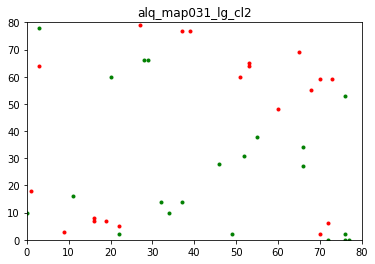

[48.8, 51.2]


Currently mapping.... alq_map032.csv  -->  32
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  18
Total percentage of lab  1  =  30.0 %
Total no. of lab  2  =  42
Total percentage of lab  2  =  70.0 %
map saved!!


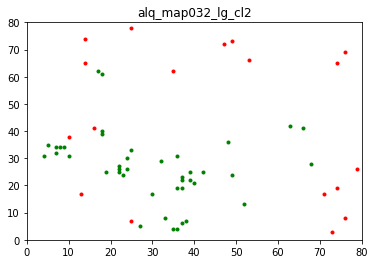

[30.0, 70.0]


Currently mapping.... alq_map033.csv  -->  33
Total no. of points to label.... 84
Label Analysis:-
Total no. of labels:  84
Total no. of lab  1  =  39
Total percentage of lab  1  =  46.42857142857143 %
Total no. of lab  2  =  45
Total percentage of lab  2  =  53.57142857142857 %
map saved!!


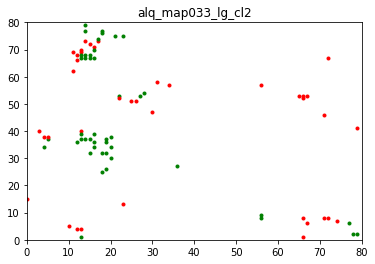

[46.4, 53.6]


Currently mapping.... alq_map034.csv  -->  34
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  22
Total percentage of lab  1  =  42.30769230769231 %
Total no. of lab  2  =  30
Total percentage of lab  2  =  57.692307692307686 %
map saved!!


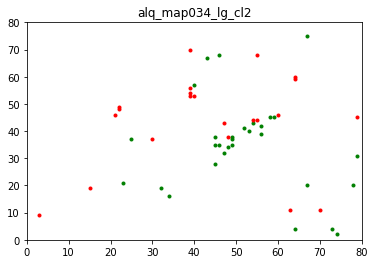

[42.3, 57.7]


Currently mapping.... alq_map035.csv  -->  35
Total no. of points to label.... 64
Label Analysis:-
Total no. of labels:  64
Total no. of lab  1  =  25
Total percentage of lab  1  =  39.0625 %
Total no. of lab  2  =  39
Total percentage of lab  2  =  60.9375 %
map saved!!


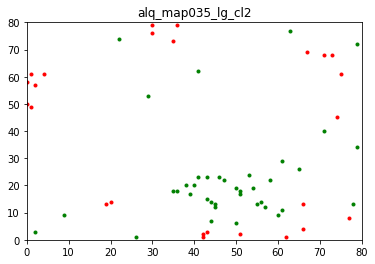

[39.1, 60.9]


Currently mapping.... alq_map036.csv  -->  36
Total no. of points to label.... 69
Label Analysis:-
Total no. of labels:  69
Total no. of lab  1  =  43
Total percentage of lab  1  =  62.31884057971014 %
Total no. of lab  2  =  26
Total percentage of lab  2  =  37.68115942028986 %
map saved!!


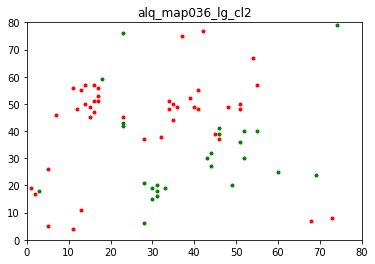

[62.3, 37.7]


Currently mapping.... alq_map037.csv  -->  37
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  18
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  50.0 %
map saved!!


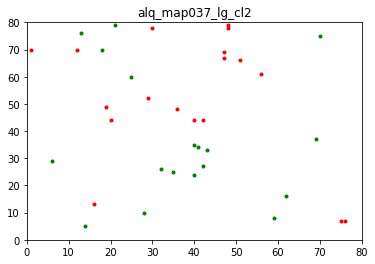

[50.0, 50.0]


Currently mapping.... alq_map038.csv  -->  38
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  26
Total percentage of lab  1  =  60.46511627906976 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  39.53488372093023 %
map saved!!


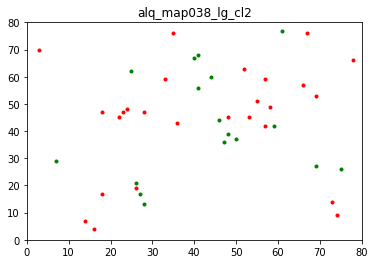

[60.5, 39.5]


Currently mapping.... alq_map039.csv  -->  39
Total no. of points to label.... 46
Label Analysis:-
Total no. of labels:  46
Total no. of lab  1  =  11
Total percentage of lab  1  =  23.91304347826087 %
Total no. of lab  2  =  35
Total percentage of lab  2  =  76.08695652173914 %
map saved!!


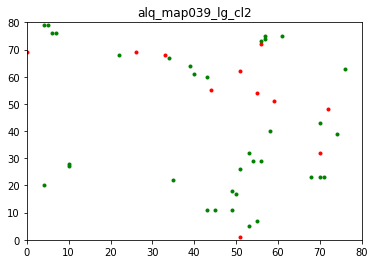

[23.9, 76.1]


Currently mapping.... alq_map040.csv  -->  40
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  23
Total percentage of lab  1  =  74.19354838709677 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  25.806451612903224 %
map saved!!


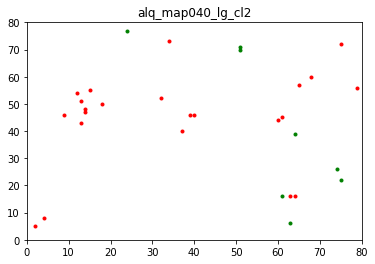

[74.2, 25.8]


Currently mapping.... alq_map041.csv  -->  41
Total no. of points to label.... 34
Label Analysis:-
Total no. of labels:  34
Total no. of lab  1  =  27
Total percentage of lab  1  =  79.41176470588235 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  20.588235294117645 %
map saved!!


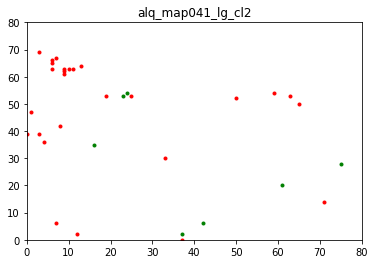

[79.4, 20.6]


Currently mapping.... alq_map042.csv  -->  42
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  15
Total percentage of lab  1  =  39.473684210526315 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  60.526315789473685 %
map saved!!


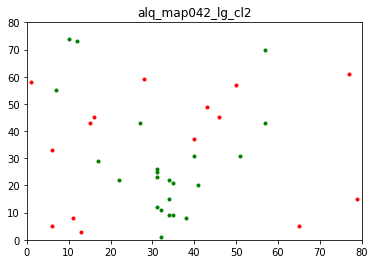

[39.5, 60.5]


Currently mapping.... alq_map043.csv  -->  43
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  14
Total percentage of lab  1  =  51.85185185185185 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  48.148148148148145 %
map saved!!


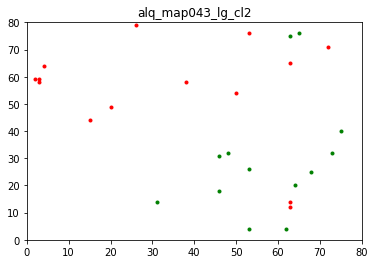

[51.9, 48.1]


Currently mapping.... alq_map044.csv  -->  44
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  14
Total percentage of lab  1  =  34.146341463414636 %
Total no. of lab  2  =  27
Total percentage of lab  2  =  65.85365853658537 %
map saved!!


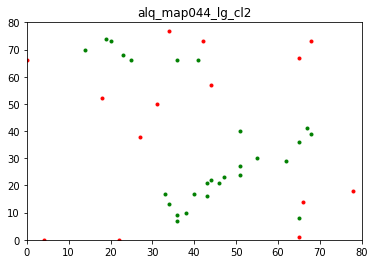

[34.1, 65.9]


Currently mapping.... alq_map045.csv  -->  45
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  28
Total percentage of lab  1  =  68.29268292682927 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  31.70731707317073 %
map saved!!


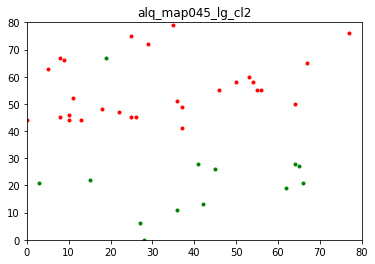

[68.3, 31.7]


Currently mapping.... alq_map046.csv  -->  46
Total no. of points to label.... 26
Label Analysis:-
Total no. of labels:  26
Total no. of lab  1  =  21
Total percentage of lab  1  =  80.76923076923077 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  19.230769230769234 %
map saved!!


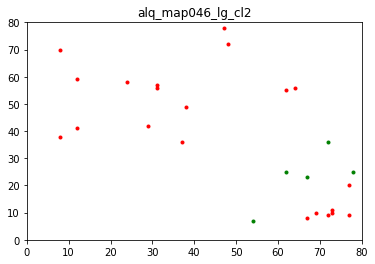

[80.8, 19.2]


Currently mapping.... alq_map047.csv  -->  47
Total no. of points to label.... 24
Label Analysis:-
Total no. of labels:  24
Total no. of lab  1  =  19
Total percentage of lab  1  =  79.16666666666666 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  20.833333333333336 %
map saved!!


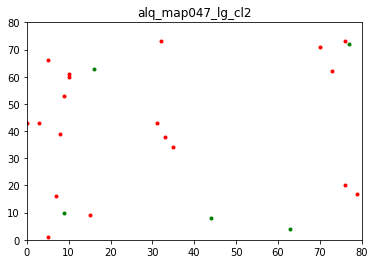

[79.2, 20.8]


Currently mapping.... alq_map048.csv  -->  48
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  24
Total percentage of lab  1  =  60.0 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  40.0 %
map saved!!


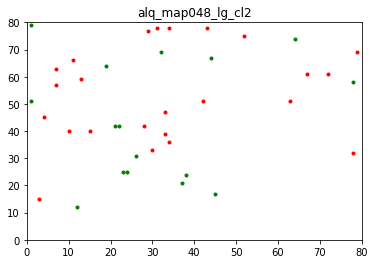

[60.0, 40.0]


Currently mapping.... alq_map049.csv  -->  49
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  19
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  50.0 %
map saved!!


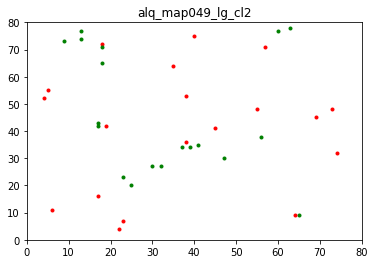

[50.0, 50.0]


Currently mapping.... alq_map050.csv  -->  50
Total no. of points to label.... 125
Label Analysis:-
Total no. of labels:  125
Total no. of lab  1  =  40
Total percentage of lab  1  =  32.0 %
Total no. of lab  2  =  85
Total percentage of lab  2  =  68.0 %
map saved!!


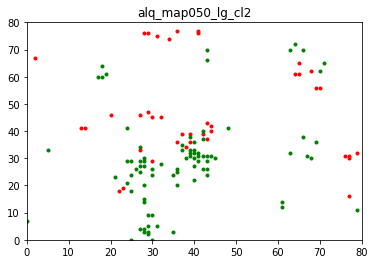

[32.0, 68.0]


Currently mapping.... alq_map051.csv  -->  51
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  50
Total percentage of lab  1  =  83.33333333333334 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  16.666666666666664 %
map saved!!


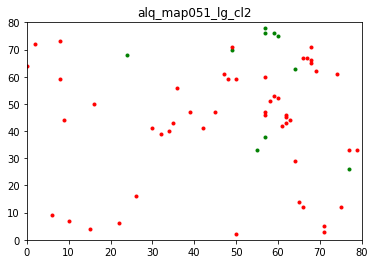

[83.3, 16.7]


Currently mapping.... alq_map052.csv  -->  52
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  38
Total percentage of lab  1  =  73.07692307692307 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  26.923076923076923 %
map saved!!


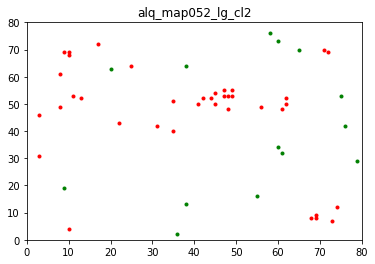

[73.1, 26.9]


Currently mapping.... alq_map053.csv  -->  53
Total no. of points to label.... 51
Label Analysis:-
Total no. of labels:  51
Total no. of lab  1  =  43
Total percentage of lab  1  =  84.31372549019608 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  15.686274509803921 %
map saved!!


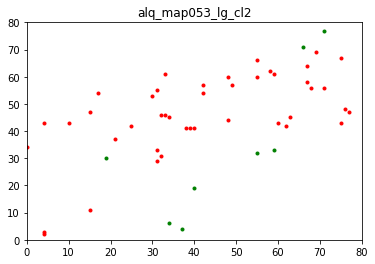

[84.3, 15.7]


Currently mapping.... alq_map054.csv  -->  54
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  25
Total percentage of lab  1  =  69.44444444444444 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  30.555555555555557 %
map saved!!


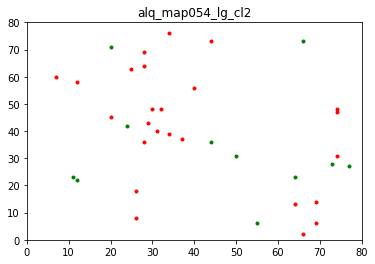

[69.4, 30.6]


Currently mapping.... alq_map055.csv  -->  55
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  56
Total percentage of lab  1  =  74.66666666666667 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  25.333333333333336 %
map saved!!


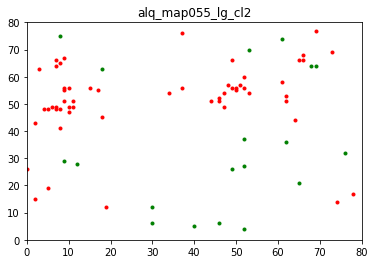

[74.7, 25.3]


Currently mapping.... alq_map056.csv  -->  56
Total no. of points to label.... 19
Label Analysis:-
Total no. of labels:  19
Total no. of lab  1  =  14
Total percentage of lab  1  =  73.68421052631578 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  26.31578947368421 %
map saved!!


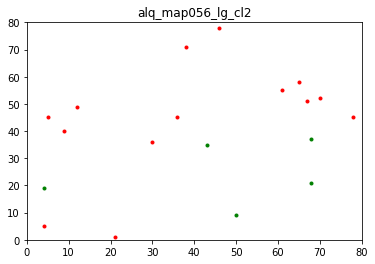

[73.7, 26.3]


Currently mapping.... alq_map057.csv  -->  57
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  11
Total percentage of lab  1  =  29.72972972972973 %
Total no. of lab  2  =  26
Total percentage of lab  2  =  70.27027027027027 %
map saved!!


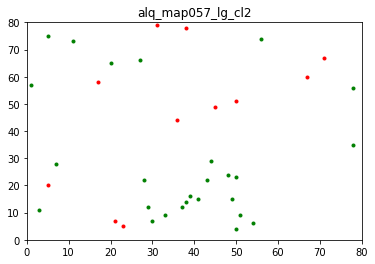

[29.7, 70.3]


Currently mapping.... alq_map058.csv  -->  58
Total no. of points to label.... 44
Label Analysis:-
Total no. of labels:  44
Total no. of lab  1  =  38
Total percentage of lab  1  =  86.36363636363636 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  13.636363636363635 %
map saved!!


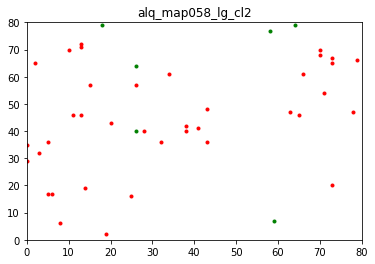

[86.4, 13.6]


Currently mapping.... alq_map059.csv  -->  59
Total no. of points to label.... 33
Label Analysis:-
Total no. of labels:  33
Total no. of lab  1  =  21
Total percentage of lab  1  =  63.63636363636363 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  36.36363636363637 %
map saved!!


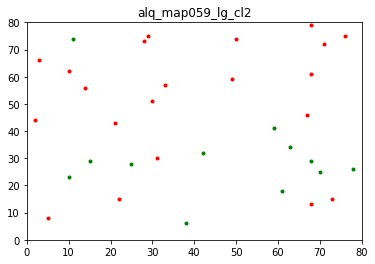

[63.6, 36.4]


Currently mapping.... alq_map060.csv  -->  60
Total no. of points to label.... 62
Label Analysis:-
Total no. of labels:  62
Total no. of lab  1  =  42
Total percentage of lab  1  =  67.74193548387096 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  32.25806451612903 %
map saved!!


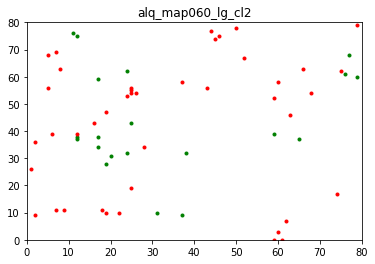

[67.7, 32.3]


Currently mapping.... alq_map061.csv  -->  61
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  24
Total percentage of lab  1  =  58.536585365853654 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  41.46341463414634 %
map saved!!


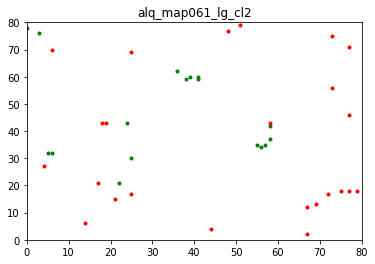

[58.5, 41.5]


Currently mapping.... alq_map062.csv  -->  62
Total no. of points to label.... 24
Label Analysis:-
Total no. of labels:  24
Total no. of lab  1  =  13
Total percentage of lab  1  =  54.166666666666664 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  45.83333333333333 %
map saved!!


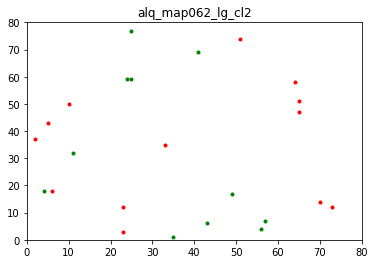

[54.2, 45.8]


Currently mapping.... alq_map063.csv  -->  63
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  26
Total percentage of lab  1  =  60.46511627906976 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  39.53488372093023 %
map saved!!


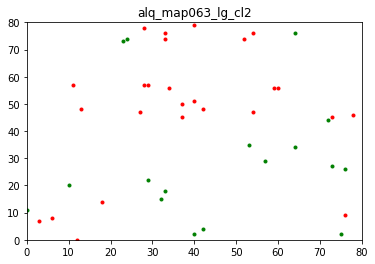

[60.5, 39.5]


Currently mapping.... alq_map064.csv  -->  64
Total no. of points to label.... 50
Label Analysis:-
Total no. of labels:  50
Total no. of lab  1  =  28
Total percentage of lab  1  =  56.00000000000001 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  44.0 %
map saved!!


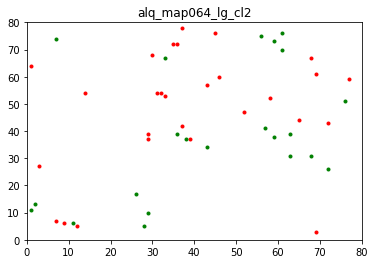

[56.0, 44.0]


Currently mapping.... alq_map065.csv  -->  65
Total no. of points to label.... 44
Label Analysis:-
Total no. of labels:  44
Total no. of lab  1  =  37
Total percentage of lab  1  =  84.0909090909091 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  15.909090909090908 %
map saved!!


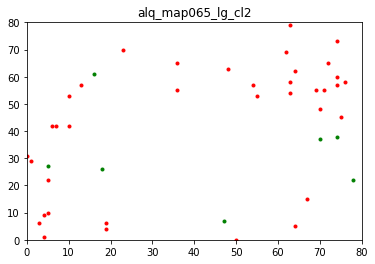

[84.1, 15.9]


Currently mapping.... alq_map066.csv  -->  66
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  48
Total percentage of lab  1  =  78.68852459016394 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  21.311475409836063 %
map saved!!


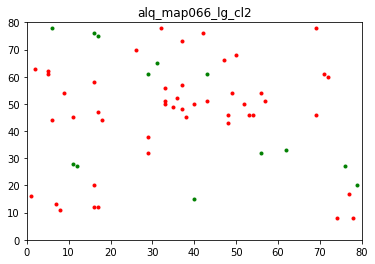

[78.7, 21.3]


Currently mapping.... alq_map067.csv  -->  67
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  24
Total percentage of lab  1  =  66.66666666666666 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  33.33333333333333 %
map saved!!


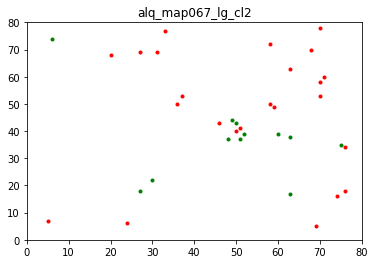

[66.7, 33.3]


Currently mapping.... alq_map068.csv  -->  68
Total no. of points to label.... 45
Label Analysis:-
Total no. of labels:  45
Total no. of lab  1  =  28
Total percentage of lab  1  =  62.22222222222222 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  37.77777777777778 %
map saved!!


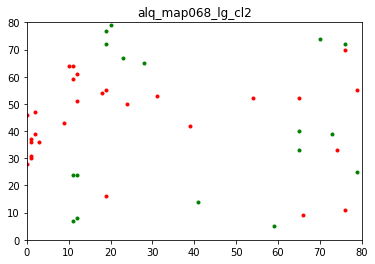

[62.2, 37.8]


Currently mapping.... alq_map069.csv  -->  69
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  31
Total percentage of lab  1  =  59.61538461538461 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  40.38461538461539 %
map saved!!


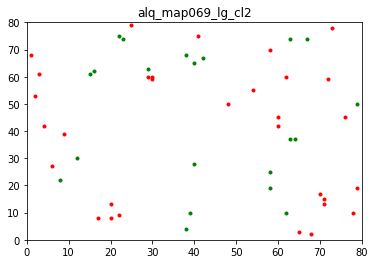

[59.6, 40.4]


Currently mapping.... alq_map070.csv  -->  70
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  54
Total percentage of lab  1  =  90.0 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  10.0 %
map saved!!


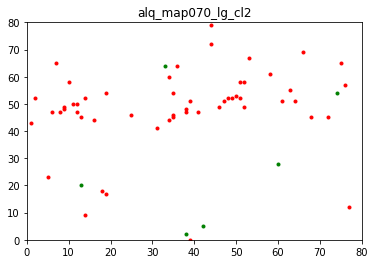

[90.0, 10.0]


Currently mapping.... alq_map071.csv  -->  71
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  25
Total percentage of lab  1  =  48.07692307692308 %
Total no. of lab  2  =  27
Total percentage of lab  2  =  51.92307692307693 %
map saved!!


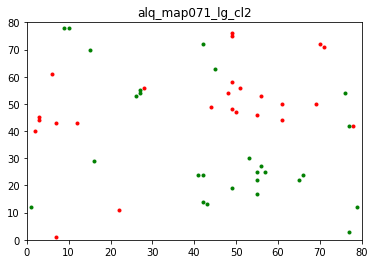

[48.1, 51.9]


Currently mapping.... alq_map072.csv  -->  72
Total no. of points to label.... 62
Label Analysis:-
Total no. of labels:  62
Total no. of lab  1  =  59
Total percentage of lab  1  =  95.16129032258065 %
Total no. of lab  2  =  3
Total percentage of lab  2  =  4.838709677419355 %
map saved!!


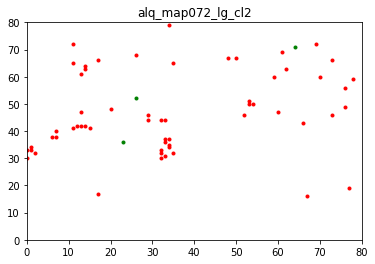

[95.2, 4.8]


Currently mapping.... alq_map073.csv  -->  73
Total no. of points to label.... 85
Label Analysis:-
Total no. of labels:  85
Total no. of lab  1  =  46
Total percentage of lab  1  =  54.11764705882353 %
Total no. of lab  2  =  39
Total percentage of lab  2  =  45.88235294117647 %
map saved!!


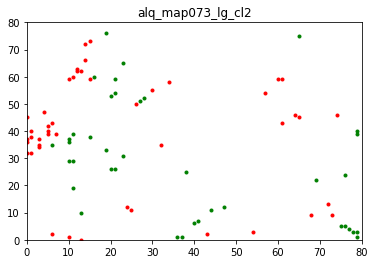

[54.1, 45.9]


Currently mapping.... alq_map074.csv  -->  74
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  39
Total percentage of lab  1  =  67.24137931034483 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  32.758620689655174 %
map saved!!


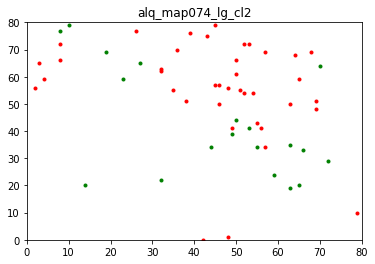

[67.2, 32.8]


Currently mapping.... alq_map075.csv  -->  75
Total no. of points to label.... 59
Label Analysis:-
Total no. of labels:  59
Total no. of lab  1  =  50
Total percentage of lab  1  =  84.7457627118644 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  15.254237288135593 %
map saved!!


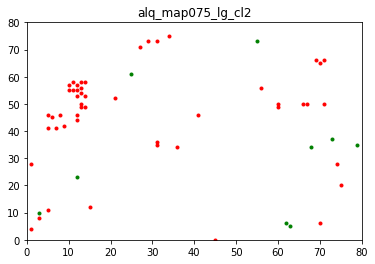

[84.7, 15.3]


Currently mapping.... alq_map076.csv  -->  76
Total no. of points to label.... 72
Label Analysis:-
Total no. of labels:  72
Total no. of lab  1  =  44
Total percentage of lab  1  =  61.111111111111114 %
Total no. of lab  2  =  28
Total percentage of lab  2  =  38.88888888888889 %
map saved!!


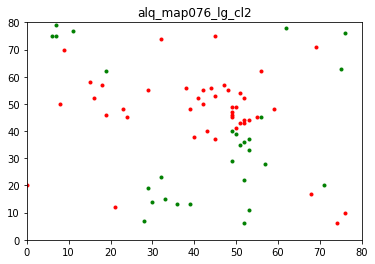

[61.1, 38.9]


Currently mapping.... alq_map077.csv  -->  77
Total no. of points to label.... 42
Label Analysis:-
Total no. of labels:  42
Total no. of lab  1  =  27
Total percentage of lab  1  =  64.28571428571429 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  35.714285714285715 %
map saved!!


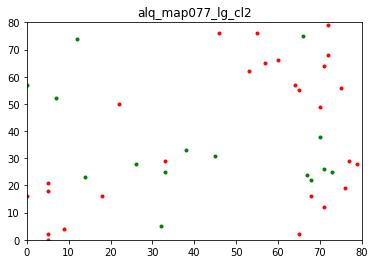

[64.3, 35.7]


Currently mapping.... alq_map078.csv  -->  78
Total no. of points to label.... 63
Label Analysis:-
Total no. of labels:  63
Total no. of lab  1  =  45
Total percentage of lab  1  =  71.42857142857143 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  28.57142857142857 %
map saved!!


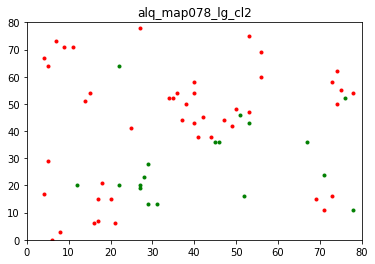

[71.4, 28.6]


Currently mapping.... alq_map079.csv  -->  79
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  29
Total percentage of lab  1  =  72.5 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  27.500000000000004 %
map saved!!


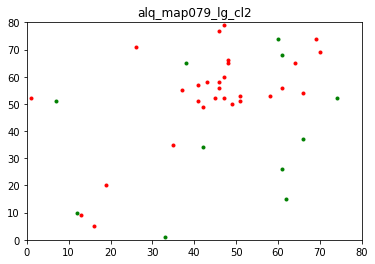

[72.5, 27.5]


Currently mapping.... alq_map080.csv  -->  80
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  11
Total percentage of lab  1  =  30.555555555555557 %
Total no. of lab  2  =  25
Total percentage of lab  2  =  69.44444444444444 %
map saved!!


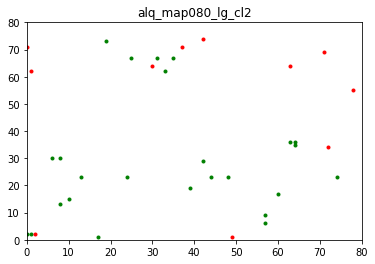

[30.6, 69.4]


Currently mapping.... alq_map081.csv  -->  81
Total no. of points to label.... 77
Label Analysis:-
Total no. of labels:  77
Total no. of lab  1  =  20
Total percentage of lab  1  =  25.97402597402597 %
Total no. of lab  2  =  57
Total percentage of lab  2  =  74.02597402597402 %
map saved!!


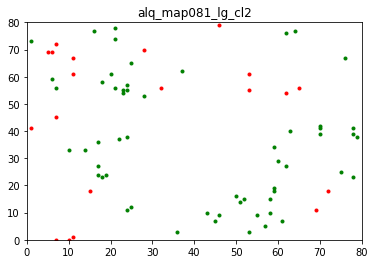

[26.0, 74.0]


Currently mapping.... alq_map082.csv  -->  82
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  16
Total percentage of lab  1  =  44.44444444444444 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  55.55555555555556 %
map saved!!


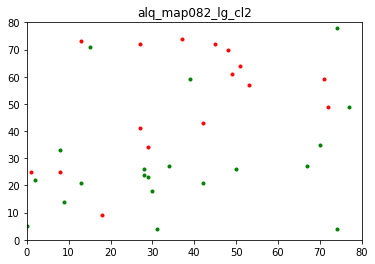

[44.4, 55.6]


Currently mapping.... alq_map083.csv  -->  83
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  23
Total percentage of lab  1  =  53.48837209302325 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  46.51162790697674 %
map saved!!


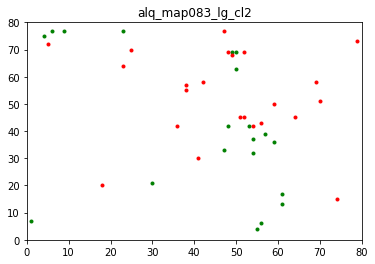

[53.5, 46.5]


Currently mapping.... alq_map084.csv  -->  84
Total no. of points to label.... 49
Label Analysis:-
Total no. of labels:  49
Total no. of lab  1  =  30
Total percentage of lab  1  =  61.224489795918366 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  38.775510204081634 %
map saved!!


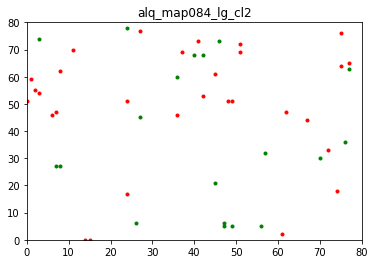

[61.2, 38.8]


Currently mapping.... alq_map085.csv  -->  85
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  10
Total percentage of lab  1  =  17.24137931034483 %
Total no. of lab  2  =  48
Total percentage of lab  2  =  82.75862068965517 %
map saved!!


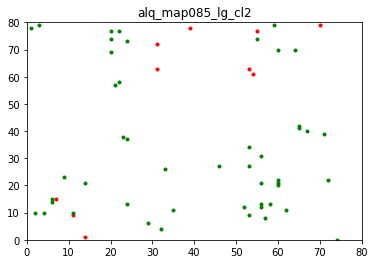

[17.2, 82.8]


Currently mapping.... alq_map086.csv  -->  86
Total no. of points to label.... 74
Label Analysis:-
Total no. of labels:  74
Total no. of lab  1  =  32
Total percentage of lab  1  =  43.24324324324324 %
Total no. of lab  2  =  42
Total percentage of lab  2  =  56.75675675675676 %
map saved!!


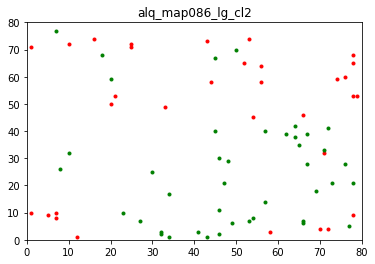

[43.2, 56.8]


Currently mapping.... alq_map087.csv  -->  87
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  30
Total percentage of lab  1  =  69.76744186046511 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  30.23255813953488 %
map saved!!


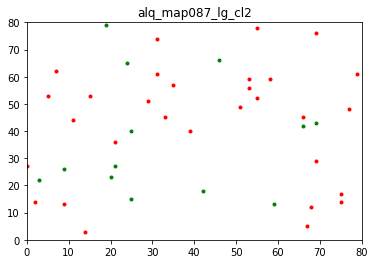

[69.8, 30.2]


Currently mapping.... alq_map088.csv  -->  88
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  40
Total percentage of lab  1  =  53.333333333333336 %
Total no. of lab  2  =  35
Total percentage of lab  2  =  46.666666666666664 %
map saved!!


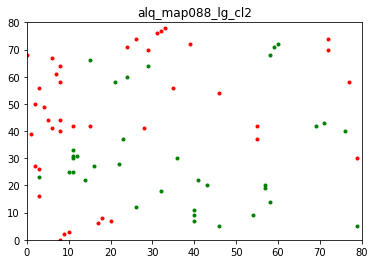

[53.3, 46.7]


Currently mapping.... alq_map089.csv  -->  89
Total no. of points to label.... 68
Label Analysis:-
Total no. of labels:  68
Total no. of lab  1  =  37
Total percentage of lab  1  =  54.41176470588235 %
Total no. of lab  2  =  31
Total percentage of lab  2  =  45.588235294117645 %
map saved!!


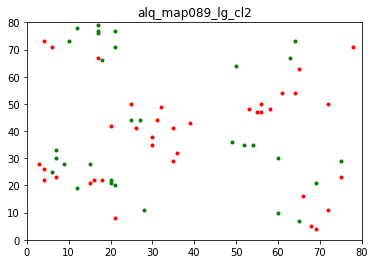

[54.4, 45.6]


Currently mapping.... alq_map090.csv  -->  90
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  73
Total percentage of lab  1  =  89.02439024390245 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  10.975609756097562 %
map saved!!


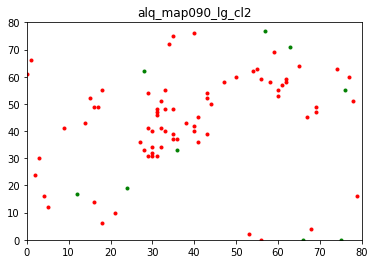

[89.0, 11.0]


Currently mapping.... alq_map091.csv  -->  91
Total no. of points to label.... 65
Label Analysis:-
Total no. of labels:  65
Total no. of lab  1  =  22
Total percentage of lab  1  =  33.84615384615385 %
Total no. of lab  2  =  43
Total percentage of lab  2  =  66.15384615384615 %
map saved!!


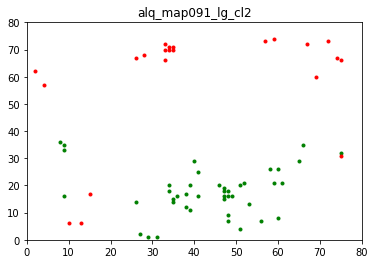

[33.8, 66.2]


Currently mapping.... alq_map092.csv  -->  92
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  27
Total percentage of lab  1  =  46.55172413793103 %
Total no. of lab  2  =  31
Total percentage of lab  2  =  53.44827586206896 %
map saved!!


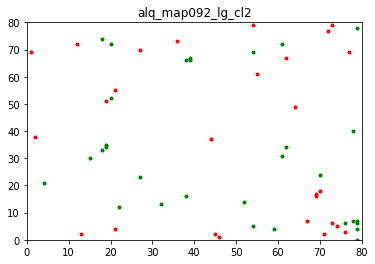

[46.6, 53.4]


Currently mapping.... alq_map093.csv  -->  93
Total no. of points to label.... 46
Label Analysis:-
Total no. of labels:  46
Total no. of lab  1  =  34
Total percentage of lab  1  =  73.91304347826086 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  26.08695652173913 %
map saved!!


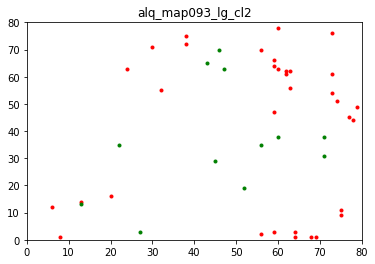

[73.9, 26.1]


Currently mapping.... alq_map094.csv  -->  94
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  48
Total percentage of lab  1  =  78.68852459016394 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  21.311475409836063 %
map saved!!


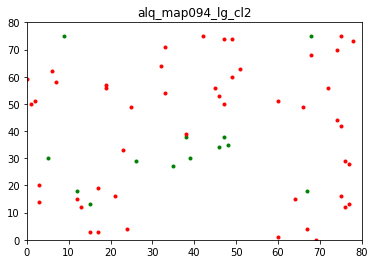

[78.7, 21.3]


Currently mapping.... alq_map095.csv  -->  95
Total no. of points to label.... 84
Label Analysis:-
Total no. of labels:  84
Total no. of lab  1  =  22
Total percentage of lab  1  =  26.190476190476193 %
Total no. of lab  2  =  62
Total percentage of lab  2  =  73.80952380952381 %
map saved!!


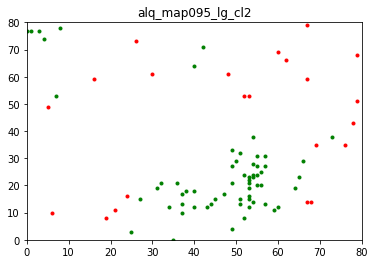

[26.2, 73.8]


Currently mapping.... alq_map096.csv  -->  96
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  17
Total percentage of lab  1  =  44.73684210526316 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  55.26315789473685 %
map saved!!


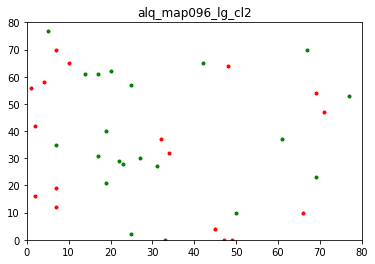

[44.7, 55.3]


Currently mapping.... alq_map097.csv  -->  97
Total no. of points to label.... 47
Label Analysis:-
Total no. of labels:  47
Total no. of lab  1  =  17
Total percentage of lab  1  =  36.17021276595745 %
Total no. of lab  2  =  30
Total percentage of lab  2  =  63.829787234042556 %
map saved!!


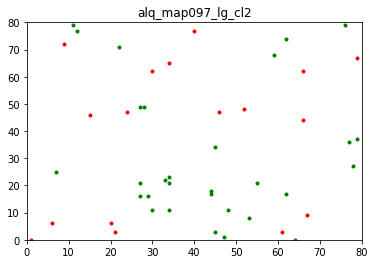

[36.2, 63.8]


Currently mapping.... alq_map098.csv  -->  98
Total no. of points to label.... 88
Label Analysis:-
Total no. of labels:  88
Total no. of lab  1  =  53
Total percentage of lab  1  =  60.22727272727273 %
Total no. of lab  2  =  35
Total percentage of lab  2  =  39.77272727272727 %
map saved!!


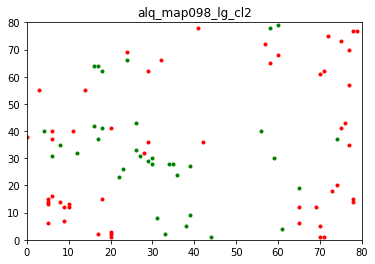

[60.2, 39.8]


Currently mapping.... alq_map099.csv  -->  99
Total no. of points to label.... 64
Label Analysis:-
Total no. of labels:  64
Total no. of lab  1  =  12
Total percentage of lab  1  =  18.75 %
Total no. of lab  2  =  52
Total percentage of lab  2  =  81.25 %
map saved!!


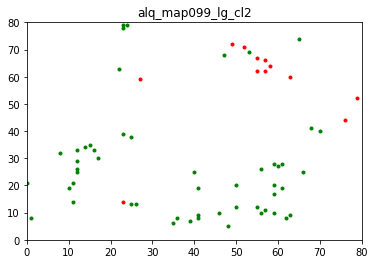

[18.8, 81.2]


Currently mapping.... alq_map100.csv  -->  100
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  35
Total percentage of lab  1  =  67.3076923076923 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  32.69230769230769 %
map saved!!


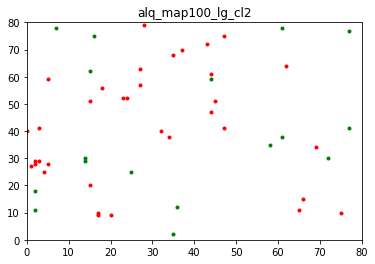

[67.3, 32.7]


Currently mapping.... alq_map101.csv  -->  101
Total no. of points to label.... 69
Label Analysis:-
Total no. of labels:  69
Total no. of lab  1  =  41
Total percentage of lab  1  =  59.42028985507246 %
Total no. of lab  2  =  28
Total percentage of lab  2  =  40.57971014492754 %
map saved!!


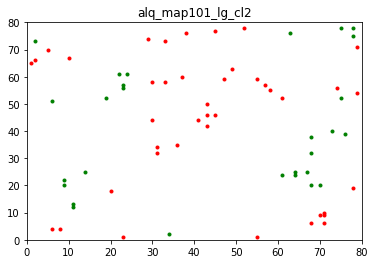

[59.4, 40.6]


Currently mapping.... alq_map102.csv  -->  102
Total no. of points to label.... 71
Label Analysis:-
Total no. of labels:  71
Total no. of lab  1  =  25
Total percentage of lab  1  =  35.2112676056338 %
Total no. of lab  2  =  46
Total percentage of lab  2  =  64.7887323943662 %
map saved!!


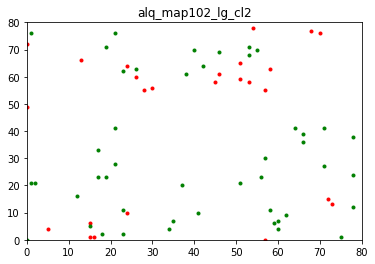

[35.2, 64.8]


Currently mapping.... alq_map103.csv  -->  103
Total no. of points to label.... 42
Label Analysis:-
Total no. of labels:  42
Total no. of lab  1  =  27
Total percentage of lab  1  =  64.28571428571429 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  35.714285714285715 %
map saved!!


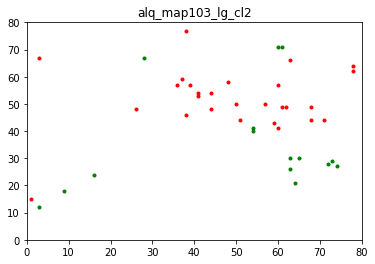

[64.3, 35.7]


Currently mapping.... alq_map104.csv  -->  104
Total no. of points to label.... 68
Label Analysis:-
Total no. of labels:  68
Total no. of lab  1  =  34
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  34
Total percentage of lab  2  =  50.0 %
map saved!!


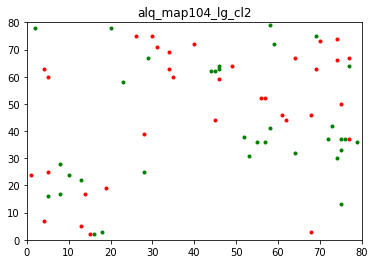

[50.0, 50.0]


Currently mapping.... alq_map105.csv  -->  105
Total no. of points to label.... 59
Label Analysis:-
Total no. of labels:  59
Total no. of lab  1  =  23
Total percentage of lab  1  =  38.983050847457626 %
Total no. of lab  2  =  36
Total percentage of lab  2  =  61.016949152542374 %
map saved!!


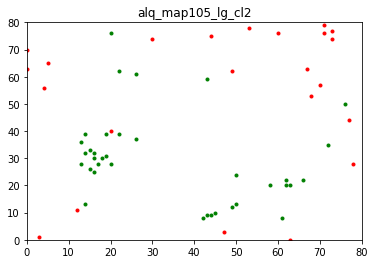

[39.0, 61.0]


Currently mapping.... alq_map106.csv  -->  106
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  21
Total percentage of lab  1  =  34.42622950819672 %
Total no. of lab  2  =  40
Total percentage of lab  2  =  65.57377049180327 %
map saved!!


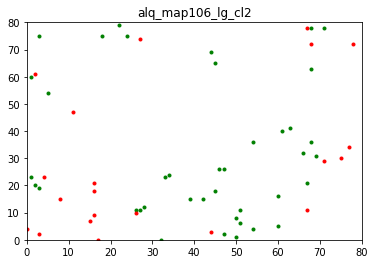

[34.4, 65.6]


Currently mapping.... alq_map107.csv  -->  107
Total no. of points to label.... 55
Label Analysis:-
Total no. of labels:  55
Total no. of lab  1  =  32
Total percentage of lab  1  =  58.18181818181818 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  41.81818181818181 %
map saved!!


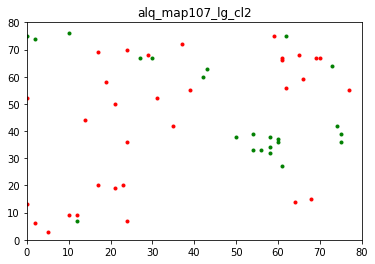

[58.2, 41.8]


Currently mapping.... alq_map108.csv  -->  108
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  36
Total percentage of lab  1  =  43.90243902439025 %
Total no. of lab  2  =  46
Total percentage of lab  2  =  56.09756097560976 %
map saved!!


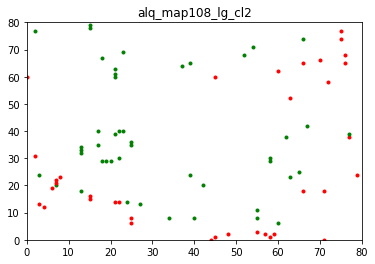

[43.9, 56.1]


Currently mapping.... alq_map109.csv  -->  109
Total no. of points to label.... 95
Label Analysis:-
Total no. of labels:  95
Total no. of lab  1  =  45
Total percentage of lab  1  =  47.368421052631575 %
Total no. of lab  2  =  50
Total percentage of lab  2  =  52.63157894736842 %
map saved!!


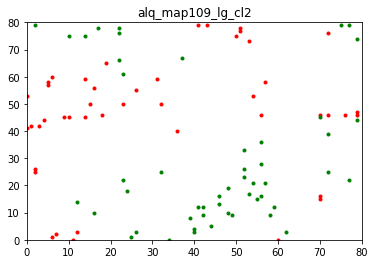

[47.4, 52.6]


Currently mapping.... alq_map110.csv  -->  110
Total no. of points to label.... 77
Label Analysis:-
Total no. of labels:  77
Total no. of lab  1  =  24
Total percentage of lab  1  =  31.16883116883117 %
Total no. of lab  2  =  53
Total percentage of lab  2  =  68.83116883116884 %
map saved!!


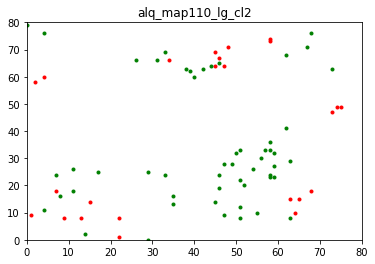

[31.2, 68.8]


Currently mapping.... alq_map111.csv  -->  111
Total no. of points to label.... 141
Label Analysis:-
Total no. of labels:  141
Total no. of lab  1  =  61
Total percentage of lab  1  =  43.262411347517734 %
Total no. of lab  2  =  80
Total percentage of lab  2  =  56.73758865248227 %
map saved!!


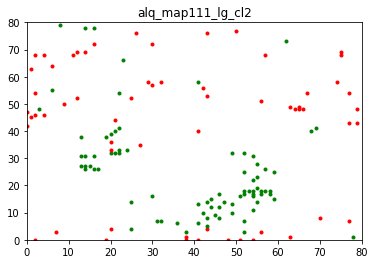

[43.3, 56.7]


Currently mapping.... alq_map112.csv  -->  112
Total no. of points to label.... 96
Label Analysis:-
Total no. of labels:  96
Total no. of lab  1  =  65
Total percentage of lab  1  =  67.70833333333334 %
Total no. of lab  2  =  31
Total percentage of lab  2  =  32.29166666666667 %
map saved!!


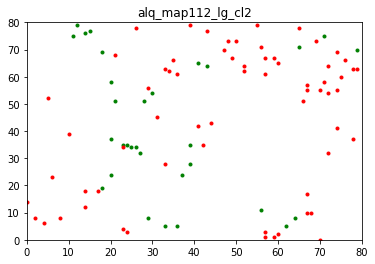

[67.7, 32.3]


Currently mapping.... alq_map113.csv  -->  113
Total no. of points to label.... 76
Label Analysis:-
Total no. of labels:  76
Total no. of lab  1  =  42
Total percentage of lab  1  =  55.26315789473685 %
Total no. of lab  2  =  34
Total percentage of lab  2  =  44.73684210526316 %
map saved!!


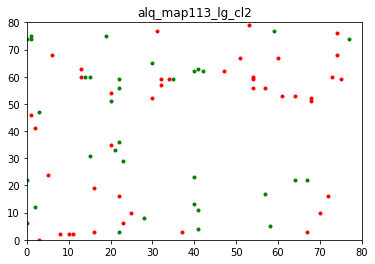

[55.3, 44.7]


Currently mapping.... alq_map114.csv  -->  114
Total no. of points to label.... 71
Label Analysis:-
Total no. of labels:  71
Total no. of lab  1  =  30
Total percentage of lab  1  =  42.25352112676056 %
Total no. of lab  2  =  41
Total percentage of lab  2  =  57.74647887323944 %
map saved!!


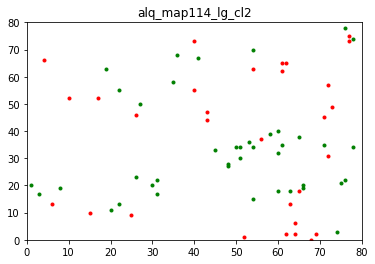

[42.3, 57.7]


Currently mapping.... alq_map115.csv  -->  115
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  21
Total percentage of lab  1  =  25.609756097560975 %
Total no. of lab  2  =  61
Total percentage of lab  2  =  74.39024390243902 %
map saved!!


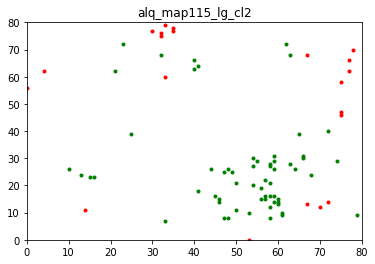

[25.6, 74.4]


Currently mapping.... alq_map116.csv  -->  116
Total no. of points to label.... 112
Label Analysis:-
Total no. of labels:  112
Total no. of lab  1  =  78
Total percentage of lab  1  =  69.64285714285714 %
Total no. of lab  2  =  34
Total percentage of lab  2  =  30.357142857142854 %
map saved!!


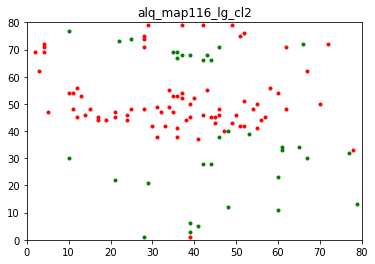

[69.6, 30.4]


Currently mapping.... alq_map117.csv  -->  117
Total no. of points to label.... 93
Label Analysis:-
Total no. of labels:  93
Total no. of lab  1  =  44
Total percentage of lab  1  =  47.31182795698925 %
Total no. of lab  2  =  49
Total percentage of lab  2  =  52.68817204301075 %
map saved!!


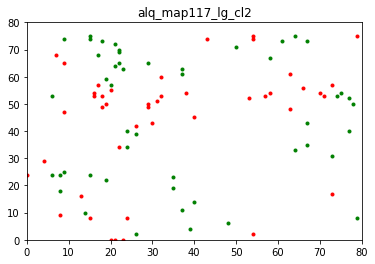

[47.3, 52.7]


Currently mapping.... alq_map118.csv  -->  118
Total no. of points to label.... 108
Label Analysis:-
Total no. of labels:  108
Total no. of lab  1  =  71
Total percentage of lab  1  =  65.74074074074075 %
Total no. of lab  2  =  37
Total percentage of lab  2  =  34.25925925925926 %
map saved!!


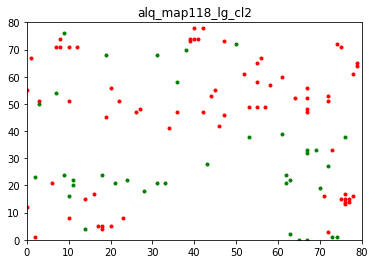

[65.7, 34.3]


Currently mapping.... alq_map119.csv  -->  119
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  33
Total percentage of lab  1  =  44.0 %
Total no. of lab  2  =  42
Total percentage of lab  2  =  56.00000000000001 %
map saved!!


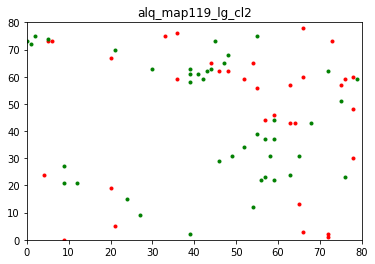

[44.0, 56.0]




In [63]:
alq_lg = pseudo_classifier_label(num_npy, lg_remap['al_lgl'], tr_map['aln_re_id.csv'], alq_map, 
                                 80, "_lg_cl2", "results", True)

Currently mapping.... alq_map000.csv  -->  0
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  20
Total percentage of lab  1  =  54.054054054054056 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  45.94594594594595 %
map saved!!


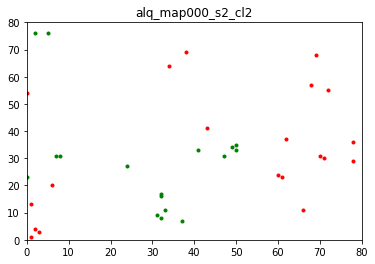

[54.1, 45.9]


Currently mapping.... alq_map001.csv  -->  1
Total no. of points to label.... 30
Label Analysis:-
Total no. of labels:  30
Total no. of lab  1  =  19
Total percentage of lab  1  =  63.33333333333333 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  36.666666666666664 %
map saved!!


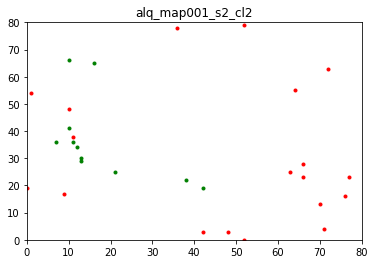

[63.3, 36.7]


Currently mapping.... alq_map002.csv  -->  2
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  14
Total percentage of lab  1  =  51.85185185185185 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  48.148148148148145 %
map saved!!


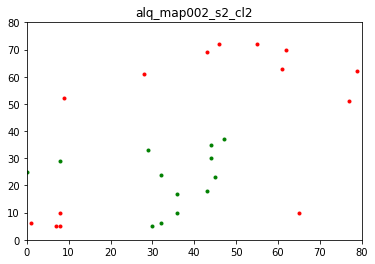

[51.9, 48.1]


Currently mapping.... alq_map003.csv  -->  3
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  23
Total percentage of lab  1  =  57.49999999999999 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  42.5 %
map saved!!


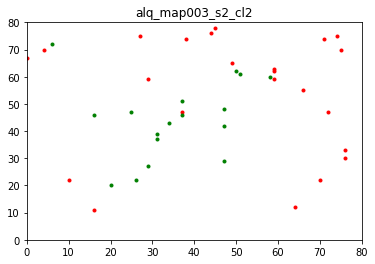

[57.5, 42.5]


Currently mapping.... alq_map004.csv  -->  4
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  22
Total percentage of lab  1  =  81.48148148148148 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  18.51851851851852 %
map saved!!


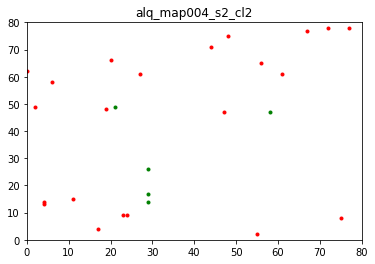

[81.5, 18.5]


Currently mapping.... alq_map005.csv  -->  5
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  19
Total percentage of lab  1  =  59.375 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  40.625 %
map saved!!


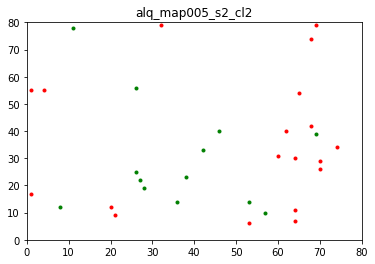

[59.4, 40.6]


Currently mapping.... alq_map006.csv  -->  6
Total no. of points to label.... 14
Label Analysis:-
Total no. of labels:  14
Total no. of lab  1  =  7
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  50.0 %
map saved!!


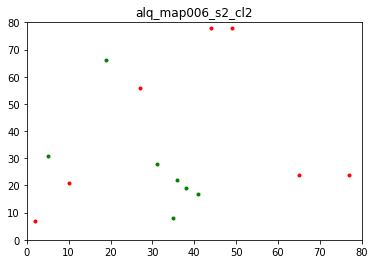

[50.0, 50.0]


Currently mapping.... alq_map007.csv  -->  7
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  22
Total percentage of lab  1  =  70.96774193548387 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  29.03225806451613 %
map saved!!


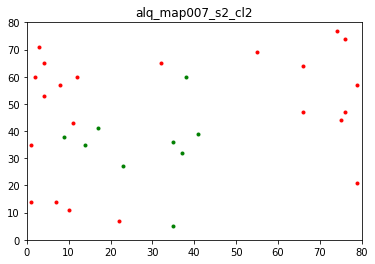

[71.0, 29.0]


Currently mapping.... alq_map008.csv  -->  8
Total no. of points to label.... 39
Label Analysis:-
Total no. of labels:  39
Total no. of lab  1  =  21
Total percentage of lab  1  =  53.84615384615385 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  46.15384615384615 %
map saved!!


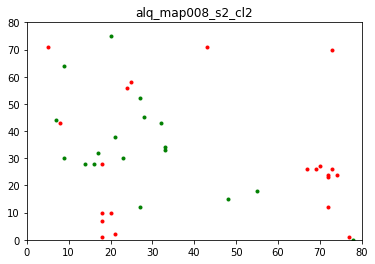

[53.8, 46.2]


Currently mapping.... alq_map009.csv  -->  9
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  25
Total percentage of lab  1  =  60.97560975609756 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  39.02439024390244 %
map saved!!


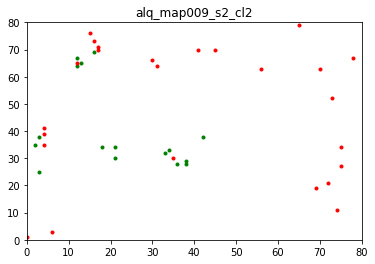

[61.0, 39.0]


Currently mapping.... alq_map010.csv  -->  10
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  22
Total percentage of lab  1  =  70.96774193548387 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  29.03225806451613 %
map saved!!


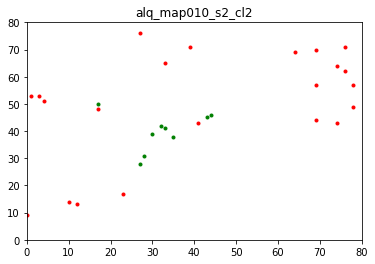

[71.0, 29.0]


Currently mapping.... alq_map011.csv  -->  11
Total no. of points to label.... 39
Label Analysis:-
Total no. of labels:  39
Total no. of lab  1  =  17
Total percentage of lab  1  =  43.58974358974359 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  56.41025641025641 %
map saved!!


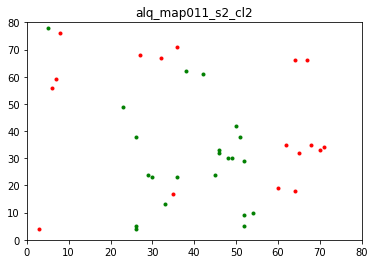

[43.6, 56.4]


Currently mapping.... alq_map012.csv  -->  12
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  18
Total percentage of lab  1  =  41.86046511627907 %
Total no. of lab  2  =  25
Total percentage of lab  2  =  58.139534883720934 %
map saved!!


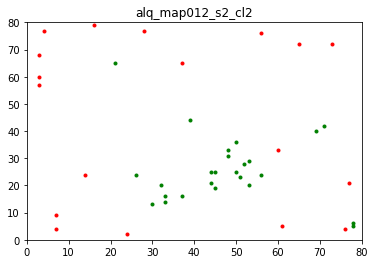

[41.9, 58.1]


Currently mapping.... alq_map013.csv  -->  13
Total no. of points to label.... 29
Label Analysis:-
Total no. of labels:  29
Total no. of lab  1  =  23
Total percentage of lab  1  =  79.3103448275862 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  20.689655172413794 %
map saved!!


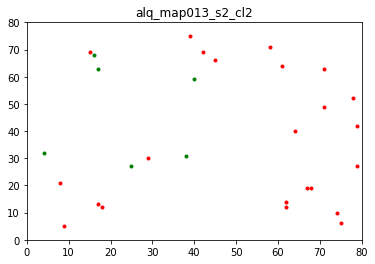

[79.3, 20.7]


Currently mapping.... alq_map014.csv  -->  14
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  18
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  50.0 %
map saved!!


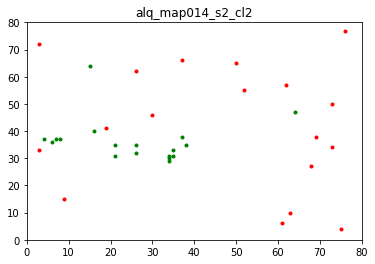

[50.0, 50.0]


Currently mapping.... alq_map015.csv  -->  15
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  21
Total percentage of lab  1  =  35.0 %
Total no. of lab  2  =  39
Total percentage of lab  2  =  65.0 %
map saved!!


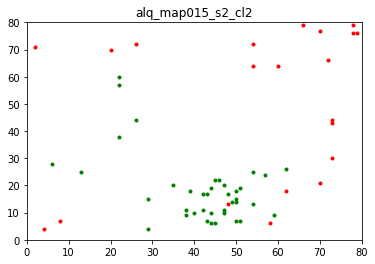

[35.0, 65.0]


Currently mapping.... alq_map016.csv  -->  16
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  24
Total percentage of lab  1  =  64.86486486486487 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  35.13513513513514 %
map saved!!


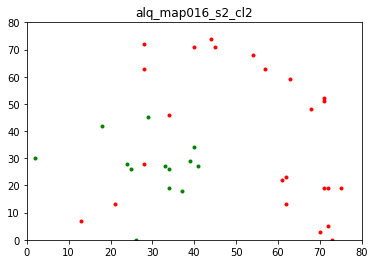

[64.9, 35.1]


Currently mapping.... alq_map017.csv  -->  17
Total no. of points to label.... 26
Label Analysis:-
Total no. of labels:  26
Total no. of lab  1  =  11
Total percentage of lab  1  =  42.30769230769231 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  57.692307692307686 %
map saved!!


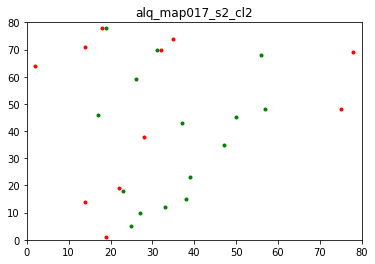

[42.3, 57.7]


Currently mapping.... alq_map018.csv  -->  18
Total no. of points to label.... 51
Label Analysis:-
Total no. of labels:  51
Total no. of lab  1  =  18
Total percentage of lab  1  =  35.294117647058826 %
Total no. of lab  2  =  33
Total percentage of lab  2  =  64.70588235294117 %
map saved!!


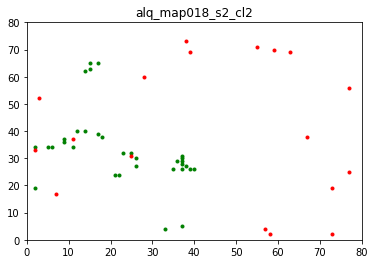

[35.3, 64.7]


Currently mapping.... alq_map019.csv  -->  19
Total no. of points to label.... 17
Label Analysis:-
Total no. of labels:  17
Total no. of lab  1  =  9
Total percentage of lab  1  =  52.94117647058824 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  47.05882352941176 %
map saved!!


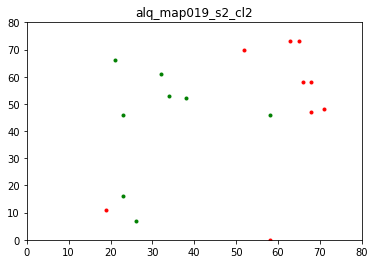

[52.9, 47.1]


Currently mapping.... alq_map020.csv  -->  20
Total no. of points to label.... 33
Label Analysis:-
Total no. of labels:  33
Total no. of lab  1  =  22
Total percentage of lab  1  =  66.66666666666666 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  33.33333333333333 %
map saved!!


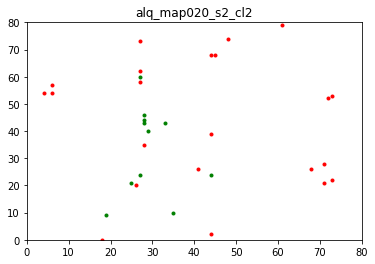

[66.7, 33.3]


Currently mapping.... alq_map021.csv  -->  21
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  32
Total percentage of lab  1  =  78.04878048780488 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  21.951219512195124 %
map saved!!


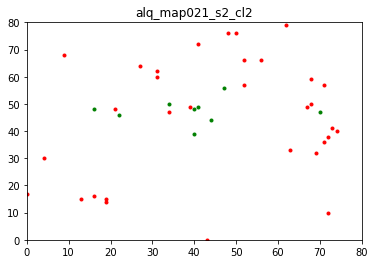

[78.0, 22.0]


Currently mapping.... alq_map022.csv  -->  22
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  23
Total percentage of lab  1  =  71.875 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  28.125 %
map saved!!


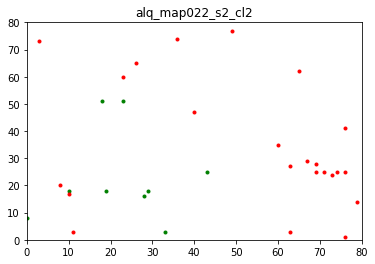

[71.9, 28.1]


Currently mapping.... alq_map023.csv  -->  23
Total no. of points to label.... 28
Label Analysis:-
Total no. of labels:  28
Total no. of lab  1  =  16
Total percentage of lab  1  =  57.14285714285714 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  42.857142857142854 %
map saved!!


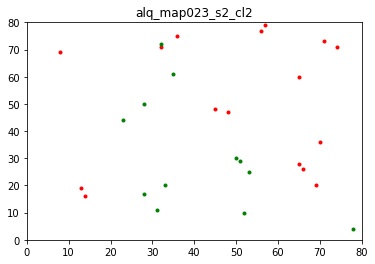

[57.1, 42.9]


Currently mapping.... alq_map024.csv  -->  24
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  21
Total percentage of lab  1  =  65.625 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  34.375 %
map saved!!


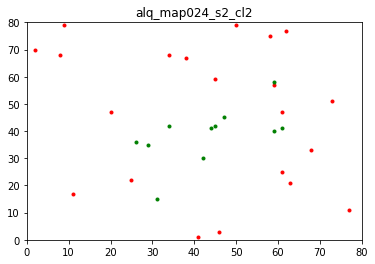

[65.6, 34.4]


Currently mapping.... alq_map025.csv  -->  25
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  20
Total percentage of lab  1  =  46.51162790697674 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  53.48837209302325 %
map saved!!


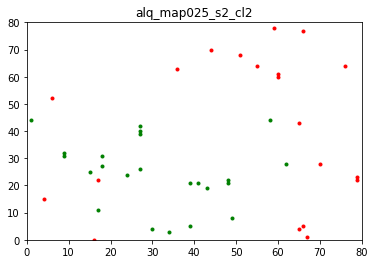

[46.5, 53.5]


Currently mapping.... alq_map026.csv  -->  26
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  15
Total percentage of lab  1  =  46.875 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  53.125 %
map saved!!


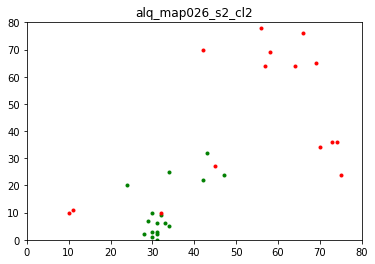

[46.9, 53.1]


Currently mapping.... alq_map027.csv  -->  27
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  26
Total percentage of lab  1  =  72.22222222222221 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  27.77777777777778 %
map saved!!


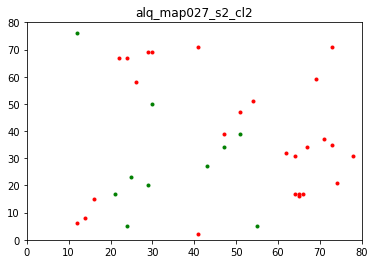

[72.2, 27.8]


Currently mapping.... alq_map028.csv  -->  28
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  24
Total percentage of lab  1  =  46.15384615384615 %
Total no. of lab  2  =  28
Total percentage of lab  2  =  53.84615384615385 %
map saved!!


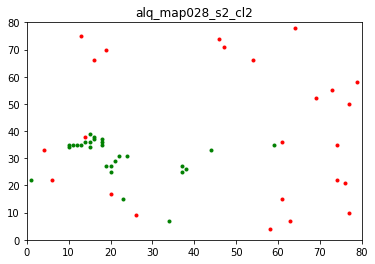

[46.2, 53.8]


Currently mapping.... alq_map029.csv  -->  29
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  22
Total percentage of lab  1  =  51.162790697674424 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  48.837209302325576 %
map saved!!


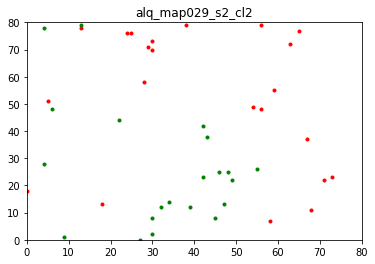

[51.2, 48.8]


Currently mapping.... alq_map030.csv  -->  30
Total no. of points to label.... 54
Label Analysis:-
Total no. of labels:  54
Total no. of lab  1  =  15
Total percentage of lab  1  =  27.77777777777778 %
Total no. of lab  2  =  39
Total percentage of lab  2  =  72.22222222222221 %
map saved!!


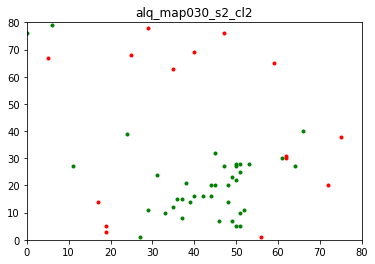

[27.8, 72.2]


Currently mapping.... alq_map031.csv  -->  31
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  32
Total percentage of lab  1  =  78.04878048780488 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  21.951219512195124 %
map saved!!


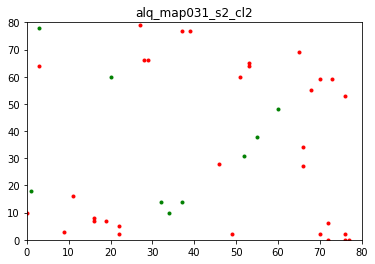

[78.0, 22.0]


Currently mapping.... alq_map032.csv  -->  32
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  19
Total percentage of lab  1  =  31.666666666666664 %
Total no. of lab  2  =  41
Total percentage of lab  2  =  68.33333333333333 %
map saved!!


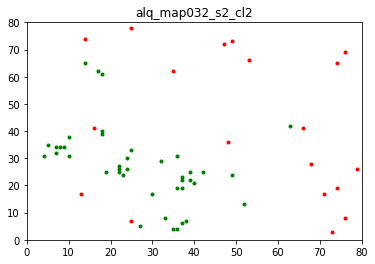

[31.7, 68.3]


Currently mapping.... alq_map033.csv  -->  33
Total no. of points to label.... 84
Label Analysis:-
Total no. of labels:  84
Total no. of lab  1  =  39
Total percentage of lab  1  =  46.42857142857143 %
Total no. of lab  2  =  45
Total percentage of lab  2  =  53.57142857142857 %
map saved!!


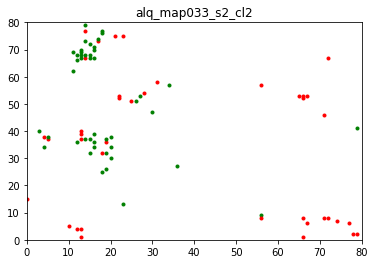

[46.4, 53.6]


Currently mapping.... alq_map034.csv  -->  34
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  21
Total percentage of lab  1  =  40.38461538461539 %
Total no. of lab  2  =  31
Total percentage of lab  2  =  59.61538461538461 %
map saved!!


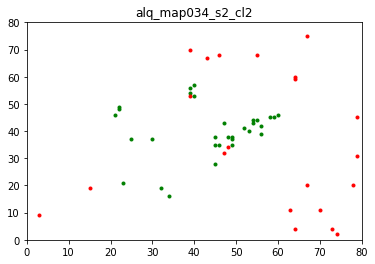

[40.4, 59.6]


Currently mapping.... alq_map035.csv  -->  35
Total no. of points to label.... 64
Label Analysis:-
Total no. of labels:  64
Total no. of lab  1  =  33
Total percentage of lab  1  =  51.5625 %
Total no. of lab  2  =  31
Total percentage of lab  2  =  48.4375 %
map saved!!


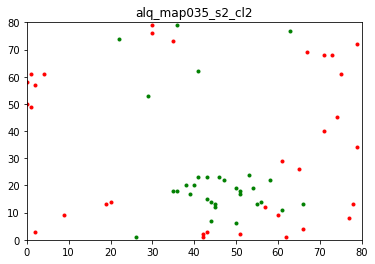

[51.6, 48.4]


Currently mapping.... alq_map036.csv  -->  36
Total no. of points to label.... 69
Label Analysis:-
Total no. of labels:  69
Total no. of lab  1  =  21
Total percentage of lab  1  =  30.434782608695656 %
Total no. of lab  2  =  48
Total percentage of lab  2  =  69.56521739130434 %
map saved!!


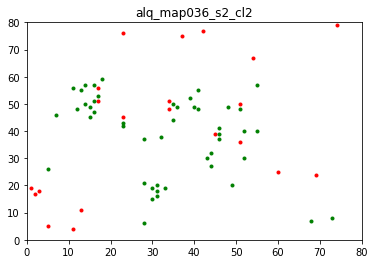

[30.4, 69.6]


Currently mapping.... alq_map037.csv  -->  37
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  18
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  50.0 %
map saved!!


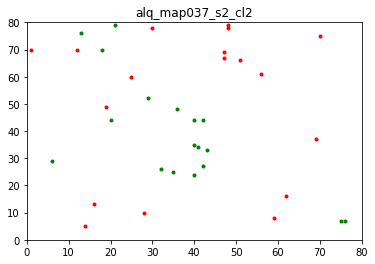

[50.0, 50.0]


Currently mapping.... alq_map038.csv  -->  38
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  25
Total percentage of lab  1  =  58.139534883720934 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  41.86046511627907 %
map saved!!


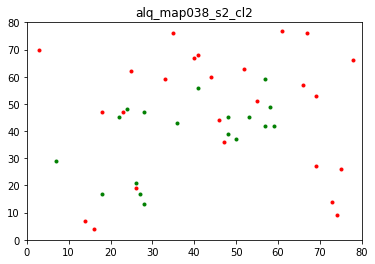

[58.1, 41.9]


Currently mapping.... alq_map039.csv  -->  39
Total no. of points to label.... 46
Label Analysis:-
Total no. of labels:  46
Total no. of lab  1  =  22
Total percentage of lab  1  =  47.82608695652174 %
Total no. of lab  2  =  24
Total percentage of lab  2  =  52.17391304347826 %
map saved!!


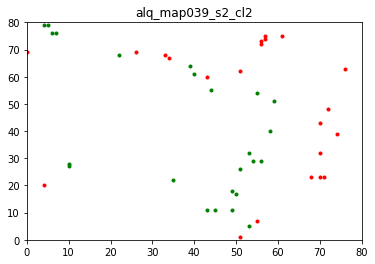

[47.8, 52.2]


Currently mapping.... alq_map040.csv  -->  40
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  25
Total percentage of lab  1  =  80.64516129032258 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  19.35483870967742 %
map saved!!


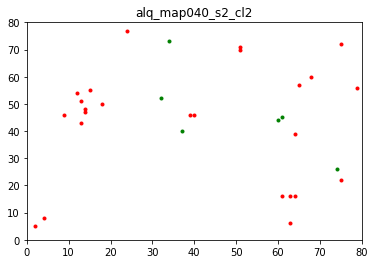

[80.6, 19.4]


Currently mapping.... alq_map041.csv  -->  41
Total no. of points to label.... 34
Label Analysis:-
Total no. of labels:  34
Total no. of lab  1  =  26
Total percentage of lab  1  =  76.47058823529412 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  23.52941176470588 %
map saved!!


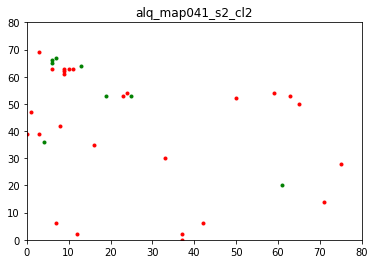

[76.5, 23.5]


Currently mapping.... alq_map042.csv  -->  42
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  24
Total percentage of lab  1  =  63.1578947368421 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  36.84210526315789 %
map saved!!


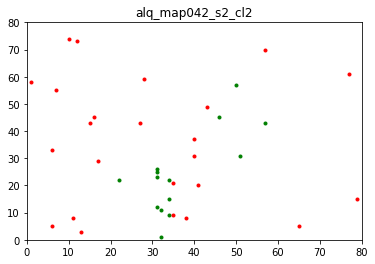

[63.2, 36.8]


Currently mapping.... alq_map043.csv  -->  43
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  16
Total percentage of lab  1  =  59.25925925925925 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  40.74074074074074 %
map saved!!


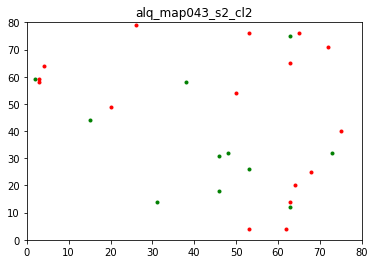

[59.3, 40.7]


Currently mapping.... alq_map044.csv  -->  44
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  17
Total percentage of lab  1  =  41.46341463414634 %
Total no. of lab  2  =  24
Total percentage of lab  2  =  58.536585365853654 %
map saved!!


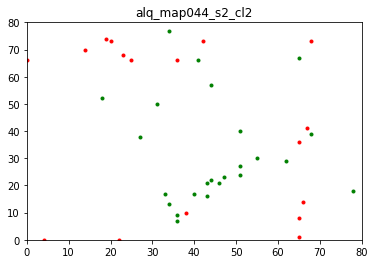

[41.5, 58.5]


Currently mapping.... alq_map045.csv  -->  45
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  21
Total percentage of lab  1  =  51.21951219512195 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  48.78048780487805 %
map saved!!


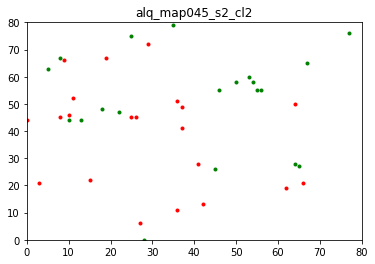

[51.2, 48.8]


Currently mapping.... alq_map046.csv  -->  46
Total no. of points to label.... 26
Label Analysis:-
Total no. of labels:  26
Total no. of lab  1  =  19
Total percentage of lab  1  =  73.07692307692307 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  26.923076923076923 %
map saved!!


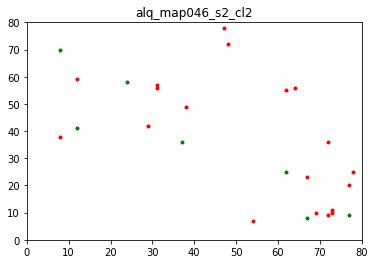

[73.1, 26.9]


Currently mapping.... alq_map047.csv  -->  47
Total no. of points to label.... 24
Label Analysis:-
Total no. of labels:  24
Total no. of lab  1  =  16
Total percentage of lab  1  =  66.66666666666666 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  33.33333333333333 %
map saved!!


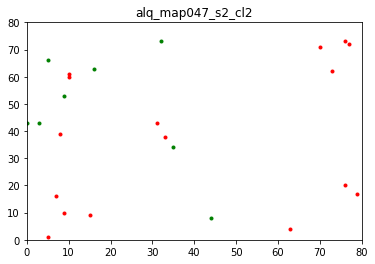

[66.7, 33.3]


Currently mapping.... alq_map048.csv  -->  48
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  28
Total percentage of lab  1  =  70.0 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  30.0 %
map saved!!


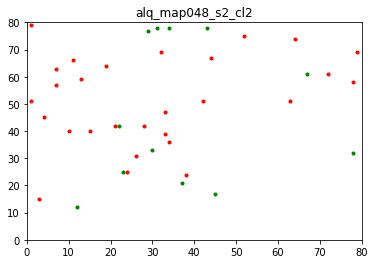

[70.0, 30.0]


Currently mapping.... alq_map049.csv  -->  49
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  25
Total percentage of lab  1  =  65.78947368421053 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  34.21052631578947 %
map saved!!


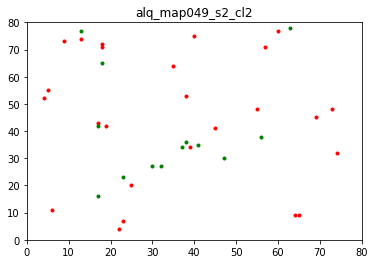

[65.8, 34.2]


Currently mapping.... alq_map050.csv  -->  50
Total no. of points to label.... 125
Label Analysis:-
Total no. of labels:  125
Total no. of lab  1  =  54
Total percentage of lab  1  =  43.2 %
Total no. of lab  2  =  71
Total percentage of lab  2  =  56.8 %
map saved!!


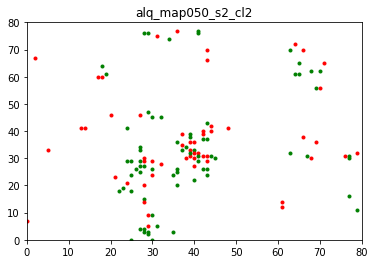

[43.2, 56.8]


Currently mapping.... alq_map051.csv  -->  51
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  41
Total percentage of lab  1  =  68.33333333333333 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  31.666666666666664 %
map saved!!


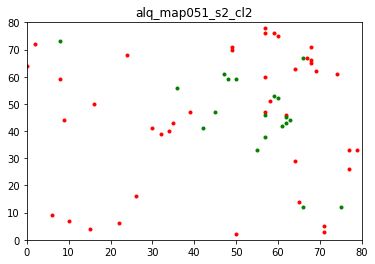

[68.3, 31.7]


Currently mapping.... alq_map052.csv  -->  52
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  35
Total percentage of lab  1  =  67.3076923076923 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  32.69230769230769 %
map saved!!


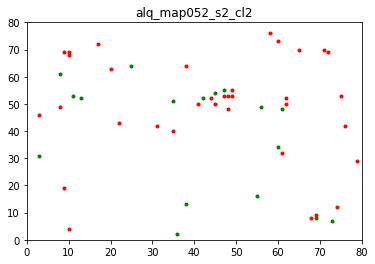

[67.3, 32.7]


Currently mapping.... alq_map053.csv  -->  53
Total no. of points to label.... 51
Label Analysis:-
Total no. of labels:  51
Total no. of lab  1  =  30
Total percentage of lab  1  =  58.82352941176471 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  41.17647058823529 %
map saved!!


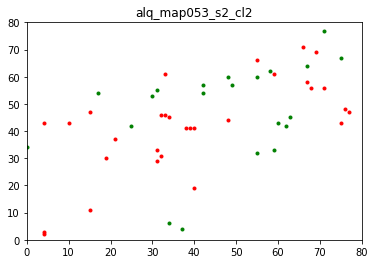

[58.8, 41.2]


Currently mapping.... alq_map054.csv  -->  54
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  21
Total percentage of lab  1  =  58.333333333333336 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  41.66666666666667 %
map saved!!


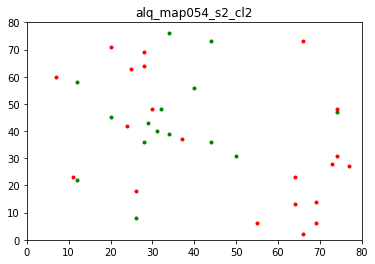

[58.3, 41.7]


Currently mapping.... alq_map055.csv  -->  55
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  38
Total percentage of lab  1  =  50.66666666666667 %
Total no. of lab  2  =  37
Total percentage of lab  2  =  49.333333333333336 %
map saved!!


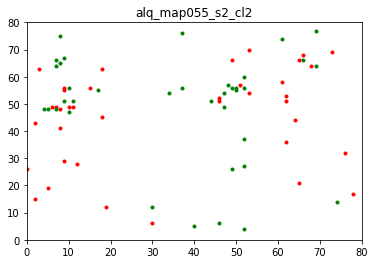

[50.7, 49.3]


Currently mapping.... alq_map056.csv  -->  56
Total no. of points to label.... 19
Label Analysis:-
Total no. of labels:  19
Total no. of lab  1  =  16
Total percentage of lab  1  =  84.21052631578947 %
Total no. of lab  2  =  3
Total percentage of lab  2  =  15.789473684210526 %
map saved!!


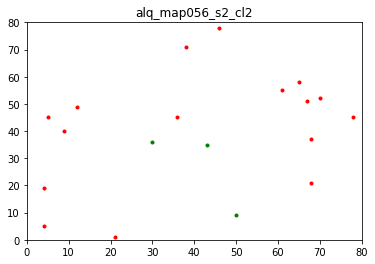

[84.2, 15.8]


Currently mapping.... alq_map057.csv  -->  57
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  16
Total percentage of lab  1  =  43.24324324324324 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  56.75675675675676 %
map saved!!


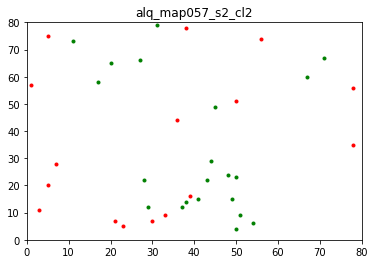

[43.2, 56.8]


Currently mapping.... alq_map058.csv  -->  58
Total no. of points to label.... 44
Label Analysis:-
Total no. of labels:  44
Total no. of lab  1  =  37
Total percentage of lab  1  =  84.0909090909091 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  15.909090909090908 %
map saved!!


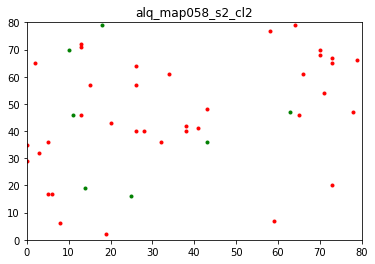

[84.1, 15.9]


Currently mapping.... alq_map059.csv  -->  59
Total no. of points to label.... 33
Label Analysis:-
Total no. of labels:  33
Total no. of lab  1  =  20
Total percentage of lab  1  =  60.60606060606061 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  39.39393939393939 %
map saved!!


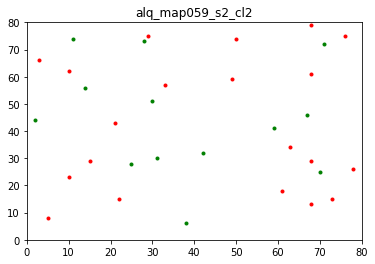

[60.6, 39.4]


Currently mapping.... alq_map060.csv  -->  60
Total no. of points to label.... 62
Label Analysis:-
Total no. of labels:  62
Total no. of lab  1  =  45
Total percentage of lab  1  =  72.58064516129032 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  27.419354838709676 %
map saved!!


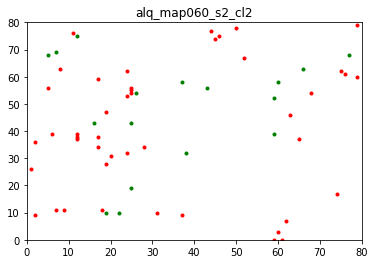

[72.6, 27.4]


Currently mapping.... alq_map061.csv  -->  61
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  21
Total percentage of lab  1  =  51.21951219512195 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  48.78048780487805 %
map saved!!


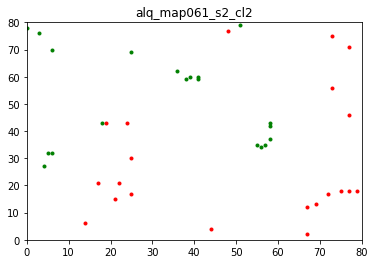

[51.2, 48.8]


Currently mapping.... alq_map062.csv  -->  62
Total no. of points to label.... 24
Label Analysis:-
Total no. of labels:  24
Total no. of lab  1  =  14
Total percentage of lab  1  =  58.333333333333336 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  41.66666666666667 %
map saved!!


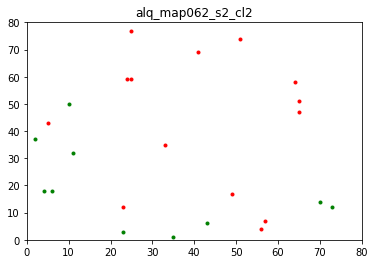

[58.3, 41.7]


Currently mapping.... alq_map063.csv  -->  63
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  24
Total percentage of lab  1  =  55.81395348837209 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  44.18604651162791 %
map saved!!


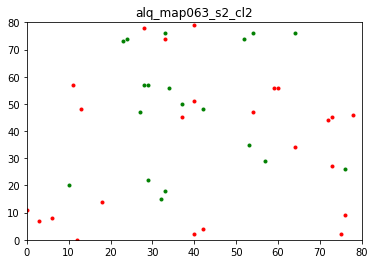

[55.8, 44.2]


Currently mapping.... alq_map064.csv  -->  64
Total no. of points to label.... 50
Label Analysis:-
Total no. of labels:  50
Total no. of lab  1  =  31
Total percentage of lab  1  =  62.0 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  38.0 %
map saved!!


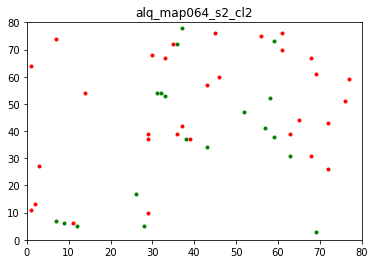

[62.0, 38.0]


Currently mapping.... alq_map065.csv  -->  65
Total no. of points to label.... 44
Label Analysis:-
Total no. of labels:  44
Total no. of lab  1  =  39
Total percentage of lab  1  =  88.63636363636364 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  11.363636363636363 %
map saved!!


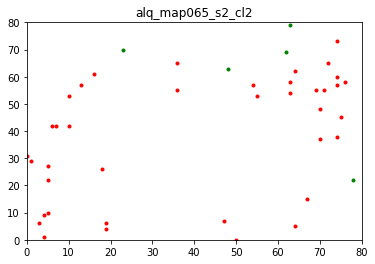

[88.6, 11.4]


Currently mapping.... alq_map066.csv  -->  66
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  33
Total percentage of lab  1  =  54.09836065573771 %
Total no. of lab  2  =  28
Total percentage of lab  2  =  45.90163934426229 %
map saved!!


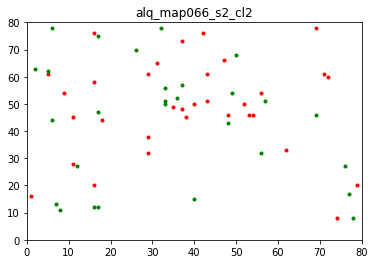

[54.1, 45.9]


Currently mapping.... alq_map067.csv  -->  67
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  16
Total percentage of lab  1  =  44.44444444444444 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  55.55555555555556 %
map saved!!


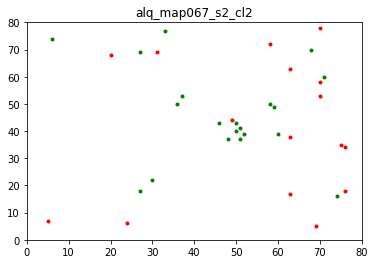

[44.4, 55.6]


Currently mapping.... alq_map068.csv  -->  68
Total no. of points to label.... 45
Label Analysis:-
Total no. of labels:  45
Total no. of lab  1  =  33
Total percentage of lab  1  =  73.33333333333333 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  26.666666666666668 %
map saved!!


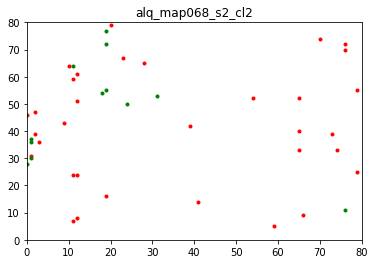

[73.3, 26.7]


Currently mapping.... alq_map069.csv  -->  69
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  37
Total percentage of lab  1  =  71.15384615384616 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  28.846153846153843 %
map saved!!


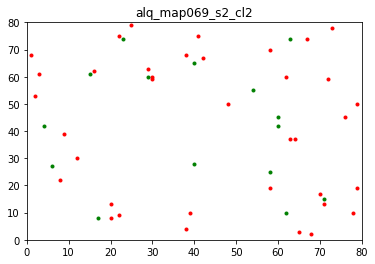

[71.2, 28.8]


Currently mapping.... alq_map070.csv  -->  70
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  40
Total percentage of lab  1  =  66.66666666666666 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  33.33333333333333 %
map saved!!


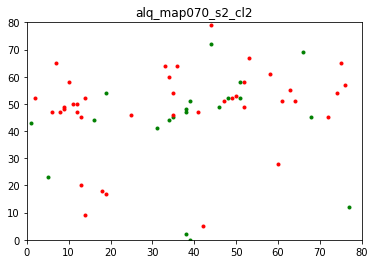

[66.7, 33.3]


Currently mapping.... alq_map071.csv  -->  71
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  24
Total percentage of lab  1  =  46.15384615384615 %
Total no. of lab  2  =  28
Total percentage of lab  2  =  53.84615384615385 %
map saved!!


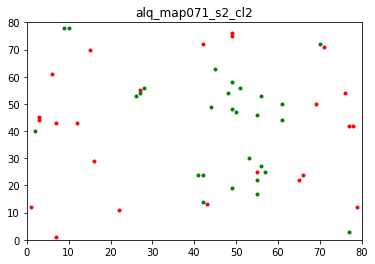

[46.2, 53.8]


Currently mapping.... alq_map072.csv  -->  72
Total no. of points to label.... 62
Label Analysis:-
Total no. of labels:  62
Total no. of lab  1  =  40
Total percentage of lab  1  =  64.51612903225806 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  35.483870967741936 %
map saved!!


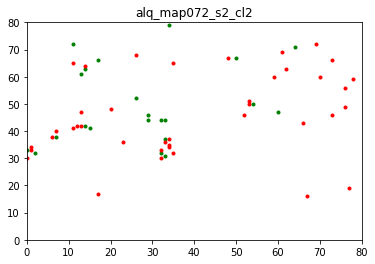

[64.5, 35.5]


Currently mapping.... alq_map073.csv  -->  73
Total no. of points to label.... 85
Label Analysis:-
Total no. of labels:  85
Total no. of lab  1  =  46
Total percentage of lab  1  =  54.11764705882353 %
Total no. of lab  2  =  39
Total percentage of lab  2  =  45.88235294117647 %
map saved!!


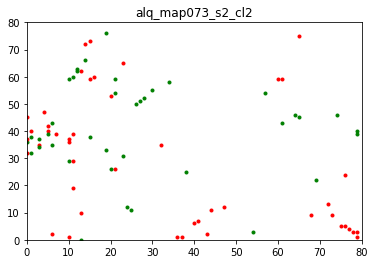

[54.1, 45.9]


Currently mapping.... alq_map074.csv  -->  74
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  28
Total percentage of lab  1  =  48.275862068965516 %
Total no. of lab  2  =  30
Total percentage of lab  2  =  51.724137931034484 %
map saved!!


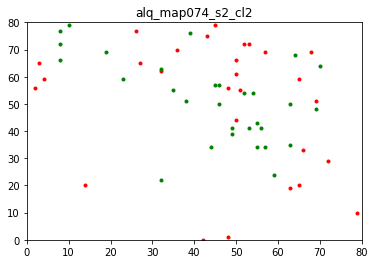

[48.3, 51.7]


Currently mapping.... alq_map075.csv  -->  75
Total no. of points to label.... 59
Label Analysis:-
Total no. of labels:  59
Total no. of lab  1  =  49
Total percentage of lab  1  =  83.05084745762711 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  16.94915254237288 %
map saved!!


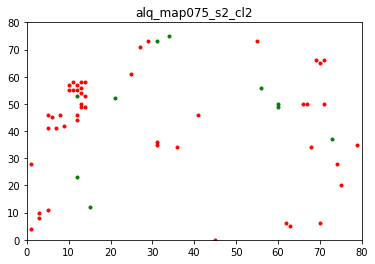

[83.1, 16.9]


Currently mapping.... alq_map076.csv  -->  76
Total no. of points to label.... 72
Label Analysis:-
Total no. of labels:  72
Total no. of lab  1  =  35
Total percentage of lab  1  =  48.61111111111111 %
Total no. of lab  2  =  37
Total percentage of lab  2  =  51.388888888888886 %
map saved!!


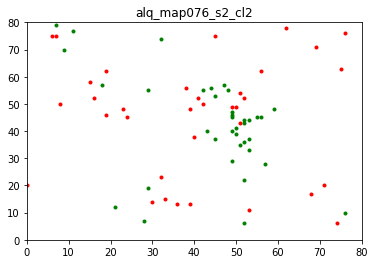

[48.6, 51.4]


Currently mapping.... alq_map077.csv  -->  77
Total no. of points to label.... 42
Label Analysis:-
Total no. of labels:  42
Total no. of lab  1  =  29
Total percentage of lab  1  =  69.04761904761905 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  30.952380952380953 %
map saved!!


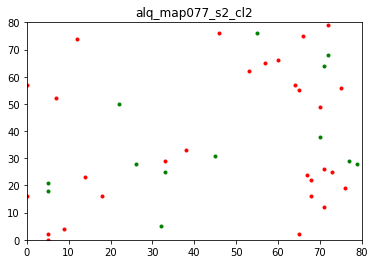

[69.0, 31.0]


Currently mapping.... alq_map078.csv  -->  78
Total no. of points to label.... 63
Label Analysis:-
Total no. of labels:  63
Total no. of lab  1  =  26
Total percentage of lab  1  =  41.269841269841265 %
Total no. of lab  2  =  37
Total percentage of lab  2  =  58.730158730158735 %
map saved!!


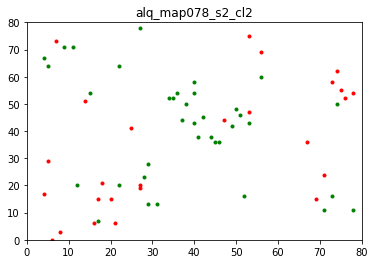

[41.3, 58.7]


Currently mapping.... alq_map079.csv  -->  79
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  20
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  50.0 %
map saved!!


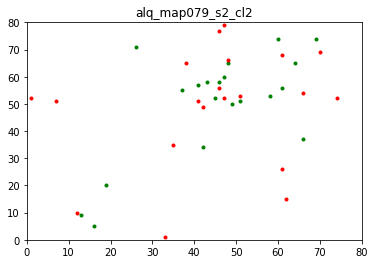

[50.0, 50.0]


Currently mapping.... alq_map080.csv  -->  80
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  24
Total percentage of lab  1  =  66.66666666666666 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  33.33333333333333 %
map saved!!


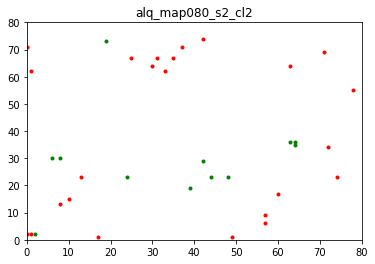

[66.7, 33.3]


Currently mapping.... alq_map081.csv  -->  81
Total no. of points to label.... 77
Label Analysis:-
Total no. of labels:  77
Total no. of lab  1  =  36
Total percentage of lab  1  =  46.75324675324675 %
Total no. of lab  2  =  41
Total percentage of lab  2  =  53.246753246753244 %
map saved!!


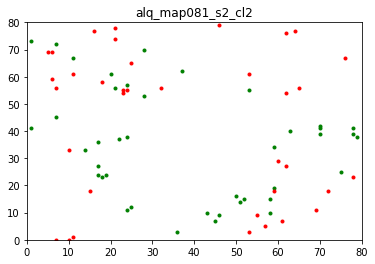

[46.8, 53.2]


Currently mapping.... alq_map082.csv  -->  82
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  19
Total percentage of lab  1  =  52.77777777777778 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  47.22222222222222 %
map saved!!


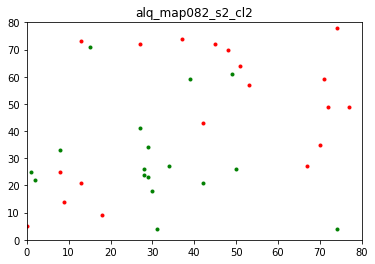

[52.8, 47.2]


Currently mapping.... alq_map083.csv  -->  83
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  23
Total percentage of lab  1  =  53.48837209302325 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  46.51162790697674 %
map saved!!


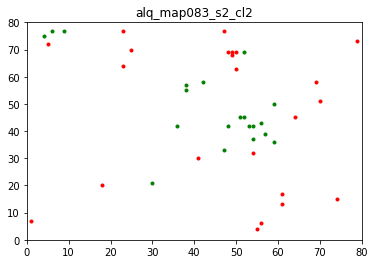

[53.5, 46.5]


Currently mapping.... alq_map084.csv  -->  84
Total no. of points to label.... 49
Label Analysis:-
Total no. of labels:  49
Total no. of lab  1  =  27
Total percentage of lab  1  =  55.10204081632652 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  44.89795918367347 %
map saved!!


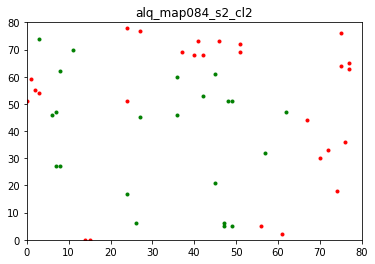

[55.1, 44.9]


Currently mapping.... alq_map085.csv  -->  85
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  31
Total percentage of lab  1  =  53.44827586206896 %
Total no. of lab  2  =  27
Total percentage of lab  2  =  46.55172413793103 %
map saved!!


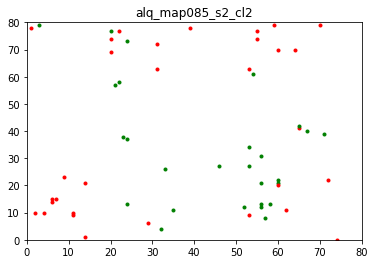

[53.4, 46.6]


Currently mapping.... alq_map086.csv  -->  86
Total no. of points to label.... 74
Label Analysis:-
Total no. of labels:  74
Total no. of lab  1  =  45
Total percentage of lab  1  =  60.810810810810814 %
Total no. of lab  2  =  29
Total percentage of lab  2  =  39.189189189189186 %
map saved!!


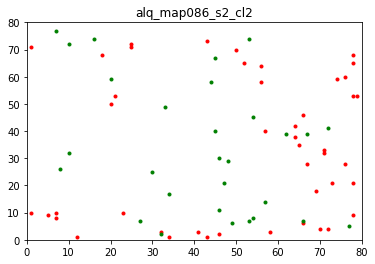

[60.8, 39.2]


Currently mapping.... alq_map087.csv  -->  87
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  23
Total percentage of lab  1  =  53.48837209302325 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  46.51162790697674 %
map saved!!


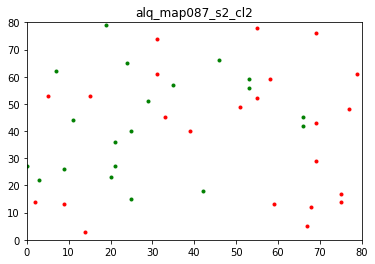

[53.5, 46.5]


Currently mapping.... alq_map088.csv  -->  88
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  37
Total percentage of lab  1  =  49.333333333333336 %
Total no. of lab  2  =  38
Total percentage of lab  2  =  50.66666666666667 %
map saved!!


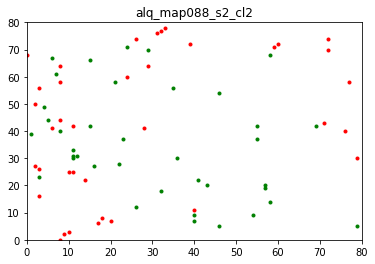

[49.3, 50.7]


Currently mapping.... alq_map089.csv  -->  89
Total no. of points to label.... 68
Label Analysis:-
Total no. of labels:  68
Total no. of lab  1  =  37
Total percentage of lab  1  =  54.41176470588235 %
Total no. of lab  2  =  31
Total percentage of lab  2  =  45.588235294117645 %
map saved!!


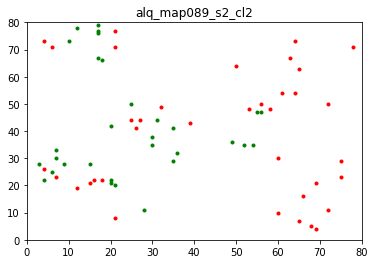

[54.4, 45.6]


Currently mapping.... alq_map090.csv  -->  90
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  43
Total percentage of lab  1  =  52.4390243902439 %
Total no. of lab  2  =  39
Total percentage of lab  2  =  47.5609756097561 %
map saved!!


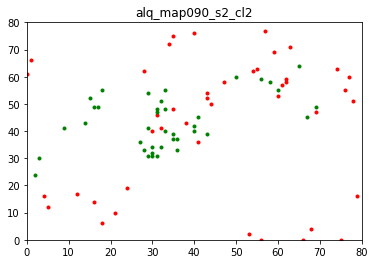

[52.4, 47.6]


Currently mapping.... alq_map091.csv  -->  91
Total no. of points to label.... 65
Label Analysis:-
Total no. of labels:  65
Total no. of lab  1  =  30
Total percentage of lab  1  =  46.15384615384615 %
Total no. of lab  2  =  35
Total percentage of lab  2  =  53.84615384615385 %
map saved!!


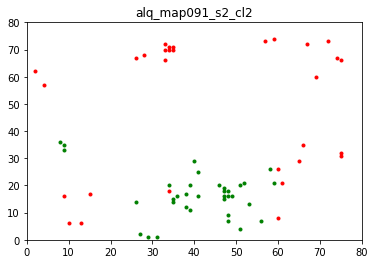

[46.2, 53.8]


Currently mapping.... alq_map092.csv  -->  92
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  38
Total percentage of lab  1  =  65.51724137931035 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  34.48275862068966 %
map saved!!


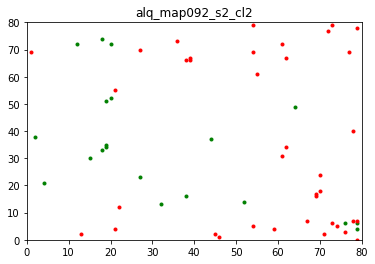

[65.5, 34.5]


Currently mapping.... alq_map093.csv  -->  93
Total no. of points to label.... 46
Label Analysis:-
Total no. of labels:  46
Total no. of lab  1  =  36
Total percentage of lab  1  =  78.26086956521739 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  21.73913043478261 %
map saved!!


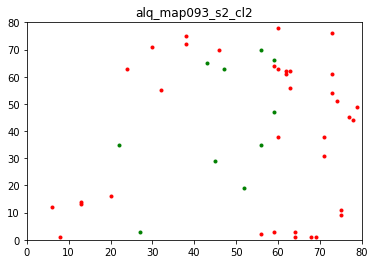

[78.3, 21.7]


Currently mapping.... alq_map094.csv  -->  94
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  43
Total percentage of lab  1  =  70.49180327868852 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  29.508196721311474 %
map saved!!


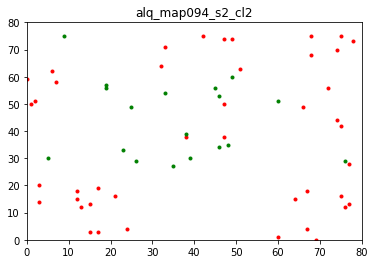

[70.5, 29.5]


Currently mapping.... alq_map095.csv  -->  95
Total no. of points to label.... 84
Label Analysis:-
Total no. of labels:  84
Total no. of lab  1  =  26
Total percentage of lab  1  =  30.952380952380953 %
Total no. of lab  2  =  58
Total percentage of lab  2  =  69.04761904761905 %
map saved!!


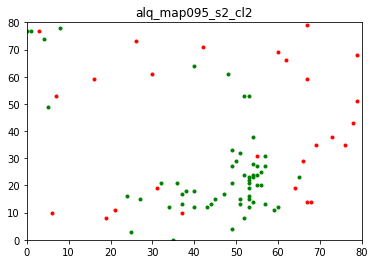

[31.0, 69.0]


Currently mapping.... alq_map096.csv  -->  96
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  18
Total percentage of lab  1  =  47.368421052631575 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  52.63157894736842 %
map saved!!


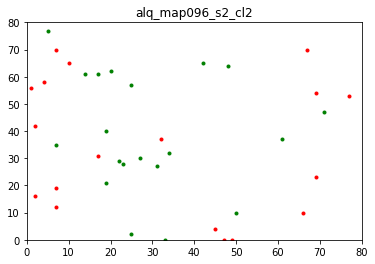

[47.4, 52.6]


Currently mapping.... alq_map097.csv  -->  97
Total no. of points to label.... 47
Label Analysis:-
Total no. of labels:  47
Total no. of lab  1  =  24
Total percentage of lab  1  =  51.06382978723404 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  48.93617021276596 %
map saved!!


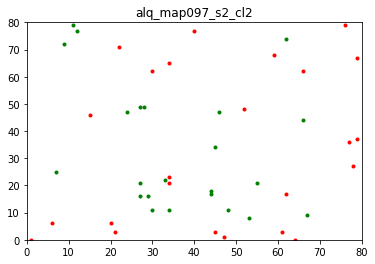

[51.1, 48.9]


Currently mapping.... alq_map098.csv  -->  98
Total no. of points to label.... 88
Label Analysis:-
Total no. of labels:  88
Total no. of lab  1  =  56
Total percentage of lab  1  =  63.63636363636363 %
Total no. of lab  2  =  32
Total percentage of lab  2  =  36.36363636363637 %
map saved!!


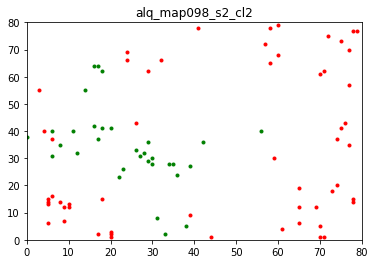

[63.6, 36.4]


Currently mapping.... alq_map099.csv  -->  99
Total no. of points to label.... 64
Label Analysis:-
Total no. of labels:  64
Total no. of lab  1  =  30
Total percentage of lab  1  =  46.875 %
Total no. of lab  2  =  34
Total percentage of lab  2  =  53.125 %
map saved!!


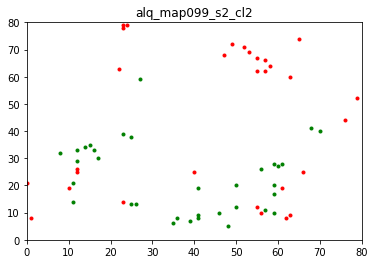

[46.9, 53.1]


Currently mapping.... alq_map100.csv  -->  100
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  27
Total percentage of lab  1  =  51.92307692307693 %
Total no. of lab  2  =  25
Total percentage of lab  2  =  48.07692307692308 %
map saved!!


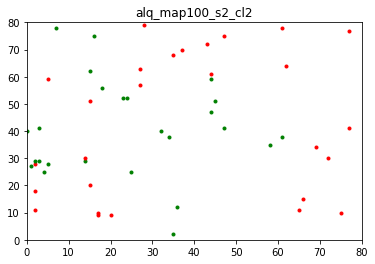

[51.9, 48.1]


Currently mapping.... alq_map101.csv  -->  101
Total no. of points to label.... 69
Label Analysis:-
Total no. of labels:  69
Total no. of lab  1  =  51
Total percentage of lab  1  =  73.91304347826086 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  26.08695652173913 %
map saved!!


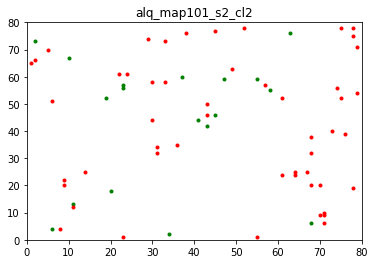

[73.9, 26.1]


Currently mapping.... alq_map102.csv  -->  102
Total no. of points to label.... 71
Label Analysis:-
Total no. of labels:  71
Total no. of lab  1  =  47
Total percentage of lab  1  =  66.19718309859155 %
Total no. of lab  2  =  24
Total percentage of lab  2  =  33.80281690140845 %
map saved!!


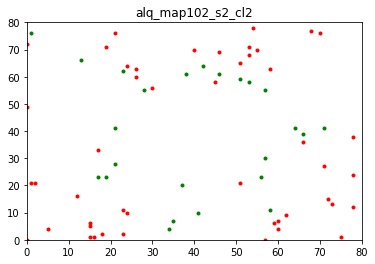

[66.2, 33.8]


Currently mapping.... alq_map103.csv  -->  103
Total no. of points to label.... 42
Label Analysis:-
Total no. of labels:  42
Total no. of lab  1  =  21
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  50.0 %
map saved!!


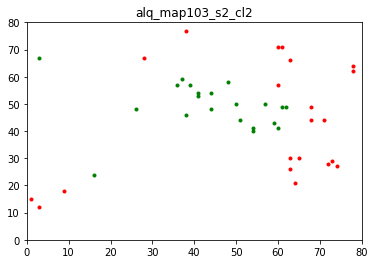

[50.0, 50.0]


Currently mapping.... alq_map104.csv  -->  104
Total no. of points to label.... 68
Label Analysis:-
Total no. of labels:  68
Total no. of lab  1  =  43
Total percentage of lab  1  =  63.23529411764706 %
Total no. of lab  2  =  25
Total percentage of lab  2  =  36.76470588235294 %
map saved!!


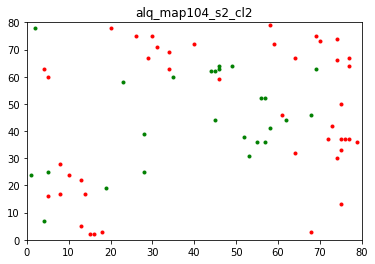

[63.2, 36.8]


Currently mapping.... alq_map105.csv  -->  105
Total no. of points to label.... 59
Label Analysis:-
Total no. of labels:  59
Total no. of lab  1  =  29
Total percentage of lab  1  =  49.152542372881356 %
Total no. of lab  2  =  30
Total percentage of lab  2  =  50.847457627118644 %
map saved!!


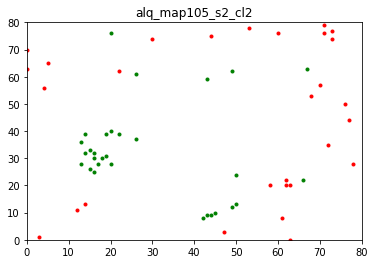

[49.2, 50.8]


Currently mapping.... alq_map106.csv  -->  106
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  35
Total percentage of lab  1  =  57.377049180327866 %
Total no. of lab  2  =  26
Total percentage of lab  2  =  42.62295081967213 %
map saved!!


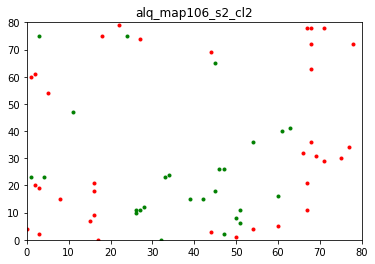

[57.4, 42.6]


Currently mapping.... alq_map107.csv  -->  107
Total no. of points to label.... 55
Label Analysis:-
Total no. of labels:  55
Total no. of lab  1  =  33
Total percentage of lab  1  =  60.0 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  40.0 %
map saved!!


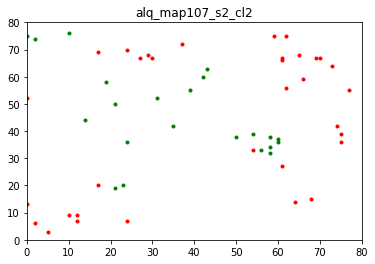

[60.0, 40.0]


Currently mapping.... alq_map108.csv  -->  108
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  47
Total percentage of lab  1  =  57.3170731707317 %
Total no. of lab  2  =  35
Total percentage of lab  2  =  42.68292682926829 %
map saved!!


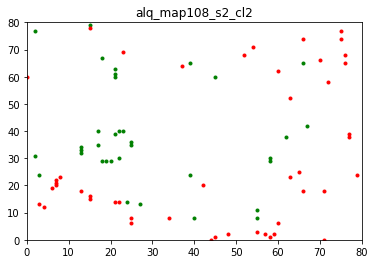

[57.3, 42.7]


Currently mapping.... alq_map109.csv  -->  109
Total no. of points to label.... 95
Label Analysis:-
Total no. of labels:  95
Total no. of lab  1  =  47
Total percentage of lab  1  =  49.473684210526315 %
Total no. of lab  2  =  48
Total percentage of lab  2  =  50.526315789473685 %
map saved!!


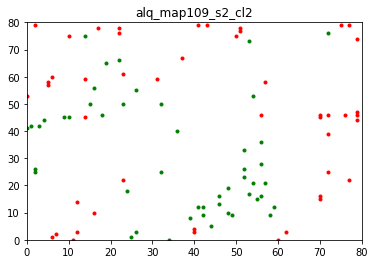

[49.5, 50.5]


Currently mapping.... alq_map110.csv  -->  110
Total no. of points to label.... 77
Label Analysis:-
Total no. of labels:  77
Total no. of lab  1  =  36
Total percentage of lab  1  =  46.75324675324675 %
Total no. of lab  2  =  41
Total percentage of lab  2  =  53.246753246753244 %
map saved!!


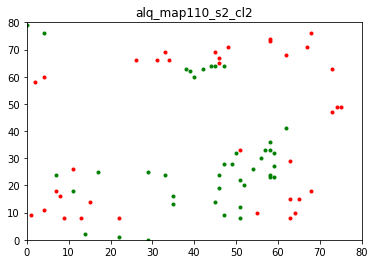

[46.8, 53.2]


Currently mapping.... alq_map111.csv  -->  111
Total no. of points to label.... 141
Label Analysis:-
Total no. of labels:  141
Total no. of lab  1  =  45
Total percentage of lab  1  =  31.914893617021278 %
Total no. of lab  2  =  96
Total percentage of lab  2  =  68.08510638297872 %
map saved!!


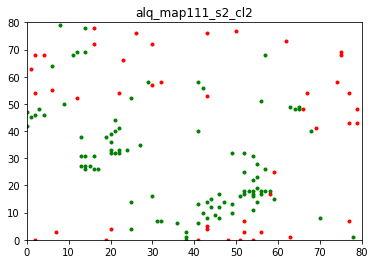

[31.9, 68.1]


Currently mapping.... alq_map112.csv  -->  112
Total no. of points to label.... 96
Label Analysis:-
Total no. of labels:  96
Total no. of lab  1  =  61
Total percentage of lab  1  =  63.541666666666664 %
Total no. of lab  2  =  35
Total percentage of lab  2  =  36.45833333333333 %
map saved!!


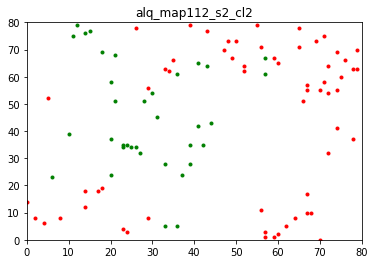

[63.5, 36.5]


Currently mapping.... alq_map113.csv  -->  113
Total no. of points to label.... 76
Label Analysis:-
Total no. of labels:  76
Total no. of lab  1  =  45
Total percentage of lab  1  =  59.210526315789465 %
Total no. of lab  2  =  31
Total percentage of lab  2  =  40.78947368421053 %
map saved!!


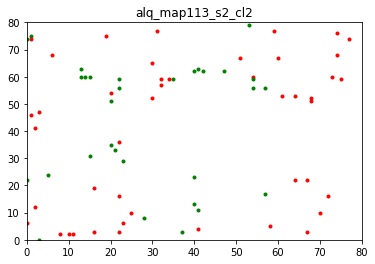

[59.2, 40.8]


Currently mapping.... alq_map114.csv  -->  114
Total no. of points to label.... 71
Label Analysis:-
Total no. of labels:  71
Total no. of lab  1  =  45
Total percentage of lab  1  =  63.38028169014085 %
Total no. of lab  2  =  26
Total percentage of lab  2  =  36.61971830985916 %
map saved!!


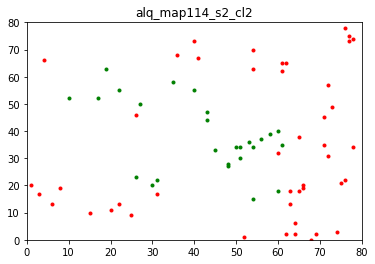

[63.4, 36.6]


Currently mapping.... alq_map115.csv  -->  115
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  30
Total percentage of lab  1  =  36.58536585365854 %
Total no. of lab  2  =  52
Total percentage of lab  2  =  63.41463414634146 %
map saved!!


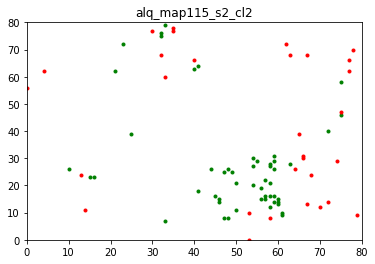

[36.6, 63.4]


Currently mapping.... alq_map116.csv  -->  116
Total no. of points to label.... 112
Label Analysis:-
Total no. of labels:  112
Total no. of lab  1  =  51
Total percentage of lab  1  =  45.535714285714285 %
Total no. of lab  2  =  61
Total percentage of lab  2  =  54.46428571428571 %
map saved!!


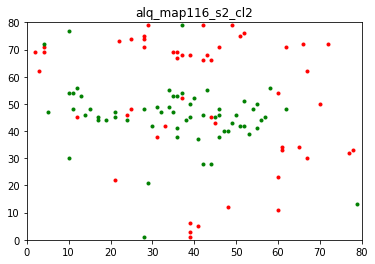

[45.5, 54.5]


Currently mapping.... alq_map117.csv  -->  117
Total no. of points to label.... 93
Label Analysis:-
Total no. of labels:  93
Total no. of lab  1  =  47
Total percentage of lab  1  =  50.53763440860215 %
Total no. of lab  2  =  46
Total percentage of lab  2  =  49.46236559139785 %
map saved!!


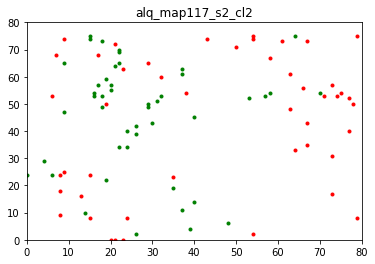

[50.5, 49.5]


Currently mapping.... alq_map118.csv  -->  118
Total no. of points to label.... 108
Label Analysis:-
Total no. of labels:  108
Total no. of lab  1  =  79
Total percentage of lab  1  =  73.14814814814815 %
Total no. of lab  2  =  29
Total percentage of lab  2  =  26.851851851851855 %
map saved!!


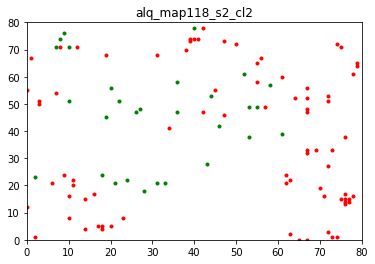

[73.1, 26.9]


Currently mapping.... alq_map119.csv  -->  119
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  38
Total percentage of lab  1  =  50.66666666666667 %
Total no. of lab  2  =  37
Total percentage of lab  2  =  49.333333333333336 %
map saved!!


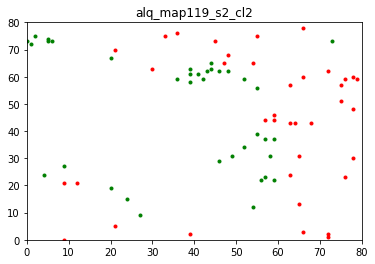

[50.7, 49.3]




In [64]:
alq_s2 = pseudo_classifier_label(num_npy, s2_remap['al_s2l'], tr_map['aln_re_id.csv'], alq_map, 
                                 80, "_s2_cl2", "results", True)

Currently mapping.... alq_map000.csv  -->  0
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  19
Total percentage of lab  1  =  51.35135135135135 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  37.83783783783784 %
Total no. of lab  3  =  4
Total percentage of lab  3  =  10.81081081081081 %
map saved!!


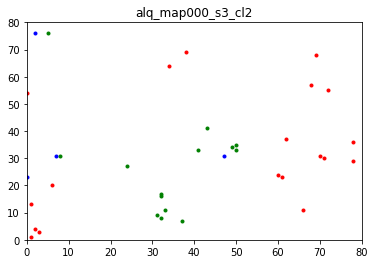

[51.4, 37.8, 10.8]


Currently mapping.... alq_map001.csv  -->  1
Total no. of points to label.... 30
Label Analysis:-
Total no. of labels:  30
Total no. of lab  1  =  17
Total percentage of lab  1  =  56.666666666666664 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  33.33333333333333 %
Total no. of lab  3  =  3
Total percentage of lab  3  =  10.0 %
map saved!!


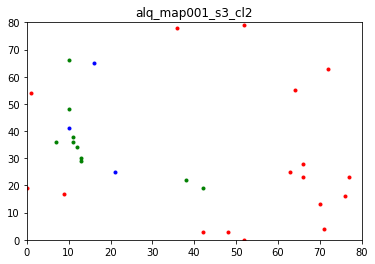

[56.7, 33.3, 10.0]


Currently mapping.... alq_map002.csv  -->  2
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  14
Total percentage of lab  1  =  51.85185185185185 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  44.44444444444444 %
Total no. of lab  3  =  1
Total percentage of lab  3  =  3.7037037037037033 %
map saved!!


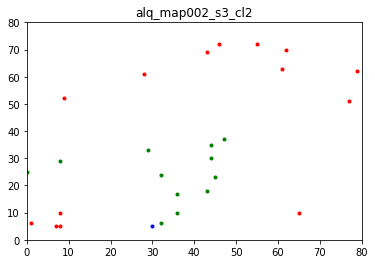

[51.9, 44.4, 3.7]


Currently mapping.... alq_map003.csv  -->  3
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  19
Total percentage of lab  1  =  47.5 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  40.0 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  12.5 %
map saved!!


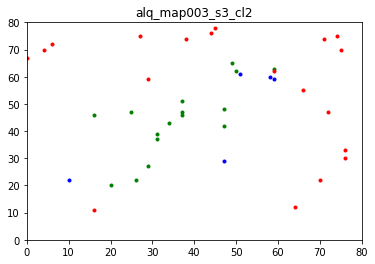

[47.5, 40.0, 12.5]


Currently mapping.... alq_map004.csv  -->  4
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  19
Total percentage of lab  1  =  70.37037037037037 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  25.925925925925924 %
Total no. of lab  3  =  1
Total percentage of lab  3  =  3.7037037037037033 %
map saved!!


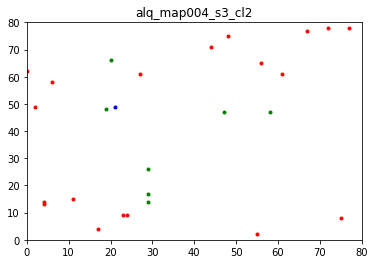

[70.4, 25.9, 3.7]


Currently mapping.... alq_map005.csv  -->  5
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  16
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  34.375 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  15.625 %
map saved!!


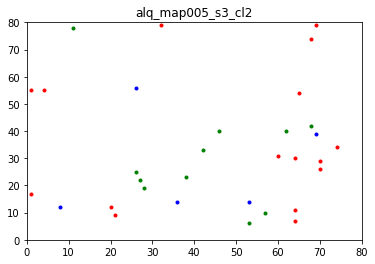

[50.0, 34.4, 15.6]


Currently mapping.... alq_map006.csv  -->  6
Total no. of points to label.... 14
Label Analysis:-
Total no. of labels:  14
Total no. of lab  1  =  7
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  35.714285714285715 %
Total no. of lab  3  =  2
Total percentage of lab  3  =  14.285714285714285 %
map saved!!


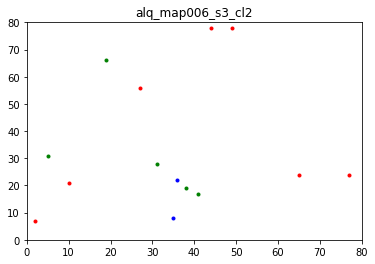

[50.0, 35.7, 14.3]


Currently mapping.... alq_map007.csv  -->  7
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  18
Total percentage of lab  1  =  58.06451612903226 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  32.25806451612903 %
Total no. of lab  3  =  3
Total percentage of lab  3  =  9.67741935483871 %
map saved!!


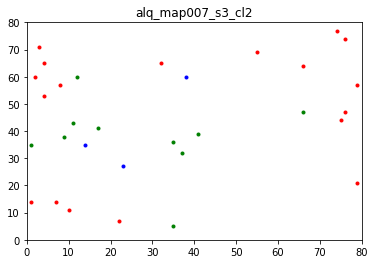

[58.1, 32.3, 9.7]


Currently mapping.... alq_map008.csv  -->  8
Total no. of points to label.... 39
Label Analysis:-
Total no. of labels:  39
Total no. of lab  1  =  19
Total percentage of lab  1  =  48.717948717948715 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  25.64102564102564 %
Total no. of lab  3  =  10
Total percentage of lab  3  =  25.64102564102564 %
map saved!!


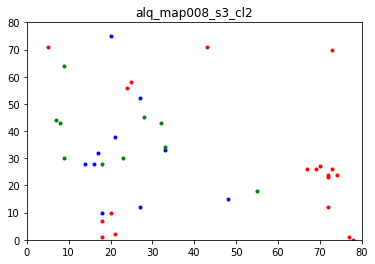

[48.7, 25.6, 25.6]


Currently mapping.... alq_map009.csv  -->  9
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  16
Total percentage of lab  1  =  39.02439024390244 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  56.09756097560976 %
Total no. of lab  3  =  2
Total percentage of lab  3  =  4.878048780487805 %
map saved!!


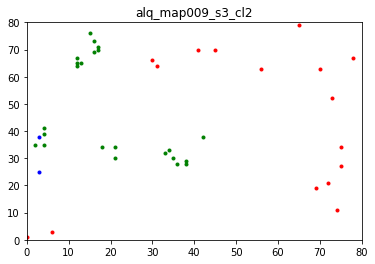

[39.0, 56.1, 4.9]


Currently mapping.... alq_map010.csv  -->  10
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  18
Total percentage of lab  1  =  58.06451612903226 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  41.935483870967744 %
map saved!!


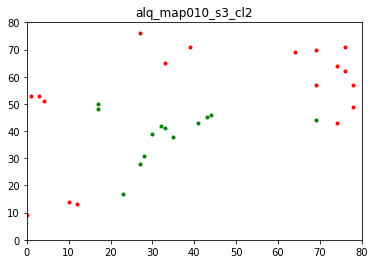

[58.1, 41.9]


Currently mapping.... alq_map011.csv  -->  11
Total no. of points to label.... 39
Label Analysis:-
Total no. of labels:  39
Total no. of lab  1  =  14
Total percentage of lab  1  =  35.8974358974359 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  41.02564102564102 %
Total no. of lab  3  =  9
Total percentage of lab  3  =  23.076923076923077 %
map saved!!


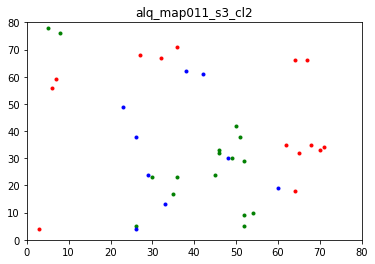

[35.9, 41.0, 23.1]


Currently mapping.... alq_map012.csv  -->  12
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  15
Total percentage of lab  1  =  34.883720930232556 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  44.18604651162791 %
Total no. of lab  3  =  9
Total percentage of lab  3  =  20.930232558139537 %
map saved!!


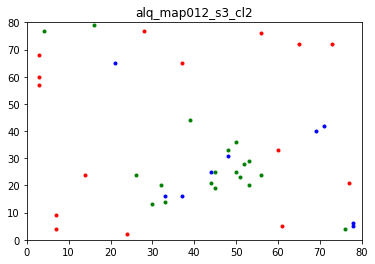

[34.9, 44.2, 20.9]


Currently mapping.... alq_map013.csv  -->  13
Total no. of points to label.... 29
Label Analysis:-
Total no. of labels:  29
Total no. of lab  1  =  21
Total percentage of lab  1  =  72.41379310344827 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  24.137931034482758 %
Total no. of lab  3  =  1
Total percentage of lab  3  =  3.4482758620689653 %
map saved!!


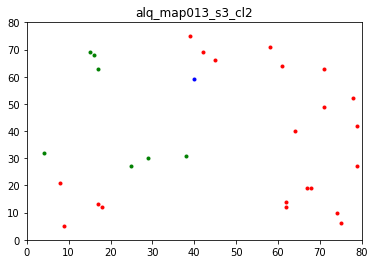

[72.4, 24.1, 3.4]


Currently mapping.... alq_map014.csv  -->  14
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  14
Total percentage of lab  1  =  38.88888888888889 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  44.44444444444444 %
Total no. of lab  3  =  6
Total percentage of lab  3  =  16.666666666666664 %
map saved!!


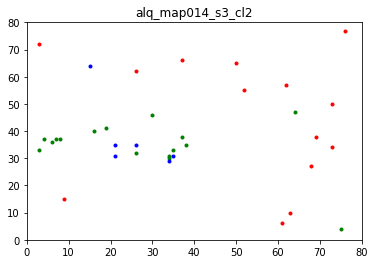

[38.9, 44.4, 16.7]


Currently mapping.... alq_map015.csv  -->  15
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  21
Total percentage of lab  1  =  35.0 %
Total no. of lab  2  =  27
Total percentage of lab  2  =  45.0 %
Total no. of lab  3  =  12
Total percentage of lab  3  =  20.0 %
map saved!!


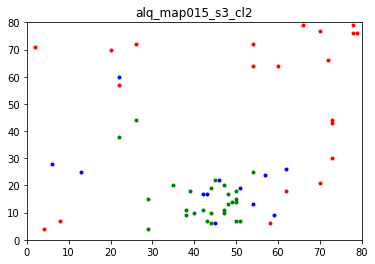

[35.0, 45.0, 20.0]


Currently mapping.... alq_map016.csv  -->  16
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  21
Total percentage of lab  1  =  56.75675675675676 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  32.432432432432435 %
Total no. of lab  3  =  4
Total percentage of lab  3  =  10.81081081081081 %
map saved!!


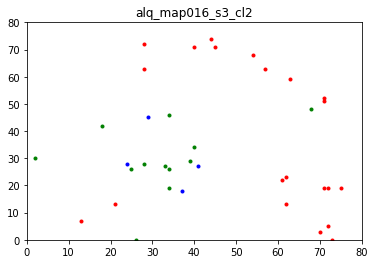

[56.8, 32.4, 10.8]


Currently mapping.... alq_map017.csv  -->  17
Total no. of points to label.... 26
Label Analysis:-
Total no. of labels:  26
Total no. of lab  1  =  8
Total percentage of lab  1  =  30.76923076923077 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  50.0 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  19.230769230769234 %
map saved!!


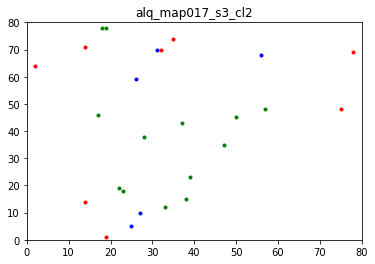

[30.8, 50.0, 19.2]


Currently mapping.... alq_map018.csv  -->  18
Total no. of points to label.... 51
Label Analysis:-
Total no. of labels:  51
Total no. of lab  1  =  14
Total percentage of lab  1  =  27.450980392156865 %
Total no. of lab  2  =  31
Total percentage of lab  2  =  60.78431372549019 %
Total no. of lab  3  =  6
Total percentage of lab  3  =  11.76470588235294 %
map saved!!


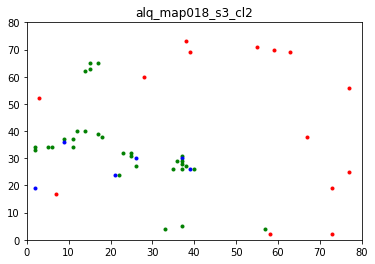

[27.5, 60.8, 11.8]


Currently mapping.... alq_map019.csv  -->  19
Total no. of points to label.... 17
Label Analysis:-
Total no. of labels:  17
Total no. of lab  1  =  7
Total percentage of lab  1  =  41.17647058823529 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  35.294117647058826 %
Total no. of lab  3  =  4
Total percentage of lab  3  =  23.52941176470588 %
map saved!!


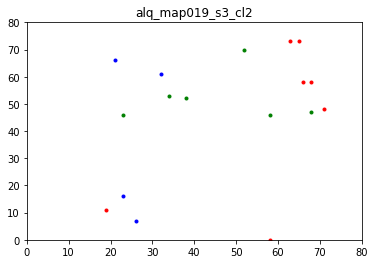

[41.2, 35.3, 23.5]


Currently mapping.... alq_map020.csv  -->  20
Total no. of points to label.... 33
Label Analysis:-
Total no. of labels:  33
Total no. of lab  1  =  18
Total percentage of lab  1  =  54.54545454545454 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  36.36363636363637 %
Total no. of lab  3  =  3
Total percentage of lab  3  =  9.090909090909092 %
map saved!!


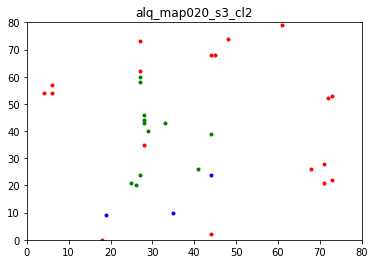

[54.5, 36.4, 9.1]


Currently mapping.... alq_map021.csv  -->  21
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  25
Total percentage of lab  1  =  60.97560975609756 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  39.02439024390244 %
map saved!!


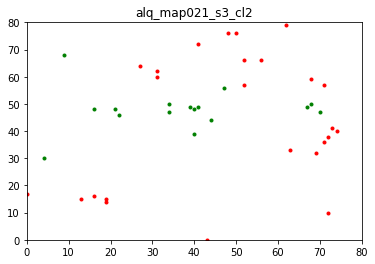

[61.0, 39.0]


Currently mapping.... alq_map022.csv  -->  22
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  21
Total percentage of lab  1  =  65.625 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  21.875 %
Total no. of lab  3  =  4
Total percentage of lab  3  =  12.5 %
map saved!!


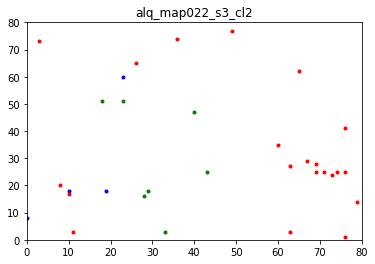

[65.6, 21.9, 12.5]


Currently mapping.... alq_map023.csv  -->  23
Total no. of points to label.... 28
Label Analysis:-
Total no. of labels:  28
Total no. of lab  1  =  14
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  25.0 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  25.0 %
map saved!!


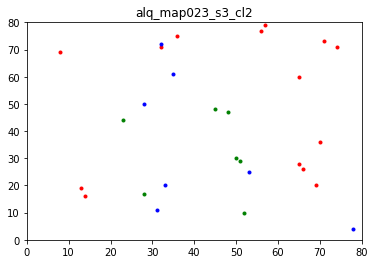

[50.0, 25.0, 25.0]


Currently mapping.... alq_map024.csv  -->  24
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  16
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  43.75 %
Total no. of lab  3  =  2
Total percentage of lab  3  =  6.25 %
map saved!!


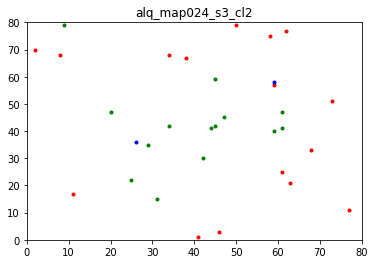

[50.0, 43.8, 6.2]


Currently mapping.... alq_map025.csv  -->  25
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  18
Total percentage of lab  1  =  41.86046511627907 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  30.23255813953488 %
Total no. of lab  3  =  12
Total percentage of lab  3  =  27.906976744186046 %
map saved!!


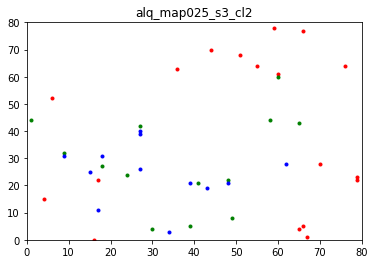

[41.9, 30.2, 27.9]


Currently mapping.... alq_map026.csv  -->  26
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  13
Total percentage of lab  1  =  40.625 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  53.125 %
Total no. of lab  3  =  2
Total percentage of lab  3  =  6.25 %
map saved!!


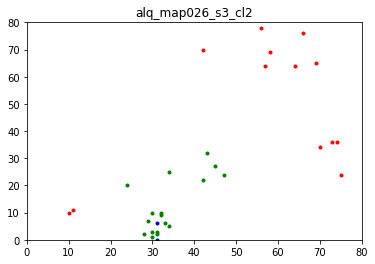

[40.6, 53.1, 6.2]


Currently mapping.... alq_map027.csv  -->  27
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  23
Total percentage of lab  1  =  63.888888888888886 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  25.0 %
Total no. of lab  3  =  4
Total percentage of lab  3  =  11.11111111111111 %
map saved!!


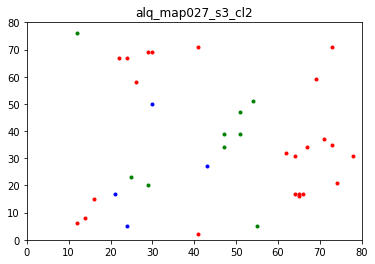

[63.9, 25.0, 11.1]


Currently mapping.... alq_map028.csv  -->  28
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  18
Total percentage of lab  1  =  34.61538461538461 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  40.38461538461539 %
Total no. of lab  3  =  13
Total percentage of lab  3  =  25.0 %
map saved!!


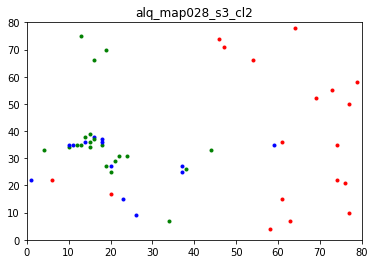

[34.6, 40.4, 25.0]


Currently mapping.... alq_map029.csv  -->  29
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  20
Total percentage of lab  1  =  46.51162790697674 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  37.2093023255814 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  16.27906976744186 %
map saved!!


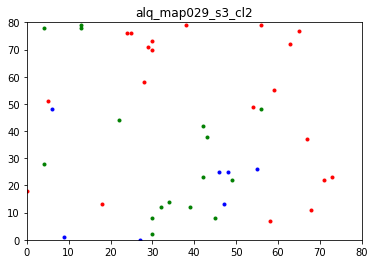

[46.5, 37.2, 16.3]


Currently mapping.... alq_map030.csv  -->  30
Total no. of points to label.... 54
Label Analysis:-
Total no. of labels:  54
Total no. of lab  1  =  15
Total percentage of lab  1  =  27.77777777777778 %
Total no. of lab  2  =  24
Total percentage of lab  2  =  44.44444444444444 %
Total no. of lab  3  =  15
Total percentage of lab  3  =  27.77777777777778 %
map saved!!


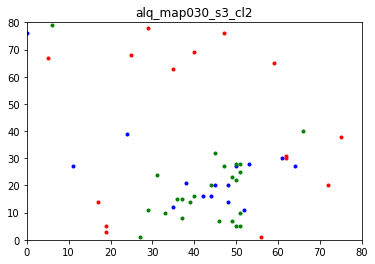

[27.8, 44.4, 27.8]


Currently mapping.... alq_map031.csv  -->  31
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  31
Total percentage of lab  1  =  75.60975609756098 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  9.75609756097561 %
Total no. of lab  3  =  6
Total percentage of lab  3  =  14.634146341463413 %
map saved!!


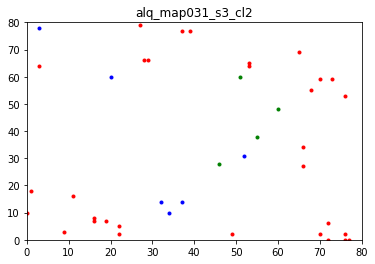

[75.6, 9.8, 14.6]


Currently mapping.... alq_map032.csv  -->  32
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  15
Total percentage of lab  1  =  25.0 %
Total no. of lab  2  =  35
Total percentage of lab  2  =  58.333333333333336 %
Total no. of lab  3  =  10
Total percentage of lab  3  =  16.666666666666664 %
map saved!!


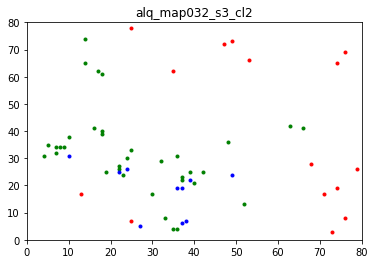

[25.0, 58.3, 16.7]


Currently mapping.... alq_map033.csv  -->  33
Total no. of points to label.... 84
Label Analysis:-
Total no. of labels:  84
Total no. of lab  1  =  21
Total percentage of lab  1  =  25.0 %
Total no. of lab  2  =  47
Total percentage of lab  2  =  55.952380952380956 %
Total no. of lab  3  =  16
Total percentage of lab  3  =  19.047619047619047 %
map saved!!


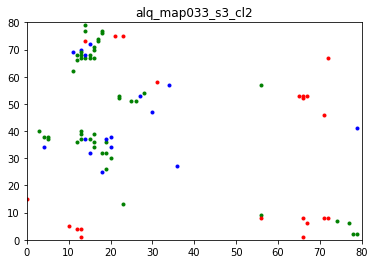

[25.0, 56.0, 19.0]


Currently mapping.... alq_map034.csv  -->  34
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  17
Total percentage of lab  1  =  32.69230769230769 %
Total no. of lab  2  =  26
Total percentage of lab  2  =  50.0 %
Total no. of lab  3  =  9
Total percentage of lab  3  =  17.307692307692307 %
map saved!!


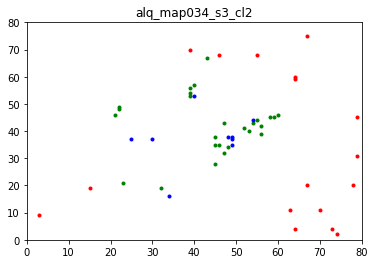

[32.7, 50.0, 17.3]


Currently mapping.... alq_map035.csv  -->  35
Total no. of points to label.... 64
Label Analysis:-
Total no. of labels:  64
Total no. of lab  1  =  29
Total percentage of lab  1  =  45.3125 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  32.8125 %
Total no. of lab  3  =  14
Total percentage of lab  3  =  21.875 %
map saved!!


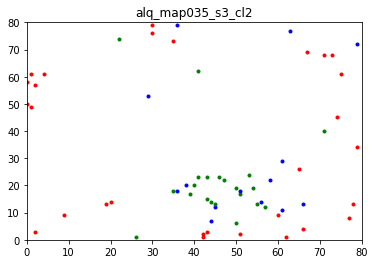

[45.3, 32.8, 21.9]


Currently mapping.... alq_map036.csv  -->  36
Total no. of points to label.... 69
Label Analysis:-
Total no. of labels:  69
Total no. of lab  1  =  14
Total percentage of lab  1  =  20.28985507246377 %
Total no. of lab  2  =  50
Total percentage of lab  2  =  72.46376811594203 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  7.246376811594203 %
map saved!!


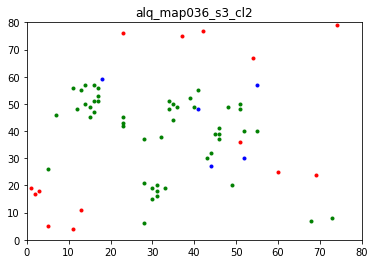

[20.3, 72.5, 7.2]


Currently mapping.... alq_map037.csv  -->  37
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  14
Total percentage of lab  1  =  38.88888888888889 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  55.55555555555556 %
Total no. of lab  3  =  2
Total percentage of lab  3  =  5.555555555555555 %
map saved!!


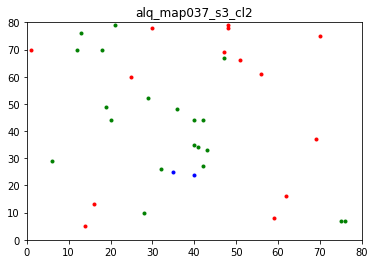

[38.9, 55.6, 5.6]


Currently mapping.... alq_map038.csv  -->  38
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  18
Total percentage of lab  1  =  41.86046511627907 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  53.48837209302325 %
Total no. of lab  3  =  2
Total percentage of lab  3  =  4.651162790697675 %
map saved!!


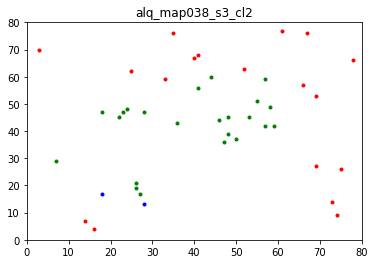

[41.9, 53.5, 4.7]


Currently mapping.... alq_map039.csv  -->  39
Total no. of points to label.... 46
Label Analysis:-
Total no. of labels:  46
Total no. of lab  1  =  20
Total percentage of lab  1  =  43.47826086956522 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  32.608695652173914 %
Total no. of lab  3  =  11
Total percentage of lab  3  =  23.91304347826087 %
map saved!!


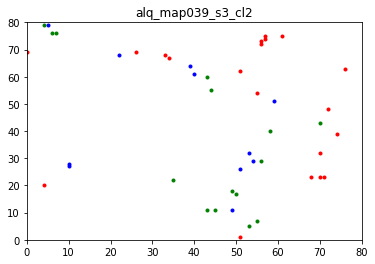

[43.5, 32.6, 23.9]


Currently mapping.... alq_map040.csv  -->  40
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  16
Total percentage of lab  1  =  51.61290322580645 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  35.483870967741936 %
Total no. of lab  3  =  4
Total percentage of lab  3  =  12.903225806451612 %
map saved!!


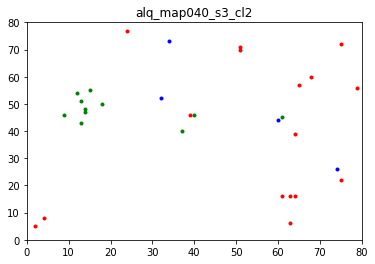

[51.6, 35.5, 12.9]


Currently mapping.... alq_map041.csv  -->  41
Total no. of points to label.... 34
Label Analysis:-
Total no. of labels:  34
Total no. of lab  1  =  14
Total percentage of lab  1  =  41.17647058823529 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  44.11764705882353 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  14.705882352941178 %
map saved!!


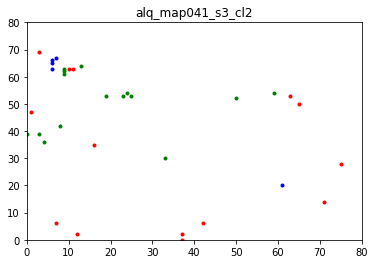

[41.2, 44.1, 14.7]


Currently mapping.... alq_map042.csv  -->  42
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  15
Total percentage of lab  1  =  39.473684210526315 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  55.26315789473685 %
Total no. of lab  3  =  2
Total percentage of lab  3  =  5.263157894736842 %
map saved!!


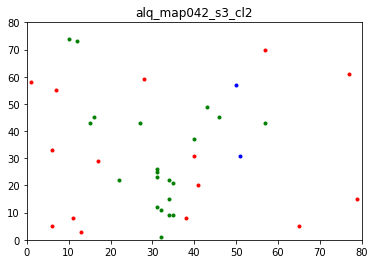

[39.5, 55.3, 5.3]


Currently mapping.... alq_map043.csv  -->  43
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  14
Total percentage of lab  1  =  51.85185185185185 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  29.629629629629626 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  18.51851851851852 %
map saved!!


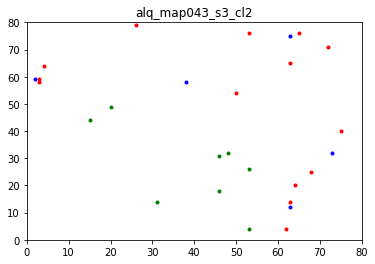

[51.9, 29.6, 18.5]


Currently mapping.... alq_map044.csv  -->  44
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  13
Total percentage of lab  1  =  31.70731707317073 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  43.90243902439025 %
Total no. of lab  3  =  10
Total percentage of lab  3  =  24.390243902439025 %
map saved!!


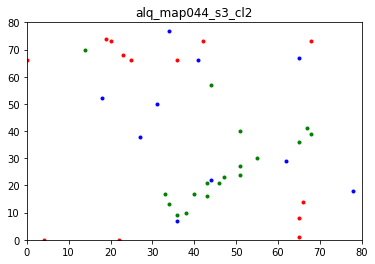

[31.7, 43.9, 24.4]


Currently mapping.... alq_map045.csv  -->  45
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  10
Total percentage of lab  1  =  24.390243902439025 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  48.78048780487805 %
Total no. of lab  3  =  11
Total percentage of lab  3  =  26.82926829268293 %
map saved!!


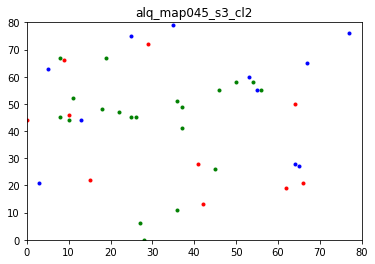

[24.4, 48.8, 26.8]


Currently mapping.... alq_map046.csv  -->  46
Total no. of points to label.... 26
Label Analysis:-
Total no. of labels:  26
Total no. of lab  1  =  14
Total percentage of lab  1  =  53.84615384615385 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  30.76923076923077 %
Total no. of lab  3  =  4
Total percentage of lab  3  =  15.384615384615385 %
map saved!!


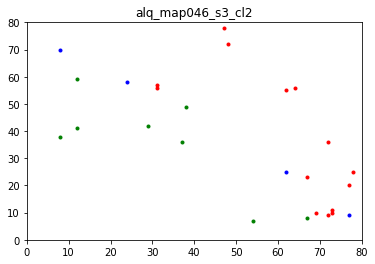

[53.8, 30.8, 15.4]


Currently mapping.... alq_map047.csv  -->  47
Total no. of points to label.... 24
Label Analysis:-
Total no. of labels:  24
Total no. of lab  1  =  12
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  33.33333333333333 %
Total no. of lab  3  =  4
Total percentage of lab  3  =  16.666666666666664 %
map saved!!


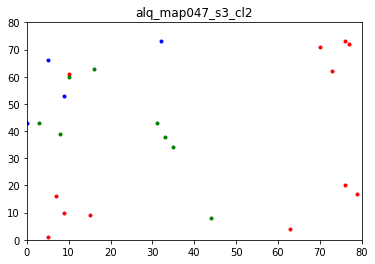

[50.0, 33.3, 16.7]


Currently mapping.... alq_map048.csv  -->  48
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  18
Total percentage of lab  1  =  45.0 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  35.0 %
Total no. of lab  3  =  8
Total percentage of lab  3  =  20.0 %
map saved!!


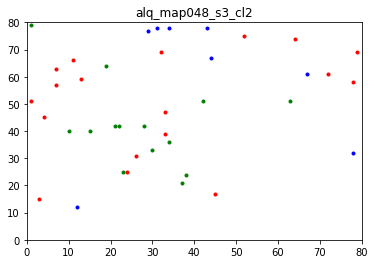

[45.0, 35.0, 20.0]


Currently mapping.... alq_map049.csv  -->  49
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  14
Total percentage of lab  1  =  36.84210526315789 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  60.526315789473685 %
Total no. of lab  3  =  1
Total percentage of lab  3  =  2.631578947368421 %
map saved!!


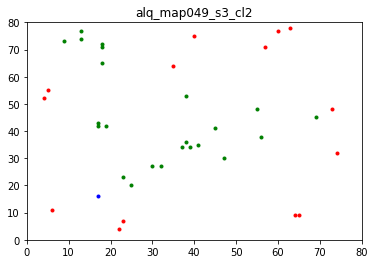

[36.8, 60.5, 2.6]


Currently mapping.... alq_map050.csv  -->  50
Total no. of points to label.... 125
Label Analysis:-
Total no. of labels:  125
Total no. of lab  1  =  17
Total percentage of lab  1  =  13.600000000000001 %
Total no. of lab  2  =  90
Total percentage of lab  2  =  72.0 %
Total no. of lab  3  =  18
Total percentage of lab  3  =  14.399999999999999 %
map saved!!


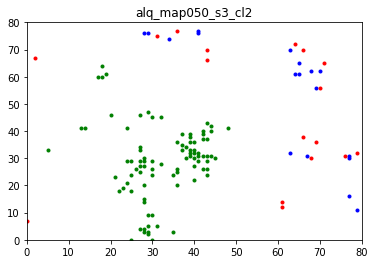

[13.6, 72.0, 14.4]


Currently mapping.... alq_map051.csv  -->  51
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  30
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  36.666666666666664 %
Total no. of lab  3  =  8
Total percentage of lab  3  =  13.333333333333334 %
map saved!!


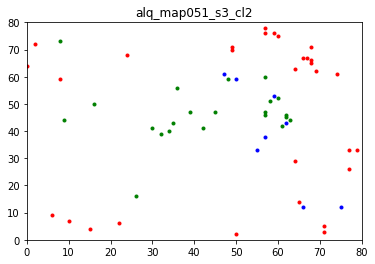

[50.0, 36.7, 13.3]


Currently mapping.... alq_map052.csv  -->  52
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  20
Total percentage of lab  1  =  38.46153846153847 %
Total no. of lab  2  =  31
Total percentage of lab  2  =  59.61538461538461 %
Total no. of lab  3  =  1
Total percentage of lab  3  =  1.9230769230769231 %
map saved!!


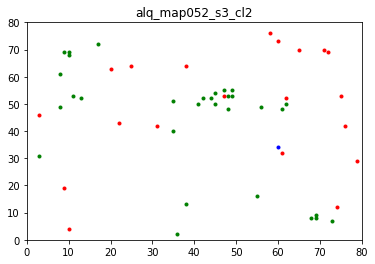

[38.5, 59.6, 1.9]


Currently mapping.... alq_map053.csv  -->  53
Total no. of points to label.... 51
Label Analysis:-
Total no. of labels:  51
Total no. of lab  1  =  17
Total percentage of lab  1  =  33.33333333333333 %
Total no. of lab  2  =  24
Total percentage of lab  2  =  47.05882352941176 %
Total no. of lab  3  =  10
Total percentage of lab  3  =  19.607843137254903 %
map saved!!


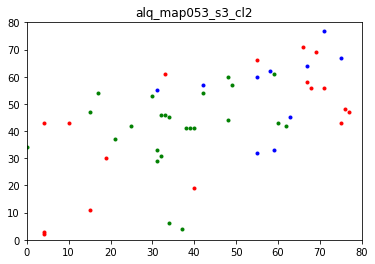

[33.3, 47.1, 19.6]


Currently mapping.... alq_map054.csv  -->  54
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  15
Total percentage of lab  1  =  41.66666666666667 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  44.44444444444444 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  13.88888888888889 %
map saved!!


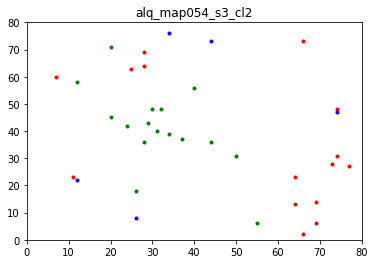

[41.7, 44.4, 13.9]


Currently mapping.... alq_map055.csv  -->  55
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  25
Total percentage of lab  1  =  33.33333333333333 %
Total no. of lab  2  =  41
Total percentage of lab  2  =  54.666666666666664 %
Total no. of lab  3  =  9
Total percentage of lab  3  =  12.0 %
map saved!!


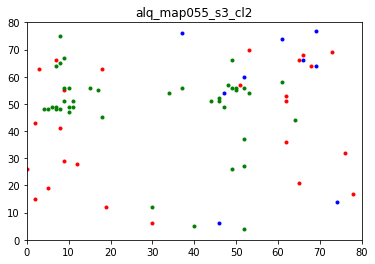

[33.3, 54.7, 12.0]


Currently mapping.... alq_map056.csv  -->  56
Total no. of points to label.... 19
Label Analysis:-
Total no. of labels:  19
Total no. of lab  1  =  10
Total percentage of lab  1  =  52.63157894736842 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  42.10526315789473 %
Total no. of lab  3  =  1
Total percentage of lab  3  =  5.263157894736842 %
map saved!!


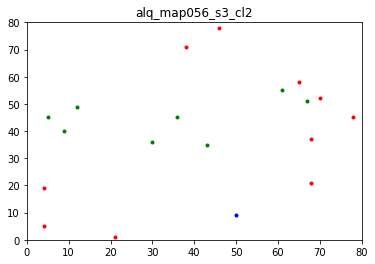

[52.6, 42.1, 5.3]


Currently mapping.... alq_map057.csv  -->  57
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  10
Total percentage of lab  1  =  27.027027027027028 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  54.054054054054056 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  18.91891891891892 %
map saved!!


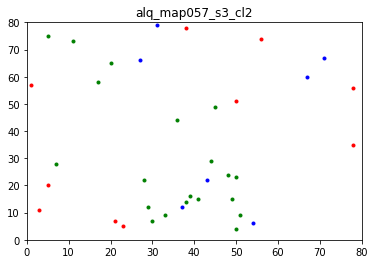

[27.0, 54.1, 18.9]


Currently mapping.... alq_map058.csv  -->  58
Total no. of points to label.... 44
Label Analysis:-
Total no. of labels:  44
Total no. of lab  1  =  23
Total percentage of lab  1  =  52.27272727272727 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  40.909090909090914 %
Total no. of lab  3  =  3
Total percentage of lab  3  =  6.8181818181818175 %
map saved!!


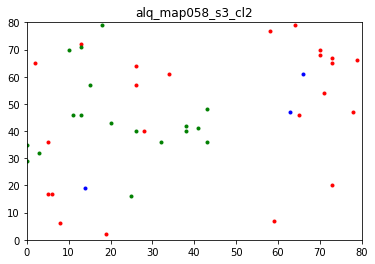

[52.3, 40.9, 6.8]


Currently mapping.... alq_map059.csv  -->  59
Total no. of points to label.... 33
Label Analysis:-
Total no. of labels:  33
Total no. of lab  1  =  17
Total percentage of lab  1  =  51.515151515151516 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  30.303030303030305 %
Total no. of lab  3  =  6
Total percentage of lab  3  =  18.181818181818183 %
map saved!!


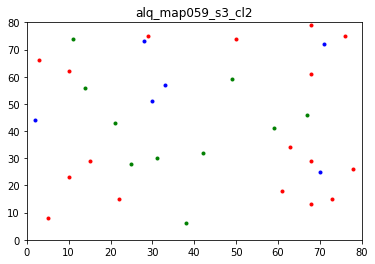

[51.5, 30.3, 18.2]


Currently mapping.... alq_map060.csv  -->  60
Total no. of points to label.... 62
Label Analysis:-
Total no. of labels:  62
Total no. of lab  1  =  33
Total percentage of lab  1  =  53.2258064516129 %
Total no. of lab  2  =  20
Total percentage of lab  2  =  32.25806451612903 %
Total no. of lab  3  =  9
Total percentage of lab  3  =  14.516129032258066 %
map saved!!


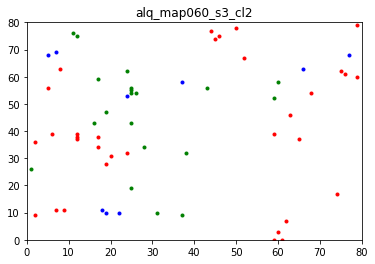

[53.2, 32.3, 14.5]


Currently mapping.... alq_map061.csv  -->  61
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  17
Total percentage of lab  1  =  41.46341463414634 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  31.70731707317073 %
Total no. of lab  3  =  11
Total percentage of lab  3  =  26.82926829268293 %
map saved!!


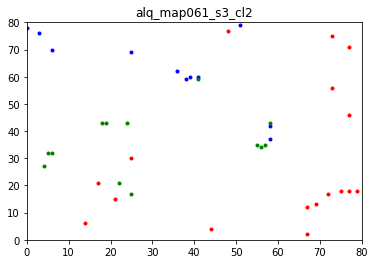

[41.5, 31.7, 26.8]


Currently mapping.... alq_map062.csv  -->  62
Total no. of points to label.... 24
Label Analysis:-
Total no. of labels:  24
Total no. of lab  1  =  8
Total percentage of lab  1  =  33.33333333333333 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  41.66666666666667 %
Total no. of lab  3  =  6
Total percentage of lab  3  =  25.0 %
map saved!!


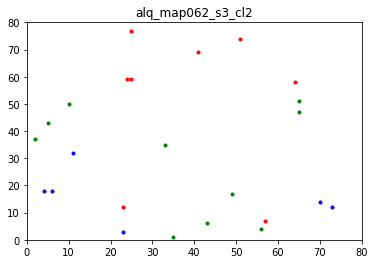

[33.3, 41.7, 25.0]


Currently mapping.... alq_map063.csv  -->  63
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  18
Total percentage of lab  1  =  41.86046511627907 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  32.55813953488372 %
Total no. of lab  3  =  11
Total percentage of lab  3  =  25.581395348837212 %
map saved!!


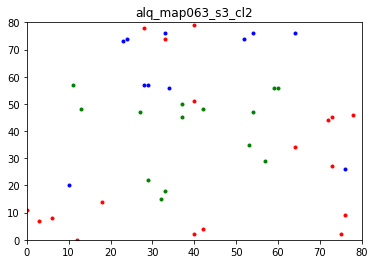

[41.9, 32.6, 25.6]


Currently mapping.... alq_map064.csv  -->  64
Total no. of points to label.... 50
Label Analysis:-
Total no. of labels:  50
Total no. of lab  1  =  20
Total percentage of lab  1  =  40.0 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  32.0 %
Total no. of lab  3  =  14
Total percentage of lab  3  =  28.000000000000004 %
map saved!!


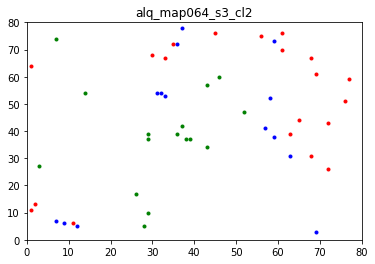

[40.0, 32.0, 28.0]


Currently mapping.... alq_map065.csv  -->  65
Total no. of points to label.... 44
Label Analysis:-
Total no. of labels:  44
Total no. of lab  1  =  28
Total percentage of lab  1  =  63.63636363636363 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  27.27272727272727 %
Total no. of lab  3  =  4
Total percentage of lab  3  =  9.090909090909092 %
map saved!!


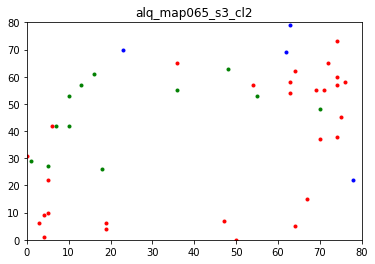

[63.6, 27.3, 9.1]


Currently mapping.... alq_map066.csv  -->  66
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  19
Total percentage of lab  1  =  31.147540983606557 %
Total no. of lab  2  =  33
Total percentage of lab  2  =  54.09836065573771 %
Total no. of lab  3  =  9
Total percentage of lab  3  =  14.754098360655737 %
map saved!!


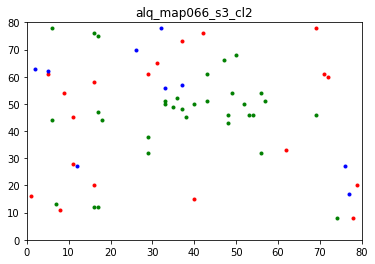

[31.1, 54.1, 14.8]


Currently mapping.... alq_map067.csv  -->  67
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  14
Total percentage of lab  1  =  38.88888888888889 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  44.44444444444444 %
Total no. of lab  3  =  6
Total percentage of lab  3  =  16.666666666666664 %
map saved!!


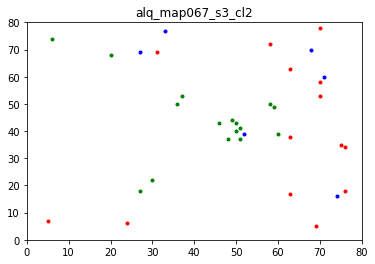

[38.9, 44.4, 16.7]


Currently mapping.... alq_map068.csv  -->  68
Total no. of points to label.... 45
Label Analysis:-
Total no. of labels:  45
Total no. of lab  1  =  23
Total percentage of lab  1  =  51.11111111111111 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  31.11111111111111 %
Total no. of lab  3  =  8
Total percentage of lab  3  =  17.77777777777778 %
map saved!!


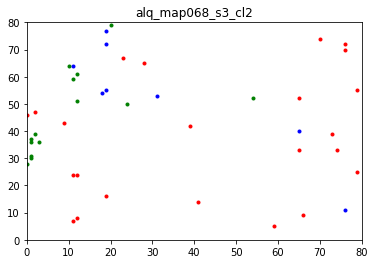

[51.1, 31.1, 17.8]


Currently mapping.... alq_map069.csv  -->  69
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  36
Total percentage of lab  1  =  69.23076923076923 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  15.384615384615385 %
Total no. of lab  3  =  8
Total percentage of lab  3  =  15.384615384615385 %
map saved!!


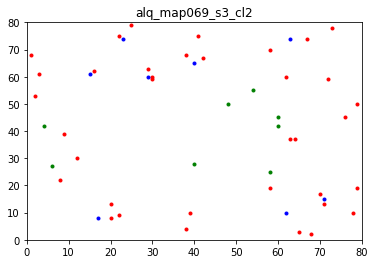

[69.2, 15.4, 15.4]


Currently mapping.... alq_map070.csv  -->  70
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  21
Total percentage of lab  1  =  35.0 %
Total no. of lab  2  =  31
Total percentage of lab  2  =  51.66666666666667 %
Total no. of lab  3  =  8
Total percentage of lab  3  =  13.333333333333334 %
map saved!!


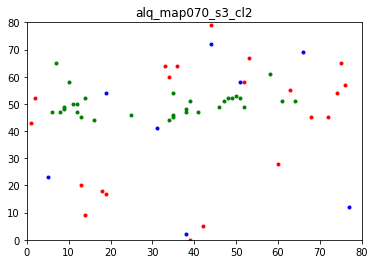

[35.0, 51.7, 13.3]


Currently mapping.... alq_map071.csv  -->  71
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  20
Total percentage of lab  1  =  38.46153846153847 %
Total no. of lab  2  =  24
Total percentage of lab  2  =  46.15384615384615 %
Total no. of lab  3  =  8
Total percentage of lab  3  =  15.384615384615385 %
map saved!!


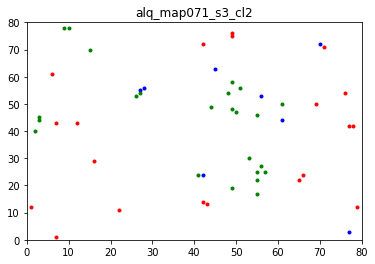

[38.5, 46.2, 15.4]


Currently mapping.... alq_map072.csv  -->  72
Total no. of points to label.... 62
Label Analysis:-
Total no. of labels:  62
Total no. of lab  1  =  19
Total percentage of lab  1  =  30.64516129032258 %
Total no. of lab  2  =  40
Total percentage of lab  2  =  64.51612903225806 %
Total no. of lab  3  =  3
Total percentage of lab  3  =  4.838709677419355 %
map saved!!


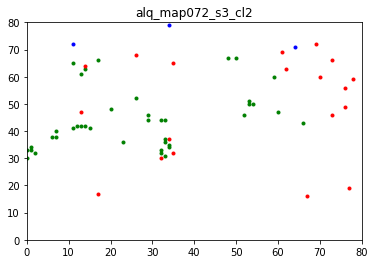

[30.6, 64.5, 4.8]


Currently mapping.... alq_map073.csv  -->  73
Total no. of points to label.... 85
Label Analysis:-
Total no. of labels:  85
Total no. of lab  1  =  24
Total percentage of lab  1  =  28.235294117647058 %
Total no. of lab  2  =  46
Total percentage of lab  2  =  54.11764705882353 %
Total no. of lab  3  =  15
Total percentage of lab  3  =  17.647058823529413 %
map saved!!


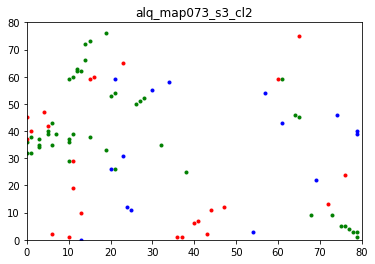

[28.2, 54.1, 17.6]


Currently mapping.... alq_map074.csv  -->  74
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  26
Total percentage of lab  1  =  44.827586206896555 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  31.03448275862069 %
Total no. of lab  3  =  14
Total percentage of lab  3  =  24.137931034482758 %
map saved!!


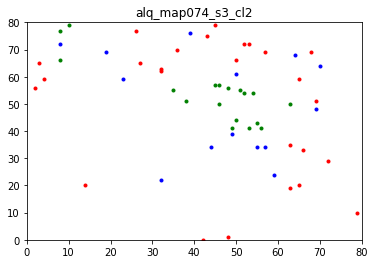

[44.8, 31.0, 24.1]


Currently mapping.... alq_map075.csv  -->  75
Total no. of points to label.... 59
Label Analysis:-
Total no. of labels:  59
Total no. of lab  1  =  26
Total percentage of lab  1  =  44.06779661016949 %
Total no. of lab  2  =  28
Total percentage of lab  2  =  47.45762711864407 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  8.47457627118644 %
map saved!!


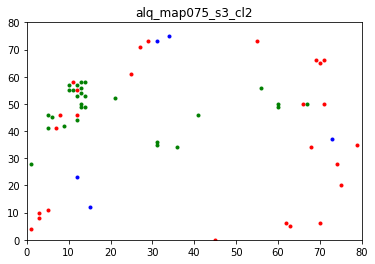

[44.1, 47.5, 8.5]


Currently mapping.... alq_map076.csv  -->  76
Total no. of points to label.... 72
Label Analysis:-
Total no. of labels:  72
Total no. of lab  1  =  15
Total percentage of lab  1  =  20.833333333333336 %
Total no. of lab  2  =  53
Total percentage of lab  2  =  73.61111111111111 %
Total no. of lab  3  =  4
Total percentage of lab  3  =  5.555555555555555 %
map saved!!


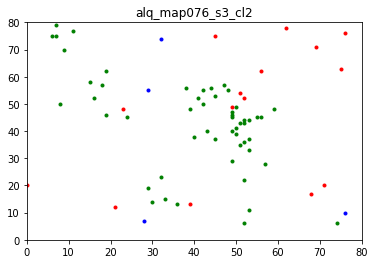

[20.8, 73.6, 5.6]


Currently mapping.... alq_map077.csv  -->  77
Total no. of points to label.... 42
Label Analysis:-
Total no. of labels:  42
Total no. of lab  1  =  26
Total percentage of lab  1  =  61.904761904761905 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  16.666666666666664 %
Total no. of lab  3  =  9
Total percentage of lab  3  =  21.428571428571427 %
map saved!!


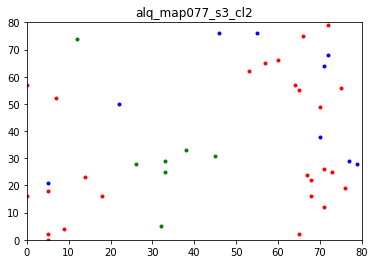

[61.9, 16.7, 21.4]


Currently mapping.... alq_map078.csv  -->  78
Total no. of points to label.... 63
Label Analysis:-
Total no. of labels:  63
Total no. of lab  1  =  19
Total percentage of lab  1  =  30.158730158730158 %
Total no. of lab  2  =  26
Total percentage of lab  2  =  41.269841269841265 %
Total no. of lab  3  =  18
Total percentage of lab  3  =  28.57142857142857 %
map saved!!


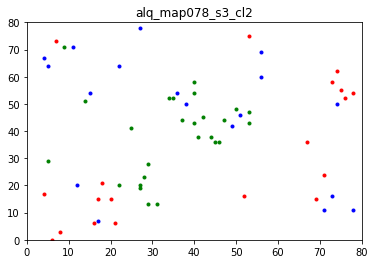

[30.2, 41.3, 28.6]


Currently mapping.... alq_map079.csv  -->  79
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  13
Total percentage of lab  1  =  32.5 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  32.5 %
Total no. of lab  3  =  14
Total percentage of lab  3  =  35.0 %
map saved!!


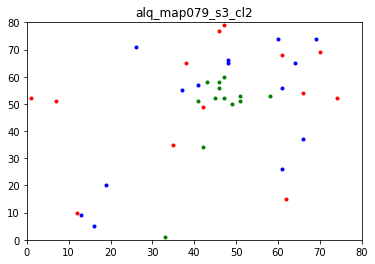

[32.5, 32.5, 35.0]


Currently mapping.... alq_map080.csv  -->  80
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  23
Total percentage of lab  1  =  63.888888888888886 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  22.22222222222222 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  13.88888888888889 %
map saved!!


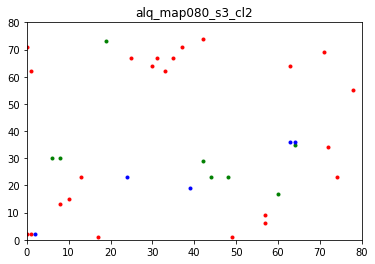

[63.9, 22.2, 13.9]


Currently mapping.... alq_map081.csv  -->  81
Total no. of points to label.... 77
Label Analysis:-
Total no. of labels:  77
Total no. of lab  1  =  26
Total percentage of lab  1  =  33.76623376623377 %
Total no. of lab  2  =  24
Total percentage of lab  2  =  31.16883116883117 %
Total no. of lab  3  =  27
Total percentage of lab  3  =  35.064935064935064 %
map saved!!


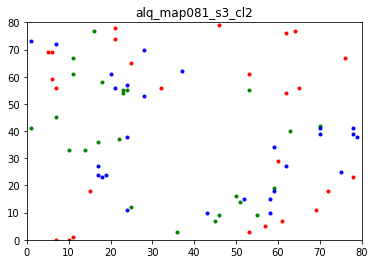

[33.8, 31.2, 35.1]


Currently mapping.... alq_map082.csv  -->  82
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  17
Total percentage of lab  1  =  47.22222222222222 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  36.11111111111111 %
Total no. of lab  3  =  6
Total percentage of lab  3  =  16.666666666666664 %
map saved!!


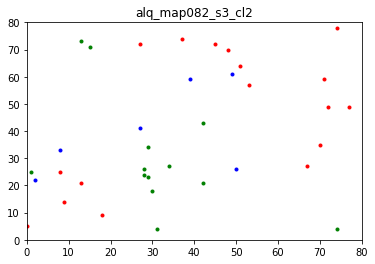

[47.2, 36.1, 16.7]


Currently mapping.... alq_map083.csv  -->  83
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  16
Total percentage of lab  1  =  37.2093023255814 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  51.162790697674424 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  11.627906976744185 %
map saved!!


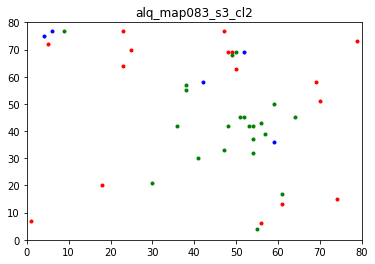

[37.2, 51.2, 11.6]


Currently mapping.... alq_map084.csv  -->  84
Total no. of points to label.... 49
Label Analysis:-
Total no. of labels:  49
Total no. of lab  1  =  22
Total percentage of lab  1  =  44.89795918367347 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  32.6530612244898 %
Total no. of lab  3  =  11
Total percentage of lab  3  =  22.448979591836736 %
map saved!!


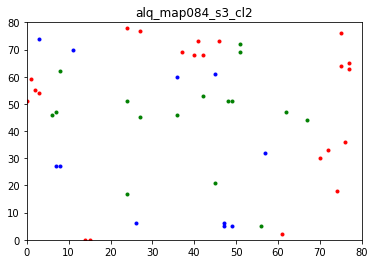

[44.9, 32.7, 22.4]


Currently mapping.... alq_map085.csv  -->  85
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  24
Total percentage of lab  1  =  41.37931034482759 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  18.96551724137931 %
Total no. of lab  3  =  23
Total percentage of lab  3  =  39.6551724137931 %
map saved!!


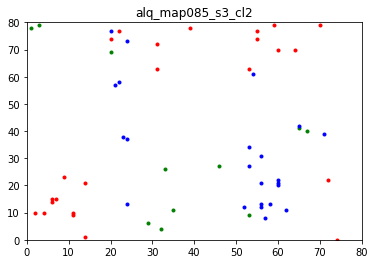

[41.4, 19.0, 39.7]


Currently mapping.... alq_map086.csv  -->  86
Total no. of points to label.... 74
Label Analysis:-
Total no. of labels:  74
Total no. of lab  1  =  34
Total percentage of lab  1  =  45.94594594594595 %
Total no. of lab  2  =  29
Total percentage of lab  2  =  39.189189189189186 %
Total no. of lab  3  =  11
Total percentage of lab  3  =  14.864864864864865 %
map saved!!


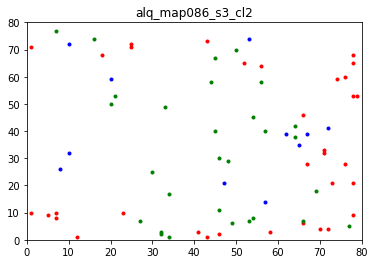

[45.9, 39.2, 14.9]


Currently mapping.... alq_map087.csv  -->  87
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  16
Total percentage of lab  1  =  37.2093023255814 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  39.53488372093023 %
Total no. of lab  3  =  10
Total percentage of lab  3  =  23.25581395348837 %
map saved!!


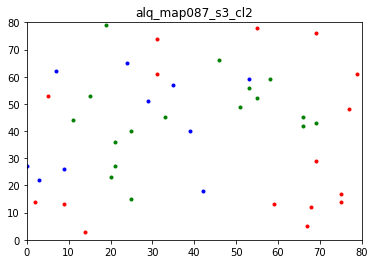

[37.2, 39.5, 23.3]


Currently mapping.... alq_map088.csv  -->  88
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  31
Total percentage of lab  1  =  41.333333333333336 %
Total no. of lab  2  =  29
Total percentage of lab  2  =  38.666666666666664 %
Total no. of lab  3  =  15
Total percentage of lab  3  =  20.0 %
map saved!!


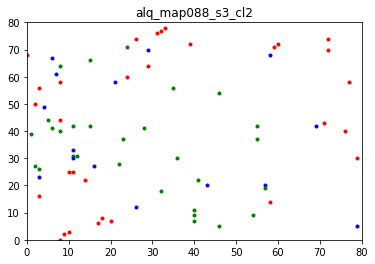

[41.3, 38.7, 20.0]


Currently mapping.... alq_map089.csv  -->  89
Total no. of points to label.... 68
Label Analysis:-
Total no. of labels:  68
Total no. of lab  1  =  29
Total percentage of lab  1  =  42.64705882352941 %
Total no. of lab  2  =  26
Total percentage of lab  2  =  38.23529411764706 %
Total no. of lab  3  =  13
Total percentage of lab  3  =  19.11764705882353 %
map saved!!


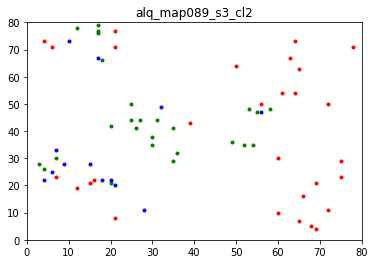

[42.6, 38.2, 19.1]


Currently mapping.... alq_map090.csv  -->  90
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  27
Total percentage of lab  1  =  32.926829268292686 %
Total no. of lab  2  =  44
Total percentage of lab  2  =  53.65853658536586 %
Total no. of lab  3  =  11
Total percentage of lab  3  =  13.414634146341465 %
map saved!!


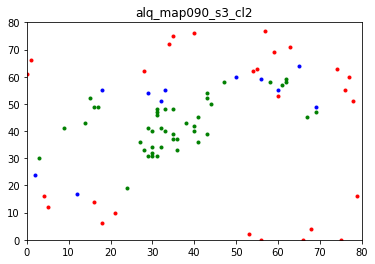

[32.9, 53.7, 13.4]


Currently mapping.... alq_map091.csv  -->  91
Total no. of points to label.... 65
Label Analysis:-
Total no. of labels:  65
Total no. of lab  1  =  27
Total percentage of lab  1  =  41.53846153846154 %
Total no. of lab  2  =  28
Total percentage of lab  2  =  43.07692307692308 %
Total no. of lab  3  =  10
Total percentage of lab  3  =  15.384615384615385 %
map saved!!


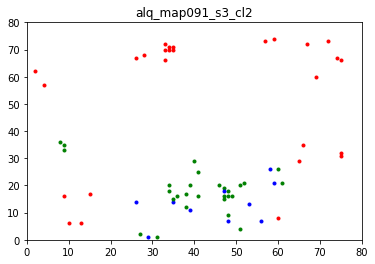

[41.5, 43.1, 15.4]


Currently mapping.... alq_map092.csv  -->  92
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  32
Total percentage of lab  1  =  55.172413793103445 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  32.758620689655174 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  12.068965517241379 %
map saved!!


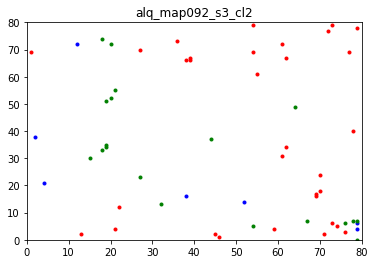

[55.2, 32.8, 12.1]


Currently mapping.... alq_map093.csv  -->  93
Total no. of points to label.... 46
Label Analysis:-
Total no. of labels:  46
Total no. of lab  1  =  34
Total percentage of lab  1  =  73.91304347826086 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  8.695652173913043 %
Total no. of lab  3  =  8
Total percentage of lab  3  =  17.391304347826086 %
map saved!!


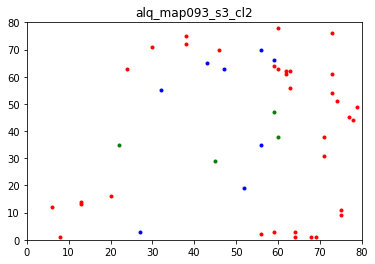

[73.9, 8.7, 17.4]


Currently mapping.... alq_map094.csv  -->  94
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  39
Total percentage of lab  1  =  63.934426229508205 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  24.59016393442623 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  11.475409836065573 %
map saved!!


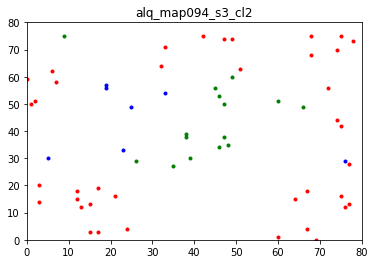

[63.9, 24.6, 11.5]


Currently mapping.... alq_map095.csv  -->  95
Total no. of points to label.... 84
Label Analysis:-
Total no. of labels:  84
Total no. of lab  1  =  21
Total percentage of lab  1  =  25.0 %
Total no. of lab  2  =  35
Total percentage of lab  2  =  41.66666666666667 %
Total no. of lab  3  =  28
Total percentage of lab  3  =  33.33333333333333 %
map saved!!


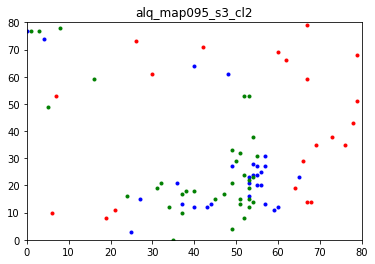

[25.0, 41.7, 33.3]


Currently mapping.... alq_map096.csv  -->  96
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  17
Total percentage of lab  1  =  44.73684210526316 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  31.57894736842105 %
Total no. of lab  3  =  9
Total percentage of lab  3  =  23.684210526315788 %
map saved!!


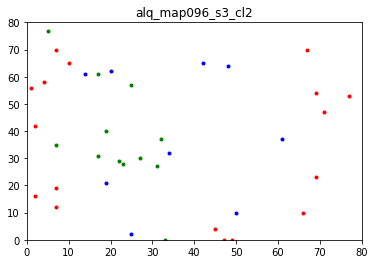

[44.7, 31.6, 23.7]


Currently mapping.... alq_map097.csv  -->  97
Total no. of points to label.... 47
Label Analysis:-
Total no. of labels:  47
Total no. of lab  1  =  21
Total percentage of lab  1  =  44.680851063829785 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  40.42553191489361 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  14.893617021276595 %
map saved!!


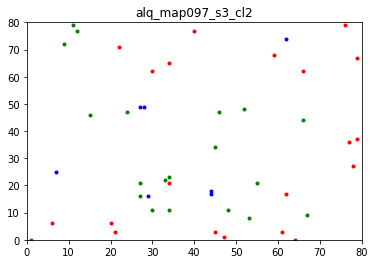

[44.7, 40.4, 14.9]


Currently mapping.... alq_map098.csv  -->  98
Total no. of points to label.... 88
Label Analysis:-
Total no. of labels:  88
Total no. of lab  1  =  50
Total percentage of lab  1  =  56.81818181818182 %
Total no. of lab  2  =  29
Total percentage of lab  2  =  32.95454545454545 %
Total no. of lab  3  =  9
Total percentage of lab  3  =  10.227272727272728 %
map saved!!


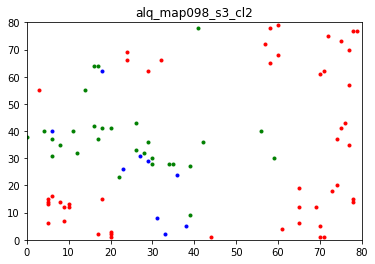

[56.8, 33.0, 10.2]


Currently mapping.... alq_map099.csv  -->  99
Total no. of points to label.... 64
Label Analysis:-
Total no. of labels:  64
Total no. of lab  1  =  26
Total percentage of lab  1  =  40.625 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  21.875 %
Total no. of lab  3  =  24
Total percentage of lab  3  =  37.5 %
map saved!!


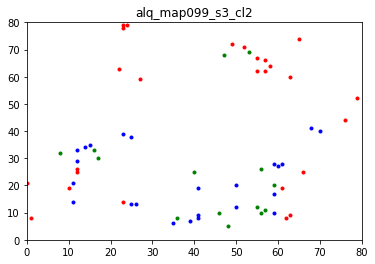

[40.6, 21.9, 37.5]


Currently mapping.... alq_map100.csv  -->  100
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  23
Total percentage of lab  1  =  44.230769230769226 %
Total no. of lab  2  =  25
Total percentage of lab  2  =  48.07692307692308 %
Total no. of lab  3  =  4
Total percentage of lab  3  =  7.6923076923076925 %
map saved!!


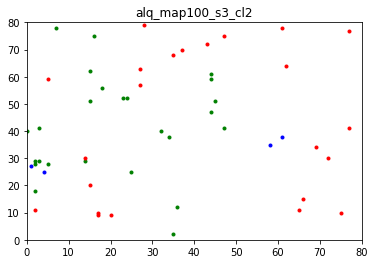

[44.2, 48.1, 7.7]


Currently mapping.... alq_map101.csv  -->  101
Total no. of points to label.... 69
Label Analysis:-
Total no. of labels:  69
Total no. of lab  1  =  43
Total percentage of lab  1  =  62.31884057971014 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  21.73913043478261 %
Total no. of lab  3  =  11
Total percentage of lab  3  =  15.942028985507244 %
map saved!!


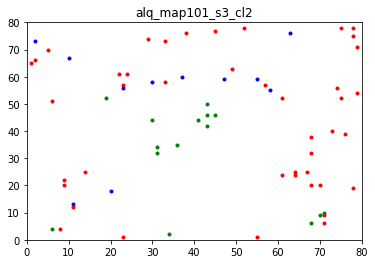

[62.3, 21.7, 15.9]


Currently mapping.... alq_map102.csv  -->  102
Total no. of points to label.... 71
Label Analysis:-
Total no. of labels:  71
Total no. of lab  1  =  45
Total percentage of lab  1  =  63.38028169014085 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  7.042253521126761 %
Total no. of lab  3  =  21
Total percentage of lab  3  =  29.577464788732392 %
map saved!!


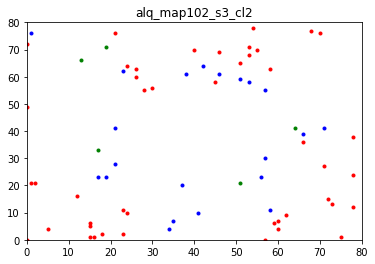

[63.4, 7.0, 29.6]


Currently mapping.... alq_map103.csv  -->  103
Total no. of points to label.... 42
Label Analysis:-
Total no. of labels:  42
Total no. of lab  1  =  18
Total percentage of lab  1  =  42.857142857142854 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  42.857142857142854 %
Total no. of lab  3  =  6
Total percentage of lab  3  =  14.285714285714285 %
map saved!!


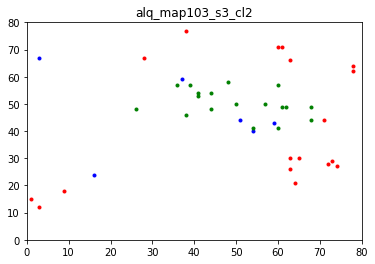

[42.9, 42.9, 14.3]


Currently mapping.... alq_map104.csv  -->  104
Total no. of points to label.... 68
Label Analysis:-
Total no. of labels:  68
Total no. of lab  1  =  40
Total percentage of lab  1  =  58.82352941176471 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  14.705882352941178 %
Total no. of lab  3  =  18
Total percentage of lab  3  =  26.47058823529412 %
map saved!!


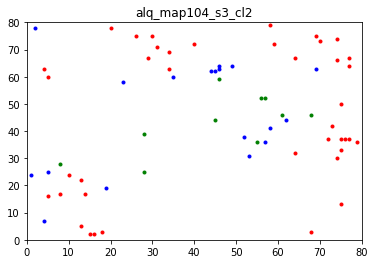

[58.8, 14.7, 26.5]


Currently mapping.... alq_map105.csv  -->  105
Total no. of points to label.... 59
Label Analysis:-
Total no. of labels:  59
Total no. of lab  1  =  27
Total percentage of lab  1  =  45.76271186440678 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  10.16949152542373 %
Total no. of lab  3  =  26
Total percentage of lab  3  =  44.06779661016949 %
map saved!!


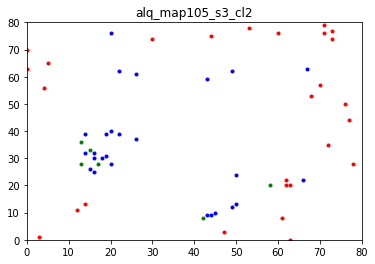

[45.8, 10.2, 44.1]


Currently mapping.... alq_map106.csv  -->  106
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  34
Total percentage of lab  1  =  55.73770491803278 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  21.311475409836063 %
Total no. of lab  3  =  14
Total percentage of lab  3  =  22.950819672131146 %
map saved!!


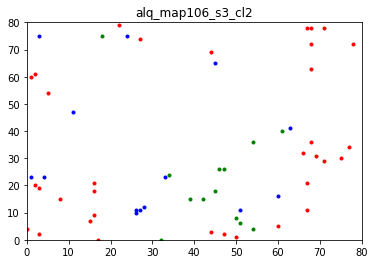

[55.7, 21.3, 23.0]


Currently mapping.... alq_map107.csv  -->  107
Total no. of points to label.... 55
Label Analysis:-
Total no. of labels:  55
Total no. of lab  1  =  31
Total percentage of lab  1  =  56.36363636363636 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  21.818181818181817 %
Total no. of lab  3  =  12
Total percentage of lab  3  =  21.818181818181817 %
map saved!!


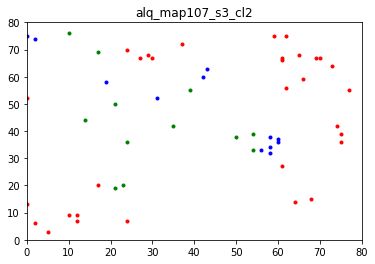

[56.4, 21.8, 21.8]


Currently mapping.... alq_map108.csv  -->  108
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  44
Total percentage of lab  1  =  53.65853658536586 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  17.073170731707318 %
Total no. of lab  3  =  24
Total percentage of lab  3  =  29.268292682926827 %
map saved!!


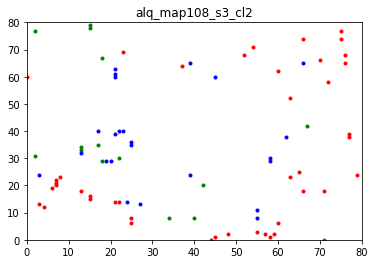

[53.7, 17.1, 29.3]


Currently mapping.... alq_map109.csv  -->  109
Total no. of points to label.... 95
Label Analysis:-
Total no. of labels:  95
Total no. of lab  1  =  41
Total percentage of lab  1  =  43.15789473684211 %
Total no. of lab  2  =  30
Total percentage of lab  2  =  31.57894736842105 %
Total no. of lab  3  =  24
Total percentage of lab  3  =  25.263157894736842 %
map saved!!


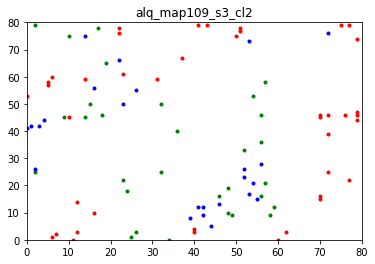

[43.2, 31.6, 25.3]


Currently mapping.... alq_map110.csv  -->  110
Total no. of points to label.... 77
Label Analysis:-
Total no. of labels:  77
Total no. of lab  1  =  32
Total percentage of lab  1  =  41.55844155844156 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  23.376623376623375 %
Total no. of lab  3  =  27
Total percentage of lab  3  =  35.064935064935064 %
map saved!!


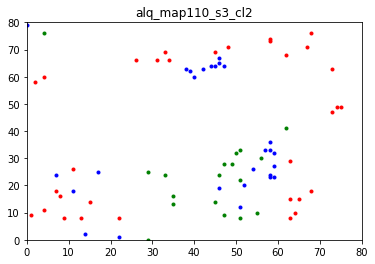

[41.6, 23.4, 35.1]


Currently mapping.... alq_map111.csv  -->  111
Total no. of points to label.... 141
Label Analysis:-
Total no. of labels:  141
Total no. of lab  1  =  37
Total percentage of lab  1  =  26.24113475177305 %
Total no. of lab  2  =  49
Total percentage of lab  2  =  34.751773049645394 %
Total no. of lab  3  =  55
Total percentage of lab  3  =  39.00709219858156 %
map saved!!


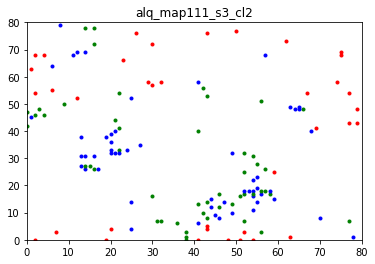

[26.2, 34.8, 39.0]


Currently mapping.... alq_map112.csv  -->  112
Total no. of points to label.... 96
Label Analysis:-
Total no. of labels:  96
Total no. of lab  1  =  57
Total percentage of lab  1  =  59.375 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  19.791666666666664 %
Total no. of lab  3  =  20
Total percentage of lab  3  =  20.833333333333336 %
map saved!!


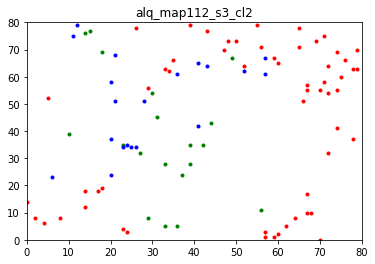

[59.4, 19.8, 20.8]


Currently mapping.... alq_map113.csv  -->  113
Total no. of points to label.... 76
Label Analysis:-
Total no. of labels:  76
Total no. of lab  1  =  41
Total percentage of lab  1  =  53.94736842105263 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  21.052631578947366 %
Total no. of lab  3  =  19
Total percentage of lab  3  =  25.0 %
map saved!!


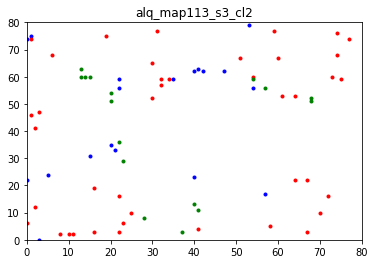

[53.9, 21.1, 25.0]


Currently mapping.... alq_map114.csv  -->  114
Total no. of points to label.... 71
Label Analysis:-
Total no. of labels:  71
Total no. of lab  1  =  43
Total percentage of lab  1  =  60.56338028169014 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  26.76056338028169 %
Total no. of lab  3  =  9
Total percentage of lab  3  =  12.676056338028168 %
map saved!!


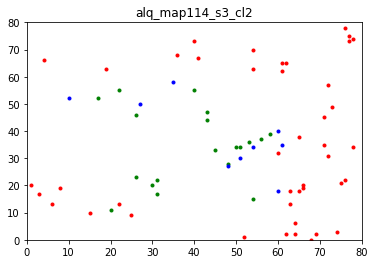

[60.6, 26.8, 12.7]


Currently mapping.... alq_map115.csv  -->  115
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  26
Total percentage of lab  1  =  31.70731707317073 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  14.634146341463413 %
Total no. of lab  3  =  44
Total percentage of lab  3  =  53.65853658536586 %
map saved!!


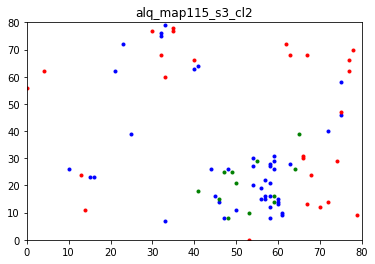

[31.7, 14.6, 53.7]


Currently mapping.... alq_map116.csv  -->  116
Total no. of points to label.... 112
Label Analysis:-
Total no. of labels:  112
Total no. of lab  1  =  40
Total percentage of lab  1  =  35.714285714285715 %
Total no. of lab  2  =  62
Total percentage of lab  2  =  55.35714285714286 %
Total no. of lab  3  =  10
Total percentage of lab  3  =  8.928571428571429 %
map saved!!


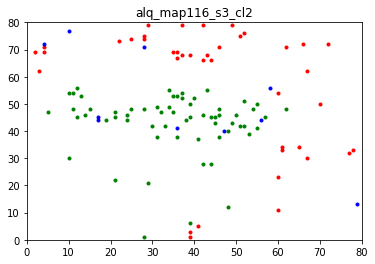

[35.7, 55.4, 8.9]


Currently mapping.... alq_map117.csv  -->  117
Total no. of points to label.... 93
Label Analysis:-
Total no. of labels:  93
Total no. of lab  1  =  37
Total percentage of lab  1  =  39.784946236559136 %
Total no. of lab  2  =  25
Total percentage of lab  2  =  26.881720430107524 %
Total no. of lab  3  =  31
Total percentage of lab  3  =  33.33333333333333 %
map saved!!


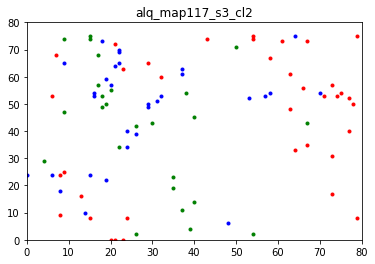

[39.8, 26.9, 33.3]


Currently mapping.... alq_map118.csv  -->  118
Total no. of points to label.... 108
Label Analysis:-
Total no. of labels:  108
Total no. of lab  1  =  64
Total percentage of lab  1  =  59.25925925925925 %
Total no. of lab  2  =  30
Total percentage of lab  2  =  27.77777777777778 %
Total no. of lab  3  =  14
Total percentage of lab  3  =  12.962962962962962 %
map saved!!


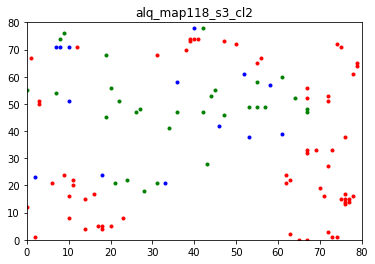

[59.3, 27.8, 13.0]


Currently mapping.... alq_map119.csv  -->  119
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  31
Total percentage of lab  1  =  41.333333333333336 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  12.0 %
Total no. of lab  3  =  35
Total percentage of lab  3  =  46.666666666666664 %
map saved!!


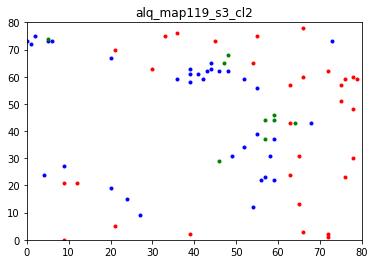

[41.3, 12.0, 46.7]




In [65]:
alq_s3 = pseudo_classifier_label(num_npy, s3_remap['al_s3l'], tr_map['aln_re_id.csv'], alq_map, 
                                 80, "_s3_cl2", "results", True)

Currently mapping.... alq_map000.csv  -->  0
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  16
Total percentage of lab  1  =  43.24324324324324 %
Total no. of lab  2  =  3
Total percentage of lab  2  =  8.108108108108109 %
Total no. of lab  3  =  13
Total percentage of lab  3  =  35.13513513513514 %
Total no. of lab  4  =  5
Total percentage of lab  4  =  13.513513513513514 %
map saved!!


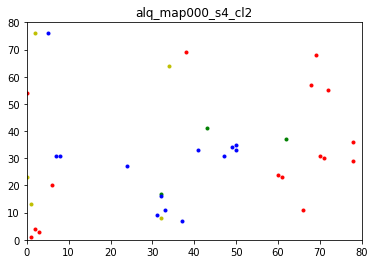

[43.2, 8.1, 35.1, 13.5]


Currently mapping.... alq_map001.csv  -->  1
Total no. of points to label.... 30
Label Analysis:-
Total no. of labels:  30
Total no. of lab  1  =  16
Total percentage of lab  1  =  53.333333333333336 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  16.666666666666664 %
Total no. of lab  3  =  8
Total percentage of lab  3  =  26.666666666666668 %
Total no. of lab  4  =  1
Total percentage of lab  4  =  3.3333333333333335 %
map saved!!


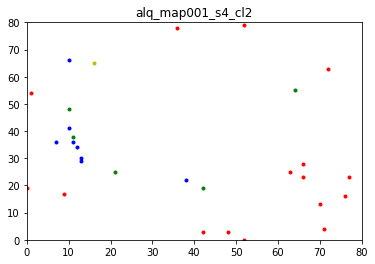

[53.3, 16.7, 26.7, 3.3]


Currently mapping.... alq_map002.csv  -->  2
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  12
Total percentage of lab  1  =  44.44444444444444 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  14.814814814814813 %
Total no. of lab  3  =  9
Total percentage of lab  3  =  33.33333333333333 %
Total no. of lab  4  =  2
Total percentage of lab  4  =  7.4074074074074066 %
map saved!!


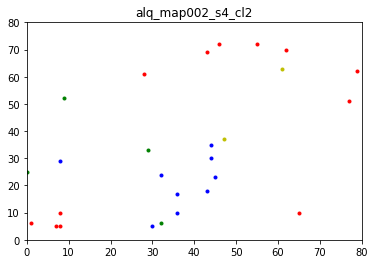

[44.4, 14.8, 33.3, 7.4]


Currently mapping.... alq_map003.csv  -->  3
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  16
Total percentage of lab  1  =  40.0 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  20.0 %
Total no. of lab  3  =  11
Total percentage of lab  3  =  27.500000000000004 %
Total no. of lab  4  =  5
Total percentage of lab  4  =  12.5 %
map saved!!


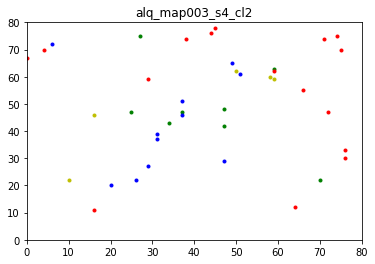

[40.0, 20.0, 27.5, 12.5]


Currently mapping.... alq_map004.csv  -->  4
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  16
Total percentage of lab  1  =  59.25925925925925 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  25.925925925925924 %
Total no. of lab  3  =  2
Total percentage of lab  3  =  7.4074074074074066 %
Total no. of lab  4  =  2
Total percentage of lab  4  =  7.4074074074074066 %
map saved!!


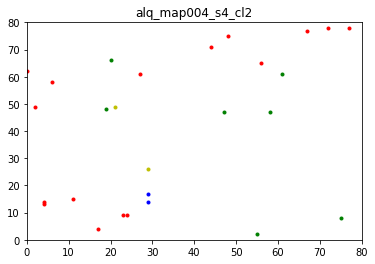

[59.3, 25.9, 7.4, 7.4]


Currently mapping.... alq_map005.csv  -->  5
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  14
Total percentage of lab  1  =  43.75 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  25.0 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  15.625 %
Total no. of lab  4  =  5
Total percentage of lab  4  =  15.625 %
map saved!!


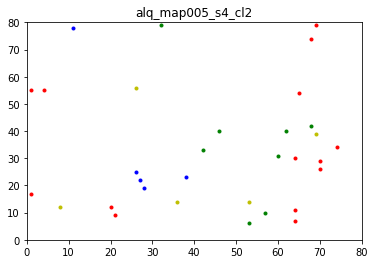

[43.8, 25.0, 15.6, 15.6]


Currently mapping.... alq_map006.csv  -->  6
Total no. of points to label.... 14
Label Analysis:-
Total no. of labels:  14
Total no. of lab  1  =  7
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  28.57142857142857 %
Total no. of lab  3  =  3
Total percentage of lab  3  =  21.428571428571427 %
map saved!!


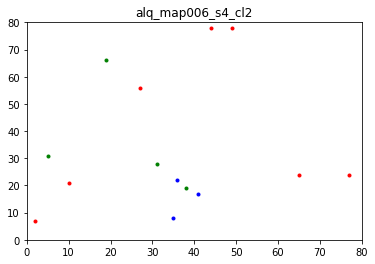

[50.0, 28.6, 21.4]


Currently mapping.... alq_map007.csv  -->  7
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  18
Total percentage of lab  1  =  58.06451612903226 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  16.129032258064516 %
Total no. of lab  3  =  6
Total percentage of lab  3  =  19.35483870967742 %
Total no. of lab  4  =  2
Total percentage of lab  4  =  6.451612903225806 %
map saved!!


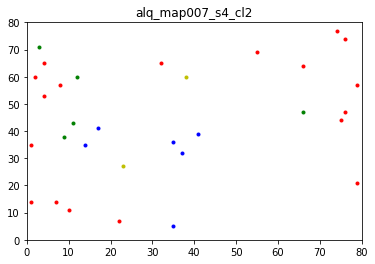

[58.1, 16.1, 19.4, 6.5]


Currently mapping.... alq_map008.csv  -->  8
Total no. of points to label.... 39
Label Analysis:-
Total no. of labels:  39
Total no. of lab  1  =  15
Total percentage of lab  1  =  38.46153846153847 %
Total no. of lab  2  =  3
Total percentage of lab  2  =  7.6923076923076925 %
Total no. of lab  3  =  9
Total percentage of lab  3  =  23.076923076923077 %
Total no. of lab  4  =  12
Total percentage of lab  4  =  30.76923076923077 %
map saved!!


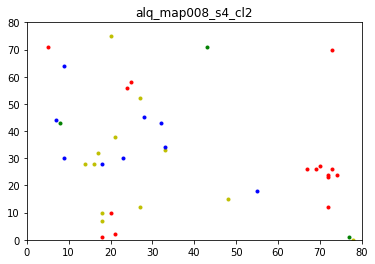

[38.5, 7.7, 23.1, 30.8]


Currently mapping.... alq_map009.csv  -->  9
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  14
Total percentage of lab  1  =  34.146341463414636 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  26.82926829268293 %
Total no. of lab  3  =  13
Total percentage of lab  3  =  31.70731707317073 %
Total no. of lab  4  =  3
Total percentage of lab  4  =  7.317073170731707 %
map saved!!


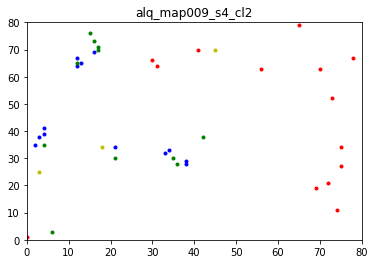

[34.1, 26.8, 31.7, 7.3]


Currently mapping.... alq_map010.csv  -->  10
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  16
Total percentage of lab  1  =  51.61290322580645 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  22.58064516129032 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  22.58064516129032 %
Total no. of lab  4  =  1
Total percentage of lab  4  =  3.225806451612903 %
map saved!!


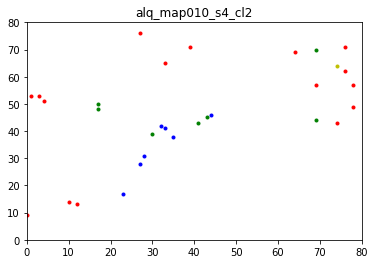

[51.6, 22.6, 22.6, 3.2]


Currently mapping.... alq_map011.csv  -->  11
Total no. of points to label.... 39
Label Analysis:-
Total no. of labels:  39
Total no. of lab  1  =  13
Total percentage of lab  1  =  33.33333333333333 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  17.94871794871795 %
Total no. of lab  3  =  11
Total percentage of lab  3  =  28.205128205128204 %
Total no. of lab  4  =  8
Total percentage of lab  4  =  20.51282051282051 %
map saved!!


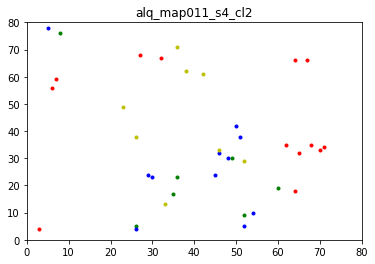

[33.3, 17.9, 28.2, 20.5]


Currently mapping.... alq_map012.csv  -->  12
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  14
Total percentage of lab  1  =  32.55813953488372 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  9.30232558139535 %
Total no. of lab  3  =  19
Total percentage of lab  3  =  44.18604651162791 %
Total no. of lab  4  =  6
Total percentage of lab  4  =  13.953488372093023 %
map saved!!


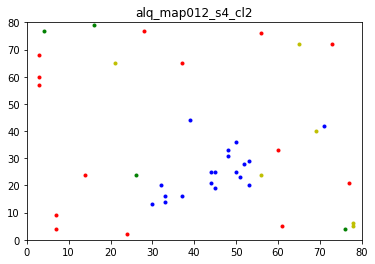

[32.6, 9.3, 44.2, 14.0]


Currently mapping.... alq_map013.csv  -->  13
Total no. of points to label.... 29
Label Analysis:-
Total no. of labels:  29
Total no. of lab  1  =  18
Total percentage of lab  1  =  62.06896551724138 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  20.689655172413794 %
Total no. of lab  3  =  3
Total percentage of lab  3  =  10.344827586206897 %
Total no. of lab  4  =  2
Total percentage of lab  4  =  6.896551724137931 %
map saved!!


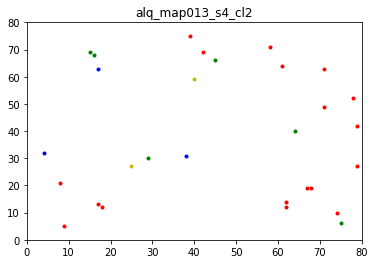

[62.1, 20.7, 10.3, 6.9]


Currently mapping.... alq_map014.csv  -->  14
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  10
Total percentage of lab  1  =  27.77777777777778 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  27.77777777777778 %
Total no. of lab  3  =  12
Total percentage of lab  3  =  33.33333333333333 %
Total no. of lab  4  =  4
Total percentage of lab  4  =  11.11111111111111 %
map saved!!


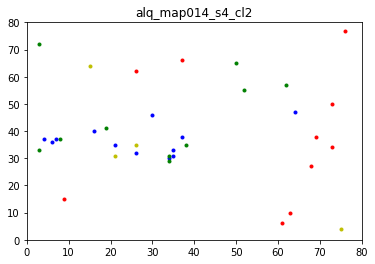

[27.8, 27.8, 33.3, 11.1]


Currently mapping.... alq_map015.csv  -->  15
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  19
Total percentage of lab  1  =  31.666666666666664 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  6.666666666666667 %
Total no. of lab  3  =  28
Total percentage of lab  3  =  46.666666666666664 %
Total no. of lab  4  =  9
Total percentage of lab  4  =  15.0 %
map saved!!


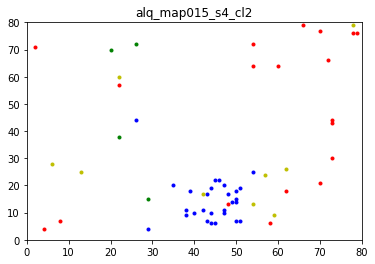

[31.7, 6.7, 46.7, 15.0]


Currently mapping.... alq_map016.csv  -->  16
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  17
Total percentage of lab  1  =  45.94594594594595 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  32.432432432432435 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  13.513513513513514 %
Total no. of lab  4  =  3
Total percentage of lab  4  =  8.108108108108109 %
map saved!!


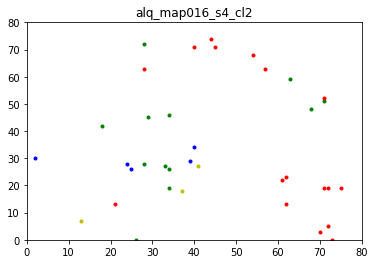

[45.9, 32.4, 13.5, 8.1]


Currently mapping.... alq_map017.csv  -->  17
Total no. of points to label.... 26
Label Analysis:-
Total no. of labels:  26
Total no. of lab  1  =  6
Total percentage of lab  1  =  23.076923076923077 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  30.76923076923077 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  19.230769230769234 %
Total no. of lab  4  =  7
Total percentage of lab  4  =  26.923076923076923 %
map saved!!


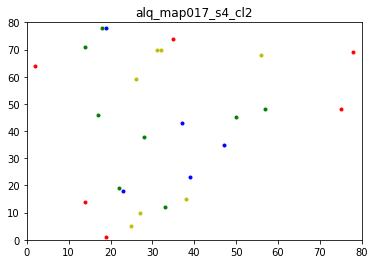

[23.1, 30.8, 19.2, 26.9]


Currently mapping.... alq_map018.csv  -->  18
Total no. of points to label.... 51
Label Analysis:-
Total no. of labels:  51
Total no. of lab  1  =  15
Total percentage of lab  1  =  29.411764705882355 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  23.52941176470588 %
Total no. of lab  3  =  18
Total percentage of lab  3  =  35.294117647058826 %
Total no. of lab  4  =  6
Total percentage of lab  4  =  11.76470588235294 %
map saved!!


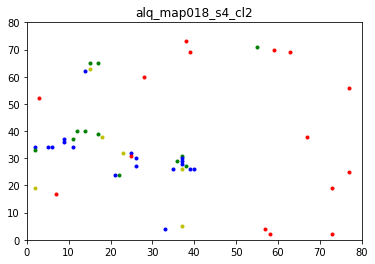

[29.4, 23.5, 35.3, 11.8]


Currently mapping.... alq_map019.csv  -->  19
Total no. of points to label.... 17
Label Analysis:-
Total no. of labels:  17
Total no. of lab  1  =  6
Total percentage of lab  1  =  35.294117647058826 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  23.52941176470588 %
Total no. of lab  3  =  3
Total percentage of lab  3  =  17.647058823529413 %
Total no. of lab  4  =  4
Total percentage of lab  4  =  23.52941176470588 %
map saved!!


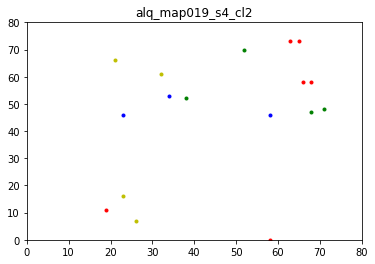

[35.3, 23.5, 17.6, 23.5]


Currently mapping.... alq_map020.csv  -->  20
Total no. of points to label.... 33
Label Analysis:-
Total no. of labels:  33
Total no. of lab  1  =  17
Total percentage of lab  1  =  51.515151515151516 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  18.181818181818183 %
Total no. of lab  3  =  9
Total percentage of lab  3  =  27.27272727272727 %
Total no. of lab  4  =  1
Total percentage of lab  4  =  3.0303030303030303 %
map saved!!


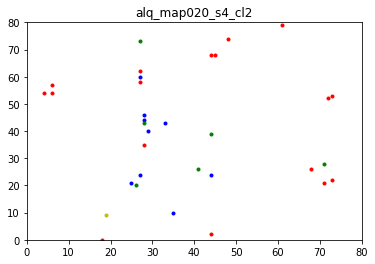

[51.5, 18.2, 27.3, 3.0]


Currently mapping.... alq_map021.csv  -->  21
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  23
Total percentage of lab  1  =  56.09756097560976 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  21.951219512195124 %
Total no. of lab  3  =  9
Total percentage of lab  3  =  21.951219512195124 %
map saved!!


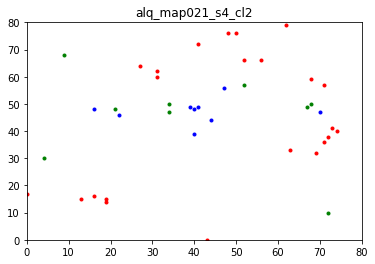

[56.1, 22.0, 22.0]


Currently mapping.... alq_map022.csv  -->  22
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  19
Total percentage of lab  1  =  59.375 %
Total no. of lab  2  =  3
Total percentage of lab  2  =  9.375 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  15.625 %
Total no. of lab  4  =  5
Total percentage of lab  4  =  15.625 %
map saved!!


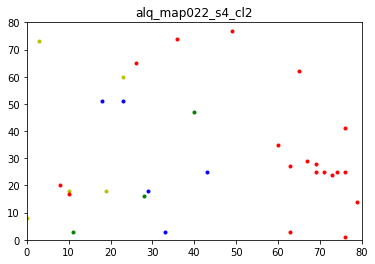

[59.4, 9.4, 15.6, 15.6]


Currently mapping.... alq_map023.csv  -->  23
Total no. of points to label.... 28
Label Analysis:-
Total no. of labels:  28
Total no. of lab  1  =  13
Total percentage of lab  1  =  46.42857142857143 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  17.857142857142858 %
Total no. of lab  3  =  4
Total percentage of lab  3  =  14.285714285714285 %
Total no. of lab  4  =  6
Total percentage of lab  4  =  21.428571428571427 %
map saved!!


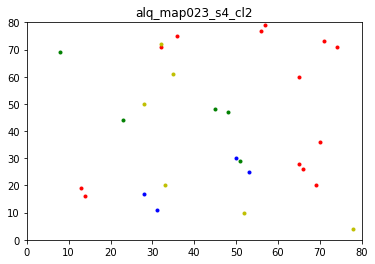

[46.4, 17.9, 14.3, 21.4]


Currently mapping.... alq_map024.csv  -->  24
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  13
Total percentage of lab  1  =  40.625 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  34.375 %
Total no. of lab  3  =  4
Total percentage of lab  3  =  12.5 %
Total no. of lab  4  =  4
Total percentage of lab  4  =  12.5 %
map saved!!


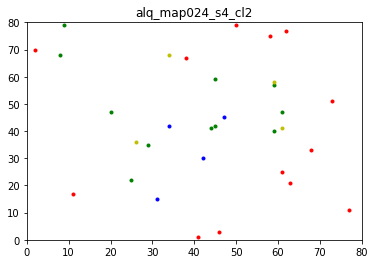

[40.6, 34.4, 12.5, 12.5]


Currently mapping.... alq_map025.csv  -->  25
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  16
Total percentage of lab  1  =  37.2093023255814 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  13.953488372093023 %
Total no. of lab  3  =  14
Total percentage of lab  3  =  32.55813953488372 %
Total no. of lab  4  =  7
Total percentage of lab  4  =  16.27906976744186 %
map saved!!


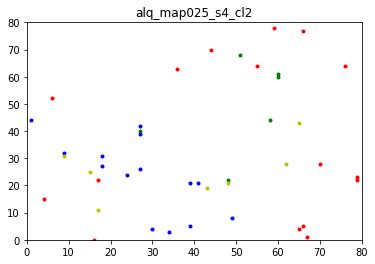

[37.2, 14.0, 32.6, 16.3]


Currently mapping.... alq_map026.csv  -->  26
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  12
Total percentage of lab  1  =  37.5 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  12.5 %
Total no. of lab  3  =  15
Total percentage of lab  3  =  46.875 %
Total no. of lab  4  =  1
Total percentage of lab  4  =  3.125 %
map saved!!


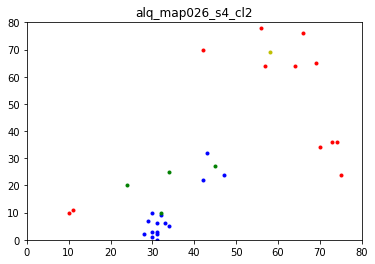

[37.5, 12.5, 46.9, 3.1]


Currently mapping.... alq_map027.csv  -->  27
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  19
Total percentage of lab  1  =  52.77777777777778 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  19.444444444444446 %
Total no. of lab  3  =  3
Total percentage of lab  3  =  8.333333333333332 %
Total no. of lab  4  =  7
Total percentage of lab  4  =  19.444444444444446 %
map saved!!


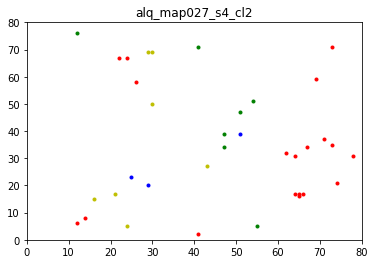

[52.8, 19.4, 8.3, 19.4]


Currently mapping.... alq_map028.csv  -->  28
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  15
Total percentage of lab  1  =  28.846153846153843 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  19.230769230769234 %
Total no. of lab  3  =  19
Total percentage of lab  3  =  36.53846153846153 %
Total no. of lab  4  =  8
Total percentage of lab  4  =  15.384615384615385 %
map saved!!


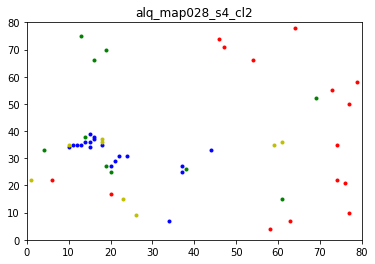

[28.8, 19.2, 36.5, 15.4]


Currently mapping.... alq_map029.csv  -->  29
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  14
Total percentage of lab  1  =  32.55813953488372 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  30.23255813953488 %
Total no. of lab  3  =  11
Total percentage of lab  3  =  25.581395348837212 %
Total no. of lab  4  =  5
Total percentage of lab  4  =  11.627906976744185 %
map saved!!


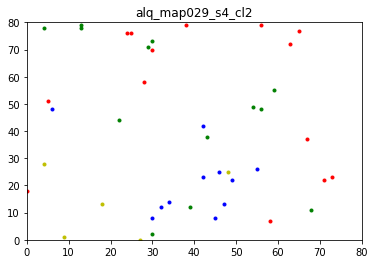

[32.6, 30.2, 25.6, 11.6]


Currently mapping.... alq_map030.csv  -->  30
Total no. of points to label.... 54
Label Analysis:-
Total no. of labels:  54
Total no. of lab  1  =  13
Total percentage of lab  1  =  24.074074074074073 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  7.4074074074074066 %
Total no. of lab  3  =  26
Total percentage of lab  3  =  48.148148148148145 %
Total no. of lab  4  =  11
Total percentage of lab  4  =  20.37037037037037 %
map saved!!


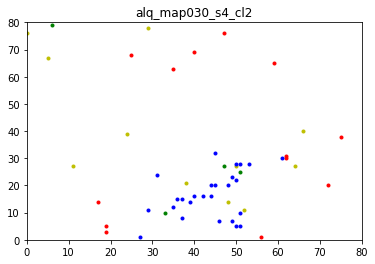

[24.1, 7.4, 48.1, 20.4]


Currently mapping.... alq_map031.csv  -->  31
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  27
Total percentage of lab  1  =  65.85365853658537 %
Total no. of lab  2  =  3
Total percentage of lab  2  =  7.317073170731707 %
Total no. of lab  3  =  3
Total percentage of lab  3  =  7.317073170731707 %
Total no. of lab  4  =  8
Total percentage of lab  4  =  19.51219512195122 %
map saved!!


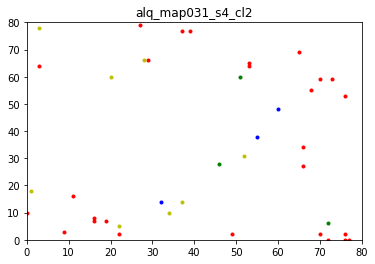

[65.9, 7.3, 7.3, 19.5]


Currently mapping.... alq_map032.csv  -->  32
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  14
Total percentage of lab  1  =  23.333333333333332 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  11.666666666666666 %
Total no. of lab  3  =  34
Total percentage of lab  3  =  56.666666666666664 %
Total no. of lab  4  =  5
Total percentage of lab  4  =  8.333333333333332 %
map saved!!


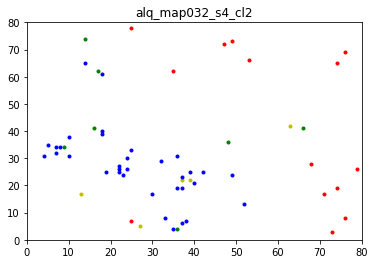

[23.3, 11.7, 56.7, 8.3]


Currently mapping.... alq_map033.csv  -->  33
Total no. of points to label.... 84
Label Analysis:-
Total no. of labels:  84
Total no. of lab  1  =  12
Total percentage of lab  1  =  14.285714285714285 %
Total no. of lab  2  =  34
Total percentage of lab  2  =  40.476190476190474 %
Total no. of lab  3  =  18
Total percentage of lab  3  =  21.428571428571427 %
Total no. of lab  4  =  20
Total percentage of lab  4  =  23.809523809523807 %
map saved!!


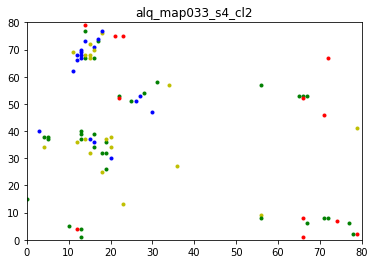

[14.3, 40.5, 21.4, 23.8]


Currently mapping.... alq_map034.csv  -->  34
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  17
Total percentage of lab  1  =  32.69230769230769 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  15.384615384615385 %
Total no. of lab  3  =  24
Total percentage of lab  3  =  46.15384615384615 %
Total no. of lab  4  =  3
Total percentage of lab  4  =  5.769230769230769 %
map saved!!


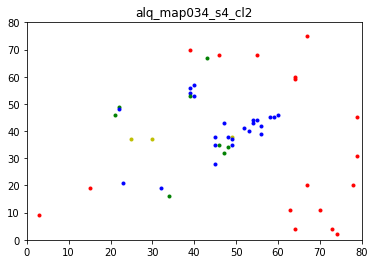

[32.7, 15.4, 46.2, 5.8]


Currently mapping.... alq_map035.csv  -->  35
Total no. of points to label.... 64
Label Analysis:-
Total no. of labels:  64
Total no. of lab  1  =  29
Total percentage of lab  1  =  45.3125 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  9.375 %
Total no. of lab  3  =  18
Total percentage of lab  3  =  28.125 %
Total no. of lab  4  =  11
Total percentage of lab  4  =  17.1875 %
map saved!!


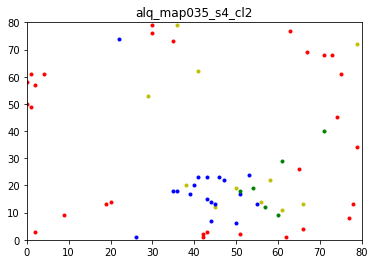

[45.3, 9.4, 28.1, 17.2]


Currently mapping.... alq_map036.csv  -->  36
Total no. of points to label.... 69
Label Analysis:-
Total no. of labels:  69
Total no. of lab  1  =  13
Total percentage of lab  1  =  18.84057971014493 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  30.434782608695656 %
Total no. of lab  3  =  31
Total percentage of lab  3  =  44.927536231884055 %
Total no. of lab  4  =  4
Total percentage of lab  4  =  5.797101449275362 %
map saved!!


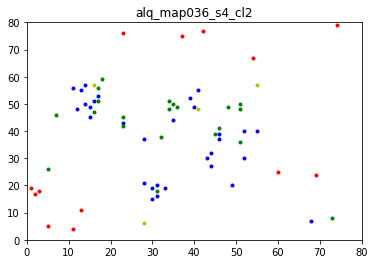

[18.8, 30.4, 44.9, 5.8]


Currently mapping.... alq_map037.csv  -->  37
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  13
Total percentage of lab  1  =  36.11111111111111 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  19.444444444444446 %
Total no. of lab  3  =  10
Total percentage of lab  3  =  27.77777777777778 %
Total no. of lab  4  =  6
Total percentage of lab  4  =  16.666666666666664 %
map saved!!


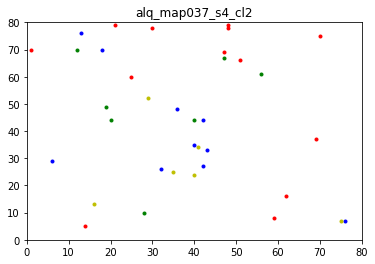

[36.1, 19.4, 27.8, 16.7]


Currently mapping.... alq_map038.csv  -->  38
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  16
Total percentage of lab  1  =  37.2093023255814 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  25.581395348837212 %
Total no. of lab  3  =  12
Total percentage of lab  3  =  27.906976744186046 %
Total no. of lab  4  =  4
Total percentage of lab  4  =  9.30232558139535 %
map saved!!


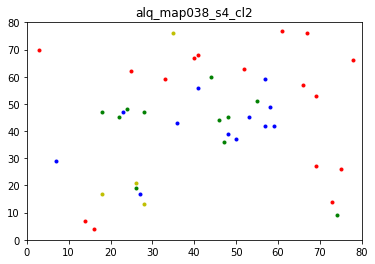

[37.2, 25.6, 27.9, 9.3]


Currently mapping.... alq_map039.csv  -->  39
Total no. of points to label.... 46
Label Analysis:-
Total no. of labels:  46
Total no. of lab  1  =  17
Total percentage of lab  1  =  36.95652173913043 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  17.391304347826086 %
Total no. of lab  3  =  10
Total percentage of lab  3  =  21.73913043478261 %
Total no. of lab  4  =  11
Total percentage of lab  4  =  23.91304347826087 %
map saved!!


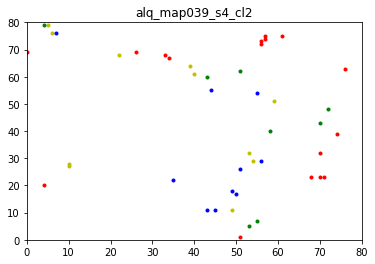

[37.0, 17.4, 21.7, 23.9]


Currently mapping.... alq_map040.csv  -->  40
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  9
Total percentage of lab  1  =  29.03225806451613 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  45.16129032258064 %
Total no. of lab  3  =  2
Total percentage of lab  3  =  6.451612903225806 %
Total no. of lab  4  =  6
Total percentage of lab  4  =  19.35483870967742 %
map saved!!


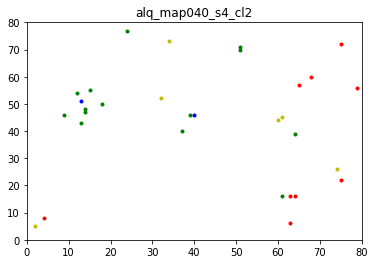

[29.0, 45.2, 6.5, 19.4]


Currently mapping.... alq_map041.csv  -->  41
Total no. of points to label.... 34
Label Analysis:-
Total no. of labels:  34
Total no. of lab  1  =  12
Total percentage of lab  1  =  35.294117647058826 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  38.23529411764706 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  14.705882352941178 %
Total no. of lab  4  =  4
Total percentage of lab  4  =  11.76470588235294 %
map saved!!


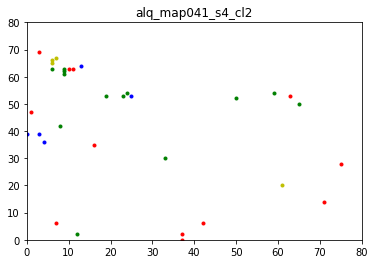

[35.3, 38.2, 14.7, 11.8]


Currently mapping.... alq_map042.csv  -->  42
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  14
Total percentage of lab  1  =  36.84210526315789 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  26.31578947368421 %
Total no. of lab  3  =  12
Total percentage of lab  3  =  31.57894736842105 %
Total no. of lab  4  =  2
Total percentage of lab  4  =  5.263157894736842 %
map saved!!


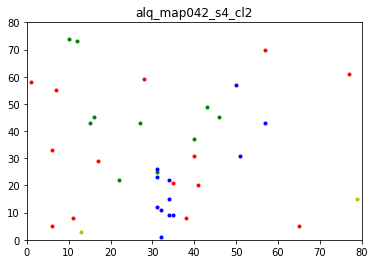

[36.8, 26.3, 31.6, 5.3]


Currently mapping.... alq_map043.csv  -->  43
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  14
Total percentage of lab  1  =  51.85185185185185 %
Total no. of lab  2  =  2
Total percentage of lab  2  =  7.4074074074074066 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  25.925925925925924 %
Total no. of lab  4  =  4
Total percentage of lab  4  =  14.814814814814813 %
map saved!!


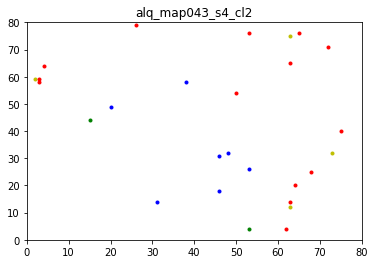

[51.9, 7.4, 25.9, 14.8]


Currently mapping.... alq_map044.csv  -->  44
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  11
Total percentage of lab  1  =  26.82926829268293 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  14.634146341463413 %
Total no. of lab  3  =  16
Total percentage of lab  3  =  39.02439024390244 %
Total no. of lab  4  =  8
Total percentage of lab  4  =  19.51219512195122 %
map saved!!


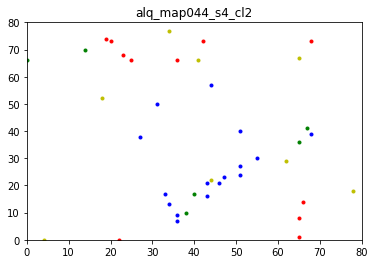

[26.8, 14.6, 39.0, 19.5]


Currently mapping.... alq_map045.csv  -->  45
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  10
Total percentage of lab  1  =  24.390243902439025 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  19.51219512195122 %
Total no. of lab  3  =  16
Total percentage of lab  3  =  39.02439024390244 %
Total no. of lab  4  =  7
Total percentage of lab  4  =  17.073170731707318 %
map saved!!


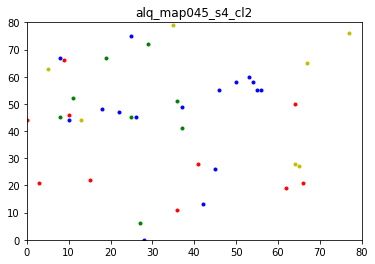

[24.4, 19.5, 39.0, 17.1]


Currently mapping.... alq_map046.csv  -->  46
Total no. of points to label.... 26
Label Analysis:-
Total no. of labels:  26
Total no. of lab  1  =  10
Total percentage of lab  1  =  38.46153846153847 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  23.076923076923077 %
Total no. of lab  3  =  6
Total percentage of lab  3  =  23.076923076923077 %
Total no. of lab  4  =  4
Total percentage of lab  4  =  15.384615384615385 %
map saved!!


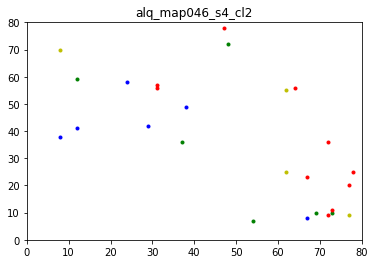

[38.5, 23.1, 23.1, 15.4]


Currently mapping.... alq_map047.csv  -->  47
Total no. of points to label.... 24
Label Analysis:-
Total no. of labels:  24
Total no. of lab  1  =  11
Total percentage of lab  1  =  45.83333333333333 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  20.833333333333336 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  29.166666666666668 %
Total no. of lab  4  =  1
Total percentage of lab  4  =  4.166666666666666 %
map saved!!


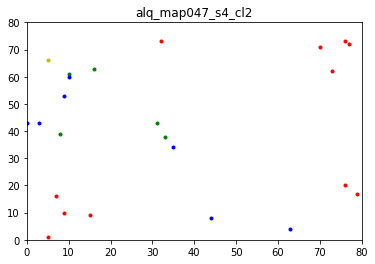

[45.8, 20.8, 29.2, 4.2]


Currently mapping.... alq_map048.csv  -->  48
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  21
Total percentage of lab  1  =  52.5 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  15.0 %
Total no. of lab  3  =  6
Total percentage of lab  3  =  15.0 %
Total no. of lab  4  =  7
Total percentage of lab  4  =  17.5 %
map saved!!


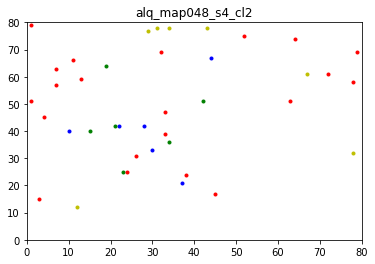

[52.5, 15.0, 15.0, 17.5]


Currently mapping.... alq_map049.csv  -->  49
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  11
Total percentage of lab  1  =  28.947368421052634 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  31.57894736842105 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  18.421052631578945 %
Total no. of lab  4  =  8
Total percentage of lab  4  =  21.052631578947366 %
map saved!!


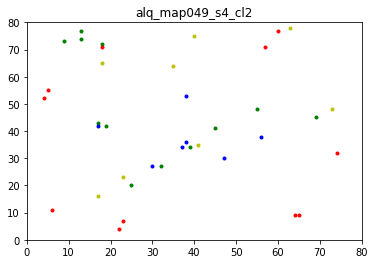

[28.9, 31.6, 18.4, 21.1]


Currently mapping.... alq_map050.csv  -->  50
Total no. of points to label.... 125
Label Analysis:-
Total no. of labels:  125
Total no. of lab  1  =  13
Total percentage of lab  1  =  10.4 %
Total no. of lab  2  =  48
Total percentage of lab  2  =  38.4 %
Total no. of lab  3  =  39
Total percentage of lab  3  =  31.2 %
Total no. of lab  4  =  25
Total percentage of lab  4  =  20.0 %
map saved!!


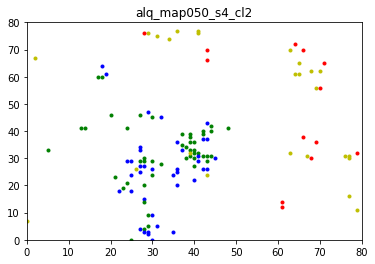

[10.4, 38.4, 31.2, 20.0]


Currently mapping.... alq_map051.csv  -->  51
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  30
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  20.0 %
Total no. of lab  3  =  10
Total percentage of lab  3  =  16.666666666666664 %
Total no. of lab  4  =  8
Total percentage of lab  4  =  13.333333333333334 %
map saved!!


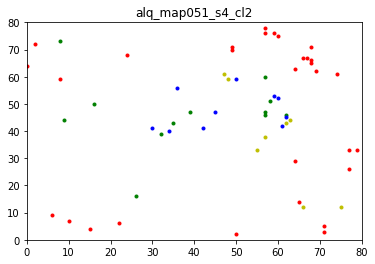

[50.0, 20.0, 16.7, 13.3]


Currently mapping.... alq_map052.csv  -->  52
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  16
Total percentage of lab  1  =  30.76923076923077 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  30.76923076923077 %
Total no. of lab  3  =  18
Total percentage of lab  3  =  34.61538461538461 %
Total no. of lab  4  =  2
Total percentage of lab  4  =  3.8461538461538463 %
map saved!!


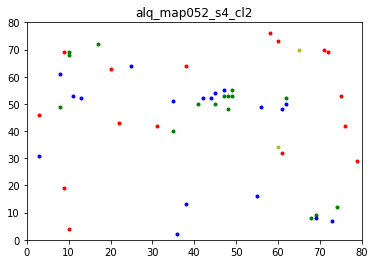

[30.8, 30.8, 34.6, 3.8]


Currently mapping.... alq_map053.csv  -->  53
Total no. of points to label.... 51
Label Analysis:-
Total no. of labels:  51
Total no. of lab  1  =  15
Total percentage of lab  1  =  29.411764705882355 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  21.568627450980394 %
Total no. of lab  3  =  17
Total percentage of lab  3  =  33.33333333333333 %
Total no. of lab  4  =  8
Total percentage of lab  4  =  15.686274509803921 %
map saved!!


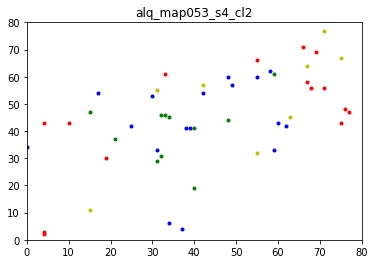

[29.4, 21.6, 33.3, 15.7]


Currently mapping.... alq_map054.csv  -->  54
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  12
Total percentage of lab  1  =  33.33333333333333 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  27.77777777777778 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  19.444444444444446 %
Total no. of lab  4  =  7
Total percentage of lab  4  =  19.444444444444446 %
map saved!!


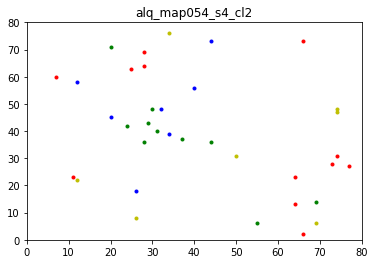

[33.3, 27.8, 19.4, 19.4]


Currently mapping.... alq_map055.csv  -->  55
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  20
Total percentage of lab  1  =  26.666666666666668 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  17.333333333333336 %
Total no. of lab  3  =  36
Total percentage of lab  3  =  48.0 %
Total no. of lab  4  =  6
Total percentage of lab  4  =  8.0 %
map saved!!


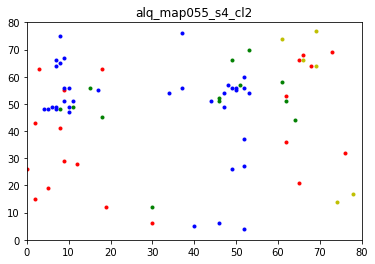

[26.7, 17.3, 48.0, 8.0]


Currently mapping.... alq_map056.csv  -->  56
Total no. of points to label.... 19
Label Analysis:-
Total no. of labels:  19
Total no. of lab  1  =  9
Total percentage of lab  1  =  47.368421052631575 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  26.31578947368421 %
Total no. of lab  3  =  4
Total percentage of lab  3  =  21.052631578947366 %
Total no. of lab  4  =  1
Total percentage of lab  4  =  5.263157894736842 %
map saved!!


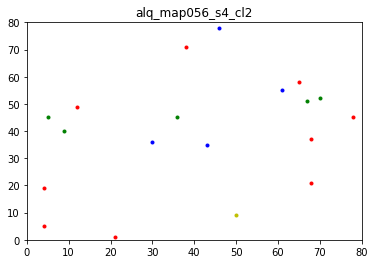

[47.4, 26.3, 21.1, 5.3]


Currently mapping.... alq_map057.csv  -->  57
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  10
Total percentage of lab  1  =  27.027027027027028 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  13.513513513513514 %
Total no. of lab  3  =  16
Total percentage of lab  3  =  43.24324324324324 %
Total no. of lab  4  =  6
Total percentage of lab  4  =  16.216216216216218 %
map saved!!


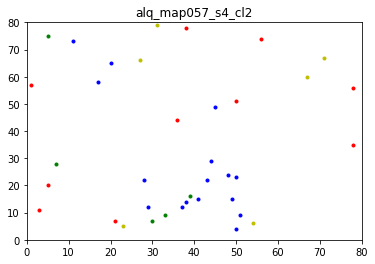

[27.0, 13.5, 43.2, 16.2]


Currently mapping.... alq_map058.csv  -->  58
Total no. of points to label.... 44
Label Analysis:-
Total no. of labels:  44
Total no. of lab  1  =  21
Total percentage of lab  1  =  47.72727272727273 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  31.818181818181817 %
Total no. of lab  3  =  4
Total percentage of lab  3  =  9.090909090909092 %
Total no. of lab  4  =  5
Total percentage of lab  4  =  11.363636363636363 %
map saved!!


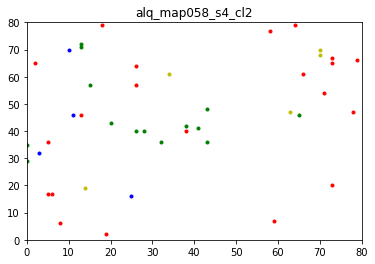

[47.7, 31.8, 9.1, 11.4]


Currently mapping.... alq_map059.csv  -->  59
Total no. of points to label.... 33
Label Analysis:-
Total no. of labels:  33
Total no. of lab  1  =  14
Total percentage of lab  1  =  42.42424242424242 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  18.181818181818183 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  21.21212121212121 %
Total no. of lab  4  =  6
Total percentage of lab  4  =  18.181818181818183 %
map saved!!


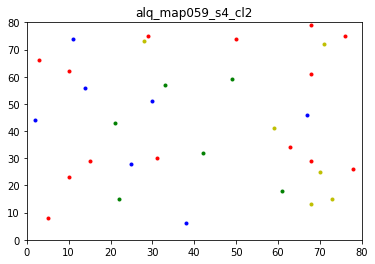

[42.4, 18.2, 21.2, 18.2]


Currently mapping.... alq_map060.csv  -->  60
Total no. of points to label.... 62
Label Analysis:-
Total no. of labels:  62
Total no. of lab  1  =  35
Total percentage of lab  1  =  56.451612903225815 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  16.129032258064516 %
Total no. of lab  3  =  9
Total percentage of lab  3  =  14.516129032258066 %
Total no. of lab  4  =  8
Total percentage of lab  4  =  12.903225806451612 %
map saved!!


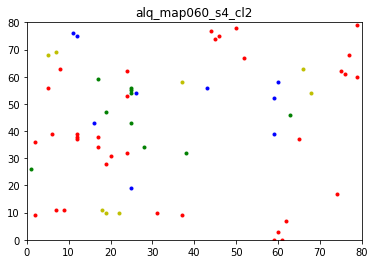

[56.5, 16.1, 14.5, 12.9]


Currently mapping.... alq_map061.csv  -->  61
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  12
Total percentage of lab  1  =  29.268292682926827 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  19.51219512195122 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  17.073170731707318 %
Total no. of lab  4  =  14
Total percentage of lab  4  =  34.146341463414636 %
map saved!!


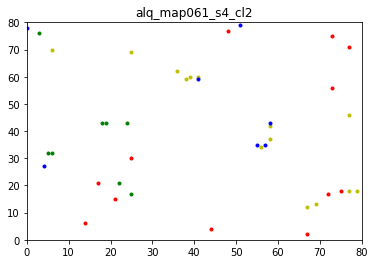

[29.3, 19.5, 17.1, 34.1]


Currently mapping.... alq_map062.csv  -->  62
Total no. of points to label.... 24
Label Analysis:-
Total no. of labels:  24
Total no. of lab  1  =  8
Total percentage of lab  1  =  33.33333333333333 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  16.666666666666664 %
Total no. of lab  3  =  6
Total percentage of lab  3  =  25.0 %
Total no. of lab  4  =  6
Total percentage of lab  4  =  25.0 %
map saved!!


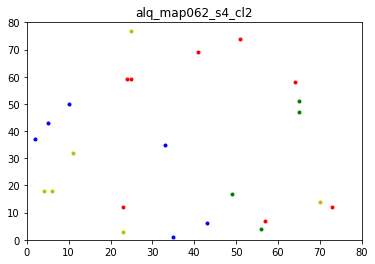

[33.3, 16.7, 25.0, 25.0]


Currently mapping.... alq_map063.csv  -->  63
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  11
Total percentage of lab  1  =  25.581395348837212 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  23.25581395348837 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  16.27906976744186 %
Total no. of lab  4  =  15
Total percentage of lab  4  =  34.883720930232556 %
map saved!!


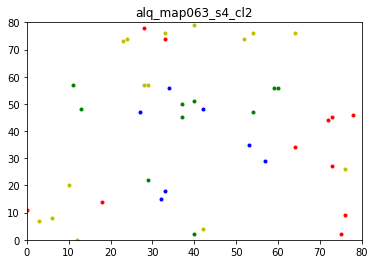

[25.6, 23.3, 16.3, 34.9]


Currently mapping.... alq_map064.csv  -->  64
Total no. of points to label.... 50
Label Analysis:-
Total no. of labels:  50
Total no. of lab  1  =  17
Total percentage of lab  1  =  34.0 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  36.0 %
Total no. of lab  3  =  4
Total percentage of lab  3  =  8.0 %
Total no. of lab  4  =  11
Total percentage of lab  4  =  22.0 %
map saved!!


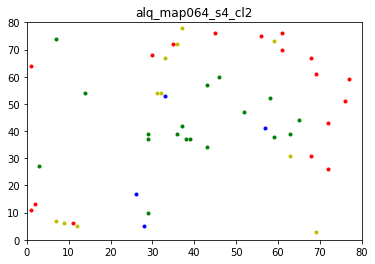

[34.0, 36.0, 8.0, 22.0]


Currently mapping.... alq_map065.csv  -->  65
Total no. of points to label.... 44
Label Analysis:-
Total no. of labels:  44
Total no. of lab  1  =  24
Total percentage of lab  1  =  54.54545454545454 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  27.27272727272727 %
Total no. of lab  3  =  2
Total percentage of lab  3  =  4.545454545454546 %
Total no. of lab  4  =  6
Total percentage of lab  4  =  13.636363636363635 %
map saved!!


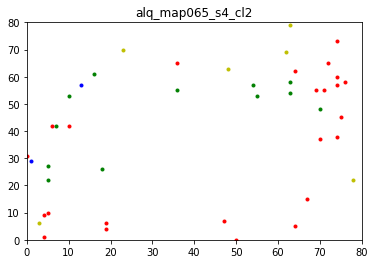

[54.5, 27.3, 4.5, 13.6]


Currently mapping.... alq_map066.csv  -->  66
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  19
Total percentage of lab  1  =  31.147540983606557 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  22.950819672131146 %
Total no. of lab  3  =  21
Total percentage of lab  3  =  34.42622950819672 %
Total no. of lab  4  =  7
Total percentage of lab  4  =  11.475409836065573 %
map saved!!


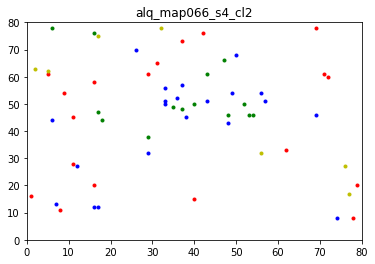

[31.1, 23.0, 34.4, 11.5]


Currently mapping.... alq_map067.csv  -->  67
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  10
Total percentage of lab  1  =  27.77777777777778 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  22.22222222222222 %
Total no. of lab  3  =  8
Total percentage of lab  3  =  22.22222222222222 %
Total no. of lab  4  =  10
Total percentage of lab  4  =  27.77777777777778 %
map saved!!


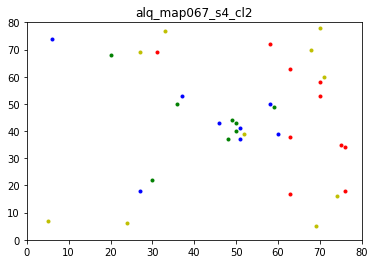

[27.8, 22.2, 22.2, 27.8]


Currently mapping.... alq_map068.csv  -->  68
Total no. of points to label.... 45
Label Analysis:-
Total no. of labels:  45
Total no. of lab  1  =  22
Total percentage of lab  1  =  48.888888888888886 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  20.0 %
Total no. of lab  3  =  9
Total percentage of lab  3  =  20.0 %
Total no. of lab  4  =  5
Total percentage of lab  4  =  11.11111111111111 %
map saved!!


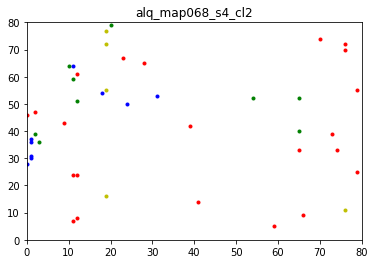

[48.9, 20.0, 20.0, 11.1]


Currently mapping.... alq_map069.csv  -->  69
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  30
Total percentage of lab  1  =  57.692307692307686 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  11.538461538461538 %
Total no. of lab  3  =  8
Total percentage of lab  3  =  15.384615384615385 %
Total no. of lab  4  =  8
Total percentage of lab  4  =  15.384615384615385 %
map saved!!


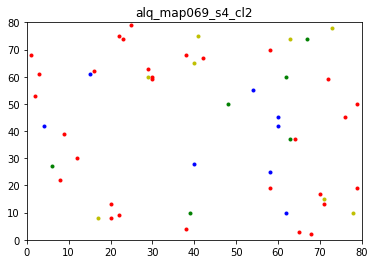

[57.7, 11.5, 15.4, 15.4]


Currently mapping.... alq_map070.csv  -->  70
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  13
Total percentage of lab  1  =  21.666666666666668 %
Total no. of lab  2  =  24
Total percentage of lab  2  =  40.0 %
Total no. of lab  3  =  17
Total percentage of lab  3  =  28.333333333333332 %
Total no. of lab  4  =  6
Total percentage of lab  4  =  10.0 %
map saved!!


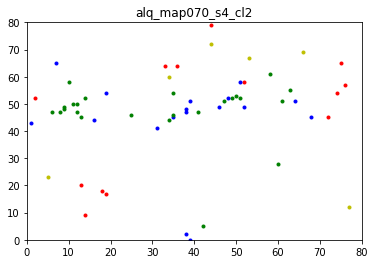

[21.7, 40.0, 28.3, 10.0]


Currently mapping.... alq_map071.csv  -->  71
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  17
Total percentage of lab  1  =  32.69230769230769 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  7.6923076923076925 %
Total no. of lab  3  =  22
Total percentage of lab  3  =  42.30769230769231 %
Total no. of lab  4  =  9
Total percentage of lab  4  =  17.307692307692307 %
map saved!!


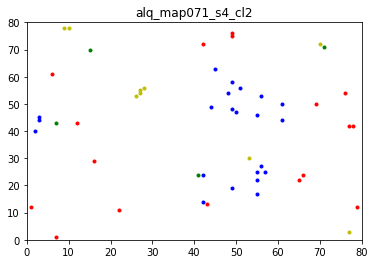

[32.7, 7.7, 42.3, 17.3]


Currently mapping.... alq_map072.csv  -->  72
Total no. of points to label.... 62
Label Analysis:-
Total no. of labels:  62
Total no. of lab  1  =  13
Total percentage of lab  1  =  20.967741935483872 %
Total no. of lab  2  =  23
Total percentage of lab  2  =  37.096774193548384 %
Total no. of lab  3  =  19
Total percentage of lab  3  =  30.64516129032258 %
Total no. of lab  4  =  7
Total percentage of lab  4  =  11.29032258064516 %
map saved!!


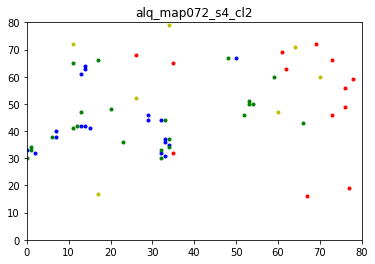

[21.0, 37.1, 30.6, 11.3]


Currently mapping.... alq_map073.csv  -->  73
Total no. of points to label.... 85
Label Analysis:-
Total no. of labels:  85
Total no. of lab  1  =  22
Total percentage of lab  1  =  25.882352941176475 %
Total no. of lab  2  =  27
Total percentage of lab  2  =  31.76470588235294 %
Total no. of lab  3  =  18
Total percentage of lab  3  =  21.176470588235293 %
Total no. of lab  4  =  18
Total percentage of lab  4  =  21.176470588235293 %
map saved!!


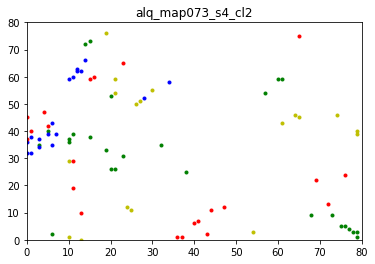

[25.9, 31.8, 21.2, 21.2]


Currently mapping.... alq_map074.csv  -->  74
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  23
Total percentage of lab  1  =  39.6551724137931 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  8.620689655172415 %
Total no. of lab  3  =  20
Total percentage of lab  3  =  34.48275862068966 %
Total no. of lab  4  =  10
Total percentage of lab  4  =  17.24137931034483 %
map saved!!


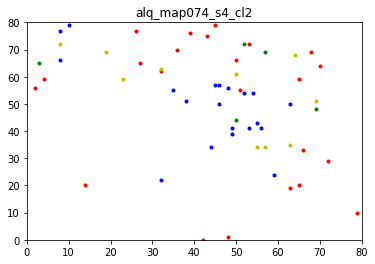

[39.7, 8.6, 34.5, 17.2]


Currently mapping.... alq_map075.csv  -->  75
Total no. of points to label.... 59
Label Analysis:-
Total no. of labels:  59
Total no. of lab  1  =  22
Total percentage of lab  1  =  37.28813559322034 %
Total no. of lab  2  =  21
Total percentage of lab  2  =  35.59322033898305 %
Total no. of lab  3  =  11
Total percentage of lab  3  =  18.64406779661017 %
Total no. of lab  4  =  5
Total percentage of lab  4  =  8.47457627118644 %
map saved!!


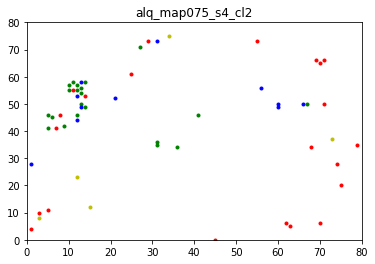

[37.3, 35.6, 18.6, 8.5]


Currently mapping.... alq_map076.csv  -->  76
Total no. of points to label.... 72
Label Analysis:-
Total no. of labels:  72
Total no. of lab  1  =  15
Total percentage of lab  1  =  20.833333333333336 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  22.22222222222222 %
Total no. of lab  3  =  37
Total percentage of lab  3  =  51.388888888888886 %
Total no. of lab  4  =  4
Total percentage of lab  4  =  5.555555555555555 %
map saved!!


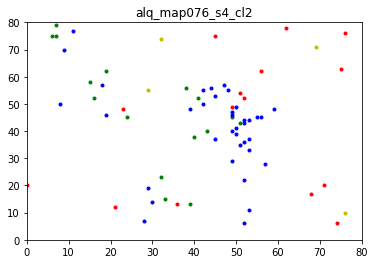

[20.8, 22.2, 51.4, 5.6]


Currently mapping.... alq_map077.csv  -->  77
Total no. of points to label.... 42
Label Analysis:-
Total no. of labels:  42
Total no. of lab  1  =  19
Total percentage of lab  1  =  45.23809523809524 %
Total no. of lab  2  =  3
Total percentage of lab  2  =  7.142857142857142 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  11.904761904761903 %
Total no. of lab  4  =  15
Total percentage of lab  4  =  35.714285714285715 %
map saved!!


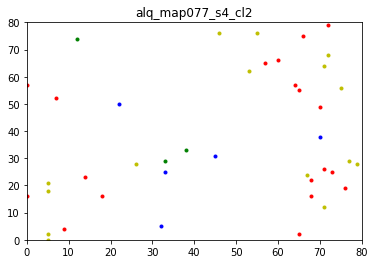

[45.2, 7.1, 11.9, 35.7]


Currently mapping.... alq_map078.csv  -->  78
Total no. of points to label.... 63
Label Analysis:-
Total no. of labels:  63
Total no. of lab  1  =  15
Total percentage of lab  1  =  23.809523809523807 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  22.22222222222222 %
Total no. of lab  3  =  18
Total percentage of lab  3  =  28.57142857142857 %
Total no. of lab  4  =  16
Total percentage of lab  4  =  25.396825396825395 %
map saved!!


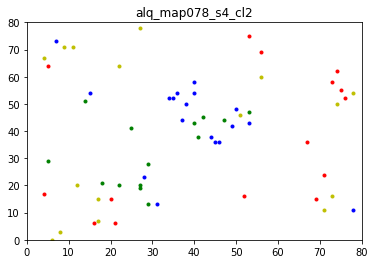

[23.8, 22.2, 28.6, 25.4]


Currently mapping.... alq_map079.csv  -->  79
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  10
Total percentage of lab  1  =  25.0 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  22.5 %
Total no. of lab  3  =  9
Total percentage of lab  3  =  22.5 %
Total no. of lab  4  =  12
Total percentage of lab  4  =  30.0 %
map saved!!


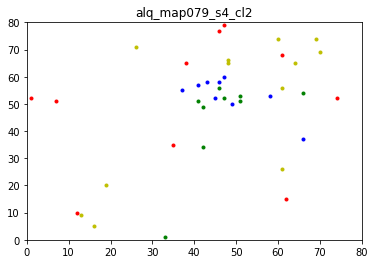

[25.0, 22.5, 22.5, 30.0]


Currently mapping.... alq_map080.csv  -->  80
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  21
Total percentage of lab  1  =  58.333333333333336 %
Total no. of lab  2  =  3
Total percentage of lab  2  =  8.333333333333332 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  13.88888888888889 %
Total no. of lab  4  =  7
Total percentage of lab  4  =  19.444444444444446 %
map saved!!


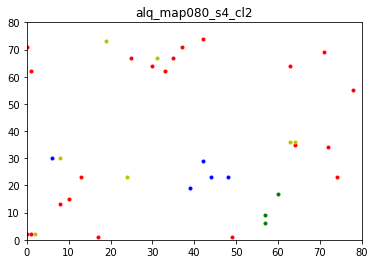

[58.3, 8.3, 13.9, 19.4]


Currently mapping.... alq_map081.csv  -->  81
Total no. of points to label.... 77
Label Analysis:-
Total no. of labels:  77
Total no. of lab  1  =  24
Total percentage of lab  1  =  31.16883116883117 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  22.07792207792208 %
Total no. of lab  3  =  13
Total percentage of lab  3  =  16.883116883116884 %
Total no. of lab  4  =  23
Total percentage of lab  4  =  29.87012987012987 %
map saved!!


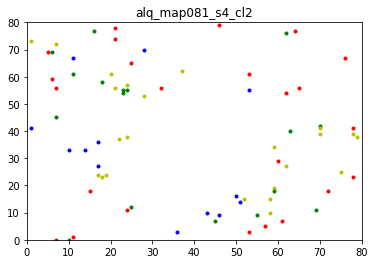

[31.2, 22.1, 16.9, 29.9]


Currently mapping.... alq_map082.csv  -->  82
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  15
Total percentage of lab  1  =  41.66666666666667 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  13.88888888888889 %
Total no. of lab  3  =  11
Total percentage of lab  3  =  30.555555555555557 %
Total no. of lab  4  =  5
Total percentage of lab  4  =  13.88888888888889 %
map saved!!


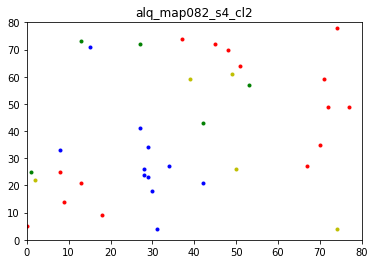

[41.7, 13.9, 30.6, 13.9]


Currently mapping.... alq_map083.csv  -->  83
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  11
Total percentage of lab  1  =  25.581395348837212 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  41.86046511627907 %
Total no. of lab  3  =  8
Total percentage of lab  3  =  18.6046511627907 %
Total no. of lab  4  =  6
Total percentage of lab  4  =  13.953488372093023 %
map saved!!


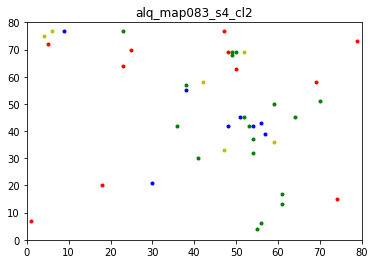

[25.6, 41.9, 18.6, 14.0]


Currently mapping.... alq_map084.csv  -->  84
Total no. of points to label.... 49
Label Analysis:-
Total no. of labels:  49
Total no. of lab  1  =  22
Total percentage of lab  1  =  44.89795918367347 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  14.285714285714285 %
Total no. of lab  3  =  12
Total percentage of lab  3  =  24.489795918367346 %
Total no. of lab  4  =  8
Total percentage of lab  4  =  16.3265306122449 %
map saved!!


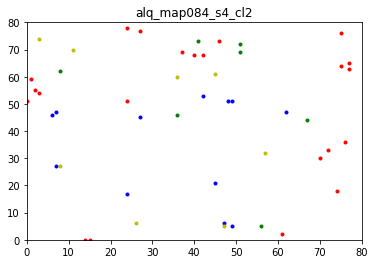

[44.9, 14.3, 24.5, 16.3]


Currently mapping.... alq_map085.csv  -->  85
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  24
Total percentage of lab  1  =  41.37931034482759 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  13.793103448275861 %
Total no. of lab  3  =  2
Total percentage of lab  3  =  3.4482758620689653 %
Total no. of lab  4  =  24
Total percentage of lab  4  =  41.37931034482759 %
map saved!!


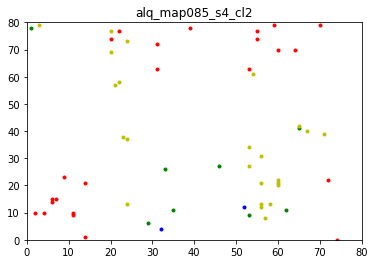

[41.4, 13.8, 3.4, 41.4]


Currently mapping.... alq_map086.csv  -->  86
Total no. of points to label.... 74
Label Analysis:-
Total no. of labels:  74
Total no. of lab  1  =  26
Total percentage of lab  1  =  35.13513513513514 %
Total no. of lab  2  =  24
Total percentage of lab  2  =  32.432432432432435 %
Total no. of lab  3  =  8
Total percentage of lab  3  =  10.81081081081081 %
Total no. of lab  4  =  16
Total percentage of lab  4  =  21.62162162162162 %
map saved!!


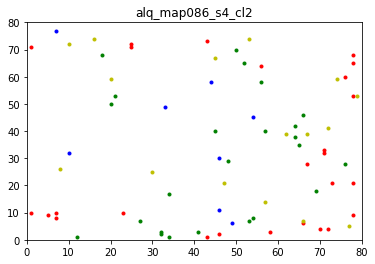

[35.1, 32.4, 10.8, 21.6]


Currently mapping.... alq_map087.csv  -->  87
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  13
Total percentage of lab  1  =  30.23255813953488 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  25.581395348837212 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  16.27906976744186 %
Total no. of lab  4  =  12
Total percentage of lab  4  =  27.906976744186046 %
map saved!!


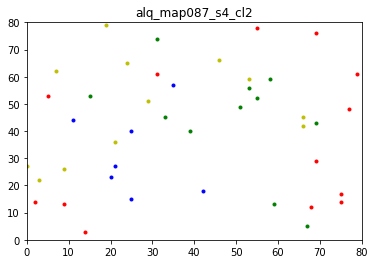

[30.2, 25.6, 16.3, 27.9]


Currently mapping.... alq_map088.csv  -->  88
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  26
Total percentage of lab  1  =  34.66666666666667 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  14.666666666666666 %
Total no. of lab  3  =  25
Total percentage of lab  3  =  33.33333333333333 %
Total no. of lab  4  =  13
Total percentage of lab  4  =  17.333333333333336 %
map saved!!


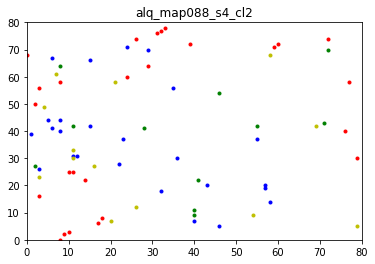

[34.7, 14.7, 33.3, 17.3]


Currently mapping.... alq_map089.csv  -->  89
Total no. of points to label.... 68
Label Analysis:-
Total no. of labels:  68
Total no. of lab  1  =  23
Total percentage of lab  1  =  33.82352941176471 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  27.941176470588236 %
Total no. of lab  3  =  15
Total percentage of lab  3  =  22.058823529411764 %
Total no. of lab  4  =  11
Total percentage of lab  4  =  16.176470588235293 %
map saved!!


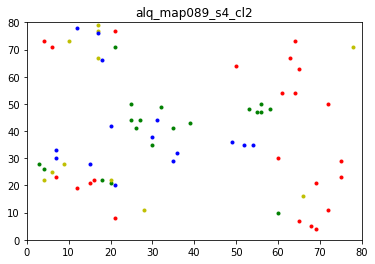

[33.8, 27.9, 22.1, 16.2]


Currently mapping.... alq_map090.csv  -->  90
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  24
Total percentage of lab  1  =  29.268292682926827 %
Total no. of lab  2  =  25
Total percentage of lab  2  =  30.48780487804878 %
Total no. of lab  3  =  20
Total percentage of lab  3  =  24.390243902439025 %
Total no. of lab  4  =  13
Total percentage of lab  4  =  15.853658536585366 %
map saved!!


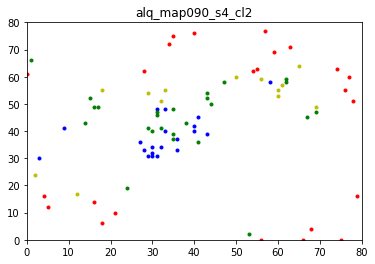

[29.3, 30.5, 24.4, 15.9]


Currently mapping.... alq_map091.csv  -->  91
Total no. of points to label.... 65
Label Analysis:-
Total no. of labels:  65
Total no. of lab  1  =  26
Total percentage of lab  1  =  40.0 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  6.153846153846154 %
Total no. of lab  3  =  26
Total percentage of lab  3  =  40.0 %
Total no. of lab  4  =  9
Total percentage of lab  4  =  13.846153846153847 %
map saved!!


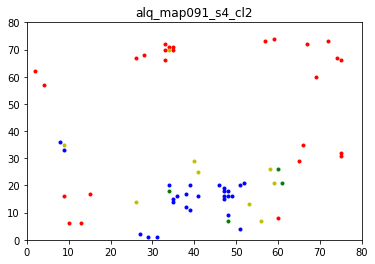

[40.0, 6.2, 40.0, 13.8]


Currently mapping.... alq_map092.csv  -->  92
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  26
Total percentage of lab  1  =  44.827586206896555 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  20.689655172413794 %
Total no. of lab  3  =  10
Total percentage of lab  3  =  17.24137931034483 %
Total no. of lab  4  =  10
Total percentage of lab  4  =  17.24137931034483 %
map saved!!


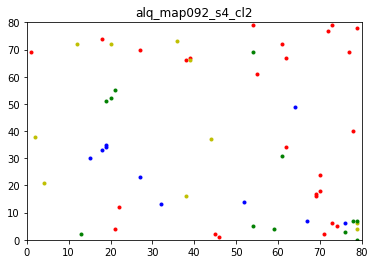

[44.8, 20.7, 17.2, 17.2]


Currently mapping.... alq_map093.csv  -->  93
Total no. of points to label.... 46
Label Analysis:-
Total no. of labels:  46
Total no. of lab  1  =  30
Total percentage of lab  1  =  65.21739130434783 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  15.217391304347828 %
Total no. of lab  3  =  3
Total percentage of lab  3  =  6.521739130434782 %
Total no. of lab  4  =  6
Total percentage of lab  4  =  13.043478260869565 %
map saved!!


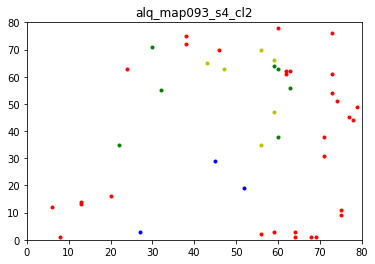

[65.2, 15.2, 6.5, 13.0]


Currently mapping.... alq_map094.csv  -->  94
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  36
Total percentage of lab  1  =  59.01639344262295 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  11.475409836065573 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  11.475409836065573 %
Total no. of lab  4  =  11
Total percentage of lab  4  =  18.0327868852459 %
map saved!!


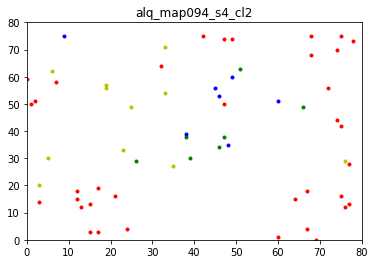

[59.0, 11.5, 11.5, 18.0]


Currently mapping.... alq_map095.csv  -->  95
Total no. of points to label.... 84
Label Analysis:-
Total no. of labels:  84
Total no. of lab  1  =  18
Total percentage of lab  1  =  21.428571428571427 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  7.142857142857142 %
Total no. of lab  3  =  41
Total percentage of lab  3  =  48.80952380952381 %
Total no. of lab  4  =  19
Total percentage of lab  4  =  22.61904761904762 %
map saved!!


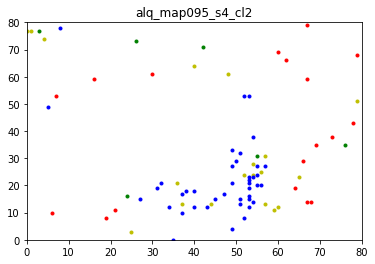

[21.4, 7.1, 48.8, 22.6]


Currently mapping.... alq_map096.csv  -->  96
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  16
Total percentage of lab  1  =  42.10526315789473 %
Total no. of lab  2  =  3
Total percentage of lab  2  =  7.894736842105263 %
Total no. of lab  3  =  9
Total percentage of lab  3  =  23.684210526315788 %
Total no. of lab  4  =  10
Total percentage of lab  4  =  26.31578947368421 %
map saved!!


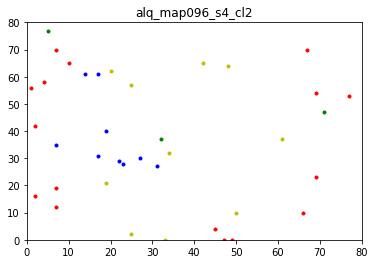

[42.1, 7.9, 23.7, 26.3]


Currently mapping.... alq_map097.csv  -->  97
Total no. of points to label.... 47
Label Analysis:-
Total no. of labels:  47
Total no. of lab  1  =  20
Total percentage of lab  1  =  42.5531914893617 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  17.02127659574468 %
Total no. of lab  3  =  13
Total percentage of lab  3  =  27.659574468085108 %
Total no. of lab  4  =  6
Total percentage of lab  4  =  12.76595744680851 %
map saved!!


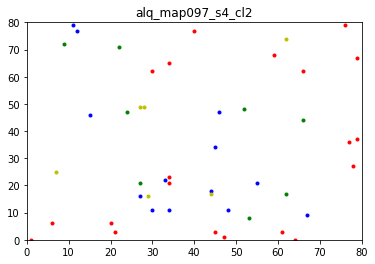

[42.6, 17.0, 27.7, 12.8]


Currently mapping.... alq_map098.csv  -->  98
Total no. of points to label.... 88
Label Analysis:-
Total no. of labels:  88
Total no. of lab  1  =  47
Total percentage of lab  1  =  53.40909090909091 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  15.909090909090908 %
Total no. of lab  3  =  20
Total percentage of lab  3  =  22.727272727272727 %
Total no. of lab  4  =  7
Total percentage of lab  4  =  7.954545454545454 %
map saved!!


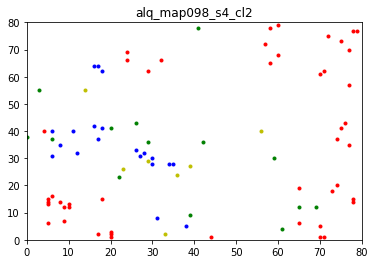

[53.4, 15.9, 22.7, 8.0]


Currently mapping.... alq_map099.csv  -->  99
Total no. of points to label.... 64
Label Analysis:-
Total no. of labels:  64
Total no. of lab  1  =  23
Total percentage of lab  1  =  35.9375 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  14.0625 %
Total no. of lab  3  =  13
Total percentage of lab  3  =  20.3125 %
Total no. of lab  4  =  19
Total percentage of lab  4  =  29.6875 %
map saved!!


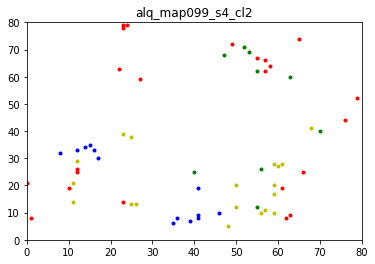

[35.9, 14.1, 20.3, 29.7]


Currently mapping.... alq_map100.csv  -->  100
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  23
Total percentage of lab  1  =  44.230769230769226 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  23.076923076923077 %
Total no. of lab  3  =  13
Total percentage of lab  3  =  25.0 %
Total no. of lab  4  =  4
Total percentage of lab  4  =  7.6923076923076925 %
map saved!!


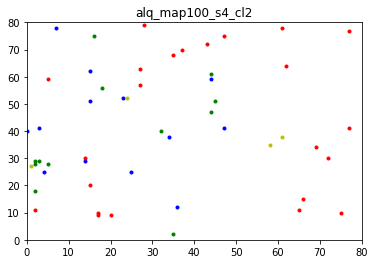

[44.2, 23.1, 25.0, 7.7]


Currently mapping.... alq_map101.csv  -->  101
Total no. of points to label.... 69
Label Analysis:-
Total no. of labels:  69
Total no. of lab  1  =  37
Total percentage of lab  1  =  53.62318840579711 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  18.84057971014493 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  10.144927536231885 %
Total no. of lab  4  =  12
Total percentage of lab  4  =  17.391304347826086 %
map saved!!


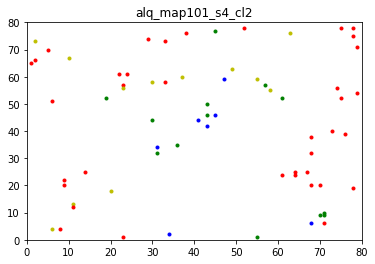

[53.6, 18.8, 10.1, 17.4]


Currently mapping.... alq_map102.csv  -->  102
Total no. of points to label.... 71
Label Analysis:-
Total no. of labels:  71
Total no. of lab  1  =  37
Total percentage of lab  1  =  52.112676056338024 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  12.676056338028168 %
Total no. of lab  3  =  6
Total percentage of lab  3  =  8.450704225352112 %
Total no. of lab  4  =  19
Total percentage of lab  4  =  26.76056338028169 %
map saved!!


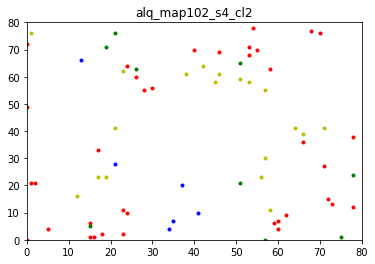

[52.1, 12.7, 8.5, 26.8]


Currently mapping.... alq_map103.csv  -->  103
Total no. of points to label.... 42
Label Analysis:-
Total no. of labels:  42
Total no. of lab  1  =  18
Total percentage of lab  1  =  42.857142857142854 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  11.904761904761903 %
Total no. of lab  3  =  13
Total percentage of lab  3  =  30.952380952380953 %
Total no. of lab  4  =  6
Total percentage of lab  4  =  14.285714285714285 %
map saved!!


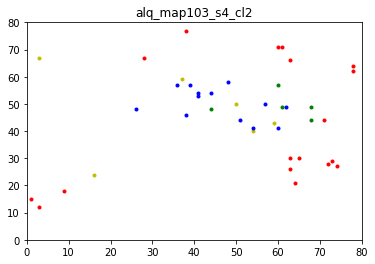

[42.9, 11.9, 31.0, 14.3]


Currently mapping.... alq_map104.csv  -->  104
Total no. of points to label.... 68
Label Analysis:-
Total no. of labels:  68
Total no. of lab  1  =  38
Total percentage of lab  1  =  55.88235294117647 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  13.23529411764706 %
Total no. of lab  3  =  2
Total percentage of lab  3  =  2.941176470588235 %
Total no. of lab  4  =  19
Total percentage of lab  4  =  27.941176470588236 %
map saved!!


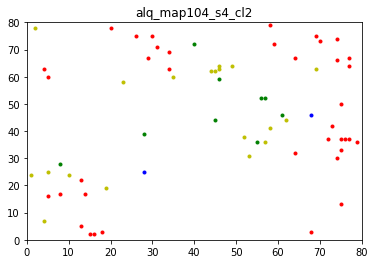

[55.9, 13.2, 2.9, 27.9]


Currently mapping.... alq_map105.csv  -->  105
Total no. of points to label.... 59
Label Analysis:-
Total no. of labels:  59
Total no. of lab  1  =  24
Total percentage of lab  1  =  40.67796610169492 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  6.779661016949152 %
Total no. of lab  3  =  14
Total percentage of lab  3  =  23.728813559322035 %
Total no. of lab  4  =  17
Total percentage of lab  4  =  28.8135593220339 %
map saved!!


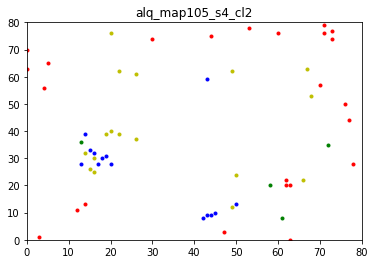

[40.7, 6.8, 23.7, 28.8]


Currently mapping.... alq_map106.csv  -->  106
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  32
Total percentage of lab  1  =  52.459016393442624 %
Total no. of lab  2  =  3
Total percentage of lab  2  =  4.918032786885246 %
Total no. of lab  3  =  12
Total percentage of lab  3  =  19.672131147540984 %
Total no. of lab  4  =  14
Total percentage of lab  4  =  22.950819672131146 %
map saved!!


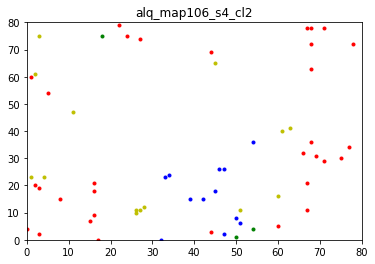

[52.5, 4.9, 19.7, 23.0]


Currently mapping.... alq_map107.csv  -->  107
Total no. of points to label.... 55
Label Analysis:-
Total no. of labels:  55
Total no. of lab  1  =  27
Total percentage of lab  1  =  49.09090909090909 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  9.090909090909092 %
Total no. of lab  3  =  8
Total percentage of lab  3  =  14.545454545454545 %
Total no. of lab  4  =  15
Total percentage of lab  4  =  27.27272727272727 %
map saved!!


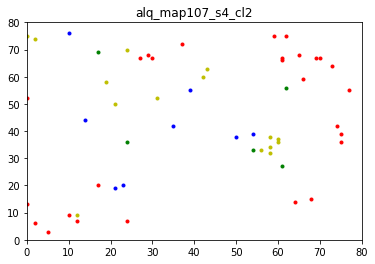

[49.1, 9.1, 14.5, 27.3]


Currently mapping.... alq_map108.csv  -->  108
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  39
Total percentage of lab  1  =  47.5609756097561 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  10.975609756097562 %
Total no. of lab  3  =  9
Total percentage of lab  3  =  10.975609756097562 %
Total no. of lab  4  =  25
Total percentage of lab  4  =  30.48780487804878 %
map saved!!


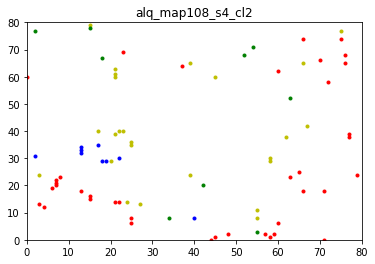

[47.6, 11.0, 11.0, 30.5]


Currently mapping.... alq_map109.csv  -->  109
Total no. of points to label.... 95
Label Analysis:-
Total no. of labels:  95
Total no. of lab  1  =  29
Total percentage of lab  1  =  30.526315789473685 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  17.894736842105264 %
Total no. of lab  3  =  21
Total percentage of lab  3  =  22.105263157894736 %
Total no. of lab  4  =  28
Total percentage of lab  4  =  29.47368421052631 %
map saved!!


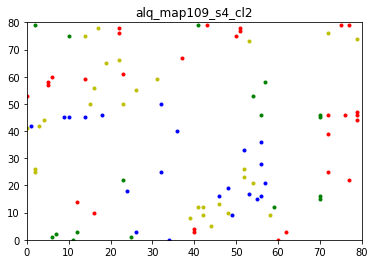

[30.5, 17.9, 22.1, 29.5]


Currently mapping.... alq_map110.csv  -->  110
Total no. of points to label.... 77
Label Analysis:-
Total no. of labels:  77
Total no. of lab  1  =  31
Total percentage of lab  1  =  40.25974025974026 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  12.987012987012985 %
Total no. of lab  3  =  11
Total percentage of lab  3  =  14.285714285714285 %
Total no. of lab  4  =  25
Total percentage of lab  4  =  32.467532467532465 %
map saved!!


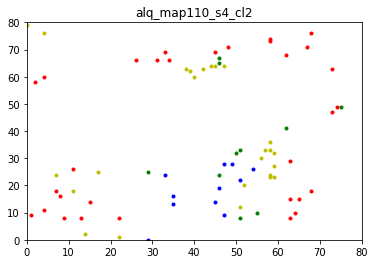

[40.3, 13.0, 14.3, 32.5]


Currently mapping.... alq_map111.csv  -->  111
Total no. of points to label.... 141
Label Analysis:-
Total no. of labels:  141
Total no. of lab  1  =  29
Total percentage of lab  1  =  20.56737588652482 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  9.929078014184398 %
Total no. of lab  3  =  64
Total percentage of lab  3  =  45.39007092198582 %
Total no. of lab  4  =  34
Total percentage of lab  4  =  24.113475177304963 %
map saved!!


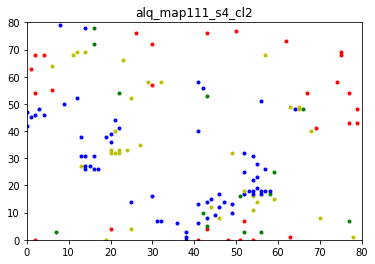

[20.6, 9.9, 45.4, 24.1]


Currently mapping.... alq_map112.csv  -->  112
Total no. of points to label.... 96
Label Analysis:-
Total no. of labels:  96
Total no. of lab  1  =  52
Total percentage of lab  1  =  54.166666666666664 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  10.416666666666668 %
Total no. of lab  3  =  9
Total percentage of lab  3  =  9.375 %
Total no. of lab  4  =  25
Total percentage of lab  4  =  26.041666666666668 %
map saved!!


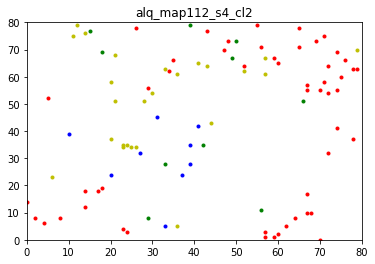

[54.2, 10.4, 9.4, 26.0]


Currently mapping.... alq_map113.csv  -->  113
Total no. of points to label.... 76
Label Analysis:-
Total no. of labels:  76
Total no. of lab  1  =  35
Total percentage of lab  1  =  46.05263157894737 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  11.842105263157894 %
Total no. of lab  3  =  12
Total percentage of lab  3  =  15.789473684210526 %
Total no. of lab  4  =  20
Total percentage of lab  4  =  26.31578947368421 %
map saved!!


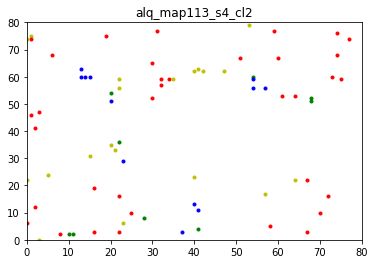

[46.1, 11.8, 15.8, 26.3]


Currently mapping.... alq_map114.csv  -->  114
Total no. of points to label.... 71
Label Analysis:-
Total no. of labels:  71
Total no. of lab  1  =  42
Total percentage of lab  1  =  59.154929577464785 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  8.450704225352112 %
Total no. of lab  3  =  13
Total percentage of lab  3  =  18.30985915492958 %
Total no. of lab  4  =  10
Total percentage of lab  4  =  14.084507042253522 %
map saved!!


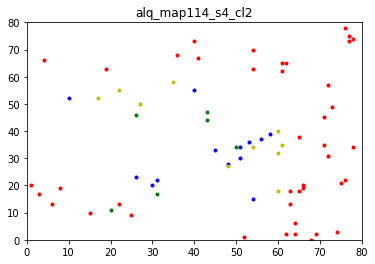

[59.2, 8.5, 18.3, 14.1]


Currently mapping.... alq_map115.csv  -->  115
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  20
Total percentage of lab  1  =  24.390243902439025 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  12.195121951219512 %
Total no. of lab  3  =  11
Total percentage of lab  3  =  13.414634146341465 %
Total no. of lab  4  =  41
Total percentage of lab  4  =  50.0 %
map saved!!


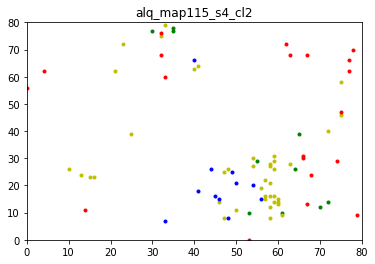

[24.4, 12.2, 13.4, 50.0]


Currently mapping.... alq_map116.csv  -->  116
Total no. of points to label.... 112
Label Analysis:-
Total no. of labels:  112
Total no. of lab  1  =  35
Total percentage of lab  1  =  31.25 %
Total no. of lab  2  =  28
Total percentage of lab  2  =  25.0 %
Total no. of lab  3  =  46
Total percentage of lab  3  =  41.07142857142857 %
Total no. of lab  4  =  3
Total percentage of lab  4  =  2.6785714285714284 %
map saved!!


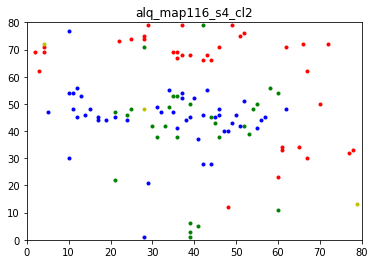

[31.2, 25.0, 41.1, 2.7]


Currently mapping.... alq_map117.csv  -->  117
Total no. of points to label.... 93
Label Analysis:-
Total no. of labels:  93
Total no. of lab  1  =  33
Total percentage of lab  1  =  35.483870967741936 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  16.129032258064516 %
Total no. of lab  3  =  13
Total percentage of lab  3  =  13.978494623655912 %
Total no. of lab  4  =  32
Total percentage of lab  4  =  34.40860215053764 %
map saved!!


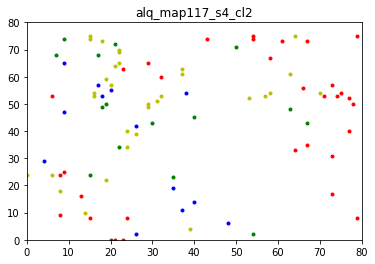

[35.5, 16.1, 14.0, 34.4]


Currently mapping.... alq_map118.csv  -->  118
Total no. of points to label.... 108
Label Analysis:-
Total no. of labels:  108
Total no. of lab  1  =  52
Total percentage of lab  1  =  48.148148148148145 %
Total no. of lab  2  =  27
Total percentage of lab  2  =  25.0 %
Total no. of lab  3  =  16
Total percentage of lab  3  =  14.814814814814813 %
Total no. of lab  4  =  13
Total percentage of lab  4  =  12.037037037037036 %
map saved!!


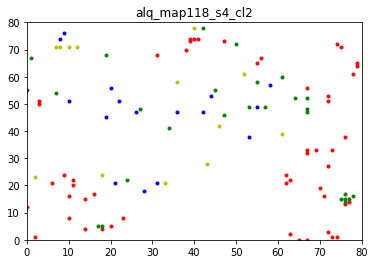

[48.1, 25.0, 14.8, 12.0]


Currently mapping.... alq_map119.csv  -->  119
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  24
Total percentage of lab  1  =  32.0 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  14.666666666666666 %
Total no. of lab  3  =  4
Total percentage of lab  3  =  5.333333333333334 %
Total no. of lab  4  =  36
Total percentage of lab  4  =  48.0 %
map saved!!


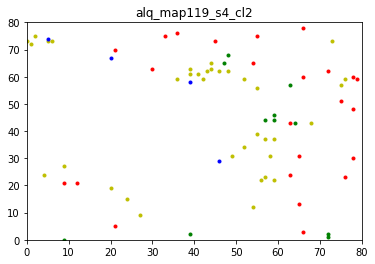

[32.0, 14.7, 5.3, 48.0]




In [66]:
alq_s4 = pseudo_classifier_label(num_npy, s4_remap['al_s4l'], tr_map['aln_re_id.csv'], alq_map, 
                                 80, "_s4_cl2", "results", True)

Currently mapping.... alq_map000.csv  -->  0
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  16
Total percentage of lab  1  =  43.24324324324324 %
Total no. of lab  2  =  1
Total percentage of lab  2  =  2.7027027027027026 %
Total no. of lab  3  =  9
Total percentage of lab  3  =  24.324324324324326 %
Total no. of lab  4  =  6
Total percentage of lab  4  =  16.216216216216218 %
Total no. of lab  5  =  5
Total percentage of lab  5  =  13.513513513513514 %
map saved!!


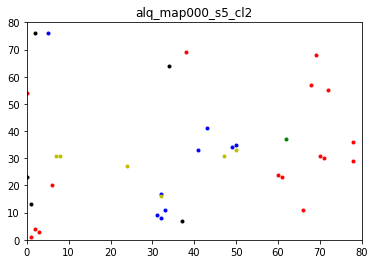

[43.2, 2.7, 24.3, 16.2, 13.5]


Currently mapping.... alq_map001.csv  -->  1
Total no. of points to label.... 30
Label Analysis:-
Total no. of labels:  30
Total no. of lab  1  =  11
Total percentage of lab  1  =  36.666666666666664 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  23.333333333333332 %
Total no. of lab  3  =  9
Total percentage of lab  3  =  30.0 %
Total no. of lab  4  =  3
Total percentage of lab  4  =  10.0 %
map saved!!


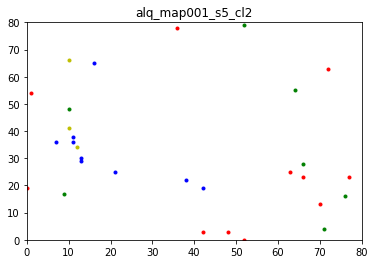

[36.7, 23.3, 30.0, 10.0]


Currently mapping.... alq_map002.csv  -->  2
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  11
Total percentage of lab  1  =  40.74074074074074 %
Total no. of lab  2  =  2
Total percentage of lab  2  =  7.4074074074074066 %
Total no. of lab  3  =  11
Total percentage of lab  3  =  40.74074074074074 %
Total no. of lab  4  =  2
Total percentage of lab  4  =  7.4074074074074066 %
Total no. of lab  5  =  1
Total percentage of lab  5  =  3.7037037037037033 %
map saved!!


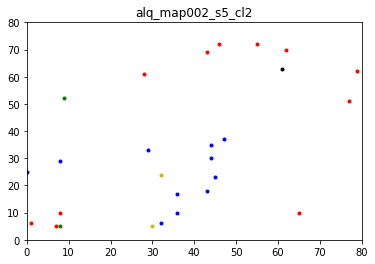

[40.7, 7.4, 40.7, 7.4, 3.7]


Currently mapping.... alq_map003.csv  -->  3
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  13
Total percentage of lab  1  =  32.5 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  20.0 %
Total no. of lab  3  =  10
Total percentage of lab  3  =  25.0 %
Total no. of lab  4  =  4
Total percentage of lab  4  =  10.0 %
Total no. of lab  5  =  5
Total percentage of lab  5  =  12.5 %
map saved!!


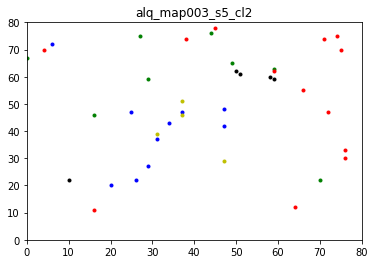

[32.5, 20.0, 25.0, 10.0, 12.5]


Currently mapping.... alq_map004.csv  -->  4
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  13
Total percentage of lab  1  =  48.148148148148145 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  22.22222222222222 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  18.51851851851852 %
Total no. of lab  4  =  0
Total percentage of lab  4  =  0.0 %
Total no. of lab  5  =  3
Total percentage of lab  5  =  11.11111111111111 %
map saved!!


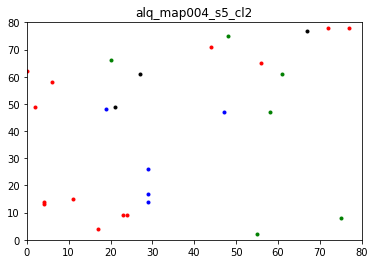

[48.1, 22.2, 18.5, 0.0, 11.1]


Currently mapping.... alq_map005.csv  -->  5
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  12
Total percentage of lab  1  =  37.5 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  28.125 %
Total no. of lab  3  =  4
Total percentage of lab  3  =  12.5 %
Total no. of lab  4  =  2
Total percentage of lab  4  =  6.25 %
Total no. of lab  5  =  5
Total percentage of lab  5  =  15.625 %
map saved!!


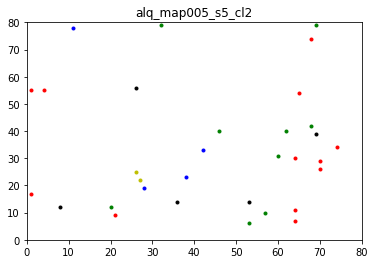

[37.5, 28.1, 12.5, 6.2, 15.6]


Currently mapping.... alq_map006.csv  -->  6
Total no. of points to label.... 14
Label Analysis:-
Total no. of labels:  14
Total no. of lab  1  =  4
Total percentage of lab  1  =  28.57142857142857 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  28.57142857142857 %
Total no. of lab  3  =  4
Total percentage of lab  3  =  28.57142857142857 %
Total no. of lab  4  =  1
Total percentage of lab  4  =  7.142857142857142 %
Total no. of lab  5  =  1
Total percentage of lab  5  =  7.142857142857142 %
map saved!!


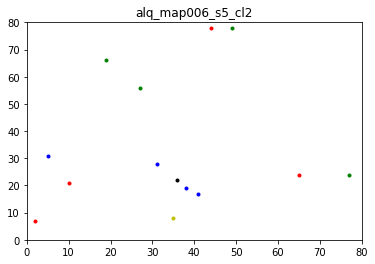

[28.6, 28.6, 28.6, 7.1, 7.1]


Currently mapping.... alq_map007.csv  -->  7
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  18
Total percentage of lab  1  =  58.06451612903226 %
Total no. of lab  2  =  2
Total percentage of lab  2  =  6.451612903225806 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  16.129032258064516 %
Total no. of lab  4  =  5
Total percentage of lab  4  =  16.129032258064516 %
Total no. of lab  5  =  1
Total percentage of lab  5  =  3.225806451612903 %
map saved!!


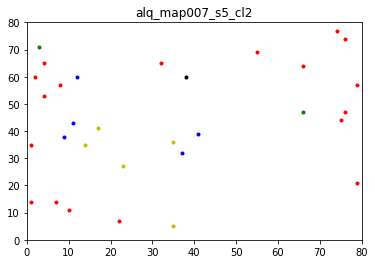

[58.1, 6.5, 16.1, 16.1, 3.2]


Currently mapping.... alq_map008.csv  -->  8
Total no. of points to label.... 39
Label Analysis:-
Total no. of labels:  39
Total no. of lab  1  =  8
Total percentage of lab  1  =  20.51282051282051 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  20.51282051282051 %
Total no. of lab  3  =  3
Total percentage of lab  3  =  7.6923076923076925 %
Total no. of lab  4  =  8
Total percentage of lab  4  =  20.51282051282051 %
Total no. of lab  5  =  12
Total percentage of lab  5  =  30.76923076923077 %
map saved!!


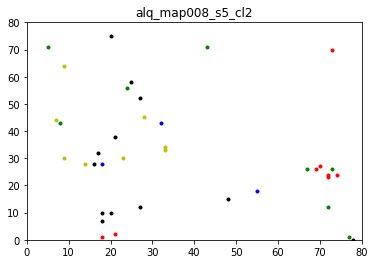

[20.5, 20.5, 7.7, 20.5, 30.8]


Currently mapping.... alq_map009.csv  -->  9
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  14
Total percentage of lab  1  =  34.146341463414636 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  29.268292682926827 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  17.073170731707318 %
Total no. of lab  4  =  7
Total percentage of lab  4  =  17.073170731707318 %
Total no. of lab  5  =  1
Total percentage of lab  5  =  2.4390243902439024 %
map saved!!


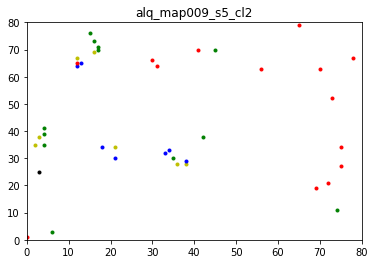

[34.1, 29.3, 17.1, 17.1, 2.4]


Currently mapping.... alq_map010.csv  -->  10
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  14
Total percentage of lab  1  =  45.16129032258064 %
Total no. of lab  2  =  2
Total percentage of lab  2  =  6.451612903225806 %
Total no. of lab  3  =  10
Total percentage of lab  3  =  32.25806451612903 %
Total no. of lab  4  =  2
Total percentage of lab  4  =  6.451612903225806 %
Total no. of lab  5  =  3
Total percentage of lab  5  =  9.67741935483871 %
map saved!!


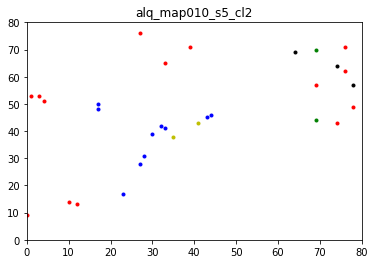

[45.2, 6.5, 32.3, 6.5, 9.7]


Currently mapping.... alq_map011.csv  -->  11
Total no. of points to label.... 39
Label Analysis:-
Total no. of labels:  39
Total no. of lab  1  =  11
Total percentage of lab  1  =  28.205128205128204 %
Total no. of lab  2  =  2
Total percentage of lab  2  =  5.128205128205128 %
Total no. of lab  3  =  13
Total percentage of lab  3  =  33.33333333333333 %
Total no. of lab  4  =  5
Total percentage of lab  4  =  12.82051282051282 %
Total no. of lab  5  =  8
Total percentage of lab  5  =  20.51282051282051 %
map saved!!


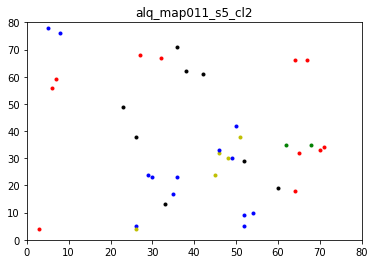

[28.2, 5.1, 33.3, 12.8, 20.5]


Currently mapping.... alq_map012.csv  -->  12
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  11
Total percentage of lab  1  =  25.581395348837212 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  9.30232558139535 %
Total no. of lab  3  =  17
Total percentage of lab  3  =  39.53488372093023 %
Total no. of lab  4  =  3
Total percentage of lab  4  =  6.976744186046512 %
Total no. of lab  5  =  8
Total percentage of lab  5  =  18.6046511627907 %
map saved!!


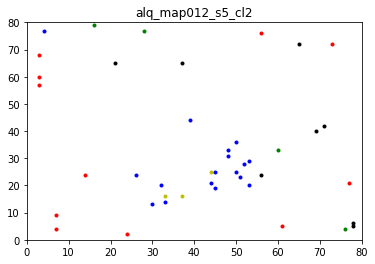

[25.6, 9.3, 39.5, 7.0, 18.6]


Currently mapping.... alq_map013.csv  -->  13
Total no. of points to label.... 29
Label Analysis:-
Total no. of labels:  29
Total no. of lab  1  =  12
Total percentage of lab  1  =  41.37931034482759 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  37.93103448275862 %
Total no. of lab  3  =  4
Total percentage of lab  3  =  13.793103448275861 %
Total no. of lab  4  =  1
Total percentage of lab  4  =  3.4482758620689653 %
Total no. of lab  5  =  1
Total percentage of lab  5  =  3.4482758620689653 %
map saved!!


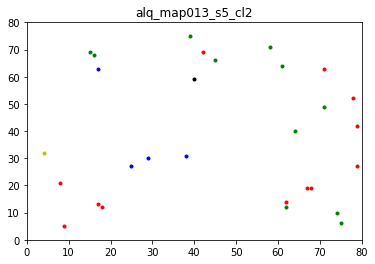

[41.4, 37.9, 13.8, 3.4, 3.4]


Currently mapping.... alq_map014.csv  -->  14
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  8
Total percentage of lab  1  =  22.22222222222222 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  19.444444444444446 %
Total no. of lab  3  =  14
Total percentage of lab  3  =  38.88888888888889 %
Total no. of lab  4  =  5
Total percentage of lab  4  =  13.88888888888889 %
Total no. of lab  5  =  2
Total percentage of lab  5  =  5.555555555555555 %
map saved!!


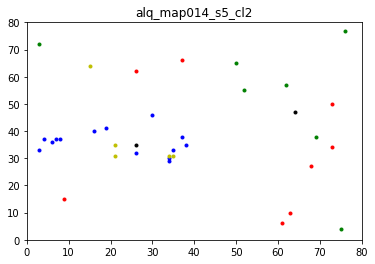

[22.2, 19.4, 38.9, 13.9, 5.6]


Currently mapping.... alq_map015.csv  -->  15
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  16
Total percentage of lab  1  =  26.666666666666668 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  8.333333333333332 %
Total no. of lab  3  =  14
Total percentage of lab  3  =  23.333333333333332 %
Total no. of lab  4  =  14
Total percentage of lab  4  =  23.333333333333332 %
Total no. of lab  5  =  11
Total percentage of lab  5  =  18.333333333333332 %
map saved!!


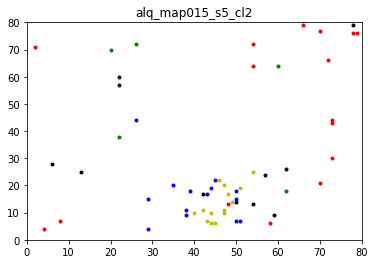

[26.7, 8.3, 23.3, 23.3, 18.3]


Currently mapping.... alq_map016.csv  -->  16
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  14
Total percentage of lab  1  =  37.83783783783784 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  18.91891891891892 %
Total no. of lab  3  =  8
Total percentage of lab  3  =  21.62162162162162 %
Total no. of lab  4  =  5
Total percentage of lab  4  =  13.513513513513514 %
Total no. of lab  5  =  3
Total percentage of lab  5  =  8.108108108108109 %
map saved!!


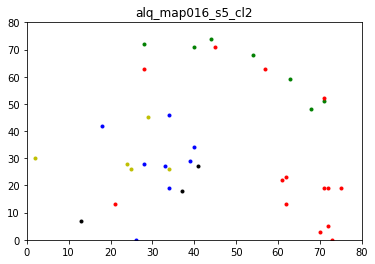

[37.8, 18.9, 21.6, 13.5, 8.1]


Currently mapping.... alq_map017.csv  -->  17
Total no. of points to label.... 26
Label Analysis:-
Total no. of labels:  26
Total no. of lab  1  =  6
Total percentage of lab  1  =  23.076923076923077 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  15.384615384615385 %
Total no. of lab  3  =  8
Total percentage of lab  3  =  30.76923076923077 %
Total no. of lab  4  =  2
Total percentage of lab  4  =  7.6923076923076925 %
Total no. of lab  5  =  6
Total percentage of lab  5  =  23.076923076923077 %
map saved!!


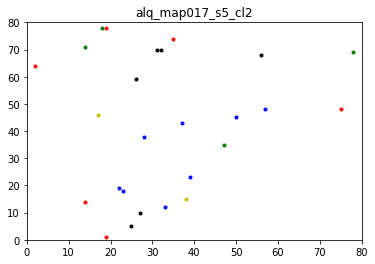

[23.1, 15.4, 30.8, 7.7, 23.1]


Currently mapping.... alq_map018.csv  -->  18
Total no. of points to label.... 51
Label Analysis:-
Total no. of labels:  51
Total no. of lab  1  =  11
Total percentage of lab  1  =  21.568627450980394 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  7.8431372549019605 %
Total no. of lab  3  =  29
Total percentage of lab  3  =  56.86274509803921 %
Total no. of lab  4  =  5
Total percentage of lab  4  =  9.803921568627452 %
Total no. of lab  5  =  2
Total percentage of lab  5  =  3.9215686274509802 %
map saved!!


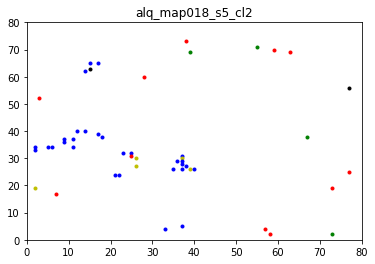

[21.6, 7.8, 56.9, 9.8, 3.9]


Currently mapping.... alq_map019.csv  -->  19
Total no. of points to label.... 17
Label Analysis:-
Total no. of labels:  17
Total no. of lab  1  =  3
Total percentage of lab  1  =  17.647058823529413 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  35.294117647058826 %
Total no. of lab  3  =  3
Total percentage of lab  3  =  17.647058823529413 %
Total no. of lab  4  =  1
Total percentage of lab  4  =  5.88235294117647 %
Total no. of lab  5  =  4
Total percentage of lab  5  =  23.52941176470588 %
map saved!!


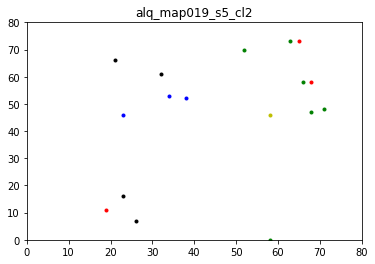

[17.6, 35.3, 17.6, 5.9, 23.5]


Currently mapping.... alq_map020.csv  -->  20
Total no. of points to label.... 33
Label Analysis:-
Total no. of labels:  33
Total no. of lab  1  =  12
Total percentage of lab  1  =  36.36363636363637 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  21.21212121212121 %
Total no. of lab  3  =  11
Total percentage of lab  3  =  33.33333333333333 %
Total no. of lab  4  =  2
Total percentage of lab  4  =  6.0606060606060606 %
Total no. of lab  5  =  1
Total percentage of lab  5  =  3.0303030303030303 %
map saved!!


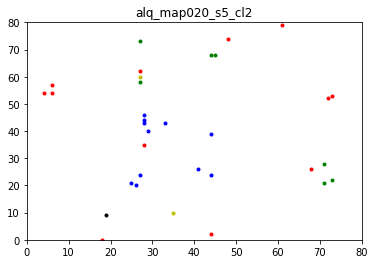

[36.4, 21.2, 33.3, 6.1, 3.0]


Currently mapping.... alq_map021.csv  -->  21
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  19
Total percentage of lab  1  =  46.34146341463415 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  21.951219512195124 %
Total no. of lab  3  =  9
Total percentage of lab  3  =  21.951219512195124 %
Total no. of lab  4  =  3
Total percentage of lab  4  =  7.317073170731707 %
Total no. of lab  5  =  1
Total percentage of lab  5  =  2.4390243902439024 %
map saved!!


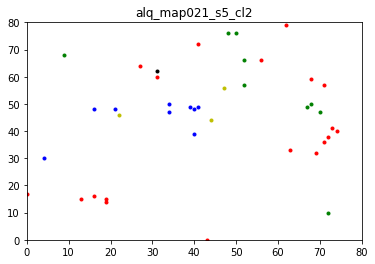

[46.3, 22.0, 22.0, 7.3, 2.4]


Currently mapping.... alq_map022.csv  -->  22
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  14
Total percentage of lab  1  =  43.75 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  21.875 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  15.625 %
Total no. of lab  4  =  2
Total percentage of lab  4  =  6.25 %
Total no. of lab  5  =  4
Total percentage of lab  5  =  12.5 %
map saved!!


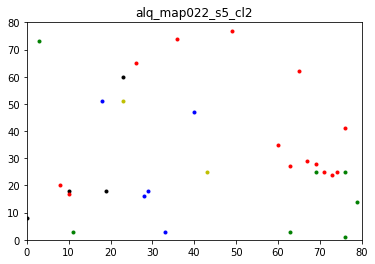

[43.8, 21.9, 15.6, 6.2, 12.5]


Currently mapping.... alq_map023.csv  -->  23
Total no. of points to label.... 28
Label Analysis:-
Total no. of labels:  28
Total no. of lab  1  =  11
Total percentage of lab  1  =  39.285714285714285 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  14.285714285714285 %
Total no. of lab  3  =  6
Total percentage of lab  3  =  21.428571428571427 %
Total no. of lab  4  =  4
Total percentage of lab  4  =  14.285714285714285 %
Total no. of lab  5  =  3
Total percentage of lab  5  =  10.714285714285714 %
map saved!!


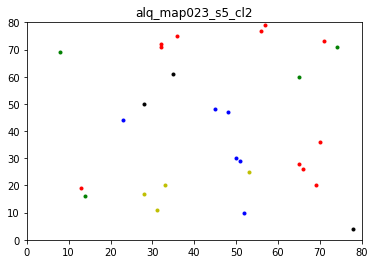

[39.3, 14.3, 21.4, 14.3, 10.7]


Currently mapping.... alq_map024.csv  -->  24
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  11
Total percentage of lab  1  =  34.375 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  25.0 %
Total no. of lab  3  =  8
Total percentage of lab  3  =  25.0 %
Total no. of lab  4  =  1
Total percentage of lab  4  =  3.125 %
Total no. of lab  5  =  4
Total percentage of lab  5  =  12.5 %
map saved!!


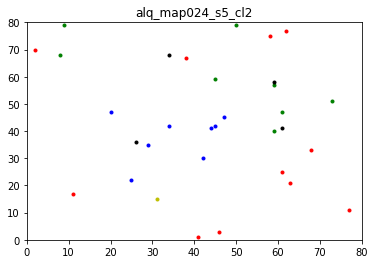

[34.4, 25.0, 25.0, 3.1, 12.5]


Currently mapping.... alq_map025.csv  -->  25
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  14
Total percentage of lab  1  =  32.55813953488372 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  11.627906976744185 %
Total no. of lab  3  =  8
Total percentage of lab  3  =  18.6046511627907 %
Total no. of lab  4  =  8
Total percentage of lab  4  =  18.6046511627907 %
Total no. of lab  5  =  8
Total percentage of lab  5  =  18.6046511627907 %
map saved!!


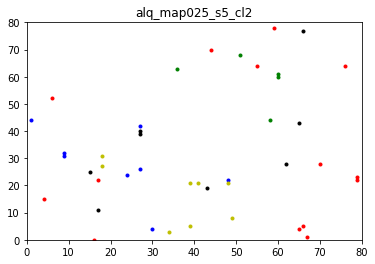

[32.6, 11.6, 18.6, 18.6, 18.6]


Currently mapping.... alq_map026.csv  -->  26
Total no. of points to label.... 32
Label Analysis:-
Total no. of labels:  32
Total no. of lab  1  =  10
Total percentage of lab  1  =  31.25 %
Total no. of lab  2  =  2
Total percentage of lab  2  =  6.25 %
Total no. of lab  3  =  16
Total percentage of lab  3  =  50.0 %
Total no. of lab  4  =  3
Total percentage of lab  4  =  9.375 %
Total no. of lab  5  =  1
Total percentage of lab  5  =  3.125 %
map saved!!


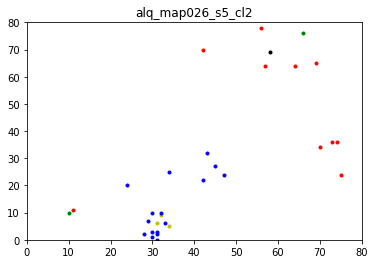

[31.2, 6.2, 50.0, 9.4, 3.1]


Currently mapping.... alq_map027.csv  -->  27
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  14
Total percentage of lab  1  =  38.88888888888889 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  19.444444444444446 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  19.444444444444446 %
Total no. of lab  4  =  1
Total percentage of lab  4  =  2.7777777777777777 %
Total no. of lab  5  =  7
Total percentage of lab  5  =  19.444444444444446 %
map saved!!


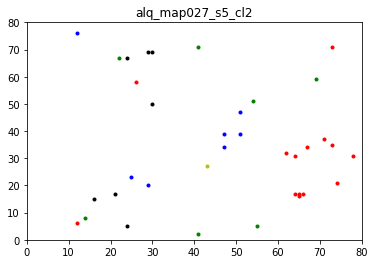

[38.9, 19.4, 19.4, 2.8, 19.4]


Currently mapping.... alq_map028.csv  -->  28
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  12
Total percentage of lab  1  =  23.076923076923077 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  15.384615384615385 %
Total no. of lab  3  =  13
Total percentage of lab  3  =  25.0 %
Total no. of lab  4  =  12
Total percentage of lab  4  =  23.076923076923077 %
Total no. of lab  5  =  7
Total percentage of lab  5  =  13.461538461538462 %
map saved!!


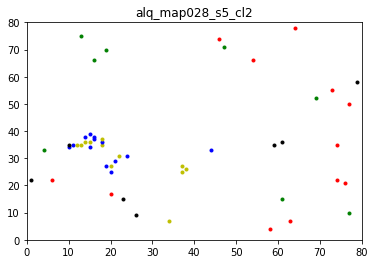

[23.1, 15.4, 25.0, 23.1, 13.5]


Currently mapping.... alq_map029.csv  -->  29
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  15
Total percentage of lab  1  =  34.883720930232556 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  23.25581395348837 %
Total no. of lab  3  =  13
Total percentage of lab  3  =  30.23255813953488 %
Total no. of lab  4  =  3
Total percentage of lab  4  =  6.976744186046512 %
Total no. of lab  5  =  2
Total percentage of lab  5  =  4.651162790697675 %
map saved!!


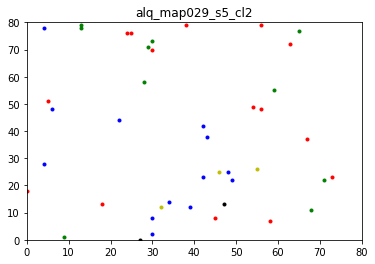

[34.9, 23.3, 30.2, 7.0, 4.7]


Currently mapping.... alq_map030.csv  -->  30
Total no. of points to label.... 54
Label Analysis:-
Total no. of labels:  54
Total no. of lab  1  =  12
Total percentage of lab  1  =  22.22222222222222 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  7.4074074074074066 %
Total no. of lab  3  =  10
Total percentage of lab  3  =  18.51851851851852 %
Total no. of lab  4  =  21
Total percentage of lab  4  =  38.88888888888889 %
Total no. of lab  5  =  7
Total percentage of lab  5  =  12.962962962962962 %
map saved!!


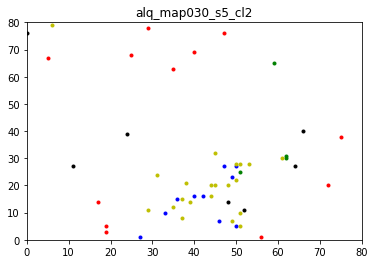

[22.2, 7.4, 18.5, 38.9, 13.0]


Currently mapping.... alq_map031.csv  -->  31
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  18
Total percentage of lab  1  =  43.90243902439025 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  26.82926829268293 %
Total no. of lab  3  =  1
Total percentage of lab  3  =  2.4390243902439024 %
Total no. of lab  4  =  3
Total percentage of lab  4  =  7.317073170731707 %
Total no. of lab  5  =  8
Total percentage of lab  5  =  19.51219512195122 %
map saved!!


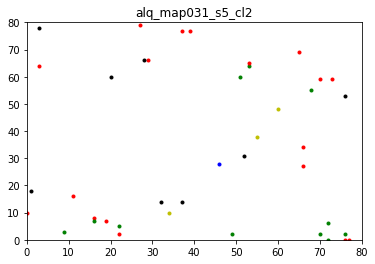

[43.9, 26.8, 2.4, 7.3, 19.5]


Currently mapping.... alq_map032.csv  -->  32
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  11
Total percentage of lab  1  =  18.333333333333332 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  6.666666666666667 %
Total no. of lab  3  =  19
Total percentage of lab  3  =  31.666666666666664 %
Total no. of lab  4  =  20
Total percentage of lab  4  =  33.33333333333333 %
Total no. of lab  5  =  6
Total percentage of lab  5  =  10.0 %
map saved!!


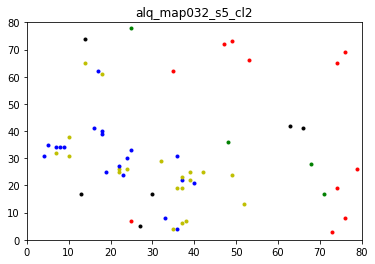

[18.3, 6.7, 31.7, 33.3, 10.0]


Currently mapping.... alq_map033.csv  -->  33
Total no. of points to label.... 84
Label Analysis:-
Total no. of labels:  84
Total no. of lab  1  =  9
Total percentage of lab  1  =  10.714285714285714 %
Total no. of lab  2  =  28
Total percentage of lab  2  =  33.33333333333333 %
Total no. of lab  3  =  22
Total percentage of lab  3  =  26.190476190476193 %
Total no. of lab  4  =  11
Total percentage of lab  4  =  13.095238095238097 %
Total no. of lab  5  =  14
Total percentage of lab  5  =  16.666666666666664 %
map saved!!


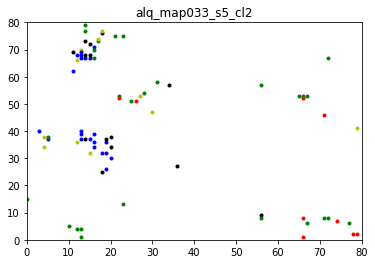

[10.7, 33.3, 26.2, 13.1, 16.7]


Currently mapping.... alq_map034.csv  -->  34
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  13
Total percentage of lab  1  =  25.0 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  9.615384615384617 %
Total no. of lab  3  =  14
Total percentage of lab  3  =  26.923076923076923 %
Total no. of lab  4  =  15
Total percentage of lab  4  =  28.846153846153843 %
Total no. of lab  5  =  5
Total percentage of lab  5  =  9.615384615384617 %
map saved!!


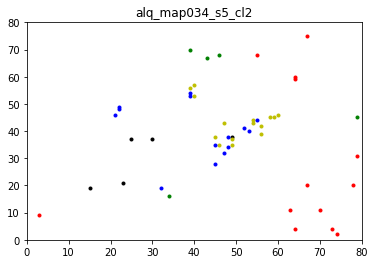

[25.0, 9.6, 26.9, 28.8, 9.6]


Currently mapping.... alq_map035.csv  -->  35
Total no. of points to label.... 64
Label Analysis:-
Total no. of labels:  64
Total no. of lab  1  =  26
Total percentage of lab  1  =  40.625 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  9.375 %
Total no. of lab  3  =  12
Total percentage of lab  3  =  18.75 %
Total no. of lab  4  =  10
Total percentage of lab  4  =  15.625 %
Total no. of lab  5  =  10
Total percentage of lab  5  =  15.625 %
map saved!!


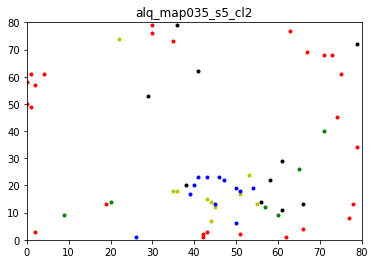

[40.6, 9.4, 18.8, 15.6, 15.6]


Currently mapping.... alq_map036.csv  -->  36
Total no. of points to label.... 69
Label Analysis:-
Total no. of labels:  69
Total no. of lab  1  =  11
Total percentage of lab  1  =  15.942028985507244 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  13.043478260869565 %
Total no. of lab  3  =  44
Total percentage of lab  3  =  63.76811594202898 %
Total no. of lab  4  =  3
Total percentage of lab  4  =  4.3478260869565215 %
Total no. of lab  5  =  2
Total percentage of lab  5  =  2.898550724637681 %
map saved!!


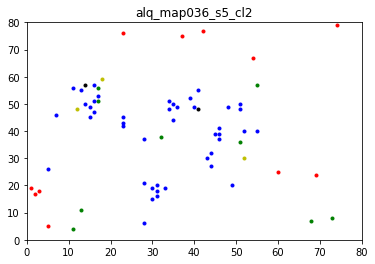

[15.9, 13.0, 63.8, 4.3, 2.9]


Currently mapping.... alq_map037.csv  -->  37
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  11
Total percentage of lab  1  =  30.555555555555557 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  13.88888888888889 %
Total no. of lab  3  =  10
Total percentage of lab  3  =  27.77777777777778 %
Total no. of lab  4  =  3
Total percentage of lab  4  =  8.333333333333332 %
Total no. of lab  5  =  7
Total percentage of lab  5  =  19.444444444444446 %
map saved!!


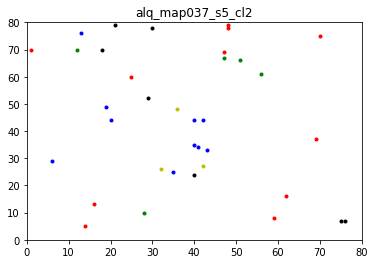

[30.6, 13.9, 27.8, 8.3, 19.4]


Currently mapping.... alq_map038.csv  -->  38
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  13
Total percentage of lab  1  =  30.23255813953488 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  13.953488372093023 %
Total no. of lab  3  =  13
Total percentage of lab  3  =  30.23255813953488 %
Total no. of lab  4  =  8
Total percentage of lab  4  =  18.6046511627907 %
Total no. of lab  5  =  3
Total percentage of lab  5  =  6.976744186046512 %
map saved!!


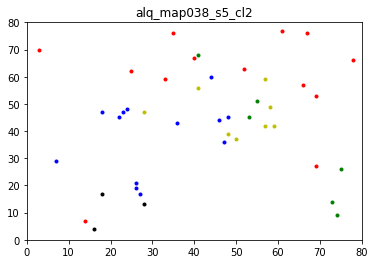

[30.2, 14.0, 30.2, 18.6, 7.0]


Currently mapping.... alq_map039.csv  -->  39
Total no. of points to label.... 46
Label Analysis:-
Total no. of labels:  46
Total no. of lab  1  =  11
Total percentage of lab  1  =  23.91304347826087 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  17.391304347826086 %
Total no. of lab  3  =  8
Total percentage of lab  3  =  17.391304347826086 %
Total no. of lab  4  =  6
Total percentage of lab  4  =  13.043478260869565 %
Total no. of lab  5  =  13
Total percentage of lab  5  =  28.26086956521739 %
map saved!!


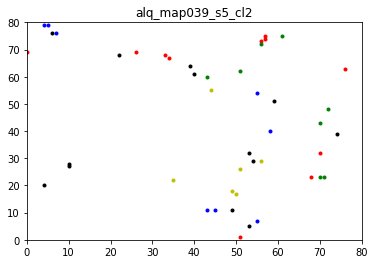

[23.9, 17.4, 17.4, 13.0, 28.3]


Currently mapping.... alq_map040.csv  -->  40
Total no. of points to label.... 31
Label Analysis:-
Total no. of labels:  31
Total no. of lab  1  =  9
Total percentage of lab  1  =  29.03225806451613 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  19.35483870967742 %
Total no. of lab  3  =  9
Total percentage of lab  3  =  29.03225806451613 %
Total no. of lab  4  =  0
Total percentage of lab  4  =  0.0 %
Total no. of lab  5  =  7
Total percentage of lab  5  =  22.58064516129032 %
map saved!!


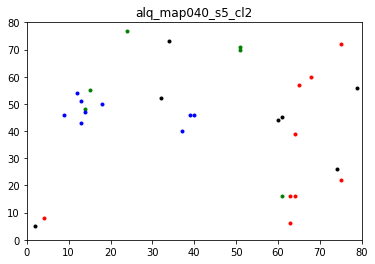

[29.0, 19.4, 29.0, 0.0, 22.6]


Currently mapping.... alq_map041.csv  -->  41
Total no. of points to label.... 34
Label Analysis:-
Total no. of labels:  34
Total no. of lab  1  =  12
Total percentage of lab  1  =  35.294117647058826 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  32.35294117647059 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  14.705882352941178 %
Total no. of lab  4  =  0
Total percentage of lab  4  =  0.0 %
Total no. of lab  5  =  6
Total percentage of lab  5  =  17.647058823529413 %
map saved!!


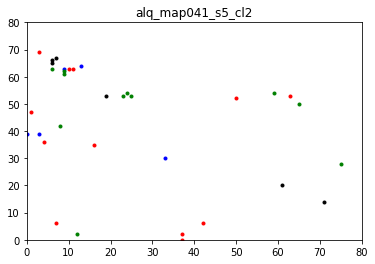

[35.3, 32.4, 14.7, 0.0, 17.6]


Currently mapping.... alq_map042.csv  -->  42
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  12
Total percentage of lab  1  =  31.57894736842105 %
Total no. of lab  2  =  1
Total percentage of lab  2  =  2.631578947368421 %
Total no. of lab  3  =  17
Total percentage of lab  3  =  44.73684210526316 %
Total no. of lab  4  =  6
Total percentage of lab  4  =  15.789473684210526 %
Total no. of lab  5  =  2
Total percentage of lab  5  =  5.263157894736842 %
map saved!!


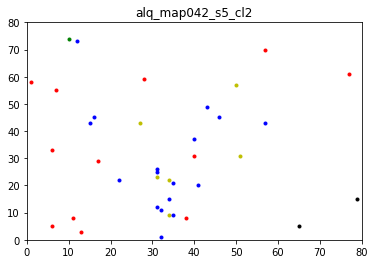

[31.6, 2.6, 44.7, 15.8, 5.3]


Currently mapping.... alq_map043.csv  -->  43
Total no. of points to label.... 27
Label Analysis:-
Total no. of labels:  27
Total no. of lab  1  =  11
Total percentage of lab  1  =  40.74074074074074 %
Total no. of lab  2  =  0
Total percentage of lab  2  =  0.0 %
Total no. of lab  3  =  6
Total percentage of lab  3  =  22.22222222222222 %
Total no. of lab  4  =  3
Total percentage of lab  4  =  11.11111111111111 %
Total no. of lab  5  =  7
Total percentage of lab  5  =  25.925925925925924 %
map saved!!


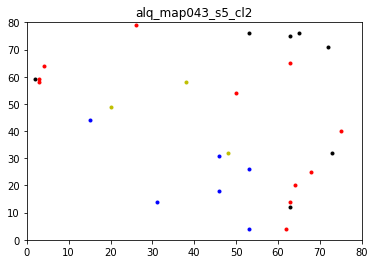

[40.7, 0.0, 22.2, 11.1, 25.9]


Currently mapping.... alq_map044.csv  -->  44
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  4
Total percentage of lab  1  =  9.75609756097561 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  21.951219512195124 %
Total no. of lab  3  =  13
Total percentage of lab  3  =  31.70731707317073 %
Total no. of lab  4  =  7
Total percentage of lab  4  =  17.073170731707318 %
Total no. of lab  5  =  8
Total percentage of lab  5  =  19.51219512195122 %
map saved!!


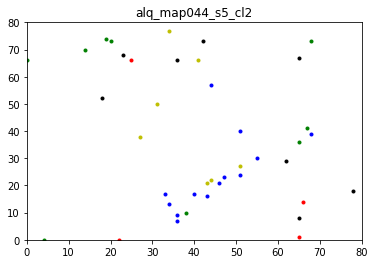

[9.8, 22.0, 31.7, 17.1, 19.5]


Currently mapping.... alq_map045.csv  -->  45
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  8
Total percentage of lab  1  =  19.51219512195122 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  14.634146341463413 %
Total no. of lab  3  =  11
Total percentage of lab  3  =  26.82926829268293 %
Total no. of lab  4  =  9
Total percentage of lab  4  =  21.951219512195124 %
Total no. of lab  5  =  7
Total percentage of lab  5  =  17.073170731707318 %
map saved!!


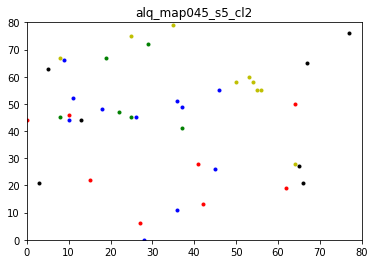

[19.5, 14.6, 26.8, 22.0, 17.1]


Currently mapping.... alq_map046.csv  -->  46
Total no. of points to label.... 26
Label Analysis:-
Total no. of labels:  26
Total no. of lab  1  =  4
Total percentage of lab  1  =  15.384615384615385 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  38.46153846153847 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  19.230769230769234 %
Total no. of lab  4  =  3
Total percentage of lab  4  =  11.538461538461538 %
Total no. of lab  5  =  4
Total percentage of lab  5  =  15.384615384615385 %
map saved!!


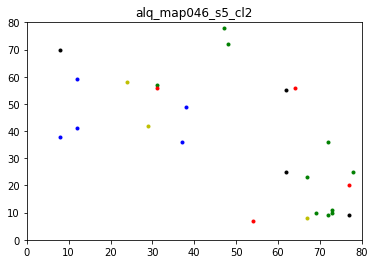

[15.4, 38.5, 19.2, 11.5, 15.4]


Currently mapping.... alq_map047.csv  -->  47
Total no. of points to label.... 24
Label Analysis:-
Total no. of labels:  24
Total no. of lab  1  =  10
Total percentage of lab  1  =  41.66666666666667 %
Total no. of lab  2  =  3
Total percentage of lab  2  =  12.5 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  20.833333333333336 %
Total no. of lab  4  =  5
Total percentage of lab  4  =  20.833333333333336 %
Total no. of lab  5  =  1
Total percentage of lab  5  =  4.166666666666666 %
map saved!!


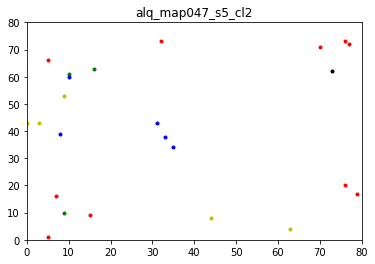

[41.7, 12.5, 20.8, 20.8, 4.2]


Currently mapping.... alq_map048.csv  -->  48
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  21
Total percentage of lab  1  =  52.5 %
Total no. of lab  2  =  2
Total percentage of lab  2  =  5.0 %
Total no. of lab  3  =  11
Total percentage of lab  3  =  27.500000000000004 %
Total no. of lab  4  =  3
Total percentage of lab  4  =  7.5 %
Total no. of lab  5  =  3
Total percentage of lab  5  =  7.5 %
map saved!!


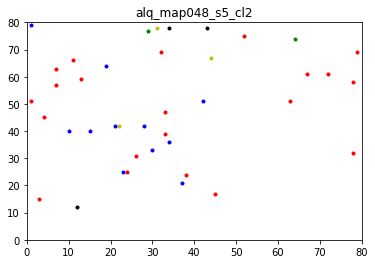

[52.5, 5.0, 27.5, 7.5, 7.5]


Currently mapping.... alq_map049.csv  -->  49
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  13
Total percentage of lab  1  =  34.21052631578947 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  23.684210526315788 %
Total no. of lab  3  =  8
Total percentage of lab  3  =  21.052631578947366 %
Total no. of lab  4  =  1
Total percentage of lab  4  =  2.631578947368421 %
Total no. of lab  5  =  7
Total percentage of lab  5  =  18.421052631578945 %
map saved!!


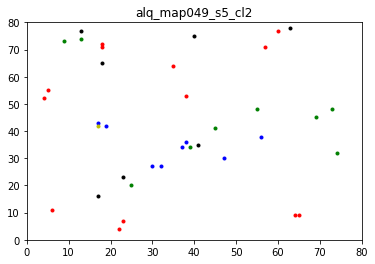

[34.2, 23.7, 21.1, 2.6, 18.4]


Currently mapping.... alq_map050.csv  -->  50
Total no. of points to label.... 125
Label Analysis:-
Total no. of labels:  125
Total no. of lab  1  =  10
Total percentage of lab  1  =  8.0 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  9.6 %
Total no. of lab  3  =  74
Total percentage of lab  3  =  59.199999999999996 %
Total no. of lab  4  =  14
Total percentage of lab  4  =  11.200000000000001 %
Total no. of lab  5  =  15
Total percentage of lab  5  =  12.0 %
map saved!!


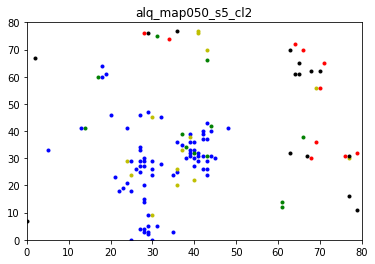

[8.0, 9.6, 59.2, 11.2, 12.0]


Currently mapping.... alq_map051.csv  -->  51
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  26
Total percentage of lab  1  =  43.333333333333336 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  13.333333333333334 %
Total no. of lab  3  =  11
Total percentage of lab  3  =  18.333333333333332 %
Total no. of lab  4  =  6
Total percentage of lab  4  =  10.0 %
Total no. of lab  5  =  9
Total percentage of lab  5  =  15.0 %
map saved!!


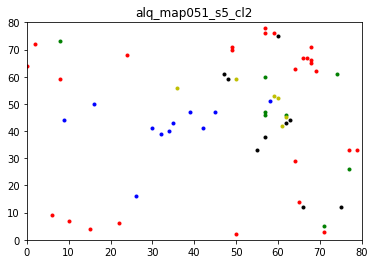

[43.3, 13.3, 18.3, 10.0, 15.0]


Currently mapping.... alq_map052.csv  -->  52
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  15
Total percentage of lab  1  =  28.846153846153843 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  28.846153846153843 %
Total no. of lab  3  =  12
Total percentage of lab  3  =  23.076923076923077 %
Total no. of lab  4  =  10
Total percentage of lab  4  =  19.230769230769234 %
map saved!!


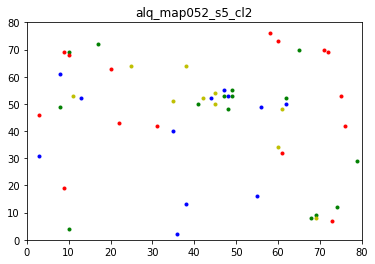

[28.8, 28.8, 23.1, 19.2]


Currently mapping.... alq_map053.csv  -->  53
Total no. of points to label.... 51
Label Analysis:-
Total no. of labels:  51
Total no. of lab  1  =  14
Total percentage of lab  1  =  27.450980392156865 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  11.76470588235294 %
Total no. of lab  3  =  12
Total percentage of lab  3  =  23.52941176470588 %
Total no. of lab  4  =  9
Total percentage of lab  4  =  17.647058823529413 %
Total no. of lab  5  =  10
Total percentage of lab  5  =  19.607843137254903 %
map saved!!


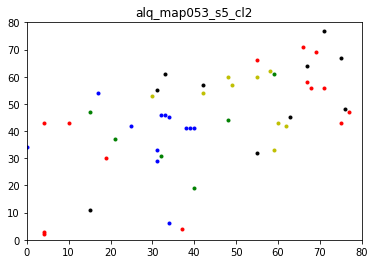

[27.5, 11.8, 23.5, 17.6, 19.6]


Currently mapping.... alq_map054.csv  -->  54
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  8
Total percentage of lab  1  =  22.22222222222222 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  19.444444444444446 %
Total no. of lab  3  =  12
Total percentage of lab  3  =  33.33333333333333 %
Total no. of lab  4  =  3
Total percentage of lab  4  =  8.333333333333332 %
Total no. of lab  5  =  6
Total percentage of lab  5  =  16.666666666666664 %
map saved!!


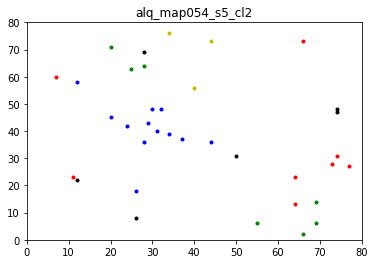

[22.2, 19.4, 33.3, 8.3, 16.7]


Currently mapping.... alq_map055.csv  -->  55
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  21
Total percentage of lab  1  =  28.000000000000004 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  14.666666666666666 %
Total no. of lab  3  =  31
Total percentage of lab  3  =  41.333333333333336 %
Total no. of lab  4  =  7
Total percentage of lab  4  =  9.333333333333334 %
Total no. of lab  5  =  5
Total percentage of lab  5  =  6.666666666666667 %
map saved!!


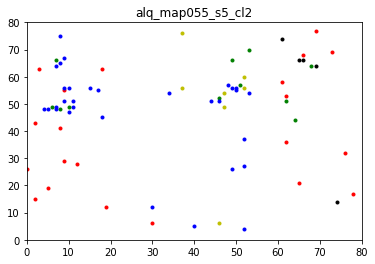

[28.0, 14.7, 41.3, 9.3, 6.7]


Currently mapping.... alq_map056.csv  -->  56
Total no. of points to label.... 19
Label Analysis:-
Total no. of labels:  19
Total no. of lab  1  =  8
Total percentage of lab  1  =  42.10526315789473 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  21.052631578947366 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  26.31578947368421 %
Total no. of lab  4  =  1
Total percentage of lab  4  =  5.263157894736842 %
Total no. of lab  5  =  1
Total percentage of lab  5  =  5.263157894736842 %
map saved!!


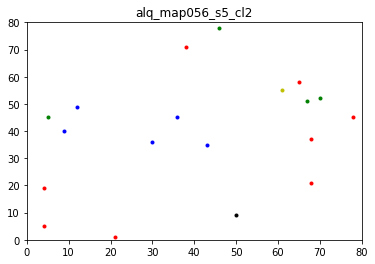

[42.1, 21.1, 26.3, 5.3, 5.3]


Currently mapping.... alq_map057.csv  -->  57
Total no. of points to label.... 37
Label Analysis:-
Total no. of labels:  37
Total no. of lab  1  =  8
Total percentage of lab  1  =  21.62162162162162 %
Total no. of lab  2  =  2
Total percentage of lab  2  =  5.405405405405405 %
Total no. of lab  3  =  19
Total percentage of lab  3  =  51.35135135135135 %
Total no. of lab  4  =  4
Total percentage of lab  4  =  10.81081081081081 %
Total no. of lab  5  =  4
Total percentage of lab  5  =  10.81081081081081 %
map saved!!


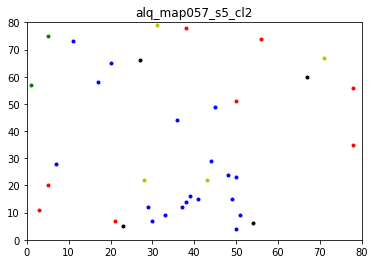

[21.6, 5.4, 51.4, 10.8, 10.8]


Currently mapping.... alq_map058.csv  -->  58
Total no. of points to label.... 44
Label Analysis:-
Total no. of labels:  44
Total no. of lab  1  =  24
Total percentage of lab  1  =  54.54545454545454 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  9.090909090909092 %
Total no. of lab  3  =  12
Total percentage of lab  3  =  27.27272727272727 %
Total no. of lab  4  =  0
Total percentage of lab  4  =  0.0 %
Total no. of lab  5  =  4
Total percentage of lab  5  =  9.090909090909092 %
map saved!!


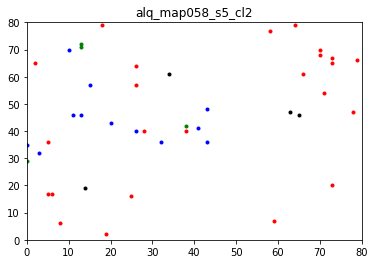

[54.5, 9.1, 27.3, 0.0, 9.1]


Currently mapping.... alq_map059.csv  -->  59
Total no. of points to label.... 33
Label Analysis:-
Total no. of labels:  33
Total no. of lab  1  =  13
Total percentage of lab  1  =  39.39393939393939 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  18.181818181818183 %
Total no. of lab  3  =  4
Total percentage of lab  3  =  12.121212121212121 %
Total no. of lab  4  =  5
Total percentage of lab  4  =  15.151515151515152 %
Total no. of lab  5  =  5
Total percentage of lab  5  =  15.151515151515152 %
map saved!!


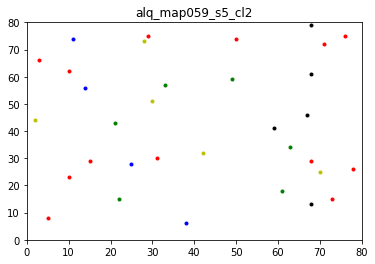

[39.4, 18.2, 12.1, 15.2, 15.2]


Currently mapping.... alq_map060.csv  -->  60
Total no. of points to label.... 62
Label Analysis:-
Total no. of labels:  62
Total no. of lab  1  =  24
Total percentage of lab  1  =  38.70967741935484 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  17.741935483870968 %
Total no. of lab  3  =  13
Total percentage of lab  3  =  20.967741935483872 %
Total no. of lab  4  =  7
Total percentage of lab  4  =  11.29032258064516 %
Total no. of lab  5  =  7
Total percentage of lab  5  =  11.29032258064516 %
map saved!!


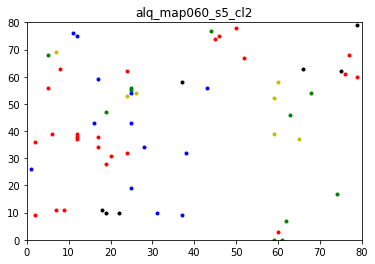

[38.7, 17.7, 21.0, 11.3, 11.3]


Currently mapping.... alq_map061.csv  -->  61
Total no. of points to label.... 41
Label Analysis:-
Total no. of labels:  41
Total no. of lab  1  =  9
Total percentage of lab  1  =  21.951219512195124 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  12.195121951219512 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  17.073170731707318 %
Total no. of lab  4  =  5
Total percentage of lab  4  =  12.195121951219512 %
Total no. of lab  5  =  15
Total percentage of lab  5  =  36.58536585365854 %
map saved!!


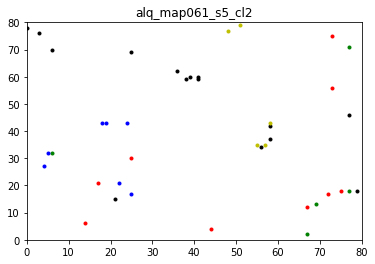

[22.0, 12.2, 17.1, 12.2, 36.6]


Currently mapping.... alq_map062.csv  -->  62
Total no. of points to label.... 24
Label Analysis:-
Total no. of labels:  24
Total no. of lab  1  =  5
Total percentage of lab  1  =  20.833333333333336 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  20.833333333333336 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  20.833333333333336 %
Total no. of lab  4  =  1
Total percentage of lab  4  =  4.166666666666666 %
Total no. of lab  5  =  8
Total percentage of lab  5  =  33.33333333333333 %
map saved!!


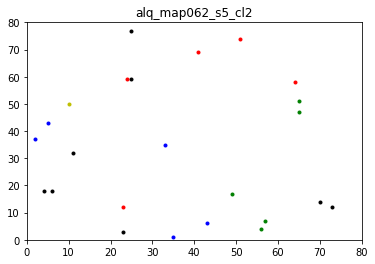

[20.8, 20.8, 20.8, 4.2, 33.3]


Currently mapping.... alq_map063.csv  -->  63
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  12
Total percentage of lab  1  =  27.906976744186046 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  25.581395348837212 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  16.27906976744186 %
Total no. of lab  4  =  4
Total percentage of lab  4  =  9.30232558139535 %
Total no. of lab  5  =  9
Total percentage of lab  5  =  20.930232558139537 %
map saved!!


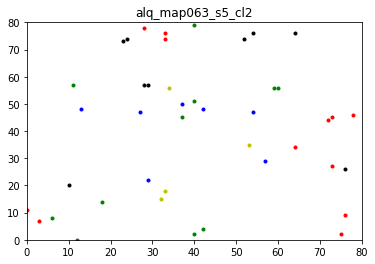

[27.9, 25.6, 16.3, 9.3, 20.9]


Currently mapping.... alq_map064.csv  -->  64
Total no. of points to label.... 50
Label Analysis:-
Total no. of labels:  50
Total no. of lab  1  =  16
Total percentage of lab  1  =  32.0 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  10.0 %
Total no. of lab  3  =  14
Total percentage of lab  3  =  28.000000000000004 %
Total no. of lab  4  =  4
Total percentage of lab  4  =  8.0 %
Total no. of lab  5  =  11
Total percentage of lab  5  =  22.0 %
map saved!!


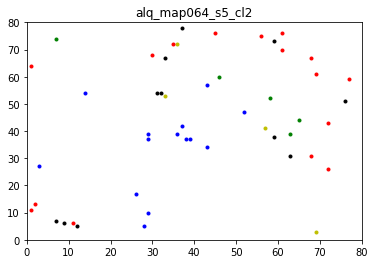

[32.0, 10.0, 28.0, 8.0, 22.0]


Currently mapping.... alq_map065.csv  -->  65
Total no. of points to label.... 44
Label Analysis:-
Total no. of labels:  44
Total no. of lab  1  =  20
Total percentage of lab  1  =  45.45454545454545 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  15.909090909090908 %
Total no. of lab  3  =  11
Total percentage of lab  3  =  25.0 %
Total no. of lab  4  =  0
Total percentage of lab  4  =  0.0 %
Total no. of lab  5  =  6
Total percentage of lab  5  =  13.636363636363635 %
map saved!!


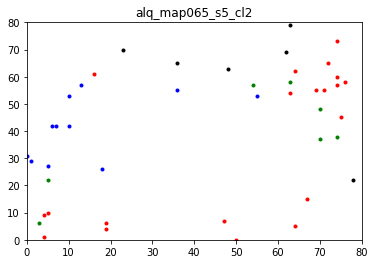

[45.5, 15.9, 25.0, 0.0, 13.6]


Currently mapping.... alq_map066.csv  -->  66
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  16
Total percentage of lab  1  =  26.229508196721312 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  13.114754098360656 %
Total no. of lab  3  =  16
Total percentage of lab  3  =  26.229508196721312 %
Total no. of lab  4  =  12
Total percentage of lab  4  =  19.672131147540984 %
Total no. of lab  5  =  9
Total percentage of lab  5  =  14.754098360655737 %
map saved!!


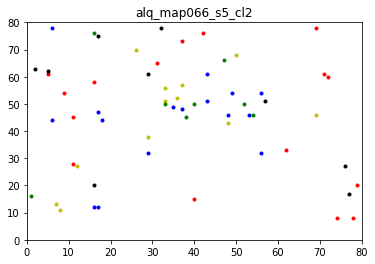

[26.2, 13.1, 26.2, 19.7, 14.8]


Currently mapping.... alq_map067.csv  -->  67
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  11
Total percentage of lab  1  =  30.555555555555557 %
Total no. of lab  2  =  1
Total percentage of lab  2  =  2.7777777777777777 %
Total no. of lab  3  =  10
Total percentage of lab  3  =  27.77777777777778 %
Total no. of lab  4  =  7
Total percentage of lab  4  =  19.444444444444446 %
Total no. of lab  5  =  7
Total percentage of lab  5  =  19.444444444444446 %
map saved!!


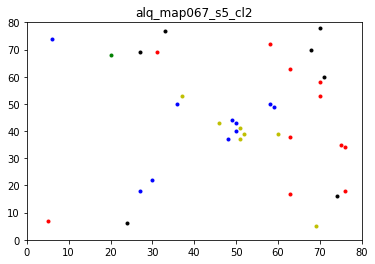

[30.6, 2.8, 27.8, 19.4, 19.4]


Currently mapping.... alq_map068.csv  -->  68
Total no. of points to label.... 45
Label Analysis:-
Total no. of labels:  45
Total no. of lab  1  =  17
Total percentage of lab  1  =  37.77777777777778 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  15.555555555555555 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  15.555555555555555 %
Total no. of lab  4  =  5
Total percentage of lab  4  =  11.11111111111111 %
Total no. of lab  5  =  9
Total percentage of lab  5  =  20.0 %
map saved!!


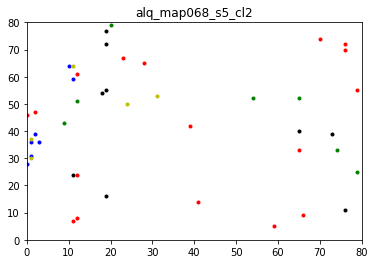

[37.8, 15.6, 15.6, 11.1, 20.0]


Currently mapping.... alq_map069.csv  -->  69
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  25
Total percentage of lab  1  =  48.07692307692308 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  15.384615384615385 %
Total no. of lab  3  =  4
Total percentage of lab  3  =  7.6923076923076925 %
Total no. of lab  4  =  5
Total percentage of lab  4  =  9.615384615384617 %
Total no. of lab  5  =  10
Total percentage of lab  5  =  19.230769230769234 %
map saved!!


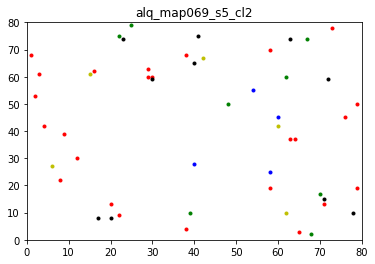

[48.1, 15.4, 7.7, 9.6, 19.2]


Currently mapping.... alq_map070.csv  -->  70
Total no. of points to label.... 60
Label Analysis:-
Total no. of labels:  60
Total no. of lab  1  =  12
Total percentage of lab  1  =  20.0 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  26.666666666666668 %
Total no. of lab  3  =  16
Total percentage of lab  3  =  26.666666666666668 %
Total no. of lab  4  =  8
Total percentage of lab  4  =  13.333333333333334 %
Total no. of lab  5  =  8
Total percentage of lab  5  =  13.333333333333334 %
map saved!!


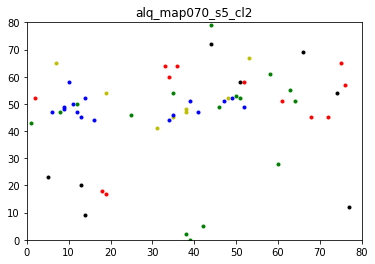

[20.0, 26.7, 26.7, 13.3, 13.3]


Currently mapping.... alq_map071.csv  -->  71
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  13
Total percentage of lab  1  =  25.0 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  17.307692307692307 %
Total no. of lab  3  =  11
Total percentage of lab  3  =  21.153846153846153 %
Total no. of lab  4  =  8
Total percentage of lab  4  =  15.384615384615385 %
Total no. of lab  5  =  11
Total percentage of lab  5  =  21.153846153846153 %
map saved!!


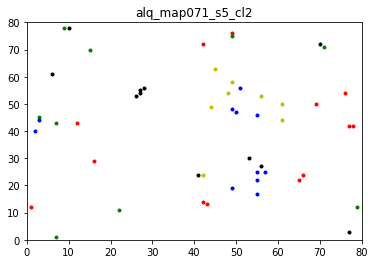

[25.0, 17.3, 21.2, 15.4, 21.2]


Currently mapping.... alq_map072.csv  -->  72
Total no. of points to label.... 62
Label Analysis:-
Total no. of labels:  62
Total no. of lab  1  =  14
Total percentage of lab  1  =  22.58064516129032 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  22.58064516129032 %
Total no. of lab  3  =  26
Total percentage of lab  3  =  41.935483870967744 %
Total no. of lab  4  =  2
Total percentage of lab  4  =  3.225806451612903 %
Total no. of lab  5  =  6
Total percentage of lab  5  =  9.67741935483871 %
map saved!!


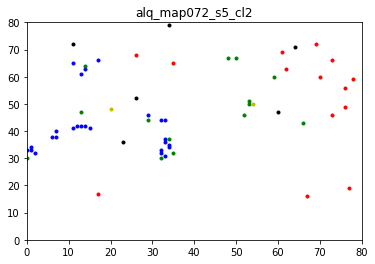

[22.6, 22.6, 41.9, 3.2, 9.7]


Currently mapping.... alq_map073.csv  -->  73
Total no. of points to label.... 85
Label Analysis:-
Total no. of labels:  85
Total no. of lab  1  =  18
Total percentage of lab  1  =  21.176470588235293 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  20.0 %
Total no. of lab  3  =  27
Total percentage of lab  3  =  31.76470588235294 %
Total no. of lab  4  =  6
Total percentage of lab  4  =  7.0588235294117645 %
Total no. of lab  5  =  17
Total percentage of lab  5  =  20.0 %
map saved!!


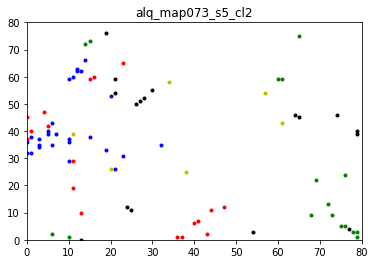

[21.2, 20.0, 31.8, 7.1, 20.0]


Currently mapping.... alq_map074.csv  -->  74
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  16
Total percentage of lab  1  =  27.586206896551722 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  15.517241379310345 %
Total no. of lab  3  =  14
Total percentage of lab  3  =  24.137931034482758 %
Total no. of lab  4  =  9
Total percentage of lab  4  =  15.517241379310345 %
Total no. of lab  5  =  10
Total percentage of lab  5  =  17.24137931034483 %
map saved!!


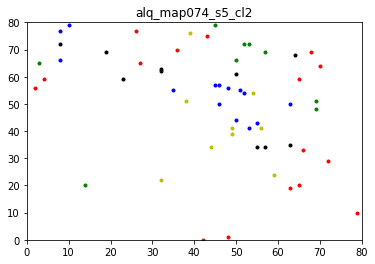

[27.6, 15.5, 24.1, 15.5, 17.2]


Currently mapping.... alq_map075.csv  -->  75
Total no. of points to label.... 59
Label Analysis:-
Total no. of labels:  59
Total no. of lab  1  =  19
Total percentage of lab  1  =  32.20338983050847 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  16.94915254237288 %
Total no. of lab  3  =  22
Total percentage of lab  3  =  37.28813559322034 %
Total no. of lab  4  =  3
Total percentage of lab  4  =  5.084745762711865 %
Total no. of lab  5  =  5
Total percentage of lab  5  =  8.47457627118644 %
map saved!!


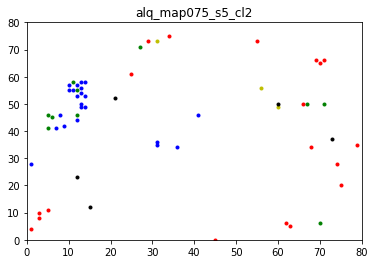

[32.2, 16.9, 37.3, 5.1, 8.5]


Currently mapping.... alq_map076.csv  -->  76
Total no. of points to label.... 72
Label Analysis:-
Total no. of labels:  72
Total no. of lab  1  =  8
Total percentage of lab  1  =  11.11111111111111 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  8.333333333333332 %
Total no. of lab  3  =  46
Total percentage of lab  3  =  63.888888888888886 %
Total no. of lab  4  =  5
Total percentage of lab  4  =  6.944444444444445 %
Total no. of lab  5  =  7
Total percentage of lab  5  =  9.722222222222223 %
map saved!!


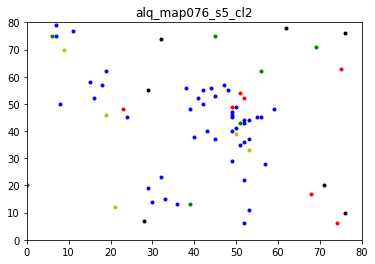

[11.1, 8.3, 63.9, 6.9, 9.7]


Currently mapping.... alq_map077.csv  -->  77
Total no. of points to label.... 42
Label Analysis:-
Total no. of labels:  42
Total no. of lab  1  =  11
Total percentage of lab  1  =  26.190476190476193 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  23.809523809523807 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  11.904761904761903 %
Total no. of lab  4  =  3
Total percentage of lab  4  =  7.142857142857142 %
Total no. of lab  5  =  13
Total percentage of lab  5  =  30.952380952380953 %
map saved!!


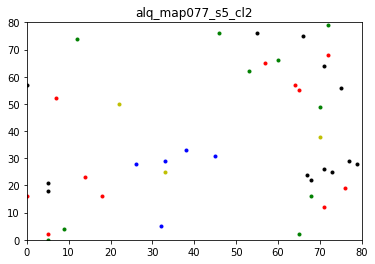

[26.2, 23.8, 11.9, 7.1, 31.0]


Currently mapping.... alq_map078.csv  -->  78
Total no. of points to label.... 63
Label Analysis:-
Total no. of labels:  63
Total no. of lab  1  =  13
Total percentage of lab  1  =  20.634920634920633 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  9.523809523809524 %
Total no. of lab  3  =  14
Total percentage of lab  3  =  22.22222222222222 %
Total no. of lab  4  =  18
Total percentage of lab  4  =  28.57142857142857 %
Total no. of lab  5  =  12
Total percentage of lab  5  =  19.047619047619047 %
map saved!!


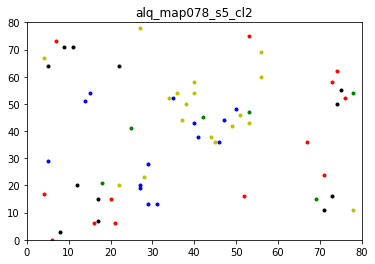

[20.6, 9.5, 22.2, 28.6, 19.0]


Currently mapping.... alq_map079.csv  -->  79
Total no. of points to label.... 40
Label Analysis:-
Total no. of labels:  40
Total no. of lab  1  =  9
Total percentage of lab  1  =  22.5 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  20.0 %
Total no. of lab  3  =  3
Total percentage of lab  3  =  7.5 %
Total no. of lab  4  =  9
Total percentage of lab  4  =  22.5 %
Total no. of lab  5  =  11
Total percentage of lab  5  =  27.500000000000004 %
map saved!!


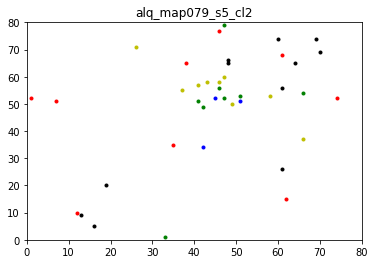

[22.5, 20.0, 7.5, 22.5, 27.5]


Currently mapping.... alq_map080.csv  -->  80
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  18
Total percentage of lab  1  =  50.0 %
Total no. of lab  2  =  3
Total percentage of lab  2  =  8.333333333333332 %
Total no. of lab  3  =  3
Total percentage of lab  3  =  8.333333333333332 %
Total no. of lab  4  =  6
Total percentage of lab  4  =  16.666666666666664 %
Total no. of lab  5  =  6
Total percentage of lab  5  =  16.666666666666664 %
map saved!!


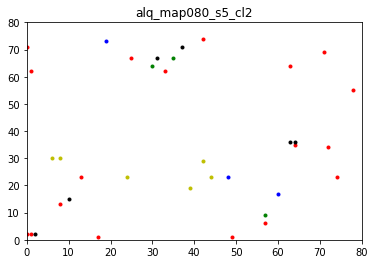

[50.0, 8.3, 8.3, 16.7, 16.7]


Currently mapping.... alq_map081.csv  -->  81
Total no. of points to label.... 77
Label Analysis:-
Total no. of labels:  77
Total no. of lab  1  =  16
Total percentage of lab  1  =  20.77922077922078 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  22.07792207792208 %
Total no. of lab  3  =  12
Total percentage of lab  3  =  15.584415584415584 %
Total no. of lab  4  =  8
Total percentage of lab  4  =  10.38961038961039 %
Total no. of lab  5  =  24
Total percentage of lab  5  =  31.16883116883117 %
map saved!!


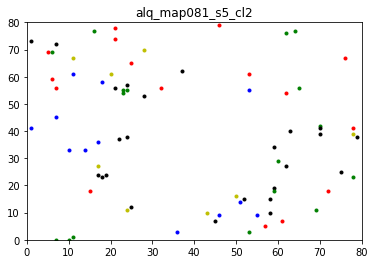

[20.8, 22.1, 15.6, 10.4, 31.2]


Currently mapping.... alq_map082.csv  -->  82
Total no. of points to label.... 36
Label Analysis:-
Total no. of labels:  36
Total no. of lab  1  =  14
Total percentage of lab  1  =  38.88888888888889 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  11.11111111111111 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  19.444444444444446 %
Total no. of lab  4  =  6
Total percentage of lab  4  =  16.666666666666664 %
Total no. of lab  5  =  5
Total percentage of lab  5  =  13.88888888888889 %
map saved!!


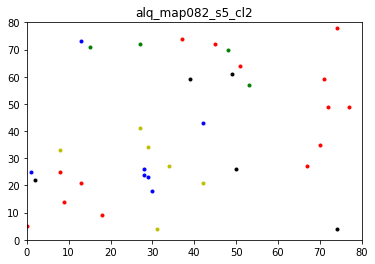

[38.9, 11.1, 19.4, 16.7, 13.9]


Currently mapping.... alq_map083.csv  -->  83
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  10
Total percentage of lab  1  =  23.25581395348837 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  25.581395348837212 %
Total no. of lab  3  =  6
Total percentage of lab  3  =  13.953488372093023 %
Total no. of lab  4  =  8
Total percentage of lab  4  =  18.6046511627907 %
Total no. of lab  5  =  8
Total percentage of lab  5  =  18.6046511627907 %
map saved!!


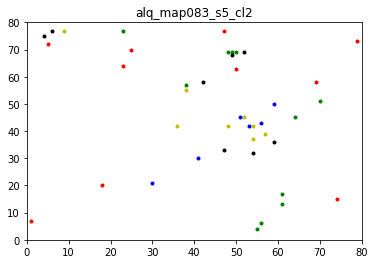

[23.3, 25.6, 14.0, 18.6, 18.6]


Currently mapping.... alq_map084.csv  -->  84
Total no. of points to label.... 49
Label Analysis:-
Total no. of labels:  49
Total no. of lab  1  =  19
Total percentage of lab  1  =  38.775510204081634 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  12.244897959183673 %
Total no. of lab  3  =  8
Total percentage of lab  3  =  16.3265306122449 %
Total no. of lab  4  =  5
Total percentage of lab  4  =  10.204081632653061 %
Total no. of lab  5  =  11
Total percentage of lab  5  =  22.448979591836736 %
map saved!!


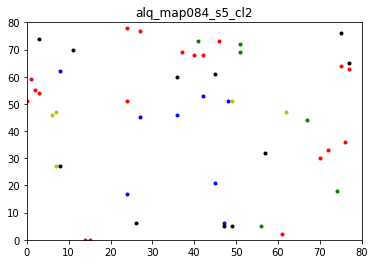

[38.8, 12.2, 16.3, 10.2, 22.4]


Currently mapping.... alq_map085.csv  -->  85
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  21
Total percentage of lab  1  =  36.206896551724135 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  10.344827586206897 %
Total no. of lab  3  =  6
Total percentage of lab  3  =  10.344827586206897 %
Total no. of lab  4  =  3
Total percentage of lab  4  =  5.172413793103448 %
Total no. of lab  5  =  22
Total percentage of lab  5  =  37.93103448275862 %
map saved!!


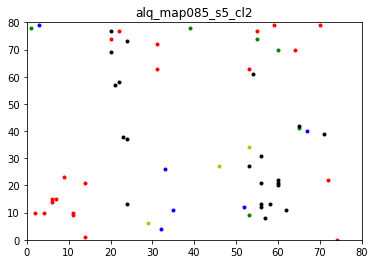

[36.2, 10.3, 10.3, 5.2, 37.9]


Currently mapping.... alq_map086.csv  -->  86
Total no. of points to label.... 74
Label Analysis:-
Total no. of labels:  74
Total no. of lab  1  =  23
Total percentage of lab  1  =  31.08108108108108 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  24.324324324324326 %
Total no. of lab  3  =  11
Total percentage of lab  3  =  14.864864864864865 %
Total no. of lab  4  =  3
Total percentage of lab  4  =  4.054054054054054 %
Total no. of lab  5  =  19
Total percentage of lab  5  =  25.675675675675674 %
map saved!!


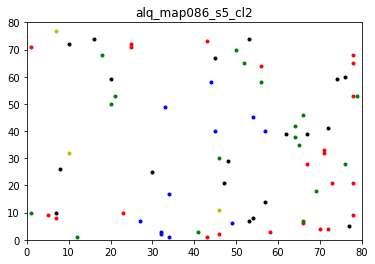

[31.1, 24.3, 14.9, 4.1, 25.7]


Currently mapping.... alq_map087.csv  -->  87
Total no. of points to label.... 43
Label Analysis:-
Total no. of labels:  43
Total no. of lab  1  =  12
Total percentage of lab  1  =  27.906976744186046 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  20.930232558139537 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  11.627906976744185 %
Total no. of lab  4  =  4
Total percentage of lab  4  =  9.30232558139535 %
Total no. of lab  5  =  13
Total percentage of lab  5  =  30.23255813953488 %
map saved!!


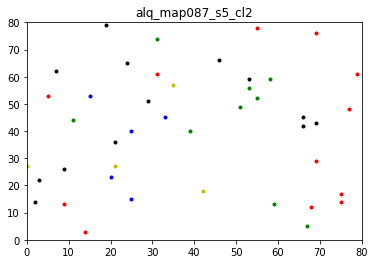

[27.9, 20.9, 11.6, 9.3, 30.2]


Currently mapping.... alq_map088.csv  -->  88
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  21
Total percentage of lab  1  =  28.000000000000004 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  14.666666666666666 %
Total no. of lab  3  =  22
Total percentage of lab  3  =  29.333333333333332 %
Total no. of lab  4  =  8
Total percentage of lab  4  =  10.666666666666668 %
Total no. of lab  5  =  13
Total percentage of lab  5  =  17.333333333333336 %
map saved!!


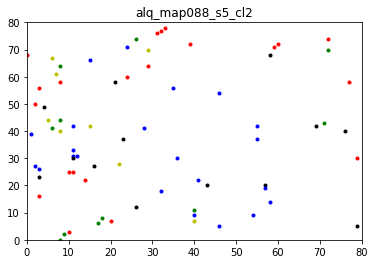

[28.0, 14.7, 29.3, 10.7, 17.3]


Currently mapping.... alq_map089.csv  -->  89
Total no. of points to label.... 68
Label Analysis:-
Total no. of labels:  68
Total no. of lab  1  =  17
Total percentage of lab  1  =  25.0 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  20.588235294117645 %
Total no. of lab  3  =  14
Total percentage of lab  3  =  20.588235294117645 %
Total no. of lab  4  =  10
Total percentage of lab  4  =  14.705882352941178 %
Total no. of lab  5  =  13
Total percentage of lab  5  =  19.11764705882353 %
map saved!!


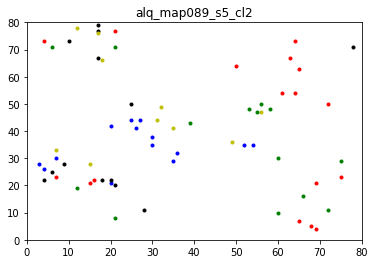

[25.0, 20.6, 20.6, 14.7, 19.1]


Currently mapping.... alq_map090.csv  -->  90
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  17
Total percentage of lab  1  =  20.73170731707317 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  20.73170731707317 %
Total no. of lab  3  =  28
Total percentage of lab  3  =  34.146341463414636 %
Total no. of lab  4  =  6
Total percentage of lab  4  =  7.317073170731707 %
Total no. of lab  5  =  14
Total percentage of lab  5  =  17.073170731707318 %
map saved!!


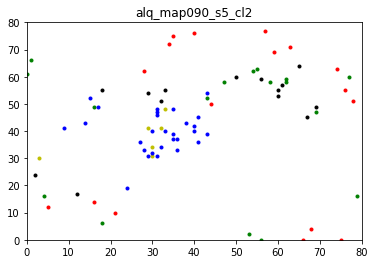

[20.7, 20.7, 34.1, 7.3, 17.1]


Currently mapping.... alq_map091.csv  -->  91
Total no. of points to label.... 65
Label Analysis:-
Total no. of labels:  65
Total no. of lab  1  =  22
Total percentage of lab  1  =  33.84615384615385 %
Total no. of lab  2  =  5
Total percentage of lab  2  =  7.6923076923076925 %
Total no. of lab  3  =  16
Total percentage of lab  3  =  24.615384615384617 %
Total no. of lab  4  =  13
Total percentage of lab  4  =  20.0 %
Total no. of lab  5  =  9
Total percentage of lab  5  =  13.846153846153847 %
map saved!!


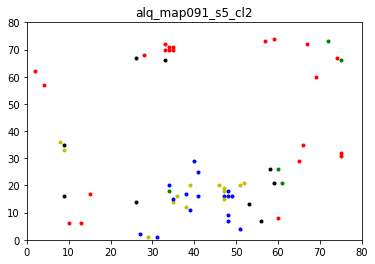

[33.8, 7.7, 24.6, 20.0, 13.8]


Currently mapping.... alq_map092.csv  -->  92
Total no. of points to label.... 58
Label Analysis:-
Total no. of labels:  58
Total no. of lab  1  =  23
Total percentage of lab  1  =  39.6551724137931 %
Total no. of lab  2  =  16
Total percentage of lab  2  =  27.586206896551722 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  12.068965517241379 %
Total no. of lab  4  =  2
Total percentage of lab  4  =  3.4482758620689653 %
Total no. of lab  5  =  10
Total percentage of lab  5  =  17.24137931034483 %
map saved!!


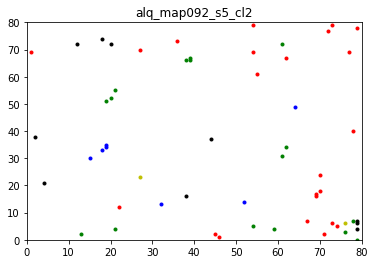

[39.7, 27.6, 12.1, 3.4, 17.2]


Currently mapping.... alq_map093.csv  -->  93
Total no. of points to label.... 46
Label Analysis:-
Total no. of labels:  46
Total no. of lab  1  =  22
Total percentage of lab  1  =  47.82608695652174 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  26.08695652173913 %
Total no. of lab  3  =  0
Total percentage of lab  3  =  0.0 %
Total no. of lab  4  =  3
Total percentage of lab  4  =  6.521739130434782 %
Total no. of lab  5  =  9
Total percentage of lab  5  =  19.565217391304348 %
map saved!!


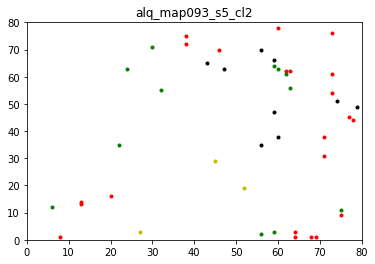

[47.8, 26.1, 0.0, 6.5, 19.6]


Currently mapping.... alq_map094.csv  -->  94
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  26
Total percentage of lab  1  =  42.62295081967213 %
Total no. of lab  2  =  11
Total percentage of lab  2  =  18.0327868852459 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  11.475409836065573 %
Total no. of lab  4  =  4
Total percentage of lab  4  =  6.557377049180328 %
Total no. of lab  5  =  13
Total percentage of lab  5  =  21.311475409836063 %
map saved!!


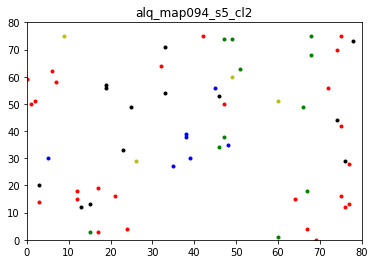

[42.6, 18.0, 11.5, 6.6, 21.3]


Currently mapping.... alq_map095.csv  -->  95
Total no. of points to label.... 84
Label Analysis:-
Total no. of labels:  84
Total no. of lab  1  =  14
Total percentage of lab  1  =  16.666666666666664 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  8.333333333333332 %
Total no. of lab  3  =  33
Total percentage of lab  3  =  39.285714285714285 %
Total no. of lab  4  =  11
Total percentage of lab  4  =  13.095238095238097 %
Total no. of lab  5  =  19
Total percentage of lab  5  =  22.61904761904762 %
map saved!!


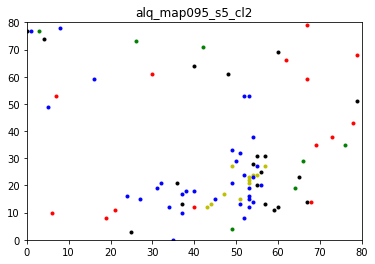

[16.7, 8.3, 39.3, 13.1, 22.6]


Currently mapping.... alq_map096.csv  -->  96
Total no. of points to label.... 38
Label Analysis:-
Total no. of labels:  38
Total no. of lab  1  =  12
Total percentage of lab  1  =  31.57894736842105 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  18.421052631578945 %
Total no. of lab  3  =  6
Total percentage of lab  3  =  15.789473684210526 %
Total no. of lab  4  =  4
Total percentage of lab  4  =  10.526315789473683 %
Total no. of lab  5  =  9
Total percentage of lab  5  =  23.684210526315788 %
map saved!!


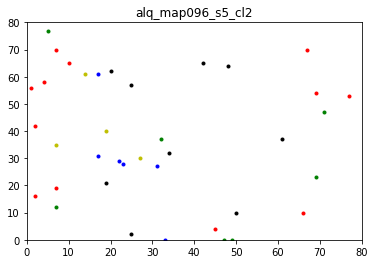

[31.6, 18.4, 15.8, 10.5, 23.7]


Currently mapping.... alq_map097.csv  -->  97
Total no. of points to label.... 47
Label Analysis:-
Total no. of labels:  47
Total no. of lab  1  =  17
Total percentage of lab  1  =  36.17021276595745 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  12.76595744680851 %
Total no. of lab  3  =  9
Total percentage of lab  3  =  19.148936170212767 %
Total no. of lab  4  =  7
Total percentage of lab  4  =  14.893617021276595 %
Total no. of lab  5  =  8
Total percentage of lab  5  =  17.02127659574468 %
map saved!!


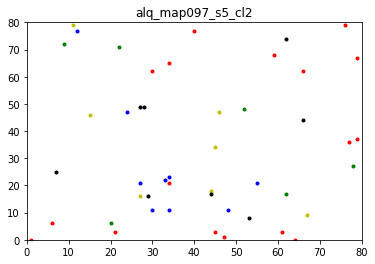

[36.2, 12.8, 19.1, 14.9, 17.0]


Currently mapping.... alq_map098.csv  -->  98
Total no. of points to label.... 88
Label Analysis:-
Total no. of labels:  88
Total no. of lab  1  =  45
Total percentage of lab  1  =  51.13636363636363 %
Total no. of lab  2  =  8
Total percentage of lab  2  =  9.090909090909092 %
Total no. of lab  3  =  20
Total percentage of lab  3  =  22.727272727272727 %
Total no. of lab  4  =  10
Total percentage of lab  4  =  11.363636363636363 %
Total no. of lab  5  =  5
Total percentage of lab  5  =  5.681818181818182 %
map saved!!


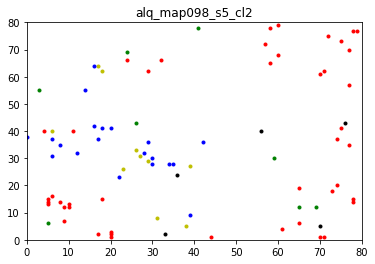

[51.1, 9.1, 22.7, 11.4, 5.7]


Currently mapping.... alq_map099.csv  -->  99
Total no. of points to label.... 64
Label Analysis:-
Total no. of labels:  64
Total no. of lab  1  =  18
Total percentage of lab  1  =  28.125 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  14.0625 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  10.9375 %
Total no. of lab  4  =  10
Total percentage of lab  4  =  15.625 %
Total no. of lab  5  =  20
Total percentage of lab  5  =  31.25 %
map saved!!


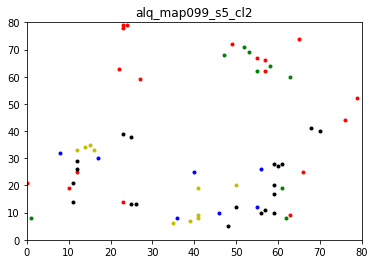

[28.1, 14.1, 10.9, 15.6, 31.2]


Currently mapping.... alq_map100.csv  -->  100
Total no. of points to label.... 52
Label Analysis:-
Total no. of labels:  52
Total no. of lab  1  =  19
Total percentage of lab  1  =  36.53846153846153 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  11.538461538461538 %
Total no. of lab  3  =  13
Total percentage of lab  3  =  25.0 %
Total no. of lab  4  =  7
Total percentage of lab  4  =  13.461538461538462 %
Total no. of lab  5  =  7
Total percentage of lab  5  =  13.461538461538462 %
map saved!!


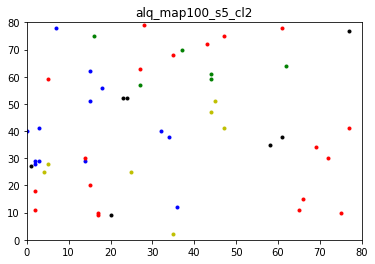

[36.5, 11.5, 25.0, 13.5, 13.5]


Currently mapping.... alq_map101.csv  -->  101
Total no. of points to label.... 69
Label Analysis:-
Total no. of labels:  69
Total no. of lab  1  =  27
Total percentage of lab  1  =  39.130434782608695 %
Total no. of lab  2  =  18
Total percentage of lab  2  =  26.08695652173913 %
Total no. of lab  3  =  8
Total percentage of lab  3  =  11.594202898550725 %
Total no. of lab  4  =  3
Total percentage of lab  4  =  4.3478260869565215 %
Total no. of lab  5  =  13
Total percentage of lab  5  =  18.84057971014493 %
map saved!!


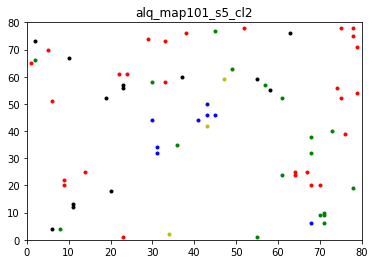

[39.1, 26.1, 11.6, 4.3, 18.8]


Currently mapping.... alq_map102.csv  -->  102
Total no. of points to label.... 71
Label Analysis:-
Total no. of labels:  71
Total no. of lab  1  =  29
Total percentage of lab  1  =  40.845070422535215 %
Total no. of lab  2  =  15
Total percentage of lab  2  =  21.12676056338028 %
Total no. of lab  3  =  3
Total percentage of lab  3  =  4.225352112676056 %
Total no. of lab  4  =  5
Total percentage of lab  4  =  7.042253521126761 %
Total no. of lab  5  =  19
Total percentage of lab  5  =  26.76056338028169 %
map saved!!


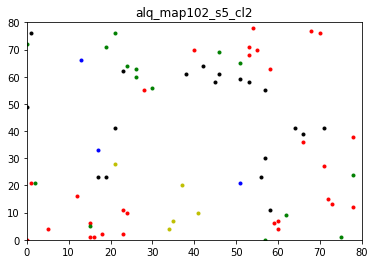

[40.8, 21.1, 4.2, 7.0, 26.8]


Currently mapping.... alq_map103.csv  -->  103
Total no. of points to label.... 42
Label Analysis:-
Total no. of labels:  42
Total no. of lab  1  =  16
Total percentage of lab  1  =  38.095238095238095 %
Total no. of lab  2  =  3
Total percentage of lab  2  =  7.142857142857142 %
Total no. of lab  3  =  5
Total percentage of lab  3  =  11.904761904761903 %
Total no. of lab  4  =  10
Total percentage of lab  4  =  23.809523809523807 %
Total no. of lab  5  =  8
Total percentage of lab  5  =  19.047619047619047 %
map saved!!


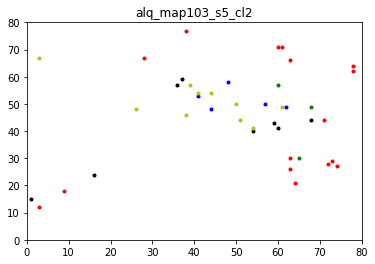

[38.1, 7.1, 11.9, 23.8, 19.0]


Currently mapping.... alq_map104.csv  -->  104
Total no. of points to label.... 68
Label Analysis:-
Total no. of labels:  68
Total no. of lab  1  =  30
Total percentage of lab  1  =  44.11764705882353 %
Total no. of lab  2  =  9
Total percentage of lab  2  =  13.23529411764706 %
Total no. of lab  3  =  6
Total percentage of lab  3  =  8.823529411764707 %
Total no. of lab  4  =  1
Total percentage of lab  4  =  1.4705882352941175 %
Total no. of lab  5  =  22
Total percentage of lab  5  =  32.35294117647059 %
map saved!!


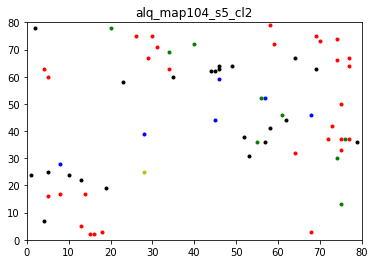

[44.1, 13.2, 8.8, 1.5, 32.4]


Currently mapping.... alq_map105.csv  -->  105
Total no. of points to label.... 59
Label Analysis:-
Total no. of labels:  59
Total no. of lab  1  =  22
Total percentage of lab  1  =  37.28813559322034 %
Total no. of lab  2  =  3
Total percentage of lab  2  =  5.084745762711865 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  11.864406779661017 %
Total no. of lab  4  =  14
Total percentage of lab  4  =  23.728813559322035 %
Total no. of lab  5  =  13
Total percentage of lab  5  =  22.033898305084744 %
map saved!!


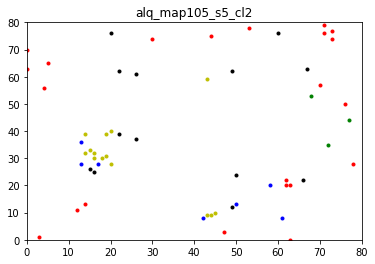

[37.3, 5.1, 11.9, 23.7, 22.0]


Currently mapping.... alq_map106.csv  -->  106
Total no. of points to label.... 61
Label Analysis:-
Total no. of labels:  61
Total no. of lab  1  =  26
Total percentage of lab  1  =  42.62295081967213 %
Total no. of lab  2  =  4
Total percentage of lab  2  =  6.557377049180328 %
Total no. of lab  3  =  8
Total percentage of lab  3  =  13.114754098360656 %
Total no. of lab  4  =  7
Total percentage of lab  4  =  11.475409836065573 %
Total no. of lab  5  =  16
Total percentage of lab  5  =  26.229508196721312 %
map saved!!


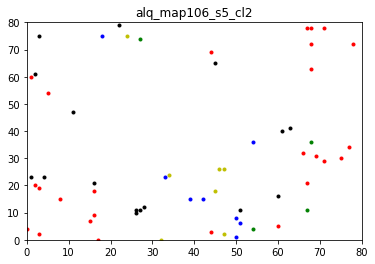

[42.6, 6.6, 13.1, 11.5, 26.2]


Currently mapping.... alq_map107.csv  -->  107
Total no. of points to label.... 55
Label Analysis:-
Total no. of labels:  55
Total no. of lab  1  =  26
Total percentage of lab  1  =  47.27272727272727 %
Total no. of lab  2  =  6
Total percentage of lab  2  =  10.909090909090908 %
Total no. of lab  3  =  4
Total percentage of lab  3  =  7.2727272727272725 %
Total no. of lab  4  =  3
Total percentage of lab  4  =  5.454545454545454 %
Total no. of lab  5  =  16
Total percentage of lab  5  =  29.09090909090909 %
map saved!!


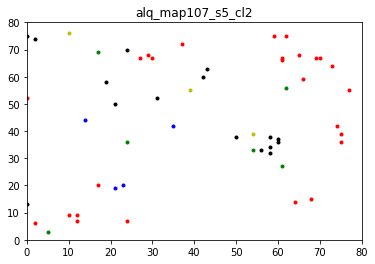

[47.3, 10.9, 7.3, 5.5, 29.1]


Currently mapping.... alq_map108.csv  -->  108
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  32
Total percentage of lab  1  =  39.02439024390244 %
Total no. of lab  2  =  13
Total percentage of lab  2  =  15.853658536585366 %
Total no. of lab  3  =  8
Total percentage of lab  3  =  9.75609756097561 %
Total no. of lab  4  =  7
Total percentage of lab  4  =  8.536585365853659 %
Total no. of lab  5  =  22
Total percentage of lab  5  =  26.82926829268293 %
map saved!!


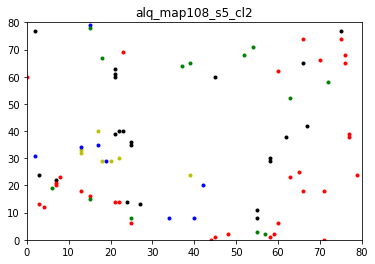

[39.0, 15.9, 9.8, 8.5, 26.8]


Currently mapping.... alq_map109.csv  -->  109
Total no. of points to label.... 95
Label Analysis:-
Total no. of labels:  95
Total no. of lab  1  =  20
Total percentage of lab  1  =  21.052631578947366 %
Total no. of lab  2  =  22
Total percentage of lab  2  =  23.157894736842106 %
Total no. of lab  3  =  19
Total percentage of lab  3  =  20.0 %
Total no. of lab  4  =  14
Total percentage of lab  4  =  14.736842105263156 %
Total no. of lab  5  =  20
Total percentage of lab  5  =  21.052631578947366 %
map saved!!


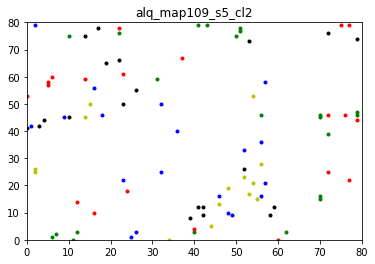

[21.1, 23.2, 20.0, 14.7, 21.1]


Currently mapping.... alq_map110.csv  -->  110
Total no. of points to label.... 77
Label Analysis:-
Total no. of labels:  77
Total no. of lab  1  =  25
Total percentage of lab  1  =  32.467532467532465 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  15.584415584415584 %
Total no. of lab  3  =  6
Total percentage of lab  3  =  7.792207792207792 %
Total no. of lab  4  =  9
Total percentage of lab  4  =  11.688311688311687 %
Total no. of lab  5  =  25
Total percentage of lab  5  =  32.467532467532465 %
map saved!!


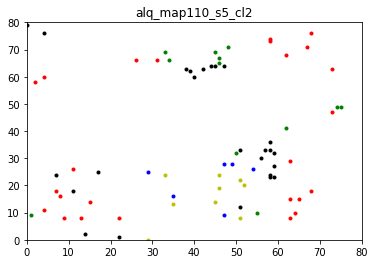

[32.5, 15.6, 7.8, 11.7, 32.5]


Currently mapping.... alq_map111.csv  -->  111
Total no. of points to label.... 141
Label Analysis:-
Total no. of labels:  141
Total no. of lab  1  =  25
Total percentage of lab  1  =  17.73049645390071 %
Total no. of lab  2  =  19
Total percentage of lab  2  =  13.47517730496454 %
Total no. of lab  3  =  34
Total percentage of lab  3  =  24.113475177304963 %
Total no. of lab  4  =  35
Total percentage of lab  4  =  24.822695035460992 %
Total no. of lab  5  =  28
Total percentage of lab  5  =  19.858156028368796 %
map saved!!


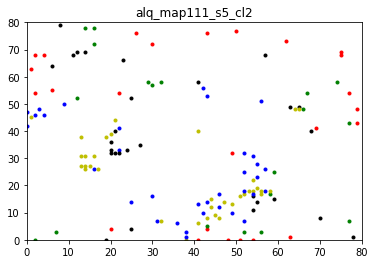

[17.7, 13.5, 24.1, 24.8, 19.9]


Currently mapping.... alq_map112.csv  -->  112
Total no. of points to label.... 96
Label Analysis:-
Total no. of labels:  96
Total no. of lab  1  =  45
Total percentage of lab  1  =  46.875 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  14.583333333333334 %
Total no. of lab  3  =  8
Total percentage of lab  3  =  8.333333333333332 %
Total no. of lab  4  =  5
Total percentage of lab  4  =  5.208333333333334 %
Total no. of lab  5  =  24
Total percentage of lab  5  =  25.0 %
map saved!!


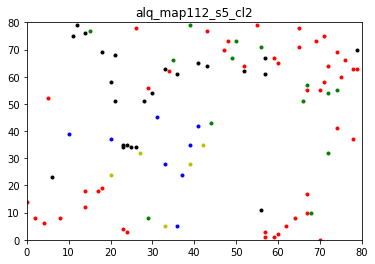

[46.9, 14.6, 8.3, 5.2, 25.0]


Currently mapping.... alq_map113.csv  -->  113
Total no. of points to label.... 76
Label Analysis:-
Total no. of labels:  76
Total no. of lab  1  =  31
Total percentage of lab  1  =  40.78947368421053 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  18.421052631578945 %
Total no. of lab  3  =  7
Total percentage of lab  3  =  9.210526315789473 %
Total no. of lab  4  =  4
Total percentage of lab  4  =  5.263157894736842 %
Total no. of lab  5  =  20
Total percentage of lab  5  =  26.31578947368421 %
map saved!!


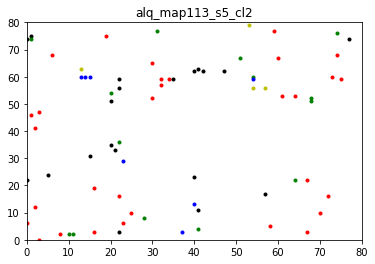

[40.8, 18.4, 9.2, 5.3, 26.3]


Currently mapping.... alq_map114.csv  -->  114
Total no. of points to label.... 71
Label Analysis:-
Total no. of labels:  71
Total no. of lab  1  =  37
Total percentage of lab  1  =  52.112676056338024 %
Total no. of lab  2  =  7
Total percentage of lab  2  =  9.859154929577464 %
Total no. of lab  3  =  10
Total percentage of lab  3  =  14.084507042253522 %
Total no. of lab  4  =  10
Total percentage of lab  4  =  14.084507042253522 %
Total no. of lab  5  =  7
Total percentage of lab  5  =  9.859154929577464 %
map saved!!


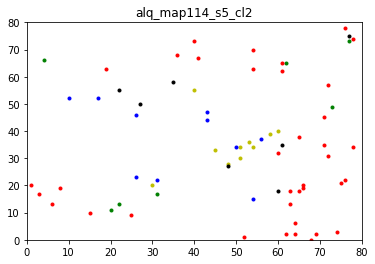

[52.1, 9.9, 14.1, 14.1, 9.9]


Currently mapping.... alq_map115.csv  -->  115
Total no. of points to label.... 82
Label Analysis:-
Total no. of labels:  82
Total no. of lab  1  =  16
Total percentage of lab  1  =  19.51219512195122 %
Total no. of lab  2  =  10
Total percentage of lab  2  =  12.195121951219512 %
Total no. of lab  3  =  4
Total percentage of lab  3  =  4.878048780487805 %
Total no. of lab  4  =  12
Total percentage of lab  4  =  14.634146341463413 %
Total no. of lab  5  =  40
Total percentage of lab  5  =  48.78048780487805 %
map saved!!


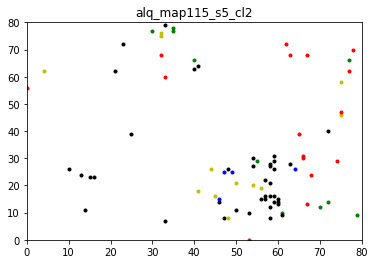

[19.5, 12.2, 4.9, 14.6, 48.8]


Currently mapping.... alq_map116.csv  -->  116
Total no. of points to label.... 112
Label Analysis:-
Total no. of labels:  112
Total no. of lab  1  =  26
Total percentage of lab  1  =  23.214285714285715 %
Total no. of lab  2  =  17
Total percentage of lab  2  =  15.178571428571427 %
Total no. of lab  3  =  47
Total percentage of lab  3  =  41.964285714285715 %
Total no. of lab  4  =  19
Total percentage of lab  4  =  16.964285714285715 %
Total no. of lab  5  =  3
Total percentage of lab  5  =  2.6785714285714284 %
map saved!!


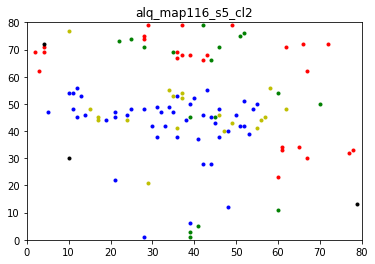

[23.2, 15.2, 42.0, 17.0, 2.7]


Currently mapping.... alq_map117.csv  -->  117
Total no. of points to label.... 93
Label Analysis:-
Total no. of labels:  93
Total no. of lab  1  =  32
Total percentage of lab  1  =  34.40860215053764 %
Total no. of lab  2  =  12
Total percentage of lab  2  =  12.903225806451612 %
Total no. of lab  3  =  12
Total percentage of lab  3  =  12.903225806451612 %
Total no. of lab  4  =  3
Total percentage of lab  4  =  3.225806451612903 %
Total no. of lab  5  =  34
Total percentage of lab  5  =  36.55913978494624 %
map saved!!


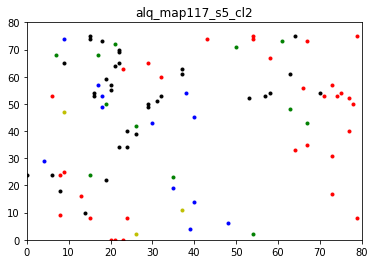

[34.4, 12.9, 12.9, 3.2, 36.6]


Currently mapping.... alq_map118.csv  -->  118
Total no. of points to label.... 108
Label Analysis:-
Total no. of labels:  108
Total no. of lab  1  =  43
Total percentage of lab  1  =  39.81481481481482 %
Total no. of lab  2  =  30
Total percentage of lab  2  =  27.77777777777778 %
Total no. of lab  3  =  14
Total percentage of lab  3  =  12.962962962962962 %
Total no. of lab  4  =  8
Total percentage of lab  4  =  7.4074074074074066 %
Total no. of lab  5  =  13
Total percentage of lab  5  =  12.037037037037036 %
map saved!!


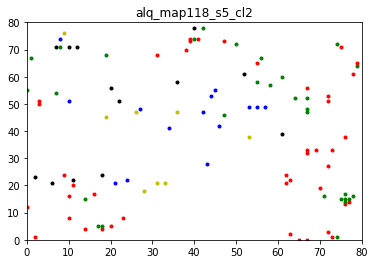

[39.8, 27.8, 13.0, 7.4, 12.0]


Currently mapping.... alq_map119.csv  -->  119
Total no. of points to label.... 75
Label Analysis:-
Total no. of labels:  75
Total no. of lab  1  =  19
Total percentage of lab  1  =  25.333333333333336 %
Total no. of lab  2  =  14
Total percentage of lab  2  =  18.666666666666668 %
Total no. of lab  3  =  0
Total percentage of lab  3  =  0.0 %
Total no. of lab  4  =  4
Total percentage of lab  4  =  5.333333333333334 %
Total no. of lab  5  =  38
Total percentage of lab  5  =  50.66666666666667 %
map saved!!


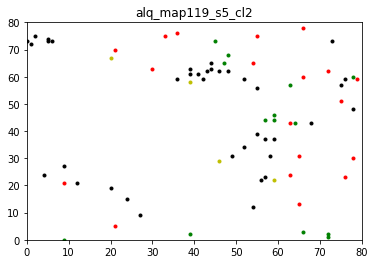

[25.3, 18.7, 0.0, 5.3, 50.7]




In [67]:
alq_s5 = pseudo_classifier_label(num_npy, s5_remap['al_s5l'], tr_map['aln_re_id.csv'], alq_map, 
                                 80, "_s5_cl2", "results", True)

In [76]:
# write up the latex tables
def latex_table(direc, fname, t1, t2, percents):
    per_k, per_v = lookup(percents)
    
    os.chdir(direc)
    new_name = fname + "_tab"
    with_ext = new_name + '.txt'
    
    fi = open(with_ext, "w+")
    
    fi.write("\\begingroup\n")
    fi.write("\\begin{table}[]\n")
    fi.write("\\centering\n")
    fi.write("\\begin{tabular}{|c|c|c|c|}\n")
    fi.write("\\hline\n")
    
    fi.write("\\multicolumn{1}{|c|}{\\textbf{Driver ID}} & \\textbf{Hands-Free} & \\textbf{Music} & \\textbf{Text} \\\\ \\hline")
    fi.write("\n")
    
    for i in range(40):
        dr = "\\textbf{Driver " + str(i + 1) + "} & "
        hf, mu, te = "", "", ""
    
        for p in per_v[i]:
            hf = hf + str(p) + "\%"
            if p == per_v[i][len(per_v[i]) - 1]:
                hf = hf + " & "
            else:
                hf = hf + " / "
                continue
                
        for p in per_v[i + 40]:
            mu = mu + str(p) + "\%"
            if p == per_v[i + 40][len(per_v[i + 40]) - 1]:
                mu = mu + " & "
            else:
                mu = mu + " / "
                continue  
                
        for p in per_v[i + 80]:
            te = te + str(p) + "\%"
            if p == per_v[i + 80][len(per_v[i + 80]) - 1]:
                continue
            else:
                te = te + " / "
                continue
                
        tot = dr + hf + mu + te + " \\\\ \\hline\n"
        fi.write(tot)
    
    fi.write("\\end{tabular}\n")
    cap = "\\captionof{table}{" + t1 + "}\\label{tbl:" + t2 + "}\n"
    fi.write(cap)
    fi.write("\\end{table}\n")
    fi.write("\\endgroup\n")
    
    fi.close()
    os.chdir('..')
    print("File written to ", with_ext)
    return

In [78]:
latex_table("tables", "brake", "Results from Brake Analysis label", "brakeanalysis", alq_br)
latex_table("tables", "speed", "Results from Speed Limits label", "speedlimits", alq_sd)
latex_table("tables", "linear", "Results from Linear Acceleration label", "linearacceleration", alq_fb)
latex_table("tables", "turning", "Results from Turning Acceleration label", "turningacceleration", alq_lr)
latex_table("tables", "altitude", "Results from Altitude Acceleration label", "altitudeacceleration", alq_tb)
latex_table("tables", "lanegaps", "Results from Gap between Lanes label", "lanegaps", alq_lg)
latex_table("tables", "split2", "Results from Split two Segments label", "splittwo", alq_s2)
latex_table("tables", "split3", "Results from Split three Segments label", "splitthree", alq_s3)
latex_table("tables", "split4", "Results from Split four Segments label", "splitfour", alq_s4)
latex_table("tables", "split5", "Results from Split five Segments label", "splitfive", alq_s5)

File written to  brake_tab.txt
File written to  speed_tab.txt
File written to  linear_tab.txt
File written to  turning_tab.txt
File written to  altitude_tab.txt
File written to  lanegaps_tab.txt
File written to  split2_tab.txt
File written to  split3_tab.txt
File written to  split4_tab.txt
File written to  split5_tab.txt
